# Method comparison for Kernel (Classification images, GLM and GLM-HMM) and Noise Extractor as (Double pass,Intercept, GLM and GLM-HMM) on different clinical population

&copy; Aynaz Adl Zarrabi, Marie Villain, Jean Julien Aucouturier, 2024





## Library setup

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import warnings
warnings.filterwarnings('ignore')
from IPython.utils.capture import capture_output
import os, sys
import numpy as np
import pandas as pd
from importlib import reload

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
from tableone import TableOne

In [4]:
### rpy2
import sys
sys.executable
import rpy2
print(rpy2.__version__)
import os
os.environ['PATH'] = r'C:\Program Files\R\R-4.2.1\bin\x64'
os.environ['R_HOME'] = r'C:\Program Files\R\R-4.2.1' #path to your R installation
os.environ['R_USER'] = r'C:\Users\aynaz.adlzarrabi\Anaconda3\Lib\site-packages\rpy2' #path depends on where you installed Python. Mine is the Anaconda distribution
os.environ['R_LIBS_USER'] = r'C:\Program Files\R\R-4.2.1\library'
import rpy2.situation
for row in rpy2.situation.iter_info():
    print(row)
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr
base = importr('base')
utils = importr('utils')
#%load_ext rpy2.ipython

3.5.6
rpy2 version:
3.5.6
Python version:
3.8.3 (tags/v3.8.3:6f8c832, May 13 2020, 22:37:02) [MSC v.1924 64 bit (AMD64)]
Looking for R's HOME:
    Environment variable R_HOME: C:\Program Files\R\R-4.2.1
    InstallPath in the registry: C:\Program Files\R\R-4.3.2
    Environment variable R_USER: C:\Users\aynaz.adlzarrabi\Anaconda3\Lib\site-packages\rpy2
    Environment variable R_LIBS_USER: C:\Program Files\R\R-4.2.1\library
R version:
    In the PATH: R version 4.2.1 (2022-06-23 ucrt) -- "Funny-Looking Kid"
    Loading R library from rpy2: OK
Additional directories to load R packages from:
None
C extension compilation:


In [5]:
import pingouin as pg
from scipy.stats import mannwhitneyu, probplot, shapiro,chi2_contingency, kruskal
from pymer4.models import Lm
from statsmodels.formula.api import ols
from statsmodels.stats import multicomp as mc
from statsmodels.stats.diagnostic import normal_ad, het_breuschpagan, acorr_ljungbox,kstest_fit
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [6]:
sys.path.insert(0, os.path.abspath('../palin/python'))

In [7]:
from palin.simulation.analyser import Analyser
from palin.simulation.experiments.simple_experiment import SimpleExperiment
from palin.simulation.experiments.double_pass_experiment import DoublePassExperiment
from palin.simulation.trial import Int2Trial 
from palin.simulation.observers.linear_observer import LinearObserver
from palin.simulation.analysers.kernel_distance import KernelDistance
from palin.simulation.analysers.internal_noise_value import InternalNoiseValue
from palin.kernels.classification_images import ClassificationImage 
from palin.kernels.glm_kernel import GLMKernel
from palin.kernels.glm_hmm_kernel import GLMHMMKernel
from palin.internal_noise.double_pass import DoublePass
from palin.internal_noise.intercept_method import InterceptMethod
from palin.internal_noise.glm_method import GLMMethod
from palin.internal_noise.glm_hmm_method import GLMHMMMethod
from palin.internal_noise.agreement_method import AgreementMethod
from palin.simulation.simulation import Simulation as Sim
from palin.simulation.observers.perseverating_observer import PerseveratingObserver

In [8]:
## you may check the version of pandas, because of some libraries we could not upgrade pandas version
print(pd.__version__)

1.5.0


Load data

In [9]:
revcor_data=pd.read_csv("data/revcor_data_avc.csv", index_col=0)
revcor_data
clinical_data = pd.read_csv("data/clinical_data_avc.csv", index_col=0)
clinical_data=clinical_data[clinical_data['subject'] != 6].reset_index(drop=True)

## Methods

#### CI kernels

<AxesSubplot: xlabel='feature', ylabel='kernel_value'>

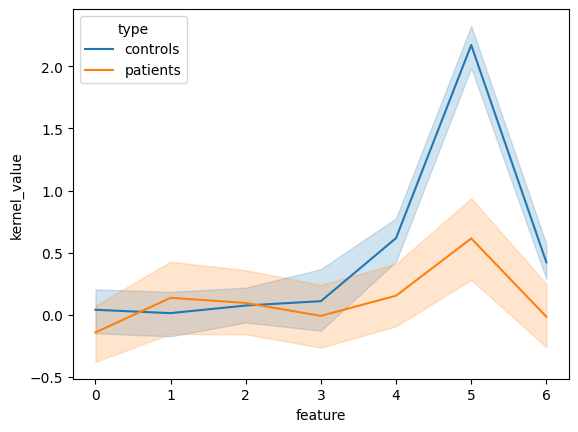

In [22]:
ci_kernels=ClassificationImage.extract_kernels(revcor_data, group_ids=['subject','session','type'],
                                    trial_id='trial', stim_id='stim_order', response_id='response',feature_id='segment', value_id='pitch')
sns.lineplot(data=ci_kernels, x="feature", y='kernel_value', hue='type')

#### Double pass noise

<AxesSubplot: xlabel='type', ylabel='internal_noise'>

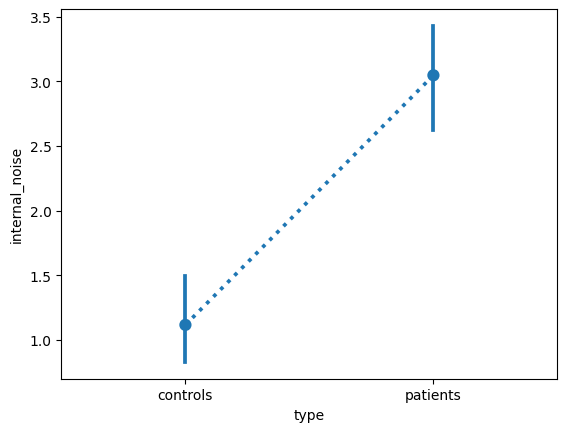

In [23]:
dp_noise = DoublePass.extract_internal_noise(revcor_data, group_ids=['subject','session','type'], 
                                    trial_id='trial', stim_id="stim_order", feature_id='segment', value_id='pitch',response_id='response', 
                                    agreement_model_file='agreement_model_large.csv',
                                    glm_model_file='glm_model.pkl',
                                    kernel_extractor=ClassificationImage)
sns.pointplot(data=dp_noise, x='type',y='internal_noise', linestyles=':')


### GLM measures differentiate patients and controls 

#### GLM kernels

<AxesSubplot: xlabel='feature', ylabel='kernel_value'>

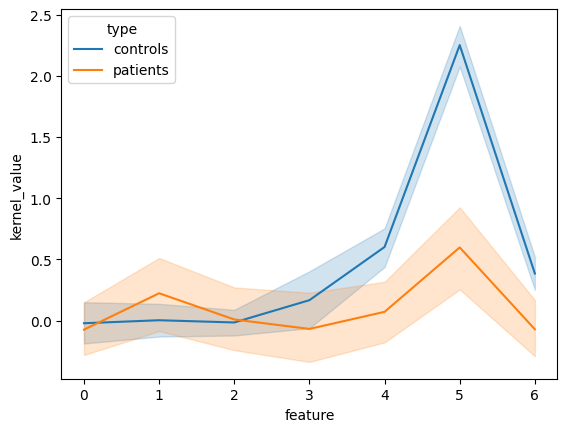

In [24]:
glm_kernels=GLMKernel.extract_kernels(revcor_data, group_ids=['subject','session','type'],
                                    trial_id='trial', stim_id='stim_order', response_id='response',feature_id='segment', value_id='pitch')
sns.lineplot(data=glm_kernels, x="feature", y='kernel_value', hue='type')

In [25]:
# GLMMethod.build_model(glm_model_file='glm_model.pkl')
# model_df = AgreementMethod.build_model(agreement_model_file = 'agreement_model_large.csv', 
#                                        internal_noise_range=np.arange(0,5,.1),
#                                         criteria_range=np.arange(-5,5,1), 
#                             # n_repeated_trials=10000, n_runs=5)
#                             n_repeated_trials=100, n_runs=1)

#### GLM noise

<AxesSubplot: xlabel='type', ylabel='internal_noise'>

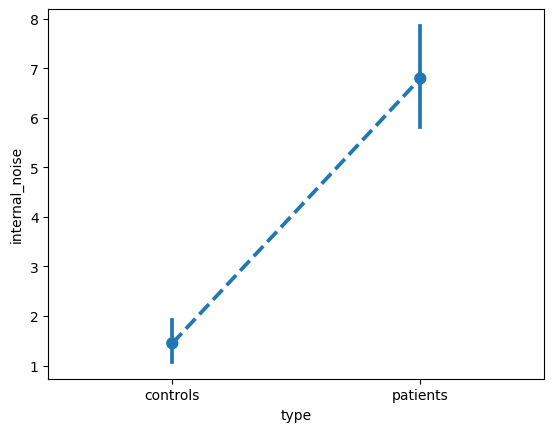

In [26]:
glm_noise = GLMMethod.extract_internal_noise(revcor_data, group_ids=['subject','session','type'], 
                                    trial_id='trial', stim_id="stim_order", response_id='response',feature_id='segment', value_id='pitch', 
                                    #agreement_model_file='agreement_model_large.csv'
                                    glm_model_file='glm_model.pkl'
                                    #, kernel_extractor=GLMKernel
)           
sns.pointplot(data=glm_noise, x='type',y='internal_noise', linestyles='--')

### HMM measures differentiate patients and controls 

In [27]:
best_priors = {
    'mean_value_1': 0.91,
    'mean_value_2': 2.43,
    'sigma_value_1': 3.79,
    'sigma_value_2': 2.43,
    'alpha_value': 1.82
}
# kernel, posterior_probs, predicted_states,recovered_trans_mat= GLMHMMKernel.extract_single_kernel(responses_df, best_priors=best_priors)
# print("Extracted Kernel:", kernel)
# print("posterior_probs:", posterior_probs)
# print("predicted_states:", predicted_states)
# print("recovered_trans_mat:", recovered_trans_mat)

#### GLMHMM Kernels

In [28]:
hmm_kernels=GLMHMMKernel.extract_kernels(revcor_data, group_ids=['subject','session','type'],
                                    trial_id='trial', stim_id='stim_order', response_id='response',feature_id='segment', value_id='pitch',
                                    best_priors=best_priors)


  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

<AxesSubplot: xlabel='feature', ylabel='kernel_value'>

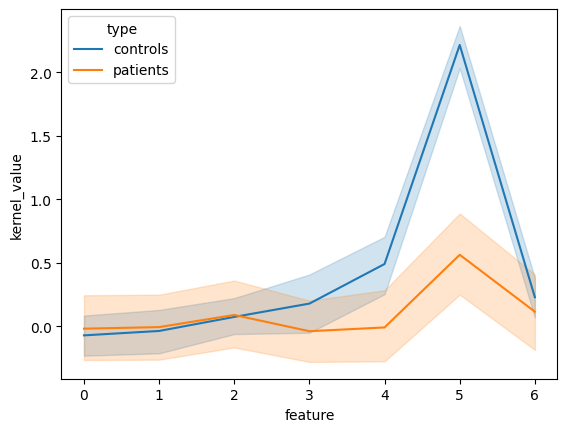

In [29]:
sns.lineplot(data=hmm_kernels, x="feature", y='kernel_value', hue='type')

#### GLMHMM noise

In [30]:
hmm_noise = GLMHMMMethod.extract_internal_noise(revcor_data, group_ids=['subject','session','type'], 
                                    trial_id='trial', stim_id='stim_order', response_id='response',feature_id='segment', value_id='pitch',
                                    internal_noise_extractor=GLMMethod, glm_model_file='glm_model.pkl', best_priors=best_priors)

  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 124
0.60893659738038


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 104
0.773682324858073


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 75
2.215194943609227


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 118
0.9098498587595061


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 136
0.758843913396539


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 114
1.7626175120167684


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 89
1.9191080856547809


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 97
0.6370580254432892


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 128
1.6597173711668864


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 146
0.6614328376935132


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 143
0.6536197334235514


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 67
1.2843285385828755


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 40
1.430004099633646


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 123
2.4409074885887367


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 146
0.8566294780203607


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 149
0.5974575640803877


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 149
0.7413766017692364


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 81
3.901310942890132


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 119
0.8407775178983007


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 96
1.1312731055719476


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 138
0.6918379364038095


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 129
1.2291591445090466


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 146
0.7384055894179681


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 147
0.7348215142057242


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 146
0.6590813285870392


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 141
0.7178647110801255


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 139
1.1799513941391537


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 138
0.8576377462416241


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 142
0.7354393633122077


  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 79
3.980874031173041


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 31
2.5907300437809244


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 119
0.6455336556874316


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 115
1.0702211920700595


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 145
2.3167357348856603


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 54
2.98969905444379


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 26
Error fitting GLM: Perfect separation detected, results not available
    trial  diff_pitch0  diff_pitch1  diff_pitch2  diff_pitch3  diff_pitch4  \
0       3  -178.263242   184.601348   -18.099514    -0.248142     7.058780   
1       4    -7.670582   -35.452252    56.487635   230.878905  -122.581051   
2       5    19.437153    57.564790   111.136094   -60.330992    16.657880   
3      10    34.964908     7.544764  -182.904394   -65.691489    51.098188   
4      11   -12.136380   -42.108535  -192.511262  -237.758148    58.947053   
5      16   169.939118   122.557990   -62.639327   -46.383759    94.305538   
6      17     0.261011  -157.706688  -201.754980   -39.173508    83.360558   
7      44   -28.431559  -239.659046   167.889615   -30.717275    82.108627   
8      45     6.094688  -125.479790  -130.378383   -95.196973   -17.410927   
9      46   -41.141782  -119.833161   146.361786    -1.859360   -56.367256   
10     47    68.161786     3.444173  -101.225562    2

  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 62
2.4592958075052582


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 102
0.9133226935689462


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 31
1.2790844671284742


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 145
4.762762941243823


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 136
4.533901901694636


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 36
1.7413716828277046


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 34
0.9276663735027391


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 43
2.2584218965415728


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 21
2.767181980452138


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 38
1.891388801132416


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 23
1.7508093745219617


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 38
1.358780325512993


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 25
1.415754183867811


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 62
1.266270374729963


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 97
3.6656760448338357


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 138
2.1717254521265104


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 17
Error fitting GLM: Perfect separation detected, results not available
    trial  diff_pitch0  diff_pitch1  diff_pitch2  diff_pitch3  diff_pitch4  \
0      79  -183.081780   -89.440231   -27.071406   -36.540331    -7.175641   
1      80     3.064904    32.239535  -120.984269  -154.940188   -95.745568   
2      81   112.041392   232.180990   -82.319269   -74.727980   -46.497095   
3      82   117.781758    34.689167    57.054766   -52.031125   130.026704   
4      83   205.596962   -31.204470  -163.739619    52.909000    26.046715   
5      84    57.885479    89.450492   -71.789705  -215.241418  -174.804114   
6      85    54.472221   -31.963887   164.759365    40.088698   -19.706381   
7      86   208.269024     2.899497    33.631772   230.373388   -56.480735   
8      87   -62.657861  -155.234911   -21.684867  -165.261831   168.652733   
9      88   -39.372077    76.195556    56.241763    39.413443   174.119115   
10     89   -96.864989    85.913114  -123.670954   -2

  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 49
1.466490436748858


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 44
2.1107141167781767


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 43
1.3082630042831827


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 49
4.3818103649258004


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 56
1.2249536163955284


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 32
3.8813992043642287


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 42
0.8280400215458075


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 36
1.0666608164943987


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 104
7.072584820391667


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 30
1.5302973656769172


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 57
1.8543131927560172


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 31
3.8232224824366763


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 26
2.742205500578923


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 48
1.4147835967309788


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 37
1.21094640491784


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 129
5.478502319754529


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 82
1.5306094887371027


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 52
1.8202183767612674


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 47
0.8428555057311532


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 134
7.238068230838735


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 9
Error fitting GLM: Perfect separation detected, results not available
   trial  diff_pitch0  diff_pitch1  diff_pitch2  diff_pitch3  diff_pitch4  \
0      8  -180.336243  -148.419041    28.016238   -17.113704    76.648706   
1     21   -50.426657    10.533385   -71.352844    30.096830   254.658625   
2     33   -73.267374    85.346261   -77.286522    20.977077    54.109986   
3     39   234.859992    51.636200   139.253077  -124.165325    82.332074   
4     45   -50.188738   -63.280090  -146.753328    82.485569   -26.849954   
5     50   112.995053  -146.133402    18.411348  -136.552915   130.235260   
6     73    32.125374   -47.623281    72.970779  -208.772642    -3.889430   
7     85  -109.855040    55.472875   -63.584511    -0.034353    -1.563858   
8    112   -39.563723    76.116115   173.387955   128.258684    97.708545   

   diff_pitch5  diff_pitch6  response  trial_intensity  
0   -16.694064    41.554701         1       508.782697  
1   153.985911   124.871072

  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 120
11.869533536450216


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 51
1.65242383479631


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 28
2.6503123314321857


<AxesSubplot: xlabel='type', ylabel='internal_noise'>

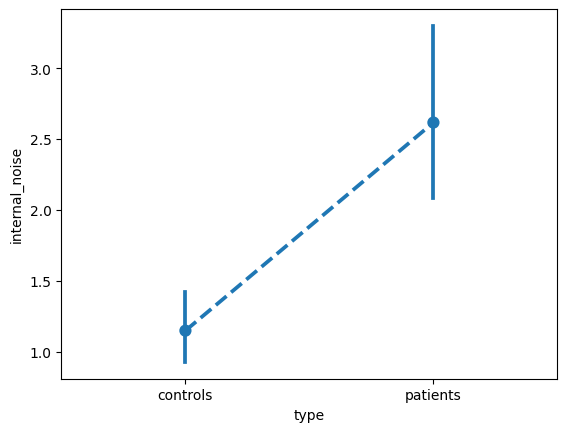

In [31]:
sns.pointplot(data=hmm_noise, x='type',y='internal_noise', linestyles='--')

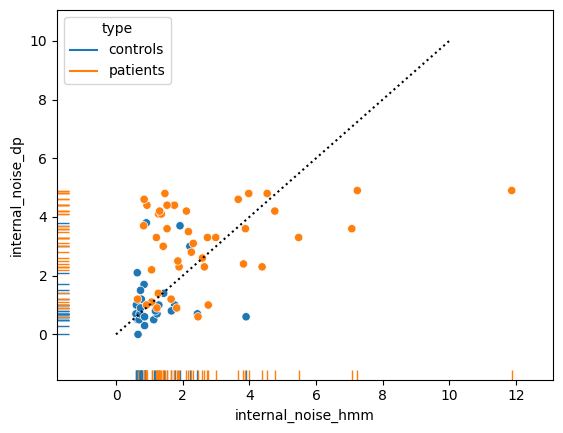

In [32]:
data=hmm_noise.merge(dp_noise, on=['subject','session','type'], suffixes=('_hmm','_dp')).reset_index()
sns.scatterplot(data=data, x="internal_noise_hmm", y="internal_noise_dp", hue='type')
sns.rugplot(data=data, x="internal_noise_hmm", y="internal_noise_dp", hue='type')
plt.plot([0,10],[0,10],'k:')

<AxesSubplot: xlabel='type', ylabel='internal_noise'>

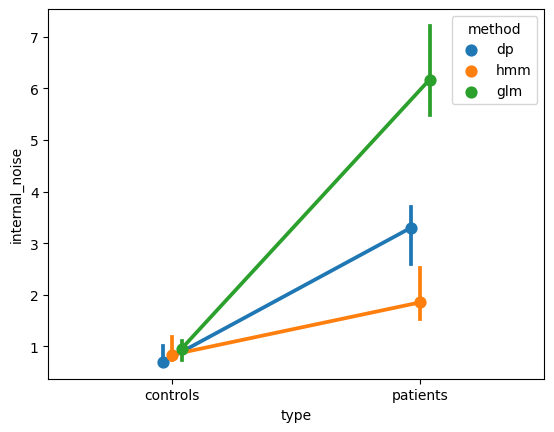

In [33]:
dp_noise['method']='dp'
hmm_noise['method']='hmm'
glm_noise['method']='glm'

noises  = pd.concat([dp_noise, hmm_noise, glm_noise])
sns.pointplot(data=noises, x='type', y='internal_noise', hue='method', dodge=True, estimator=np.nanmedian)

#### Transition matrix

In [34]:
transition_matrices_df = GLMHMMKernel.extract_transition_matrices(revcor_data,group_ids=['subject', 'session','type'],
                                    trial_id='trial',stim_id='stim_order', response_id='response',feature_id='segment', value_id='pitch',
                                    best_priors=best_priors)

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

<AxesSubplot: xlabel='type', ylabel='per'>

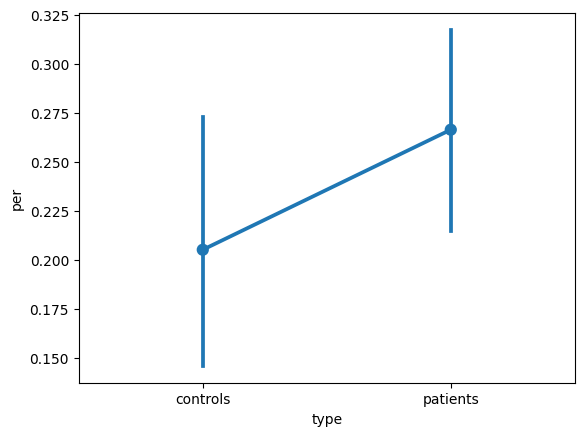

In [35]:
sns.pointplot(data=transition_matrices_df, x='type', y='per')

<AxesSubplot: xlabel='type', ylabel='Probability'>

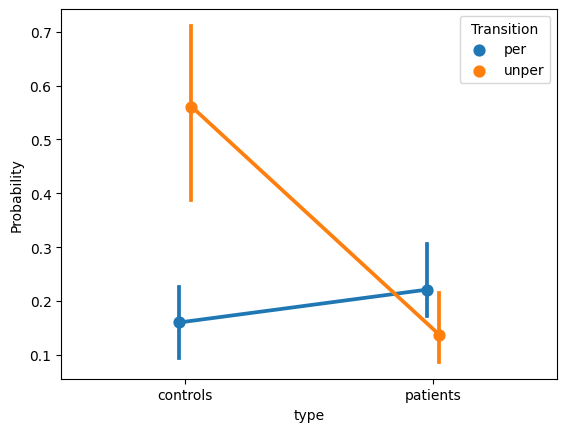

In [36]:
trans_mat = transition_matrices_df.melt(id_vars=['subject','session','type'], value_vars=['per', 'unper'], 
                    var_name='Transition', value_name='Probability')

sns.pointplot(data=trans_mat, x='type', y='Probability', hue='Transition', 
              dodge=True ,estimator=np.nanmedian)

In [44]:
ci_kernels['kernel'] = 'ci'
glm_kernels['kernel'] = 'glm'
hmm_kernels['kernel'] = 'hmm'
kernels = pd.concat([ci_kernels, glm_kernels, hmm_kernels], ignore_index=True)
kernels

,subject,session,type,feature,kernel_value,kernel
0,0,1,controls,0,0.021588,ci
1,0,1,controls,1,0.170469,ci
2,0,1,controls,2,-0.381605,ci
3,0,1,controls,3,-0.543959,ci
4,0,1,controls,4,0.367073,ci
...,...,...,...,...,...,...
1633,43,4,patients,2,-0.896947,hmm
1634,43,4,patients,3,-0.015078,hmm
1635,43,4,patients,4,1.281718,hmm
1636,43,4,patients,5,-0.188471,hmm


In [ ]:
kernels_unexploded = (
    kernels.groupby(["subject", "session", "type", "kernel"])
    .agg({"kernel_value": list})
    .reset_index()
    .pivot(index=["subject", "session", "type"], columns="kernel", values="kernel_value")
    .reset_index()
)
kernels_unexploded.columns.name = None  
kernels_unexploded = kernels_unexploded.rename(
    columns={"hmm": "kernel_hmm_values", "glm": "kernel_glm_values", "ci": "kernel_ci_values"}
)
kernels_unexploded

,subject,session,type,kernel_ci_values,kernel_glm_values,kernel_hmm_values
0,0,1,controls,"[0.02158835646258444, 0.17046864635815637, -0....","[-0.10775430745353104, 0.1913803120784971, -0....","[-0.30178998160193804, 0.09142075869123255, -0..."
1,1,1,controls,"[0.7389727897436488, -0.030285332083586844, -0...","[0.7513181869686766, -0.06272488736625358, -0....","[0.08732638112698023, -0.574033776931692, 0.07..."
2,2,1,controls,"[-0.696133060353448, -0.051624419472822196, 0....","[-0.8178317566070564, -0.05080555734704332, 0....","[0.24873603311364456, -0.3522125925616252, 1.0..."
3,3,1,controls,"[0.6311959234229492, 1.1664141218917088, 0.851...","[0.31185016905347185, 0.8551185446747136, 0.43...","[0.32632638854307777, 1.1069823623845159, 0.04..."
4,4,1,controls,"[0.282835964780659, 0.15628903058890528, -0.26...","[0.02673278097734961, -0.04649031405657823, -0...","[0.03268818904939259, 0.24200070176772104, -0...."
...,...,...,...,...,...,...
73,42,4,patients,"[0.14084100003892322, -1.4752927202282917, -0....","[-0.19647876599524702, -1.643815442939591, -0....","[0.2791834751026134, -1.1306518192367945, -0.5..."
74,43,1,patients,"[-0.3022181026980606, -0.224779878987395, -0.8...","[-0.7305109994555741, -0.027570874578785428, -...","[-0.06036088014615951, -0.5383405762865964, -0..."
75,43,2,patients,"[-0.26532382956766515, 0.8496437009471441, 0.4...","[-0.11157822714165455, 0.9973020254662727, 0.0...","[1.20825260893803, -0.7981764626764757, 0.0343..."
76,43,3,patients,"[0.13487464236501093, 1.0774027407933817, 0.87...","[0.3074421203345174, 1.270153936775806, 1.1842...","[1.3048967659825148, 0.0492664514187528, -0.13..."


In [38]:
control_kernels = kernels[kernels['type']=='controls'].groupby('feature')['kernel_value'].mean().reset_index()
# match each patient kernel, at each segment, with the corresponding gain in the control kernel 
distances = pd.merge(kernels,control_kernels, on=["feature"])
#compute squared difference between patient and control kernel gains at each segment
distances["kernel_distance"] = (distances["kernel_value_x"] - distances["kernel_value_y"])**2
# and average over segments, for each patient
distances = distances.groupby(['type','subject','session','kernel'])['kernel_distance'].mean().reset_index()
# and rescale as a similarity value
distances['kernel_typicality'] = ( distances.kernel_distance - distances.kernel_distance.max() ) / ( distances.kernel_distance.min() - distances.kernel_distance.max())
distances  

,type,subject,session,kernel,kernel_distance,kernel_typicality
0,controls,0,1,ci,0.158300,0.956869
1,controls,0,1,glm,0.134052,0.964552
2,controls,0,1,hmm,0.219590,0.937447
3,controls,1,1,ci,0.264661,0.923165
4,controls,1,1,glm,0.341276,0.898888
...,...,...,...,...,...,...
229,patients,43,3,glm,1.610699,0.496639
230,patients,43,3,hmm,1.925922,0.396752
231,patients,43,4,ci,1.616427,0.494824
232,patients,43,4,glm,1.719137,0.462278


In [42]:
# # Define a single group to inspect inputs and responses
# subject = 40
# session = 1

# # Filter the data for the specific subject and session
# group_data = revcor_data[(revcor_data['subject'] == subject) & (revcor_data['session'] == session)]

# # Process inputs and responses
# inputs_array_no_noise, responses_no_noise_array = GLMHMMKernel._preprocess_inputs_and_responses(
#     group_data, trial_id='trial', stim_id='stim_order', 
#     feature_id='segment', value_id='pitch', response_id='response'
# )

# print("\nCombined Inputs Array (Stimulus Differences + Choice History):")
# print(inputs_array_no_noise[:11])

# print("\nResponses Array:")
# print(responses_no_noise_array[:11].flatten())



In [202]:
posterior_states_results = []

grouped = revcor_data.groupby(['subject', 'session', 'type'])

for group_values, group_data in grouped:
    group_key = dict(zip(['subject', 'session', 'type'], group_values))  # Group identifiers

    # Preprocess inputs and responses
    inputs, responses = GLMHMMKernel._preprocess_inputs_and_responses(
        group_data, trial_id='trial', stim_id='stim_order', 
        feature_id='segment', value_id='pitch', response_id='response'
    )

    # Debugging: Print raw and processed responses
    print(f"Group: {group_key}")
    print("Raw responses:")
    print(group_data['response'].values)
    print("Processed responses:")
    print(responses.flatten())

    # Extract posterior probabilities and predicted states
    _, posterior_probs, predicted_states, _ = GLMHMMKernel.extract_single_kernel(
        data_df=group_data,
        trial_id='trial',
        stim_id='stim_order',
        feature_id='segment',
        value_id='pitch',
        response_id='response',
        return_probs=True
    )

    engaged_trials = (predicted_states == 1).sum()  

    result = {
        **group_key,
        'responses': responses.flatten(),  
        'posterior_probs': posterior_probs,
        'predicted_states': predicted_states,
        'engaged_trials': engaged_trials
    }
    posterior_states_results.append(result)

posterior_states_df = pd.DataFrame(posterior_states_results)


Group: {'subject': 0, 'session': 1, 'type': 'controls'}
Raw responses:
[False False False ... False False False]
Processed responses:
[1 1 1 0 1 0 1 0 1 0 1 1 0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0 1 1 1 1 0 1 1 1
 0 0 1 1 1 1 1 1 1 1 0 1 0 1 1 1 0 0 1 1 1 0 0 0 1 1 1 1 1 0 1 1 0 1 1 1 1
 1 1 1 1 0 0 1 0 0 0 1 1 0 1 0 0 0 1 0 0 1 0 1 1 1 1 1 1 1 0 0 0 1 1 0 1 1
 1 0 1 1 1 0 0 0 0 1 0 0 1 1 1 1 1 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0
 1 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 1, 'session': 1, 'type': 'controls'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 0 1 0 0 1 0 0 1 0 0 0 0 1 0 1 1 0 1 0 0 1 1 1 0 0 1 0
 0 1 0 1 1 1 0 1 1 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 1 0 0 0 0 1 1
 1 1 0 1 0 0 1 0 1 1 0 0 0 0 0 0 1 1 0 0 1 1 0 0 1 1 1 0 0 0 1 1 1 0 0 1 0
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 2, 'session': 1, 'type': 'controls'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 0 1 1 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 1 1 1 1 1 0 0 0 0 0 0 0 1 1 0 1 0 1 1 1 1 1 1 1 1 0 0 0 0 0 1 1 1 0 0
 0 0 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 0 0 1 1 1 1 1 0 0 0 1 1 0 0 1
 0 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 1 1 1 1 1 1 1 1 1 0 1 0 0 0
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 3, 'session': 1, 'type': 'controls'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 1 0 1 0 0 1 1 0 0 1 1 1 0 1 1 1 1 0 0 0 1 1 0 1 1 0 0 1 1 0 1 0 0 1 0 0
 1 1 0 0 0 0 1 1 0 0 0 0 1 1 0 0 1 0 0 1 0 1 0 0 1 1 1 0 0 0 1 1 0 1 0 0 0
 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 1 1 1 0 1 0 1 1 1 1 0 0 1 0 0 1 1 1 1 1 1
 1 1 0 1 0 0 0 1 1 1 0 0 0 1 0 0 1 0 0 1 0 1 0 0 0 1 1 1 0 1 0 1 0 0 0 1 1
 0 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 4, 'session': 1, 'type': 'controls'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 0 0 0 0 0 1 1 0 1 1 1 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 1 1 1 0 1 1 0 0 0 1
 1 1 1 1 1 0 0 0 0 1 1 1 0 0 0 0 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0
 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 1 1 1 1 1 0 0 1 1 1 1 0 1 1 1 1
 1 1 1 0 1 1 1 0 1 1 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 0 0 1 1
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 5, 'session': 1, 'type': 'controls'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 1 0 1 0 0 1 0 1 1 1 0 0 1 0 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1
 1 1 0 1 0 0 0 0 0 0 0 0 1 1 0 0 1 1 1 1 0 1 1 0 1 1 0 0 0 1 1 1 1 0 0 0 0
 1 0 0 0 1 0 0 1 0 1 0 0 0 1 0 1 1 1 0 1 1 1 0 0 1 0 1 0 0 1 1 0 1 1 0 0 0
 1 1 1 0 0 1 0 0 1 0 0 1 0 1 0 1 0 1 0 0 1 0 0 0 0 1 1 1 1 1 0 0 1 1 1 0 0
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 6, 'session': 1, 'type': 'controls'}
Raw responses:
[ True  True  True ... False False False]
Processed responses:
[0 0 1 1 0 0 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 1 0 0 0 0 0 1 0 1 0 1 0 1 0 0 1 0 1 1 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 1
 0 1 1 1 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 1 0 1 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0
 0 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 7, 'session': 1, 'type': 'controls'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 0 1 0 1 0 0 0 1 1 1 1 1 1 1 1 1 1 0 1 0 1 0 0 0 1 0 0 1 1 0 1 0 1 1 0 1
 0 0 0 1 0 0 0 1 1 0 0 1 0 0 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 0 1 1 1 1 1 0
 0 1 1 1 1 0 1 0 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1
 0 1 1 1 1 1 0 1 1 0 1 1 0 0 1 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 8, 'session': 1, 'type': 'controls'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 1 1 1 1 0 0 0 0 0 0 0 1 1 0 1 0 0 1 1 1 1 0 0 1 1 0 1 0 0 0 0 0 0 1 0 1
 1 1 1 0 0 1 0 0 0 1 0 1 0 0 1 0 0 0 1 0 1 0 0 0 1 1 1 1 0 1 0 0 0 0 0 0 0
 1 0 0 1 1 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 1 0 1 1 1 0 1 1 0 0 0 0 1 0 0 0
 1 1 1 1 0 1 1 0 0 1 1 0 0 1 0 1 0 1 1 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 9, 'session': 1, 'type': 'controls'}
Raw responses:
[ True  True  True ... False False False]
Processed responses:
[0 0 0 1 0 1 0 0 1 0 1 0 0 0 1 1 0 0 1 1 0 0 1 0 1 0 0 0 0 1 1 0 1 0 0 0 0
 1 0 1 0 1 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 1 1 0 1 0 0 1 1 1 1 1 0 0 0 1 1
 1 1 1 1 1 1 1 1 0 1 1 0 1 0 0 0 0 0 0 1 1 1 0 1 1 0 1 1 0 1 0 0 1 0 1 1 0
 1 0 0 1 1 1 1 1 0 0 0 1 1 1 1 1 0 1 1 1 1 0 1 1 0 1 1 0 0 0 0 1 1 1 0 1 1
 1 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 10, 'session': 1, 'type': 'controls'}
Raw responses:
[ True  True  True ... False False False]
Processed responses:
[0 0 1 1 1 0 1 0 1 0 1 0 1 0 0 1 0 1 1 0 0 1 1 0 1 0 0 1 1 1 0 0 0 0 0 0 1
 0 1 1 0 0 0 1 0 1 1 0 0 1 1 0 1 0 0 1 0 1 1 0 1 0 0 0 1 1 0 1 1 1 1 1 0 0
 1 0 1 0 1 0 0 1 0 0 0 0 1 1 1 0 1 1 0 0 0 1 0 1 0 0 1 1 1 0 1 1 0 1 0 0 1
 0 0 0 0 1 1 0 1 1 1 0 0 0 1 0 1 1 1 0 0 1 1 1 0 0 1 1 1 0 1 1 1 0 0 1 0 1
 1 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 11, 'session': 1, 'type': 'controls'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 1 0 0 0 1 0 1 0 0 1 1 1 1 1 1 0 0 1 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1
 1 1 0 1 0 1 1 1 0 1 1 1 1 0 1 0 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0
 0 0 0 0 0 0 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1 0 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 12, 'session': 1, 'type': 'controls'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 1 1 1 1 0 0 1 0 1 1 0 0 1 1 1 0 1 0 1 1 1 1 0 1 0 1 0 0 1 0 0 1 1 1 1 1
 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1
 1 1 1 1 1 0 1 0 1 0 1 1 1 1 1 1 1 1 1 0 0 0 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 0 1 0 1 1
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 13, 'session': 1, 'type': 'controls'}
Raw responses:
[False False False ... False False False]
Processed responses:
[1 1 1 0 1 1 0 1 0 0 1 0 0 1 1 0 1 0 1 0 0 1 1 1 1 1 1 1 0 0 1 1 0 1 1 1 1
 1 1 0 1 1 0 0 1 1 0 0 0 1 1 1 0 0 0 1 1 1 0 1 1 1 1 1 1 0 0 0 1 1 1 0 1 0
 0 1 1 0 1 1 1 1 0 1 0 1 0 1 1 0 1 0 1 1 1 1 1 0 0 0 0 1 0 1 0 1 1 1 0 1 0
 0 1 0 1 0 0 0 1 1 1 0 0 0 0 0 1 0 1 1 1 1 0 1 1 1 0 1 1 1 1 0 1 1 1 1 1 0
 1 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 14, 'session': 1, 'type': 'controls'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 1 1 1 1 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 1 1 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0
 1 0 0 1 1 0 1 1 0 0 1 0 0 1 1 1 0 0 1 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 1 1 0
 0 1 1 0 0 0 1 0 1 0 0 1 1 0 0 0 0 0 1 0 0 0 0 1 0 1 1 1 1 0 0 1 0 0 0 1 0
 1 0 0 1 0 0 1 0 1 0 0 1 0 0 1 1 0 1 0 1 0 1 0 0 1 1 1 0 0 0 0 0 1 0 0 0 1
 0 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 15, 'session': 1, 'type': 'controls'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 1 0 1 1 1 1 1 0 0 0 0 1 1 1 0 0 1 1 1 0 0 0 0 1 1 0 1 0 0 0 0 0 1 0 1 1
 0 0 1 0 0 0 1 0 1 0 0 0 1 0 0 0 1 1 0 1 1 0 1 1 0 1 1 0 0 1 0 0 1 1 0 0 1
 0 0 0 0 1 1 1 1 0 1 0 1 1 1 0 1 1 1 1 0 1 0 1 0 1 0 1 1 1 0 1 0 1 1 1 0 1
 1 0 0 0 1 1 1 0 1 0 1 0 1 0 1 1 0 0 1 0 1 1 0 1 0 1 1 0 1 1 1 1 0 0 1 0 1
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 15, 'session': 2, 'type': 'controls'}
Raw responses:
[ True  True  True ... False False False]
Processed responses:
[0 1 1 0 1 1 0 1 0 1 0 0 1 0 1 0 1 1 0 0 1 1 1 1 0 1 0 1 1 1 1 1 1 1 0 1 0
 1 1 0 0 1 0 1 0 0 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 1 0 1 0 0 1 1 1 0 0 1 0 1
 1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 0 0 1 0 0 0 1 1 1 1 0 0 0 1 1 1 0 0 1 0 1 1
 1 1 1 0 0 1 0 0 0 1 1 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1 0 1 1 0 1 1 1 1 0 0
 0 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 16, 'session': 1, 'type': 'controls'}
Raw responses:
[ True  True  True ... False False False]
Processed responses:
[0 0 1 0 0 0 0 0 1 0 1 1 0 1 1 0 1 1 0 0 1 0 0 1 0 1 0 0 1 1 0 1 1 1 1 0 0
 1 1 1 0 1 0 1 1 1 0 1 1 1 0 0 1 1 1 0 0 1 1 0 1 0 1 0 0 1 0 1 0 1 1 0 0 1
 0 0 1 1 0 0 0 1 1 1 0 1 0 0 0 0 1 0 1 0 1 0 0 1 0 1 1 0 0 1 0 1 1 1 1 0 1
 0 1 0 0 1 0 1 0 1 0 0 0 0 0 1 1 0 1 0 1 1 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 1
 0 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 16, 'session': 2, 'type': 'controls'}
Raw responses:
[ True  True  True ... False False False]
Processed responses:
[0 0 0 0 1 0 1 0 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 1 1
 1 1 0 1 0 1 0 1 1 1 1 1 1 0 0 0 1 0 1 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0 0
 1 1 0 0 1 0 1 1 1 1 0 0 1 0 0 0 1 1 1 0 0 0 1 1 1 1 0 1 1 1 1 1 0 1 1 1 0
 1 1 1 0 0 0 1 0 0 0 1 1 1 0 0 0 1 0 1 1 0 1 0 1 1 0 0 1 0 1 1 0 1 0 1 1 1
 1 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 17, 'session': 1, 'type': 'controls'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 1 0 1 0 1 1 1 1 1 0 0 1 0 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1
 0 0 0 0 0 1 1 0 1 0 0 1 0 1 0 1 1 0 0 0 0 0 0 1 0 1 0 1 1 0 1 1 0 1 1 0 1
 1 1 1 1 1 1 0 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 1 0 0 0 1 1 0 1 0 1 1 0 0 1 1
 1 0 1 1 1 1 1 1 0 0 1 1 1 0 1 1 0 0 0 1 0 0 0 0 1 0 0 0 1 1 1 1 0 1 1 0 1
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 17, 'session': 2, 'type': 'controls'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 1 1 1 1 0 0 1 1 1 1 0 1 1 1 0 1 0 0 0 1 0 1 0 1 0 0 0 1 1 1 1 0 0 0 0 1
 1 0 0 0 1 1 1 0 1 1 0 1 0 1 1 0 1 0 1 1 1 0 0 0 1 0 1 0 0 1 0 1 0 0 1 0 1
 1 0 0 0 1 1 0 0 1 1 1 0 1 1 0 1 0 0 1 0 1 0 1 0 1 0 0 1 1 0 1 0 1 1 0 1 0
 0 1 1 1 0 0 1 0 1 1 1 1 1 0 0 0 0 0 1 0 1 1 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0
 0 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 18, 'session': 1, 'type': 'controls'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 1 1 1 1 1 1 1 0 1 1 0 1 0 1 0 1 1 1 1 0 0 1 1 1 1 0 1 1 1 1 1 1 0 0 1 1
 1 0 0 0 0 1 1 0 1 1 0 1 1 1 0 1 1 0 0 1 1 1 0 1 1 0 1 1 1 0 1 1 1 0 1 1 1
 1 1 1 0 0 0 0 1 0 0 1 1 1 1 1 0 1 0 0 1 1 1 1 1 0 0 1 1 0 0 1 1 0 0 0 1 1
 1 1 1 0 1 1 0 1 1 1 1 1 1 0 1 1 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 1 0
 0 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 18, 'session': 2, 'type': 'controls'}
Raw responses:
[ True  True  True ... False False False]
Processed responses:
[0 1 0 0 1 0 1 0 0 1 0 0 0 0 1 0 1 1 1 0 1 1 1 1 0 0 1 0 1 1 0 0 1 0 1 0 0
 1 1 0 1 0 1 0 0 1 0 1 1 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 1 1 1 0 0 1 0 1 0 0
 0 1 1 0 0 0 0 1 1 1 1 1 0 0 1 1 1 0 0 1 1 0 1 1 1 1 1 0 0 0 0 1 1 1 1 1 1
 0 0 1 1 1 0 0 1 1 1 1 1 1 0 1 1 1 0 0 1 1 1 1 0 1 1 0 1 1 0 0 0 1 0 0 0 1
 0 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 19, 'session': 1, 'type': 'controls'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 1 1 0 0 1 1 0 1 0 0 1 1 0 1 0
 0 0 0 0 0 1 1 0 1 1 1 0 0 1 1 0 1 1 1 0 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0
 0 0 0 0 0 0 0 1 1 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 1 0 0 0 1 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 19, 'session': 2, 'type': 'controls'}
Raw responses:
[ True  True  True ... False False False]
Processed responses:
[0 1 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1 0 0 0 0 1 0 1 1 0 1 0 1 0 0 0 0 1 0
 0 0 1 0 1 0 1 0 0 0 1 0 0 1 1 0 0 1 0 1 0 0 0 0 1 0 0 0 1 0 0 1 1 0 1 1 0
 0 0 0 0 1 0 0 1 1 0 0 1 0 1 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 1
 0 1 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0
 0 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 20, 'session': 1, 'type': 'controls'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 0 0 0 1 1 1 1 1 0 1 1 1 0 1 1 0 1 1 1 0 1 1 1 0 1 0 1 0 0 0 1 0 1 1 1 0
 1 0 1 0 0 0 0 1 1 0 0 0 1 0 0 1 1 1 1 1 0 1 0 0 1 1 1 0 0 0 0 0 1 0 0 1 1
 1 0 1 0 1 0 0 1 0 1 1 0 0 0 1 0 1 1 1 1 1 0 0 0 1 0 1 1 0 0 0 0 0 1 1 1 0
 0 0 1 1 1 1 1 1 1 0 0 0 1 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 1 1 0
 0 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 20, 'session': 2, 'type': 'controls'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 1 0 1 0 0 1 0 1 1 1 1 0 0 1 1 1 0 0 0 1 1 1 1 1 0 0 1 1 1 0 1 1 1 0 0 0
 1 1 0 1 1 0 0 0 1 1 1 1 0 0 0 0 1 0 0 1 1 1 1 0 0 0 1 1 0 0 1 0 1 0 0 1 1
 0 1 0 0 1 0 1 1 1 0 1 0 1 0 0 0 1 0 1 0 0 1 1 0 1 0 0 0 1 0 1 0 0 0 1 0 0
 1 0 1 0 1 0 1 1 0 1 1 0 1 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 1 0 1 0 0 1 1 0 1
 0 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 21, 'session': 1, 'type': 'controls'}
Raw responses:
[False False False ... False False False]
Processed responses:
[1 1 1 1 1 1 1 1 0 0 0 1 1 0 1 1 1 0 1 0 0 0 1 1 1 0 1 1 0 0 0 1 1 0 1 1 1
 1 0 1 0 0 1 0 0 1 1 0 1 1 1 0 1 0 1 0 1 0 1 0 0 0 0 1 0 0 0 1 1 1 1 0 0 0
 0 1 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 1 1 1 1 0 1 0 0 1 1 0 0 0 0 0 1 1 0 0 0
 1 0 0 0 0 1 1 1 1 1 1 0 0 1 0 1 0 0 1 0 1 1 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0
 0 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 21, 'session': 2, 'type': 'controls'}
Raw responses:
[False False False ... False False False]
Processed responses:
[1 1 1 0 1 1 0 0 0 1 0 1 0 0 1 1 1 0 1 0 0 1 1 1 1 0 0 1 0 0 1 0 1 0 1 1 1
 1 0 1 0 1 1 0 0 1 1 0 1 0 1 0 1 0 1 0 1 1 1 0 0 1 0 1 0 0 1 1 1 0 1 0 0 0
 0 1 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 1 1 1 1 0 0 0 0 1 1 0 0 0 1 0 1 1 0 1 0
 1 0 0 0 0 1 1 1 1 0 1 0 1 1 1 1 0 0 1 0 1 1 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0
 1 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 22, 'session': 1, 'type': 'patients'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 23, 'session': 1, 'type': 'patients'}
Raw responses:
[False False False ... False False False]
Processed responses:
[1 0 1 0 0 1 0 1 0 0 0 0 1 1 0 1 1 1 1 1 0 0 1 0 1 1 1 1 1 1 1 1 0 0 0 0 0
 1 1 1 1 1 1 1 1 1 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1
 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0
 0 0 0 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 0 0 0
 0 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 24, 'session': 1, 'type': 'patients'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 1 0 0 1 0 1 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 1 1 1 0 0 0 0 0 1 0 0 0 0 1 0 0
 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 1 1 0 0 1 0 0 0 1 1 0
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 25, 'session': 1, 'type': 'patients'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 1 0 1 1 0 1 0 1 1 1 0 1 0 1 0 1 1 1 0 0 1 1 0 0 1 0 1 0 1 0 0 0 0 0 1 0
 0 1 1 0 0 0 0 1 0 1 0 1 1 0 1 1 0 0 0 1 0 0 0 1 1 0 1 1 1 0 1 0 1 1 0 1 1
 1 0 1 1 0 0 0 0 1 1 1 0 1 1 1 0 1 1 0 0 0 0 0 1 0 0 0 1 1 0 0 1 1 1 0 0 1
 0 0 0 0 1 0 1 1 1 1 0 1 1 1 0 1 1 0 0 0 0 1 1 1 0 0 1 1 0 1 1 0 0 0 1 1 1
 0 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 26, 'session': 1, 'type': 'patients'}
Raw responses:
[False False False ... False False False]
Processed responses:
[1 1 0 1 0 0 0 1 0 0 0 1 0 1 0 0 1 0 1 1 0 0 0 1 1 1 0 0 1 1 0 0 1 1 0 1 1
 0 1 0 1 1 0 0 1 0 1 1 1 1 0 0 0 1 1 1 1 0 0 0 1 1 0 0 1 0 1 0 0 1 0 0 0 1
 1 0 0 0 1 1 0 0 1 0 1 0 0 1 1 1 0 1 0 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 1 1
 1 0 1 1 1 0 1 1 1 0 0 0 0 1 0 0 0 1 1 1 1 0 0 1 0 1 1 1 1 1 1 0 0 0 0 0 0
 0 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 27, 'session': 1, 'type': 'patients'}
Raw responses:
[ True  True  True ... False False False]
Processed responses:
[0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 1 1 1 0 0 1 1 1 0 0
 1 1 1 0 1 1 1 1 1 1 1 1 0 0 1 1 1 0 0 0 0 0 1 1 1 1 1 0 0 0 0 1 0 1 1 0 1
 0 1 0 0 0 1 1 1 1 0 0 0 1 0 0 1 1 1 1 0 1 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0
 1 0 1 0 0 0 0 1 0 0 1 0 0 0 1 1 1 0 0 1 0 1 1 1 0 1 1 1 1 0 1 0 0 0 1 1 0
 0 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 28, 'session': 1, 'type': 'patients'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 1 0 0 0 0 0 0 0 1 1 1 1 0 0 0 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1
 1 0 0 0 0 0 0 0 0 1 1 1 1 1 0 1 1 1 1 0 0 0 1 1 1 1 1 0 0 0 0 0 1 1 1 1 0
 0 1 1 1 0 0 0 0 1 1 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 1 1 1 1 0 0 0 1 0 0
 0 1 1 1 1 1 1 0 0 0 1 0 1 0 0 0 0 1 0 1 1 1 1 0 0 0 0 0 0 1 1 1 1 1 1 1 0
 0 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 29, 'session': 1, 'type': 'patients'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 1 1 0 0 1 1 1 1 1 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1
 0 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 0 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 0 1 1 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 0
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 30, 'session': 1, 'type': 'patients'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 1 1 1 0 1 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 0 1 1
 1 1 1 1 0 1 1 1 0 0 1 1 0 1 0 1 0 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1
 0 1 1 1 1 1 1 1 1 0 0 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 0 0 1 1 1 1 1 1
 1 1 0 0 1 1 1 0 0 1 0 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 0 1 1 1
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 31, 'session': 1, 'type': 'patients'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 1 1 0 0 1 1 0 0 1 0 1 1 1 1 0 0 1 1 0 1 0 1 1 0 1 1 1 1 1 1 1 0 1 0 1 1
 1 1 1 0 0 0 0 1 1 0 1 0 1 1 0 1 1 0 1 0 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 0 1
 1 0 0 1 1 1 1 0 1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 0 0 1 1 1 1
 1 1 1 1 1 0 0 0 1 1 1 1 0 1 0 0 1 1 1 1 1 0 0 1 0 0 1 1 1 1 1 1 1 1 1 1 1
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 32, 'session': 1, 'type': 'patients'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 0 1 1 1 1 0 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1
 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 0 0 0 0 0 1 1 1 1
 1 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 33, 'session': 1, 'type': 'patients'}
Raw responses:
[False False False ... False False False]
Processed responses:
[1 1 0 0 1 1 1 1 1 0 0 1 1 0 1 1 1 0 0 1 0 1 0 0 1 1 1 0 1 1 0 0 0 1 1 1 0
 0 1 0 1 0 0 1 0 0 0 1 1 1 1 0 1 1 0 1 1 0 1 1 0 1 1 0 1 0 1 0 1 0 1 1 1 0
 0 1 0 0 1 1 0 0 1 1 0 0 1 0 1 1 0 1 0 0 1 0 1 0 0 1 1 0 0 1 0 1 1 0 0 1 0
 0 1 1 0 0 1 1 0 0 1 0 0 1 1 0 1 1 0 1 1 0 0 1 0 1 1 0 0 1 1 0 1 0 1 1 0 0
 1 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 34, 'session': 1, 'type': 'patients'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 1 1 1 1 1 0 0 0 1 0 1 1 1 1 1 1 0 0 0 1 1 1 1 1 0 0 1 0 1 0 1 1 0 1 0 1
 1 1 0 1 0 0 1 1 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1 1 1 1 0 1 0 1 1 1 1 1
 1 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 1 0 1 0 1 0 0 0 0 1 0 1
 0 1 1 1 0 0 1 0 0 0 1 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 0
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 35, 'session': 1, 'type': 'patients'}
Raw responses:
[ True  True  True ... False False False]
Processed responses:
[0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 0
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 1 1 1 1 0 1 1 1
 1 0 0 0 1 1 0 0 1 1 0 1 0 1 1 0 1 0 1 0 0 1 1 0 1 1 0 1 0 1 0 1 0 1 0 1 0
 1 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 35, 'session': 2, 'type': 'patients'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 1 1 1 0 0 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 0 1 0 1 1 0 1 1 0 1 0 1 0 1 0 1
 1 0 1 1 1 0 1 1 0 1 1 0 1 1 0 1 1 0 1 0 1 1 0 1 1 0 1 1 1 0 1 1 0 1 1 1 0
 1 1 0 1 1 0 1 0 1 1 1 1 0 0 1 1 0 1 0 1 1 1 0 1 1 0 0 1 1 0 1 1 0 1 0 1 1
 0 1 1 0 1 1 0 1 0 1 1 0 1 0 1 1 0 1 1 0 1 0 1 1 0 1 1 0 1 1 0 1 1 0 1 0 1
 0 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 35, 'session': 3, 'type': 'patients'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 1 1 0 1 0 1 1 1 0 1 0
 1 1 0 0 1 0 1 0 1 1 0 1 0 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 0 1 0 1 1
 1 1 1 1 0 1 1 1 0 1 0 1 0 1 0 1 1 1 1 1 0 1 1 0 1 0 0 1 0 1 1 0 1 1 1 0 1
 0 1 0 1 0 0 1 0 0 1 0 1 0 0 1 1 0 1 0 1 0 1 0 0 1 1 0 0 1 1 0 1 0 1 1 0 1
 0 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 35, 'session': 4, 'type': 'patients'}
Raw responses:
[ True  True  True ... False False False]
Processed responses:
[0 0 1 1 0 1 0 1 0 1 1 0 1 1 0 0 1 1 0 1 0 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1
 0 1 1 0 1 0 1 0 0 1 0 1 1 0 1 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 1 0 1
 0 1 0 0 1 0 1 0 1 0 1 1 0 1 0 1 0 1 0 0 1 0 1 0 1 0 1 0 1 1 0 1 0 1 0 1 0
 1 0 1 0 1 1 0 1 0 1 0 1 0 0 1 1 0 0 1 0 1 1 0 1 0 1 0 1 0 1 1 0 1 0 1 0 1
 0 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 36, 'session': 1, 'type': 'patients'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 0 0 0 0 1 0 1 0 0 0 0 0 1 1 1 0 0 0 0 0 1 0 1 0 0 1 0 1 0 1 0 1 0 1 0 1
 0 0 0 1 1 0 1 0 1 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 1 0 1 1 0 1 0 0 0 1
 0 0 1 1 0 0 0 1 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 1
 0 1 0 1 0 0 1 1 0 1 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0
 0 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 36, 'session': 2, 'type': 'patients'}
Raw responses:
[False False False ... False False False]
Processed responses:
[1 0 1 0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 1 0 1 0 1 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 1 1 1 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0
 0 1 0 1 0 1 0 1 0 0 0 0 1 1 1 0 1 0 1 0 1 0 1 0 0 1 1 1 0 0 0 1 1 0 1 0 1
 0 0 0 1 0 1 0 1 0 0 0 1 0 0 1 1 0 1 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 1 0 0 1
 1 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 36, 'session': 3, 'type': 'patients'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 1 1 0 1 1 0 1 1 0 0 1 0 0 0 1 0 1 1 1 1 1 0 1 1 1 0 1 1 0 1 1 1 0 1 0 1
 0 1 0 1 0 1 1 0 1 1 0 1 0 1 0 1 1 0 0 1 0 1 0 0 0 0 0 1 0 1 0 1 0 1 0 1 0
 1 0 1 0 0 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 0 1 0 0 0 0 0 0 0 1 1 1 0 1 0 1 0
 0 1 0 1 0 1 0 1 0 0 1 1 0 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 1 1 0 1 0 1 0 1 1
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 36, 'session': 4, 'type': 'patients'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 0 1 0 0 1 1 1 0 1 0 1 0 0 1 0 1 0 1 1 0 1 0 0 1 1 0 1 0 1 1 0 1 0 1 0 1
 0 1 0 0 1 0 1 0 0 0 1 1 1 1 1 1 0 1 0 1 1 0 0 1 1 0 1 0 0 1 0 1 0 1 0 1 0
 0 1 0 1 0 1 1 1 0 1 0 1 0 1 1 0 0 1 1 1 1 0 0 1 1 1 1 0 1 0 1 0 1 0 1 0 1
 0 1 0 1 0 1 0 0 1 0 0 1 0 1 0 1 0 1 0 1 1 0 0 1 1 0 1 0 1 0 1 0 1 0 1 0 1
 0 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 37, 'session': 1, 'type': 'patients'}
Raw responses:
[ True  True  True ... False False False]
Processed responses:
[0 0 0 1 1 0 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 0 1 1 1 1 1
 1 1 0 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 0 0 1 0 1 0 0 1 0 1 1 1 0 1 1 1 1 1 1
 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 0 1 1 1 0 0 0 1 1 0 1 0 1 1 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 1 1
 0 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 37, 'session': 2, 'type': 'patients'}
Raw responses:
[ True  True  True ... False False False]
Processed responses:
[0 1 1 1 1 1 1 0 0 1 0 0 0 0 1 0 0 1 1 0 0 1 0 0 1 0 1 0 1 0 0 1 1 0 1 0 1
 0 1 0 0 0 0 1 1 0 0 1 0 1 0 1 0 1 0 1 1 1 0 0 0 1 0 1 1 1 0 0 1 0 0 1 1 0
 0 0 1 1 1 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 1 0 1 1 1 1 1 1 1 1 0 0 1 1 1
 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 0 0 0 1 0 0 0 0 0 1 1 1 1 1
 1 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 37, 'session': 3, 'type': 'patients'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 1 1 1 1 1 1 1 1 0 0 0 1 0 1 1 1 1 1 1 1 0 0 0 0 1 0 0 1 0 1 0 1 0 1 0 1
 1 0 1 1 1 0 1 0 0 0 0 0 1 0 1 1 0 1 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0
 0 0 1 0 1 1 0 1 0 0 1 0 1 1 1 1 1 1 0 1 0 0 0 1 0 1 1 0 0 1 1 1 1 0 1 0 1
 0 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 37, 'session': 4, 'type': 'patients'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 0 1
 1 1 1 0 1 1 1 1 1 0 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 0 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 1 1 1 0 0 0 0 0 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 0 0 1 1 1 1 1 0 1 1 0 1
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 38, 'session': 1, 'type': 'patients'}
Raw responses:
[ True  True  True ... False False False]
Processed responses:
[0 0 1 1 1 1 0 1 1 1 1 0 0 0 0 0 1 0 0 1 1 0 1 0 1 1 0 0 1 1 0 0 1 0 1 0 1
 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 1 1 0 1 1 1 0 0 0 1 0 1 1 0 0 0 1 1 0 1 1 1
 1 0 0 0 0 0 0 1 1 0 0 1 0 0 1 1 0 0 0 0 1 0 1 0 0 0 1 1 1 1 0 0 0 0 0 1 1
 0 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 1
 1 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 38, 'session': 2, 'type': 'patients'}
Raw responses:
[False False False ... False False False]
Processed responses:
[1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0
 1 0 1 0 1 0 0 0 0 0 0 0 1 1 1 0 0 1 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 1 0 0 0
 0 0 0 1 1 1 1 1 0 0 1 1 0 0 1 0 0 1 0 0 1 0 0 0 0 1 0 0 0 1 1 0 1 0 1 0 1
 0 0 0 1 0 0 0 0 0 0 1 1 0 0 1 1 0 0 1 0 0 0 1 1 1 1 1 0 0 0 0 0 1 0 0 0 0
 1 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 38, 'session': 3, 'type': 'patients'}
Raw responses:
[ True  True  True ... False False False]
Processed responses:
[0 0 0 1 1 0 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0
 1 0 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0
 1 1 0 0 0 1 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0
 0 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 38, 'session': 4, 'type': 'patients'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 39, 'session': 1, 'type': 'patients'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 0 1 1 0 1 1 0 1 0 1 0 1 1 0 1 1 1 1 0 1 0 1 0 1 0 1 1 0 1 0 0 1 1 0 0 1
 1 0 1 1 0 1 1 0 1 1 1 1 0 1 0 0 1 1 0 1 0 0 1 0 0 1 0 1 0 1 1 0 0 1 1 0 0
 0 1 0 1 0 1 0 0 1 0 1 1 0 1 0 1 0 1 0 0 1 1 0 0 0 1 1 0 0 1 0 0 1 1 0 1 1
 0 1 0 1 0 1 1 0 0 1 1 0 0 1 1 0 0 1 1 0 0 1 0 0 1 1 0 1 0 0 1 0 0 1 0 1 0
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 39, 'session': 2, 'type': 'patients'}
Raw responses:
[False False False ... False False False]
Processed responses:
[1 0 1 0 0 1 0 1 0 1 1 1 0 0 1 1 0 1 0 1 0 0 1 0 0 1 0 1 1 0 0 0 0 1 1 0 1
 1 0 0 1 1 0 1 0 0 1 1 0 0 0 1 0 1 0 1 1 0 1 1 0 1 0 1 0 0 1 1 1 0 1 1 0 1
 1 0 1 1 0 1 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 1 0 1 0 1 0 1 0 1 0 1 1 1 1 0 0
 1 0 1 1 0 1 1 0 1 0 1 0 0 0 1 1 0 1 1 1 0 0 1 0 1 0 1 0 0 1 1 0 1 1 1 0 1
 1 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 39, 'session': 3, 'type': 'patients'}
Raw responses:
[False False False ... False False False]
Processed responses:
[1 1 0 0 1 0 1 0 0 1 0 0 1 0 0 0 1 1 0 0 1 0 1 1 0 1 0 1 0 1 0 1 0 0 0 1 0
 1 0 1 0 1 1 0 1 0 0 0 1 1 1 0 1 0 1 1 1 0 1 1 1 0 1 0 1 0 1 0 1 0 1 1 0 1
 1 0 0 1 1 0 0 1 1 0 0 1 0 1 0 1 0 0 1 1 1 1 0 0 1 0 0 1 1 0 0 1 1 0 0 1 1
 0 1 0 0 1 1 0 1 1 0 1 0 1 1 0 0 1 1 1 0 1 1 0 1 0 1 0 1 1 0 1 1 0 1 0 0 1
 0 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 39, 'session': 4, 'type': 'patients'}
Raw responses:
[False False False ... False False False]
Processed responses:
[1 1 0 0 0 1 0 1 0 1 0 0 0 1 0 1 1 0 1 0 1 0 0 1 0 1 0 0 1 0 1 1 0 1 1 0 0
 1 1 1 0 1 0 0 1 0 1 1 0 1 1 0 1 0 1 0 1 0 1 0 1 1 0 0 0 1 1 0 1 0 1 0 1 0
 1 1 0 1 0 1 0 1 1 0 0 0 1 0 1 0 1 0 0 1 1 0 0 1 0 1 0 1 0 1 0 1 0 1 1 1 1
 0 1 1 0 1 0 1 1 0 1 0 1 0 1 1 1 0 0 0 1 0 0 0 1 0 1 1 0 1 0 1 1 0 0 1 0 1
 0 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 40, 'session': 1, 'type': 'patients'}
Raw responses:
[ True  True  True ... False False False]
Processed responses:
[0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 1 1 1 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 1 1 0 0 0 1 1 0 0 0 0 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 1 1 0 0 0 1 1
 0 1 1 0 0 1 1 0 1 0 1 0 0 0 1 1 0 1 1 1 0 1 0 0 1 0 1 1 0 1 0 1 1 1 0 0 1
 1 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 40, 'session': 2, 'type': 'patients'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 0 0 0 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 1 1 1 1 1 1 1 1 0 0 1 0
 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 1 1 1 1 1 0
 0 0 1 1 1 1 1 1 1 1 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 40, 'session': 3, 'type': 'patients'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 0 0 0 0 0 1 1 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 0
 0 0 0 0 0 0 1 1 1 1 1 1 0 0 0 0 1 1 1 1 1 1 1 1 0 1 1 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 1 1 0 1 1 1 1 0 0 0 0 0 0 1 1 1 1 1 1 1 0 0 0 0 0 0 1 1 0 0 0 1
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 40, 'session': 4, 'type': 'patients'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 0 0 1 0 0 1 0 0 0 0 0 0 1
 1 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 1 1 1 1 1 1 1 1 0 0 1 1 1
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 41, 'session': 1, 'type': 'patients'}
Raw responses:
[ True  True  True ... False False False]
Processed responses:
[0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1
 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1
 1 1 1 1 1 0 1 1 1 0 0 1 0 1 1 1 0 1 1 1 0 1 0 1 1 1 0 1 1 1 1 1 0 1 1 1 1
 1 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 41, 'session': 2, 'type': 'patients'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 1 1 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1
 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1
 0 1 1 0 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 1 0 1 1 0 1 0 1 0 1 0 1 0 1 0
 1 0 1 1 1 0 1 1 0 1 1 1 0 1 1 1 1 0 0 1 0 1 0 1 0 1 0 1 0 1 1 1 0 1 0 1 0
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 41, 'session': 3, 'type': 'patients'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 0 0 1 0 0 0 0 0 1 0 1 1 1 1 0 1 1 1 1 0 1 1 1 1 1 0 1 1 1 0 1 0 1 1 1 1
 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 0 1 1 1 0 1 0 1 1 1 0 1 1 1 1 1 0
 0 0 1 1 1 1 1 1 1 0 0 0 0 0 1 1 1 1 0 0 0 0 0 1 0 1 0 0 1 0 1 1 0 1 1 1 1
 1 1 1 0 1 1 1 1 0 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 1 0 0 0 1 0 1 1 0
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 41, 'session': 4, 'type': 'patients'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 1 0
 1 0 0 1 1 0 1 1 0 0 1 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 1 1 1 1 1 1 1 1 0 0
 0 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 42, 'session': 1, 'type': 'patients'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 1 0 1 1 0 0 0 1 1 0 1 0 0 1 0 0 0 0 1 0 1 0 0 1 0 1 1 0 1 0 1 1 0 1 0 1
 1 1 1 1 1 1 1 1 1 0 0 0 0 0 1 0 0 0 0 0 1 0 1 1 1 0 1 1 1 1 0 0 1 0 1 1 0
 0 0 0 0 1 1 1 0 1 0 1 1 0 0 0 1 1 0 1 1 1 1 0 1 0 1 0 1 1 1 1 0 0 0 1 1 1
 1 1 1 1 1 1 0 1 1 1 0 1 1 1 1 0 0 0 1 1 1 0 0 1 1 1 0 1 0 1 0 1 0 1 1 1 0
 0 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 42, 'session': 2, 'type': 'patients'}
Raw responses:
[ True  True  True ...  True  True  True]
Processed responses:
[0 0 1 0 0 0 1 1 1 1 1 1 1 0 1 1 0 1 1 0 1 0 1 1 1 0 1 1 0 0 1 1 1 1 1 1 1
 1 0 0 1 0 1 0 1 0 1 0 1 0 1 0 0 1 1 1 1 0 1 0 1 0 1 1 1 1 1 1 0 0 1 0 1 1
 1 0 1 1 1 1 0 0 1 0 1 0 1 0 1 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 0
 1 0 1 0 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 1
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 42, 'session': 3, 'type': 'patients'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 0 0 1 0 1 0 1 1 0 0 0 1 0 1 0 1 1 1 1 0 0 0 1 0 1 1 0 0 0 1 1 1 1 1 1 1
 0 0 1 0 1 1 1 1 0 1 1 0 1 1 0 1 1 0 1 0 0 1 0 1 0 1 0 1 1 1 1 1 0 0 1 0 1
 1 1 1 1 1 1 0 1 1 0 1 0 1 1 0 1 1 0 1 0 1 1 0 0 1 1 1 0 1 1 1 1 0 1 1 1 1
 0 1 1 0 1 1 0 1 0 1 1 1 1 0 0 0 1 0 1 1 1 1 0 1 0 1 0 0 1 1 0 1 0 1 1 1 0
 0 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 42, 'session': 4, 'type': 'patients'}
Raw responses:
[ True  True  True ... False False False]
Processed responses:
[0 0 0 0 0 0 1 1 1 0 1 0 0 1 1 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 0 1 1 1 0 0
 1 0 0 1 0 1 1 1 0 1 0 0 0 1 1 1 0 1 0 1 0 1 0 1 0 0 0 1 1 1 1 0 1 1 0 1 1
 0 1 1 1 1 1 0 0 0 0 1 0 1 0 0 0 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0
 1 1 1 0 1 0 0 1 0 0 0 1 1 0 0 1 0 1 0 1 0 1 0 1 0 0 1 1 1 1 1 0 0 1 1 1 1
 1 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 43, 'session': 1, 'type': 'patients'}
Raw responses:
[False False False ...  True  True  True]
Processed responses:
[1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 1 1 1 1 1 1 0 0 0 0 0 0 0 0 1 1 1 1 0 0 1 1
 1 1 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0
 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 43, 'session': 2, 'type': 'patients'}
Raw responses:
[False False False ... False False False]
Processed responses:
[1 1 1 0 0 0 0 0 0 1 1 1 0 0 1 1 1 0 1 0 1 0 1 0 1 0 0 1 1 0 0 1 1 0 0 1 1
 0 0 1 1 1 0 0 0 1 0 1 0 0 1 0 0 0 1 1 1 1 1 0 0 1 0 1 0 1 0 1 0 0 1 1 0 0
 0 0 0 0 0 1 1 1 0 0 1 1 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0
 0 0 1 0 0 0 1 1 1 1 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 0 0 0 1 1 1 1 1 0 0 0 0
 0 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 43, 'session': 3, 'type': 'patients'}
Raw responses:
[ True  True  True ... False False False]
Processed responses:
[0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 1 1 1 1
 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 0 0 0 0 0
 0 0 0 1 1 0 0 0 0 0 1 0 1 1 0 0 0 0 0 1 1 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 1 1 1 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0]


  0%|          | 0/300 [00:00<?, ?it/s]

Group: {'subject': 43, 'session': 4, 'type': 'patients'}
Raw responses:
[ True  True  True ... False False False]
Processed responses:
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 0 0]


  0%|          | 0/300 [00:00<?, ?it/s]

In [203]:
posterior_states_df

,subject,session,type,responses,posterior_probs,predicted_states,engaged_trials
0,0,1,controls,"[1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, ...","[[0.9999999982372856, 1.7627197332963674e-09],...","[0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",124
1,1,1,controls,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[[0.9999999996587121, 3.412849593664744e-10], ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",104
2,2,1,controls,"[0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[1.832860247296636e-08, 0.999999981671394], [...","[1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, ...",75
3,3,1,controls,"[0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, ...","[[0.9999999999956088, 4.387073121157516e-12], ...","[0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, ...",118
4,4,1,controls,"[0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, ...","[[4.484408761085865e-05, 0.9999551559123903], ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",137
...,...,...,...,...,...,...,...
73,42,4,patients,"[0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, ...","[[0.9999664565531252, 3.354344687773231e-05], ...","[0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",134
74,43,1,patients,"[1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, ...","[[0.9996804456360231, 0.00031955436398355895],...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...",9
75,43,2,patients,"[1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, ...","[[6.6624116308616165e-09, 0.9999999933375818],...","[1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, ...",47
76,43,3,patients,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, ...","[[1.0, 3.905665075596079e-52], [1.0, 2.6427190...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",51


In [93]:
print(posterior_states_df.groupby("session")["subject"].nunique())
print(revcor_data.groupby("session")["subject"].nunique())

session
1    44
2    16
3     9
4     9
Name: subject, dtype: int64
session
1    44
2    16
3     9
4     9
Name: subject, dtype: int64


In [303]:
new_revcor_measures.to_csv("data/new_revcor_measures.csv")

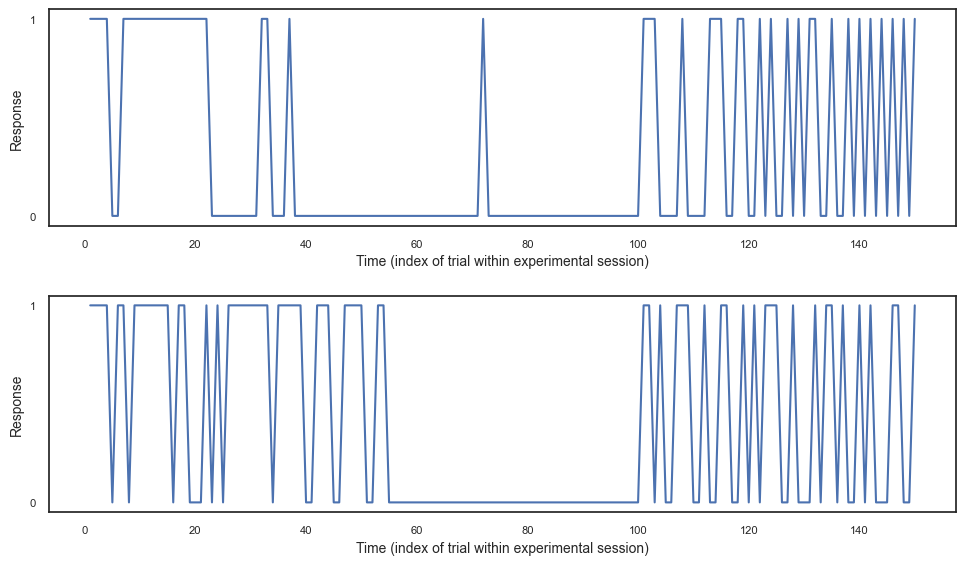

In [612]:
patients = [35, 40]
patient_sessions = revcor_data[(revcor_data.type == "patients")& (revcor_data.subject.isin(patients))& (revcor_data.session == 1)].groupby(["subject", "session"], as_index=False).trial.count()

num_rows = len(patient_sessions)
fig, axs = plt.subplots(num_rows, 1, figsize=(10, 6))

for i, patient_session in enumerate(zip(patient_sessions.subject, patient_sessions.session)):
    patient = patient_session[0]
    session = patient_session[1]
    
    patient_responses = revcor_data[(revcor_data.subject==patient) & 
                                    (revcor_data.session==session) & 
                                    (revcor_data.stim_order==0)].groupby('trial')['response'].first()
    
    axs[i].plot(patient_responses)
    axs[i].set_yticks([0, 1])
    axs[i].set_ylabel('Response', fontsize=10)
    axs[i].set_xlabel('Time (index of trial within experimental session)', fontsize=10)
    axs[i].grid(False)
    axs[i].set_facecolor('white')
    axs[i].tick_params(axis='both', labelsize=8)

plt.tight_layout()
plt.show()

In [ ]:
# subject = 40
# session = 1

# # Filter the data for the specific subject and session
# group_data = revcor_data[(revcor_data['subject'] == subject) & (revcor_data['session'] == session)]

# # Group key to identify the specific group
# group_key = {'subject': subject, 'session': session, 'type': 'patients'}

# # Preprocess inputs and responses
# inputs, responses  = GLMHMMKernel._preprocess_inputs_and_responses(
#     group_data, trial_id='trial', stim_id='stim_order', 
#     feature_id='segment', value_id='pitch', response_id='response'
# )


# # Extract posterior probabilities and predicted states
# _, posterior_probs, predicted_states, _ = GLMHMMKernel.extract_single_kernel(
#     data_df=group_data,
#     trial_id='trial',
#     stim_id='stim_order',
#     feature_id='segment',
#     value_id='pitch',
#     response_id='response',
#     return_probs=True
# )

# # Calculate engaged trials
# engaged_trials = (predicted_states == 1).sum()

# # Compile results into a dictionary
# result = {
#     **group_key,
#     'responses': responses.flatten(),
#     'posterior_probs': posterior_probs,
#     'predicted_states': predicted_states,
#     'engaged_trials': engaged_trials
# }

# # Convert to a DataFrame for visualization
# posterior_states_df = pd.DataFrame([result])


  0%|          | 0/300 [00:00<?, ?it/s]

In [640]:
# posterior_states_df
# # [posterior_states_df['subject']==20]

,subject,session,type,responses,posterior_probs,predicted_states,engaged_trials
0,40,1,patients,"[0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ...","[[0.0010428330613412784, 0.9989571669386621], ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",105


In [45]:
revcor_measures

NameError: name 'revcor_measures' is not defined

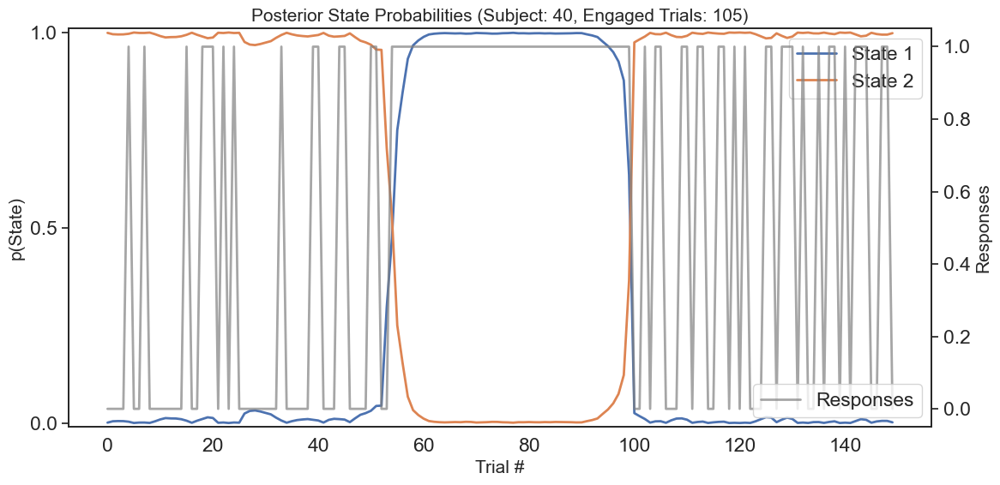

In [ ]:
# selected_row = posterior_states_df.iloc[0]

# # Extract data
# posterior_probs = selected_row['posterior_probs']  
# predicted_states = selected_row['predicted_states']  
# responses = selected_row['responses']
# engaged_trials = selected_row['engaged_trials']  
# subject = selected_row['subject'] 

# # Plot posterior probabilities
# fig, ax1 = plt.subplots(figsize=(12, 6), dpi=100, facecolor='w', edgecolor='k')
# num_states = posterior_probs.shape[1]  
# for k in range(num_states):
#     ax1.plot(
#         posterior_probs[:, k],
#         label=f"State {k + 1}",
#         lw=2
#     )

# # Configure first axis (posterior probabilities)
# ax1.set_ylim((-0.01, 1.01))
# ax1.set_yticks([0, 0.5, 1])
# ax1.set_xlabel("Trial #", fontsize=15)
# ax1.set_ylabel("p(State)", fontsize=15)
# ax1.set_title(f"Posterior State Probabilities (Subject: {subject}, Engaged Trials: {engaged_trials})", fontsize=15)
# ax1.legend(loc='upper right')

# # Add second axis (predicted states and responses)
# ax2 = ax1.twinx()
# # ax2.step(
# #     range(len(predicted_states)),
# #     predicted_states,
# #     where='post',
# #     linewidth=3,
# #     color='green',
# #     alpha=0.5,
# #     label="Predicted States"
# # )

# # Plot responses as a line plot
# ax2.plot(
#     range(len(responses)),
#     responses,
#     color='grey',
#     linewidth=2,
#     label="Responses",
#     alpha=0.7
# )

# # Configure secondary axis to reflect actual response values
# ax2.set_ylabel('Responses', fontsize=15)

# # Add legend for secondary axis
# ax2.legend(loc='lower right')

# plt.tight_layout()
# plt.show()


## test

In [647]:
# Create a simple experiment
exp = SimpleExperiment(
    
    n_trials=150,
    trial_type=Int2Trial,  # Replace with your trial type class
    n_features=7,
    external_noise_std=100
)

In [648]:
from palin.simulation.observers.perseverating_observer import PerseveratingObserver
obs = PerseveratingObserver.with_random_kernel(
    n_features=exp.n_features,
    internal_noise_std=4,
    criteria=0,
    transition_matrix=[[0.8, 0.2], [0.11, 0.89]]
)

# Get responses and state sequence
responses = obs.respond_to_experiment(exp)
responses_df = Analyser.to_df(exp, responses)
states = obs.last_state_sequence
stimulus_values = [trial.stims for trial in exp.trials]

# Print results
print("Responses:", responses)
print("States:", states)
print("Stimulus Values:", stimulus_values)
responses_df

Responses: [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
States: ['ENG', 'ENG', 'ENG', 'ENG', 'ENG', 'ENG', 'PER', 'PER', 'ENG', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'PER', 'ENG', 'ENG', 'ENG', 'ENG', 'ENG', 'ENG', 'PER', 'PER', 'PER', 'PER', 'ENG', 'ENG', 'ENG', 'ENG', 'ENG', 'ENG', 'ENG', 'ENG', 'ENG', 'ENG', 'ENG', 'ENG', 'ENG', 'ENG', 'ENG', 'ENG', 'ENG', 'PER', 'ENG', 'ENG', 'ENG', 'ENG', 'ENG

,trial,stim,feature,value,response
0,0,0,0,7.273654,True
1,0,0,1,173.954293,True
2,0,0,2,-103.336035,True
3,0,0,3,-29.869194,True
4,0,0,4,-177.224630,True
...,...,...,...,...,...
2095,149,1,2,96.720602,True
2096,149,1,3,-38.544227,True
2097,149,1,4,-95.781186,True
2098,149,1,5,4.861258,True


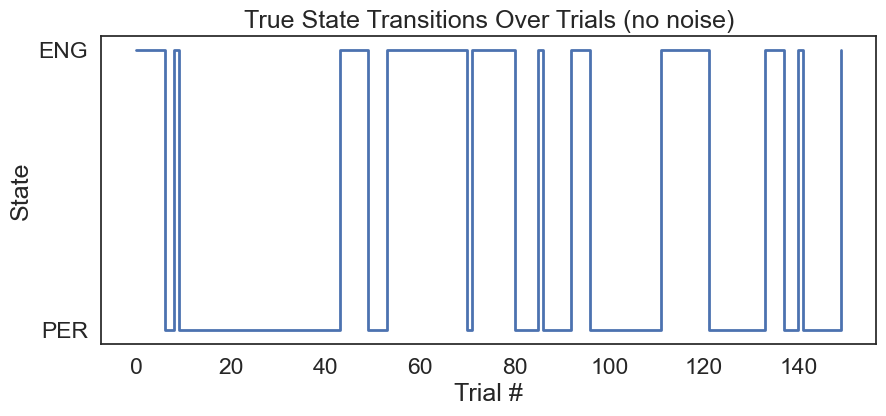

In [649]:
state_numeric_no_noise = [1 if state == "ENG" else 0 for state in states]

plt.figure(figsize=(10, 4))
plt.step(range(len(state_numeric_no_noise)), state_numeric_no_noise, where='post', linewidth=2)
plt.yticks([0, 1], ['PER', 'ENG'])
plt.xlabel('Trial #')
plt.ylabel('State')
plt.title('True State Transitions Over Trials (no noise)')
plt.show()

In [650]:
# Calculate inputs (stimulus differences) and choice history
inputs = []
for trial in stimulus_values:
    stim_1 = np.array(trial[0])  # First stimulus
    stim_2 = np.array(trial[1])  # Second stimulus
    trial_diffs = stim_2 - stim_1  # Calculate differences between the two stimuli
    inputs.append(trial_diffs)
# Convert inputs to a numpy array
inputs_array = np.array(inputs)

# Shift responses to create choice history
choice_history_array = pd.Series(responses).shift(1).fillna(0).values.reshape(-1, 1)

# Combine stimulus differences and choice history into a single input array
inputs_array_no_noise = np.hstack((inputs_array, choice_history_array))

# Convert responses to a numpy array
responses_no_noise_array = np.array(responses).reshape(-1, 1)

# Display the results
print("Inputs (stimulus differences + choice history):")
print(inputs_array_no_noise)
print("\nResponses:")
print(responses_no_noise_array)

Inputs (stimulus differences + choice history):
[[ -93.64457421 -290.4664376   256.2827802  ...   30.52832074
   -68.59435058    0.        ]
 [   1.53913239 -240.75631803  -57.40808845 ...  -30.9822028
   -70.14287443    0.        ]
 [-174.48502739  -21.50094976   96.95828111 ...   27.63886912
   277.0265969     0.        ]
 ...
 [ -31.06850119 -107.22963189  181.66750353 ... -129.8339326
   119.2605239     1.        ]
 [ -46.67427797   40.42486909 -206.48810382 ...  -98.91185275
   194.28367527    1.        ]
 [ 249.48307756   25.46614677  227.23681902 ...  -53.45636706
   -91.01904012    1.        ]]

Responses:
[[0]
 [0]
 [0]
 [1]
 [1]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [1]
 [0]
 [1]
 [1]
 [0]
 [0]
 [0]
 [0]
 [0]
 [1]
 [0]
 [0]
 [0]
 [1]
 [0]
 [0]
 [0]
 [0]
 [0]
 [1]
 [1]
 [0]
 [0]
 [1]
 [1]
 [0]
 [0]
 [1]
 [1]
 [1]
 [0

In [651]:
inputs, responses  = GLMHMMKernel._preprocess_inputs_and_responses(
    responses_df, trial_id='trial', stim_id='stim', 
    feature_id='feature', value_id='value', response_id='response'
)

# Extract posterior probabilities and predicted states
_, posterior_probs, predicted_states, _ = GLMHMMKernel.extract_single_kernel(
    data_df=responses_df,
    trial_id='trial',
    stim_id='stim',
    feature_id='feature',
    value_id='value',
    response_id='response',
    return_probs=True
)

# Calculate engaged trials
engaged_trials = (predicted_states == 1).sum()

# Compile results into a dictionary
result = {
    **group_key,
    'responses': responses.flatten(),
    'posterior_probs': posterior_probs,
    'predicted_states': predicted_states,
    'engaged_trials': engaged_trials
}

# Convert to a DataFrame for visualization
posterior_states_df = pd.DataFrame([result])

  0%|          | 0/300 [00:00<?, ?it/s]

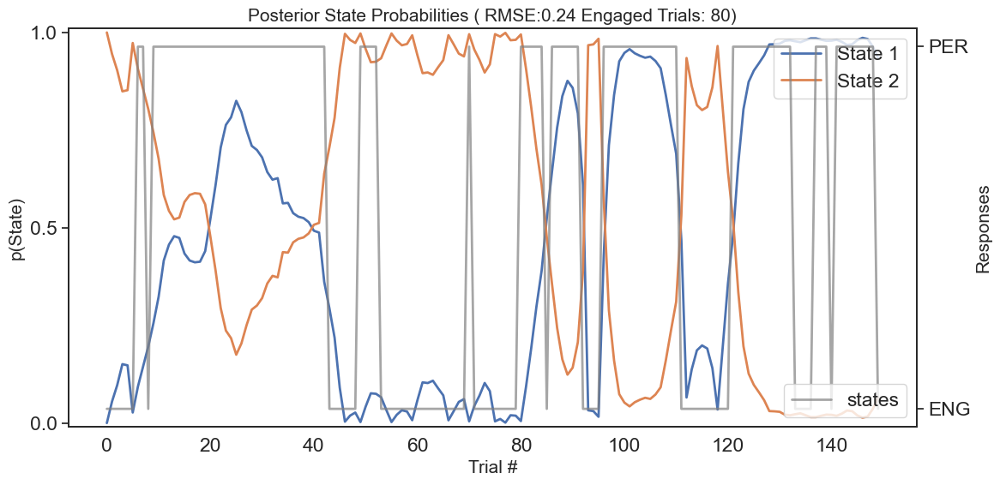

In [ ]:
# from sklearn.metrics import mean_squared_error

# selected_row = posterior_states_df.iloc[0]

# # Extract data
# posterior_probs = selected_row['posterior_probs']  
# predicted_states = selected_row['predicted_states']  
# responses = selected_row['responses']
# engaged_trials = selected_row['engaged_trials']  
# subject = selected_row['subject'] 
# rmse_with_noise = np.mean(predicted_states != state_numeric_no_noise)


# # Plot posterior probabilities
# fig, ax1 = plt.subplots(figsize=(12, 6), dpi=100, facecolor='w', edgecolor='k')
# num_states = posterior_probs.shape[1]  
# for k in range(num_states):
#     ax1.plot(
#         posterior_probs[:, k],
#         label=f"State {k + 1}",
#         lw=2
#     )

# # Configure first axis (posterior probabilities)
# ax1.set_ylim((-0.01, 1.01))
# ax1.set_yticks([0, 0.5, 1])
# ax1.set_xlabel("Trial #", fontsize=15)
# ax1.set_ylabel("p(State)", fontsize=15)
# ax1.set_title(f"Posterior State Probabilities ( RMSE:{rmse_with_noise} Engaged Trials: {engaged_trials})", fontsize=15)
# ax1.legend(loc='upper right')

# # Add second axis (predicted states and responses)
# ax2 = ax1.twinx()
# # ax2.step(
# #     range(len(responses)),
# #     responses,
# #     where='post',
# #     linewidth=3,
# #     color='red',
# #     alpha=0.5,
# #     label="responses"
# # )

# # Plot responses as a line plot
# ax2.plot(
#     range(len(states)),
#     states,
#     color='grey',
#     linewidth=2,
#     label="states",
#     alpha=0.7
# )

# # Configure secondary axis to reflect actual response values
# ax2.set_ylabel('Responses', fontsize=15)

# # Add legend for secondary axis
# ax2.legend(loc='lower right')

# plt.tight_layout()
# plt.show()


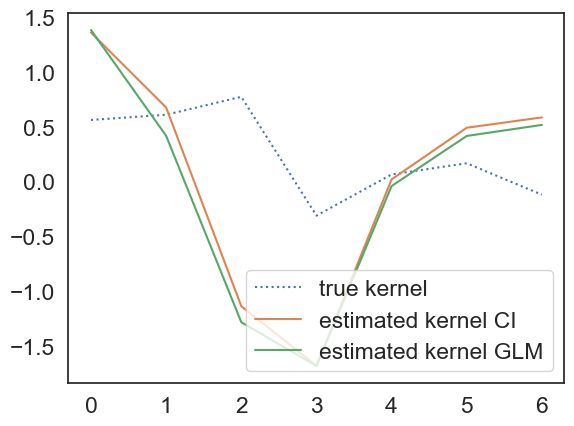

In [ ]:
# plt.plot(obs.kernel,':',label='true kernel')
# plt.plot(ClassificationImage.normalize_kernel(ClassificationImage.extract_single_kernel(responses_df)),
#          label='estimated kernel CI')
# plt.plot(GLMKernel.normalize_kernel(GLMKernel.extract_single_kernel(responses_df)),
#          label='estimated kernel GLM')
# plt.legend()


In [591]:
# model = GLMHMMKernel._train_glmhmm(inputs_array_no_noise, responses_no_noise_array, best_priors)

# kernel = GLMHMMKernel._extract_kernel_from_model(model)
# posterior_probs, predicted_states = GLMHMMKernel._extract_posterior_probabilities(model, responses_no_noise_array, inputs_array_no_noise)
# print(posterior_probs)
# print(predicted_states)
# # Calculate engaged trials
# engaged_trials = (predicted_states == 1).sum()

# # Compile results into a dictionary
# result = {
#     **group_key,
#     'responses': responses_no_noise_array.flatten(),
#     'posterior_probs': posterior_probs,
#     'predicted_states': predicted_states,
#     'engaged_trials': engaged_trials
# }

# # Convert to a DataFrame for visualization
# posterior_states_df_test = pd.DataFrame([result])

  0%|          | 0/300 [00:00<?, ?it/s]

[[5.38780327e-04 9.99461220e-01]
 [2.24597276e-02 9.77540272e-01]
 [4.01271713e-02 9.59872829e-01]
 [5.67995249e-02 9.43200475e-01]
 [6.91546344e-02 9.30845366e-01]
 [7.43447687e-02 9.25655231e-01]
 [7.35513550e-02 9.26448645e-01]
 [7.44915019e-02 9.25508498e-01]
 [5.49116717e-02 9.45088328e-01]
 [4.19410925e-02 9.58058907e-01]
 [1.22456847e-02 9.87754315e-01]
 [1.63288385e-01 8.36711615e-01]
 [3.11827577e-01 6.88172423e-01]
 [4.22867186e-01 5.77132814e-01]
 [5.66639771e-01 4.33360229e-01]
 [6.99850509e-01 3.00149491e-01]
 [8.27431491e-01 1.72568509e-01]
 [8.89755392e-01 1.10244608e-01]
 [9.27091583e-01 7.29084166e-02]
 [9.46745385e-01 5.32546155e-02]
 [9.61899184e-01 3.81008159e-02]
 [9.74600626e-01 2.53993743e-02]
 [9.77780838e-01 2.22191616e-02]
 [9.81321584e-01 1.86784159e-02]
 [9.86501501e-01 1.34984994e-02]
 [9.85012267e-01 1.49877333e-02]
 [9.85725304e-01 1.42746962e-02]
 [9.86979260e-01 1.30207401e-02]
 [9.88087202e-01 1.19127980e-02]
 [9.89242771e-01 1.07572285e-02]
 [9.809499

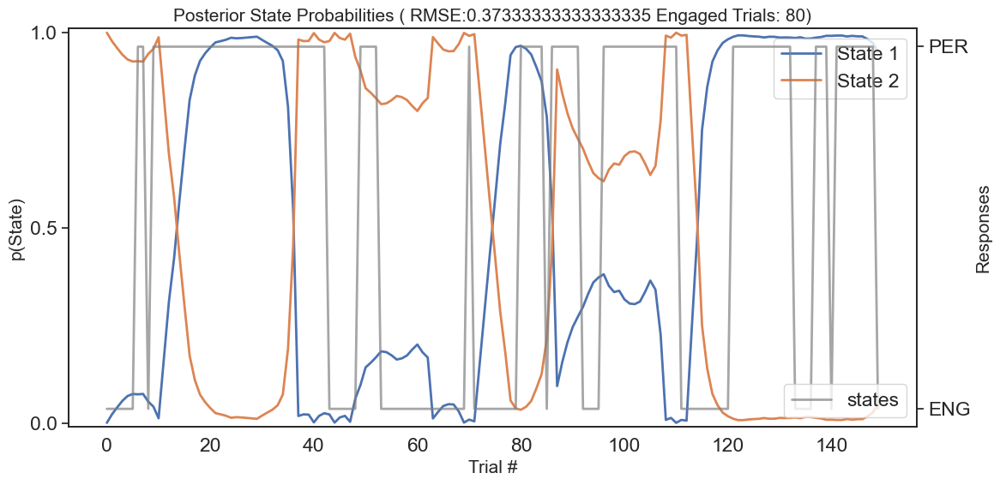

In [ ]:
# from sklearn.metrics import mean_squared_error

# selected_row = posterior_states_df_test.iloc[0]

# # Extract data
# posterior_probs = selected_row['posterior_probs']  
# predicted_states = selected_row['predicted_states']  
# responses = selected_row['responses']
# engaged_trials = selected_row['engaged_trials']  
# subject = selected_row['subject'] 
# rmse_with_noise = np.mean(predicted_states != state_numeric_no_noise)


# # Plot posterior probabilities
# fig, ax1 = plt.subplots(figsize=(12, 6), dpi=100, facecolor='w', edgecolor='k')
# num_states = posterior_probs.shape[1]  
# for k in range(num_states):
#     ax1.plot(
#         posterior_probs[:, k],
#         label=f"State {k + 1}",
#         lw=2
#     )

# # Configure first axis (posterior probabilities)
# ax1.set_ylim((-0.01, 1.01))
# ax1.set_yticks([0, 0.5, 1])
# ax1.set_xlabel("Trial #", fontsize=15)
# ax1.set_ylabel("p(State)", fontsize=15)
# ax1.set_title(f"Posterior State Probabilities ( RMSE:{rmse_with_noise} Engaged Trials: {engaged_trials})", fontsize=15)
# ax1.legend(loc='upper right')

# # Add second axis (predicted states and responses)
# ax2 = ax1.twinx()
# # ax2.step(
# #     range(len(responses)),
# #     responses,
# #     where='post',
# #     linewidth=3,
# #     color='red',
# #     alpha=0.5,
# #     label="responses"
# # )

# # Plot responses as a line plot
# ax2.plot(
#     range(len(states)),
#     states,
#     color='grey',
#     linewidth=2,
#     label="states",
#     alpha=0.7
# )

# # Configure secondary axis to reflect actual response values
# ax2.set_ylabel('Responses', fontsize=15)

# # Add legend for secondary axis
# ax2.legend(loc='lower right')

# plt.tight_layout()
# plt.show()


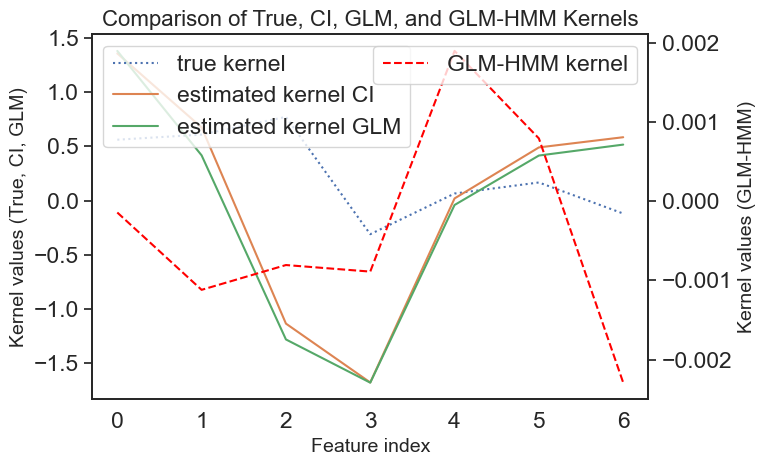

In [655]:
true_kernel = obs.kernel
ci_kernel = ClassificationImage.normalize_kernel(
    ClassificationImage.extract_single_kernel(responses_df)
)
glm_kernel = GLMKernel.normalize_kernel(
    GLMKernel.extract_single_kernel(responses_df)
)
glm_hmm_kernel = GLMHMMKernel._extract_kernel_from_model(model)['kernel_value'].values

# Create figure and primary axis
fig, ax1 = plt.subplots(figsize=(8, 5))

# Plot kernels on primary axis
ax1.plot(true_kernel, ':', label='true kernel')
ax1.plot(ci_kernel, label='estimated kernel CI')
ax1.plot(glm_kernel, label='estimated kernel GLM')

ax1.set_xlabel('Feature index', fontsize=14)
ax1.set_ylabel('Kernel values (True, CI, GLM)', fontsize=14)
ax1.legend(loc='upper left')

# Create a twin axis for the GLM-HMM kernel
ax2 = ax1.twinx()
ax2.plot(glm_hmm_kernel, '--', color='red', label='GLM-HMM kernel')
ax2.set_ylabel('Kernel values (GLM-HMM)', fontsize=14)
ax2.legend(loc='upper right')

plt.title('Comparison of True, CI, GLM, and GLM-HMM Kernels', fontsize=16)
plt.tight_layout()
plt.show()

### revcor measures

In [47]:
trial_ids=['type','subject','session']

In [48]:
revcor_measures = distances.merge(noises, how='left',on= trial_ids).merge(trans_mat, how='left', on=trial_ids)
revcor_measures.head(20)

,type,subject,session,kernel,kernel_distance,kernel_typicality,internal_noise,method,Transition,Probability
0,controls,0,1,ci,0.158300,0.956869,1.000000,dp,per,0.160282
1,controls,0,1,ci,0.158300,0.956869,1.000000,dp,unper,0.414727
2,controls,0,1,ci,0.158300,0.956869,0.608937,hmm,per,0.160282
3,controls,0,1,ci,0.158300,0.956869,0.608937,hmm,unper,0.414727
4,controls,0,1,ci,0.158300,0.956869,0.736079,glm,per,0.160282
5,controls,0,1,ci,0.158300,0.956869,0.736079,glm,unper,0.414727
6,controls,0,1,glm,0.134052,0.964552,1.000000,dp,per,0.160282
7,controls,0,1,glm,0.134052,0.964552,1.000000,dp,unper,0.414727
8,controls,0,1,glm,0.134052,0.964552,0.608937,hmm,per,0.160282
9,controls,0,1,glm,0.134052,0.964552,0.608937,hmm,unper,0.414727


In [41]:
kernels.to_csv("data/kernels.csv")
revcor_measures.to_csv("data/revcor_measures.csv")

In [51]:
revcor_measures

,type,subject,session,kernel,kernel_distance,kernel_typicality,internal_noise,method,Transition,Probability
0,controls,0,1,ci,0.158300,0.956869,1.000000,dp,per,0.160282
1,controls,0,1,ci,0.158300,0.956869,1.000000,dp,unper,0.414727
2,controls,0,1,ci,0.158300,0.956869,0.608937,hmm,per,0.160282
3,controls,0,1,ci,0.158300,0.956869,0.608937,hmm,unper,0.414727
4,controls,0,1,ci,0.158300,0.956869,0.736079,glm,per,0.160282
...,...,...,...,...,...,...,...,...,...,...
1399,patients,43,4,hmm,1.550781,0.515626,2.300000,dp,unper,0.047384
1400,patients,43,4,hmm,1.550781,0.515626,2.650312,hmm,per,0.164310
1401,patients,43,4,hmm,1.550781,0.515626,2.650312,hmm,unper,0.047384
1402,patients,43,4,hmm,1.550781,0.515626,2.786002,glm,per,0.164310


In [18]:
#revcor_measures.to_csv('data/revcor_measures.csv')
kernels.to_csv('data/kernels.csv')

In [ ]:
print(revcor_measures.groupby(['experimentor','session','type']).agg({'subject':'unique'}))
print(clinical_data.groupby(['experimentor','session','type']).agg({'subject':'unique'}))

                                                                       subject
experimentor session type                                                     
aynaz        1       controls  [0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14]
bardet       1       patients                             [22, 23, 24, 25, 26]
commere      1       patients                 [27, 28, 29, 30, 31, 32, 33, 34]
jeulin       1       controls                     [15, 16, 17, 18, 19, 20, 21]
                     patients             [35, 36, 37, 38, 39, 40, 41, 42, 43]
             2       controls                     [15, 16, 17, 18, 19, 20, 21]
                     patients             [35, 36, 37, 38, 39, 40, 41, 42, 43]
             3       patients             [35, 36, 37, 38, 39, 40, 41, 42, 43]
             4       patients             [35, 36, 37, 38, 39, 40, 41, 42, 43]
                                                                       subject
experimentor session type                           

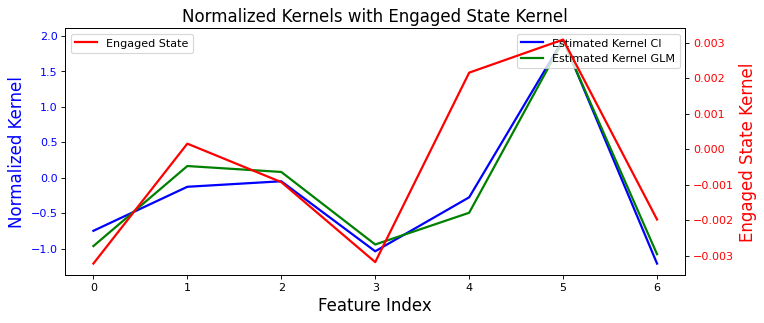

In [ ]:
fig, ax1 = plt.subplots(figsize=(10, 4), dpi=80, facecolor='w', edgecolor='k')

# Primary Y-Axis: Normalized Kernels
ax1.plot(ClassificationImage.normalize_kernel(ClassificationImage.extract_single_kernel(responses_df)),
         label='Estimated Kernel CI', linestyle='-', linewidth=2, color='blue')
ax1.plot(GLMKernel.normalize_kernel(GLMKernel.extract_single_kernel(responses_df)),
         label='Estimated Kernel GLM', linestyle='-', linewidth=2, color='green')

# Configure primary Y-axis
ax1.set_xlabel('Feature Index', fontsize=15)
ax1.set_ylabel('Normalized Kernel', fontsize=15, color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.legend(loc='upper right')

# Secondary Y-Axis: Engaged State Kernel
ax2 = ax1.twinx()
ax2.plot(kernel[1][0][:-1] * -1, label="Engaged State", color='red', linestyle='-', linewidth=2)
# Configure secondary Y-axis
ax2.set_ylabel('Engaged State Kernel', fontsize=15, color='red')
ax2.tick_params(axis='y', labelcolor='red')
ax2.legend(loc='best')

# Title
ax1.set_title('Normalized Kernels with Engaged State Kernel', fontsize=15)

# Show the plot
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


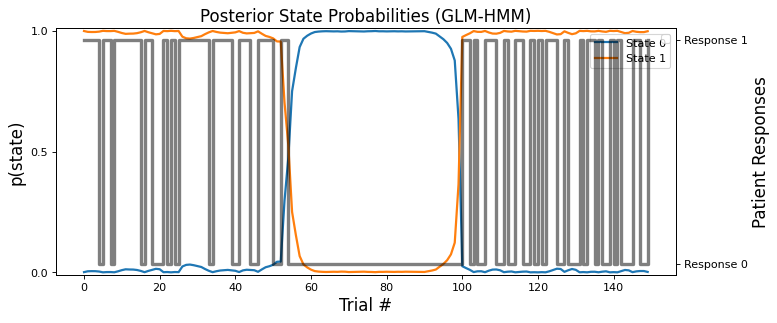

In [ ]:
# Visualization
fig, ax1 = plt.subplots(figsize=(10, 4), dpi=80, facecolor='w', edgecolor='k')

# Number of states in the model
num_states = posterior_probs.shape[1]

# Plot posterior probabilities for each state
for k in range(num_states):
    ax1.plot(posterior_probs[:, k], label=f"State {k}", lw=2)

# Configure primary axis
ax1.set_ylim((-0.01, 1.01))
ax1.set_yticks([0, 0.5, 1])
ax1.set_xlabel("Trial #", fontsize=15)
ax1.set_ylabel("p(state)", fontsize=15)
ax1.set_title("Posterior State Probabilities (GLM-HMM)", fontsize=15)
ax1.legend()

# ax2 = ax1.twinx()
# ax2.step(range(len(responses)), responses, where='post', linewidth=3, color='black', alpha=0.5)
# ax2.set_yticks([0, 1])
# ax2.set_yticklabels(['Response 0', 'Response 1'])
# ax2.set_ylabel('Responses', fontsize=15)
patient_responses = responses_df[responses_df['stim'] == 0].groupby('trial')['response'].first()
ax2 = ax1.twinx()
ax2.step(range(len(patient_responses)), patient_responses, where='post', linewidth=3, color='black', alpha=0.5)
ax2.set_yticks([0, 1])
ax2.set_yticklabels(['Response 0', 'Response 1'])
ax2.set_ylabel('Patient Responses', fontsize=15)
ax2.legend(loc='best')
# # Show the plot
plt.show()

## Results AVC

In [10]:
kernels=pd.read_csv("data/kernels_avc.csv", index_col=0)
kernels

,subject,session,type,feature,kernel_value,kernel
0,0,1,controls,0,0.021588,ci
1,0,1,controls,1,0.170469,ci
2,0,1,controls,2,-0.381605,ci
3,0,1,controls,3,-0.543959,ci
4,0,1,controls,4,0.367073,ci
...,...,...,...,...,...,...
1633,43,4,patients,2,-0.896946,hmm
1634,43,4,patients,3,-0.015078,hmm
1635,43,4,patients,4,1.281720,hmm
1636,43,4,patients,5,-0.188468,hmm


In [18]:
revcor_measures=pd.read_csv("data/new_revcor_measures.csv", index_col=0)
revcor_measures

,subject,session,kernel_ci,kernel_glm,kernel_hmm,internal_noise_dp,internal_noise_glm,internal_noise_hmm,transition_per,transition_unper,internal_noise_old,predicted_states,engaged_trials,pitch,trial,response,stim_order,kernel_ci_values,kernel_glm_values,kernel_hmm_values
type,,,,,,,,,,,,,,,,,,,,
controls,0,1,0.956869,0.964552,0.937447,1.0,0.736079,0.608937,0.160282,0.414727,0.85,[0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1...,124,"[-84.088119, 11.67797, 70.948823, 101.030552, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ...","[False, False, False, False, False, False, Fal...","[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, ...","[0.02158835646258444, 0.17046864635815637, -0....","[-0.10775430745353104, 0.1913803120784971, -0....","[-0.30178998160193804, 0.09142075869123255, -0..."
controls,1,1,0.923165,0.898888,0.961306,0.6,3.241213,0.773682,0.009120,0.039851,0.55,[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0...,104,"[-33.116176, -79.722902, -0.174059, 82.274364,...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ...","[False, False, False, False, False, False, Fal...","[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, ...","[0.7389727897436488, -0.030285332083586844, -0...","[0.7513181869686766, -0.06272488736625358, -0....","[0.08732638112698023, -0.574033776931692, 0.07..."
controls,2,1,0.930187,0.955707,0.913754,3.0,3.707792,2.215195,0.377357,0.387439,1.25,[1 1 1 0 1 1 1 1 0 0 0 0 0 0 1 0 1 1 1 0 1 1 0...,75,"[7.012988, 64.551185, -65.392523, 18.180118, -...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ...","[True, True, True, True, True, True, True, Fal...","[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, ...","[-0.696133060353448, -0.051624419472822196, 0....","[-0.8178317566070564, -0.05080555734704332, 0....","[0.24873603311364456, -0.3522125925616252, 1.0..."
controls,3,1,0.771440,0.826514,0.833871,3.8,2.406972,0.909850,0.473803,0.881212,1.75,[0 1 1 0 1 1 1 0 1 1 0 1 1 0 1 0 1 1 1 1 1 1 1...,118,"[-89.296237, 0.647875, -124.228045, -147.3659,...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ...","[True, True, True, True, True, True, True, Fal...","[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, ...","[0.6311959234229492, 1.1664141218917088, 0.851...","[0.31185016905347185, 0.8551185446747136, 0.43...","[0.32632638854307777, 1.1069823623845159, 0.04..."
controls,4,1,0.976659,0.974843,0.956937,1.2,0.694366,0.758844,0.046820,0.252933,0.45,[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1...,136,"[143.598511, 23.645136, -118.740497, -109.0464...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ...","[True, True, True, True, True, True, True, Fal...","[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, ...","[0.282835964780659, 0.15628903058890528, -0.26...","[0.02673278097734961, -0.04649031405657823, -0...","[0.03268818904939259, 0.24200070176772104, -0...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
patients,42,4,0.304763,0.270199,0.326881,4.9,6.701546,7.238068,0.045547,0.261112,4.65,[0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1...,134,"[6.916759, -84.35075, -16.715927, 37.188565, -...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, ...","[True, True, True, True, True, True, True, Fal...","[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, ...","[0.14084100003892322, -1.4752927202282917, -0....","[-0.19647876599524702, -1.643815442939591, -0....","[0.2791834751026134, -1.1306518192367945, -0.5..."
patients,43,1,0.902859,0.919732,0.434931,0.8,6.267092,NaN,0.687643,0.261981,0.75,[0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0...,9,"[111.203335, 33.815691, 155.957241, 99.748202,...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, ...","[False, False, False, False, False, False, Fal...","[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, ...","[-0.3022181026980606, -0.224779878987395, -0.8...","[-0.7305109994555741, -0.027570874578785428, -...","[-0.06036088014615951, -0.5383405762865964, -0..."
patients,43,2,0.412216,0.330135,0.301857,4.9,13.453941,11.869534,0.074617,0.184979,4.85,[1 1 1 1 1 1 1 

In [19]:
revcor_measures_old=pd.read_csv("data/revcor_measures_old.csv", index_col=0)
revcor_measures_old

,experimentor,type,subject,session,kernel_distance,kernel_typicality,p_int1,pc_agree,criteria,internal_noise_with_criteria,accuracy
0,aynaz,controls,0,1,0.172140,0.964645,0.47,0.70,0.15,0.85,0.740000
1,aynaz,controls,1,1,0.225931,0.946988,0.55,0.78,0.20,0.55,0.693333
2,aynaz,controls,2,1,0.240553,0.942189,0.40,0.64,0.55,1.25,0.606667
3,aynaz,controls,3,1,0.710265,0.788015,0.53,0.58,0.20,1.75,0.613333
4,aynaz,controls,4,1,0.098997,0.988652,0.47,0.82,0.10,0.45,0.753333
...,...,...,...,...,...,...,...,...,...,...,...
73,jeulin,patients,42,4,2.215531,0.293938,0.40,0.44,1.15,4.65,0.473333
74,jeulin,patients,43,1,0.365122,0.901302,0.84,0.84,1.75,0.75,0.586667
75,jeulin,patients,43,2,1.848419,0.414436,0.40,0.52,1.80,4.85,0.480000
76,jeulin,patients,43,3,1.770126,0.440134,0.68,0.76,0.80,0.70,0.520000


In [11]:
new_revcor=pd.read_csv("data/new_revcor.csv", index_col=0)
new_revcor

,session,subject,responses,stim_diff,predicted_states,kernel_ci,kernel_glm,kernel_hmm,internal_noise_dp,internal_noise_glm,...,kernel_hmm_values,trial_difficulty,trans2per,trans2eng,nbr_resp_iden,stim_1,stim_2,expected_response,correct_prediction,nbr_resp_iden_expec
type,,,,,,,,,,,,,,,,,,,,,
controls,1,0,1,[169.348324 -16.362536 62.457522 9.423951 ...,0,0.956869,0.964552,0.937447,1.0,0.736079,...,[-0.30178998 0.09142076 -0.51629114 -0.383525...,-86.680293,0,0,0,[-84.088119 11.67797 70.948823 101.030552 ...,[ 85.260205 -4.684566 133.406345 110.454503 ...,0,False,0
controls,1,0,1,[ -96.492526 -124.4527 -276.540197 -112.2773...,0,0.956869,0.964552,0.937447,1.0,0.736079,...,[-0.30178998 0.09142076 -0.51629114 -0.383525...,-153.942013,0,0,1,[-36.418372 84.104587 132.070943 -36.088233 -...,[-132.910898 -40.348113 -144.469254 -148.3656...,0,False,1
controls,1,0,1,[ -53.626389 -34.446343 23.901545 14.8611...,0,0.956869,0.964552,0.937447,1.0,0.736079,...,[-0.30178998 0.09142076 -0.51629114 -0.383525...,-293.368846,0,1,2,[ 27.345676 118.378449 35.467907 -5.979973 ...,[ -26.280713 83.932106 59.369452 8.8811...,1,True,0
controls,1,0,0,[-15.452448 -46.143456 40.069334 73.841401 2...,1,0.956869,0.964552,0.937447,1.0,0.736079,...,[-0.30178998 0.09142076 -0.51629114 -0.383525...,79.913104,0,0,0,[ -38.971396 127.210639 -100.465383 -139.5268...,[-54.423844 81.067183 -60.396049 -65.685418 1...,1,False,1
controls,1,0,1,[ 30.930532 -119.892847 -229.025108 -127.9158...,1,0.956869,0.964552,0.937447,1.0,0.736079,...,[-0.30178998 0.09142076 -0.51629114 -0.383525...,745.475245,0,0,0,[ 92.610651 40.250954 99.988333 115.5434...,[ 123.541183 -79.641893 -129.036775 -12.3724...,1,True,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
patients,4,43,1,[ 56.62049 -6.550564 35.6587 54.662277 -...,0,0.494824,0.462278,0.515626,2.3,2.786002,...,[ 0.77474994 -1.38701243 -0.89694746 -0.015077...,-130.880712,0,0,42,[-48.148294 20.256697 16.104065 -85.896309 1...,[ 8.472196 13.706133 51.762765 -31.234032 ...,0,False,3
patients,4,43,1,[-226.25371 -0.782702 136.846572 -29.4819...,0,0.494824,0.462278,0.515626,2.3,2.786002,...,[ 0.77474994 -1.38701243 -0.89694746 -0.015077...,-479.183018,0,0,43,[ 120.707918 8.970095 -87.383718 -110.3626...,[-105.545792 8.187393 49.462854 -139.8445...,1,True,0
patients,4,43,1,[-101.018981 -108.077897 -70.100066 52.0863...,0,0.494824,0.462278,0.515626,2.3,2.786002,...,[ 0.77474994 -1.38701243 -0.89694746 -0.015077...,134.940085,0,1,44,[ 68.610613 132.540723 -4.163706 -102.9342...,[-32.408368 24.462826 -74.263772 -50.847983 ...,1,True,1


In [34]:
new_revcor=pd.read_csv("data/new_revcor.csv", index_col=0)
new_revcor=new_revcor.sort_values(by=['session', 'subject']).reset_index(drop=True)
new_revcor

,type,session,subject,responses,stim_diff,predicted_states,kernel_ci,kernel_glm,kernel_hmm,internal_noise_dp,...,transition_per,transition_unper,internal_noise_old,kernel_ci_values,kernel_glm_values,kernel_hmm_values,trial_difficulty,trans2per,trans2eng,nbr_resp_iden
0,controls,1,0,1,[169.348324 -16.362536 62.457522 9.423951 ...,0,0.956869,0.964552,0.937447,1.0,...,0.160282,0.414727,0.85,"[0.02158835646258444, 0.17046864635815637, -0....","[-0.10775430745353104, 0.1913803120784971, -0....","[-0.30178998160193804, 0.09142075869123255, -0...",-86.680293,0,0,0
1,controls,1,0,1,[ -96.492526 -124.4527 -276.540197 -112.2773...,0,0.956869,0.964552,0.937447,1.0,...,0.160282,0.414727,0.85,"[0.02158835646258444, 0.17046864635815637, -0....","[-0.10775430745353104, 0.1913803120784971, -0....","[-0.30178998160193804, 0.09142075869123255, -0...",-153.942013,0,0,1
2,controls,1,0,1,[ -53.626389 -34.446343 23.901545 14.8611...,0,0.956869,0.964552,0.937447,1.0,...,0.160282,0.414727,0.85,"[0.02158835646258444, 0.17046864635815637, -0....","[-0.10775430745353104, 0.1913803120784971, -0....","[-0.30178998160193804, 0.09142075869123255, -0...",-293.368846,0,0,2
3,controls,1,0,0,[-15.452448 -46.143456 40.069334 73.841401 2...,1,0.956869,0.964552,0.937447,1.0,...,0.160282,0.414727,0.85,"[0.02158835646258444, 0.17046864635815637, -0....","[-0.10775430745353104, 0.1913803120784971, -0....","[-0.30178998160193804, 0.09142075869123255, -0...",79.913104,0,1,0
4,controls,1,0,1,[ 30.930532 -119.892847 -229.025108 -127.9158...,1,0.956869,0.964552,0.937447,1.0,...,0.160282,0.414727,0.85,"[0.02158835646258444, 0.17046864635815637, -0....","[-0.10775430745353104, 0.1913803120784971, -0....","[-0.30178998160193804, 0.09142075869123255, -0...",745.475245,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11695,patients,4,43,1,[ 56.62049 -6.550564 35.6587 54.662277 -...,0,0.494824,0.462278,0.515626,2.3,...,0.164310,0.047384,2.70,"[-0.2037882639124794, -0.22302537007254294, -0...","[0.439271864936895, -0.5868817727876948, -0.53...","[0.7747499376995093, -1.3870124269728143, -0.8...",-130.880712,0,0,42
11696,patients,4,43,1,[-226.25371 -0.782702 136.846572 -29.4819...,0,0.494824,0.462278,0.515626,2.3,...,0.164310,0.047384,2.70,"[-0.2037882639124794, -0.22302537007254294, -0...","[0.439271864936895, -0.5868817727876948, -0.53...","[0.7747499376995093, -1.3870124269728143, -0.8...",-479.183018,0,0,43
11697,patients,4,43,1,[-101.018981 -108.077897 -70.100066 52.0863...,0,0.494824,0.462278,0.515626,2.3,...,0.164310,0.047384,2.70,"[-0.2037882639124794, -0.22302537007254294, -0...","[0.439271864936895, -0.5868817727876948, -0.53...","[0.7747499376995093, -1.3870124269728143, -0.8...",134.940085,0,0,44
11698,patients,4,43,0,[ 6.29866960e+01 1.43247580e+02 -1.68244675e+...,1,0.494824,0.462278,0.515626,2.3,...,0.164310,0.047384,2.70,"[-0.2037882639124794, -0.22302537007254294, -0...","[0.439271864936895, -0.5868817727876948, -0.53...","[0.7747499376995093, -1.3870124269728143, -0.8...",-301.528854,0,1,0


In [ ]:
revcor_measures_old.rename(columns={"internal_noise_with_criteria": "internal_noise_old"}, inplace=True)

In [65]:
kernel_pivot = revcor_measures.pivot_table(
    index=['type', 'subject', 'session'],
    columns='kernel',
    values='kernel_typicality'
).rename(columns={
    'ci': 'kernel_ci',
    'hmm': 'kernel_hmm',
    'glm': 'kernel_glm'
})
internal_noise_pivot = revcor_measures.pivot_table(
    index=['type', 'subject', 'session'],
    columns='method',
    values='internal_noise'
).rename(columns={
    'dp': 'internal_noise_dp',
    'glm': 'internal_noise_glm',
    'hmm': 'internal_noise_hmm'
})
transition_pivot = revcor_measures.pivot_table(
    index=['type', 'subject', 'session'],
    columns='Transition',
    values='Probability'  
).rename(columns={
    'per': 'transition_per',
    'unper': 'transition_unper'
})
new_revcor_measures = kernel_pivot.join(internal_noise_pivot).join(transition_pivot).reset_index()
new_revcor_measures

,type,subject,session,kernel_ci,kernel_glm,kernel_hmm,internal_noise_dp,internal_noise_glm,internal_noise_hmm,transition_per,transition_unper
0,controls,0,1,0.956869,0.964552,0.937447,1.0,0.736079,0.608937,0.160282,0.414727
1,controls,1,1,0.923165,0.898888,0.961306,0.6,3.241213,0.773682,0.009120,0.039851
2,controls,2,1,0.930187,0.955707,0.913754,3.0,3.707792,2.215195,0.377357,0.387439
3,controls,3,1,0.771440,0.826514,0.833871,3.8,2.406972,0.909850,0.473803,0.881212
4,controls,4,1,0.976659,0.974843,0.956937,1.2,0.694366,0.758844,0.046820,0.252933
...,...,...,...,...,...,...,...,...,...,...,...
73,patients,42,4,0.304763,0.270199,0.326881,4.9,6.701546,7.238068,0.045547,0.261112
74,patients,43,1,0.902859,0.919732,0.434931,0.8,6.267092,NaN,0.687643,0.261981
75,patients,43,2,0.412216,0.330135,0.301857,4.9,13.453941,11.869534,0.074617,0.184979
76,patients,43,3,0.447055,0.496639,0.396752,1.2,4.817473,1.652424,0.390059,0.215818


In [68]:
new_revcor_measures=new_revcor_measures.merge(revcor_measures_old[['type', 'subject', 'session','internal_noise_old']], on=['type', 'subject', 'session'], how='left')
new_revcor_measures

,type,subject,session,kernel_ci,kernel_glm,kernel_hmm,internal_noise_dp,internal_noise_glm,internal_noise_hmm,transition_per,transition_unper,internal_noise_old
0,controls,0,1,0.956869,0.964552,0.937447,1.0,0.736079,0.608937,0.160282,0.414727,0.85
1,controls,1,1,0.923165,0.898888,0.961306,0.6,3.241213,0.773682,0.009120,0.039851,0.55
2,controls,2,1,0.930187,0.955707,0.913754,3.0,3.707792,2.215195,0.377357,0.387439,1.25
3,controls,3,1,0.771440,0.826514,0.833871,3.8,2.406972,0.909850,0.473803,0.881212,1.75
4,controls,4,1,0.976659,0.974843,0.956937,1.2,0.694366,0.758844,0.046820,0.252933,0.45
...,...,...,...,...,...,...,...,...,...,...,...,...
73,patients,42,4,0.304763,0.270199,0.326881,4.9,6.701546,7.238068,0.045547,0.261112,4.65
74,patients,43,1,0.902859,0.919732,0.434931,0.8,6.267092,NaN,0.687643,0.261981,0.75
75,patients,43,2,0.412216,0.330135,0.301857,4.9,13.453941,11.869534,0.074617,0.184979,4.85
76,patients,43,3,0.447055,0.496639,0.396752,1.2,4.817473,1.652424,0.390059,0.215818,0.70


In [95]:
new_revcor_measures=new_revcor_measures.merge(posterior_states_df[['subject', 'type','session', 'predicted_states', 'engaged_trials']], on=['subject', 'type','session'], how='left')
new_revcor_measures

,type,subject,session,kernel_ci,kernel_glm,kernel_hmm,internal_noise_dp,internal_noise_glm,internal_noise_hmm,transition_per,transition_unper,internal_noise_old,predicted_states,engaged_trials
0,controls,0,1,0.956869,0.964552,0.937447,1.0,0.736079,0.608937,0.160282,0.414727,0.85,"[0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",124
1,controls,1,1,0.923165,0.898888,0.961306,0.6,3.241213,0.773682,0.009120,0.039851,0.55,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",104
2,controls,2,1,0.930187,0.955707,0.913754,3.0,3.707792,2.215195,0.377357,0.387439,1.25,"[1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, ...",75
3,controls,3,1,0.771440,0.826514,0.833871,3.8,2.406972,0.909850,0.473803,0.881212,1.75,"[0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, ...",118
4,controls,4,1,0.976659,0.974843,0.956937,1.2,0.694366,0.758844,0.046820,0.252933,0.45,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",136
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,patients,42,4,0.304763,0.270199,0.326881,4.9,6.701546,7.238068,0.045547,0.261112,4.65,"[0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",134
74,patients,43,1,0.902859,0.919732,0.434931,0.8,6.267092,NaN,0.687643,0.261981,0.75,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...",9
75,patients,43,2,0.412216,0.330135,0.301857,4.9,13.453941,11.869534,0.074617,0.184979,4.85,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",121
76,patients,43,3,0.447055,0.496639,0.396752,1.2,4.817473,1.652424,0.390059,0.215818,0.70,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",51


In [108]:
unexploded_df=revcor_data.groupby(["subject", "session",'type']).agg({
    "pitch": list,"trial": list, "response": list, "stim_order": list
}).reset_index()
unexploded_df

,subject,session,type,pitch,trial,response,stim_order
0,0,1,controls,"[-84.088119, 11.67797, 70.948823, 101.030552, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ...","[False, False, False, False, False, False, Fal...","[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, ..."
1,1,1,controls,"[-33.116176, -79.722902, -0.174059, 82.274364,...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ...","[False, False, False, False, False, False, Fal...","[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, ..."
2,2,1,controls,"[7.012988, 64.551185, -65.392523, 18.180118, -...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ...","[True, True, True, True, True, True, True, Fal...","[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, ..."
3,3,1,controls,"[-89.296237, 0.647875, -124.228045, -147.3659,...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ...","[True, True, True, True, True, True, True, Fal...","[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, ..."
4,4,1,controls,"[143.598511, 23.645136, -118.740497, -109.0464...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ...","[True, True, True, True, True, True, True, Fal...","[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, ..."
...,...,...,...,...,...,...,...
73,42,4,patients,"[6.916759, -84.35075, -16.715927, 37.188565, -...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, ...","[True, True, True, True, True, True, True, Fal...","[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, ..."
74,43,1,patients,"[111.203335, 33.815691, 155.957241, 99.748202,...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, ...","[False, False, False, False, False, False, Fal...","[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, ..."
75,43,2,patients,"[183.815684, -50.778685, 43.751354, -14.240329...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, ...","[False, False, False, False, False, False, Fal...","[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, ..."
76,43,3,patients,"[61.63826, -139.507733, -115.842642, 9.769393,...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, ...","[True, True, True, True, True, True, True, Fal...","[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, ..."


In [32]:
grouped_data = []
for (subject, session), group in revcor_data.groupby(["subject", "session"]):
    responses = (
        group[group["stim_order"] == 1]
        .groupby("trial")["response"]
        .first()
        .replace({True: 1, False: 0})
        .tolist()
    )
    stimulus_values = (
        group.groupby(["trial", "stim_order"])["pitch"]
        .apply(list)
        .unstack()
        .apply(lambda x: [x[0], x[1]], axis=1)
        .tolist()
    )
    inputs = []
    stim_1_values = []  
    stim_2_values = []  
    for trial in stimulus_values:
        stim_1 = np.array(trial[0])  
        stim_2 = np.array(trial[1]) 
        
        trial_diffs = stim_2 - stim_1  
        inputs.append(trial_diffs)
        
        stim_1_values.append(stim_1)
        stim_2_values.append(stim_2)
    
    trial_summary = group.groupby("trial").first().reset_index()
    trial_summary = trial_summary[["trial", "type", "session", "subject"]]  
    trial_summary["responses"] = responses
    trial_summary["stim_diff"] = inputs
    trial_summary["stim_1"] = stim_1_values  # Add stim_1
    trial_summary["stim_2"] = stim_2_values  # Add stim_2
    
    grouped_data.append(trial_summary)
final_summary_df = pd.concat(grouped_data, ignore_index=True)
final_summary_df=final_summary_df.sort_values(by=['session', 'subject']).reset_index(drop=True)
final_summary_df

,trial,type,session,subject,responses,stim_diff,stim_1,stim_2
0,0,controls,1,0,1,"[169.348324, -16.362536, 62.45752199999998, 9....","[-84.088119, 11.67797, 70.948823, 101.030552, ...","[85.260205, -4.684566, 133.406345, 110.454503,..."
1,1,controls,1,0,1,"[-96.492526, -124.4527, -276.54019700000003, -...","[-36.418372, 84.104587, 132.070943, -36.088233...","[-132.910898, -40.348113, -144.469254, -148.36..."
2,2,controls,1,0,1,"[-53.626389, -34.446343, 23.901545000000006, 1...","[27.345676, 118.378449, 35.467907, -5.979973, ...","[-26.280713, 83.932106, 59.369452, 8.881156, 3..."
3,3,controls,1,0,0,"[-15.452448000000004, -46.143456, 40.069334000...","[-38.971396, 127.210639, -100.465383, -139.526...","[-54.423844, 81.067183, -60.396049, -65.685418..."
4,4,controls,1,0,1,"[30.930532, -119.89284699999999, -229.025108, ...","[92.610651, 40.250954, 99.988333, 115.543405, ...","[123.541183, -79.641893, -129.036775, -12.3724..."
...,...,...,...,...,...,...,...,...
11695,146,patients,4,43,1,"[56.620490000000004, -6.550564, 35.6587, 54.66...","[-48.148294, 20.256697, 16.104065, -85.896309,...","[8.472196, 13.706133, 51.762765, -31.234032, 9..."
11696,147,patients,4,43,1,"[-226.25371, -0.7827020000000005, 136.846572, ...","[120.707918, 8.970095, -87.383718, -110.362646...","[-105.545792, 8.187393, 49.462854, -139.844561..."
11697,148,patients,4,43,1,"[-101.018981, -108.07789700000001, -70.100066,...","[68.610613, 132.540723, -4.163706, -102.934298...","[-32.408368, 24.462826, -74.263772, -50.847983..."
11698,149,patients,4,43,0,"[62.986695999999995, 143.24758, -168.244675, -...","[-66.891646, -173.886417, 148.110696, -91.3524...","[-3.90495, -30.638837, -20.133979, -91.423011,..."


In [196]:
grouped_data = []

for (subject, session), group in revcor_data.groupby(["subject", "session"]):
    responses = (
        group[group["stim_order"] == 1]
        .groupby("trial")["response"]
        .first()
        .replace({True: 1, False: 0})
        .tolist()
    )
    
    stimulus_values = (
        group.groupby(["trial", "stim_order"])["pitch"]
        .apply(list)
        .unstack()
        .apply(lambda x: [x[0], x[1]], axis=1) 
        .tolist()
    )
    
    inputs = []
    for trial in stimulus_values:
        stim_1 = np.array(trial[0])  
        stim_2 = np.array(trial[1]) 
        trial_diffs = stim_2 - stim_1  
        inputs.append(trial_diffs)
    
    trial_summary = group.groupby("trial").first().reset_index()
    trial_summary = trial_summary[["trial", "type", "session", "subject"]]  
    trial_summary["responses"] = responses
    trial_summary["stim_diff"] = inputs
    
    grouped_data.append(trial_summary)

final_summary_df = pd.concat(grouped_data, ignore_index=True)

final_summary_df

,trial,type,session,subject,responses,stim_diff
0,0,controls,1,0,1,"[169.348324, -16.362536, 62.45752199999998, 9...."
1,1,controls,1,0,1,"[-96.492526, -124.4527, -276.54019700000003, -..."
2,2,controls,1,0,1,"[-53.626389, -34.446343, 23.901545000000006, 1..."
3,3,controls,1,0,0,"[-15.452448000000004, -46.143456, 40.069334000..."
4,4,controls,1,0,1,"[30.930532, -119.89284699999999, -229.025108, ..."
...,...,...,...,...,...,...
11695,146,patients,4,43,1,"[56.620490000000004, -6.550564, 35.6587, 54.66..."
11696,147,patients,4,43,1,"[-226.25371, -0.7827020000000005, 136.846572, ..."
11697,148,patients,4,43,1,"[-101.018981, -108.07789700000001, -70.100066,..."
11698,149,patients,4,43,0,"[62.986695999999995, 143.24758, -168.244675, -..."


In [56]:
kernel = new_revcor.kernel_hmm_values[100]
stim_0 = new_revcor.stim_1[100]
stim_1 = new_revcor.stim_2[100]
expected_resp=new_revcor.expected_response[100]
activity_0 = abs(np.dot(kernel, stim_0))
activity_1 = abs(np.dot(kernel, stim_1))
chosen_stimulus = "1" if activity_1 > activity_0 else "0"
print(f"kernel : {kernel}")
print(f"stim_0: {stim_0}")
print(f"stim_1: {stim_1}")
print(f"Activity_0 (absolute): {activity_0}")
print(f"Activity_1 (absolute): {activity_1}")
print(f"Chosen Stimulus: {chosen_stimulus}")
print(f"expected_resp: {expected_resp}")


kernel : [-0.30178998  0.09142076 -0.51629114 -0.38352516 -0.28062876  2.52450279
  0.18721675]
stim_0: [ -95.161618 -119.152564   18.051976  -26.870716   87.472746  -56.607347
  148.066508]
stim_1: [ 99.637695 129.019395  85.352544 122.275637  45.838224 149.126562
   9.632372]
Activity_0 (absolute): 120.92091841202623
Activity_1 (absolute): 256.1730863114893
Chosen Stimulus: 1
expected_resp: 1


In [207]:
predicted_states=posterior_states_df[['subject','session','type','predicted_states']].explode('predicted_states').reset_index(drop=True)
predicted_states

,subject,session,type,predicted_states
0,0,1,controls,0
1,0,1,controls,0
2,0,1,controls,0
3,0,1,controls,1
4,0,1,controls,1
...,...,...,...,...
11695,43,4,patients,0
11696,43,4,patients,0
11697,43,4,patients,0
11698,43,4,patients,1


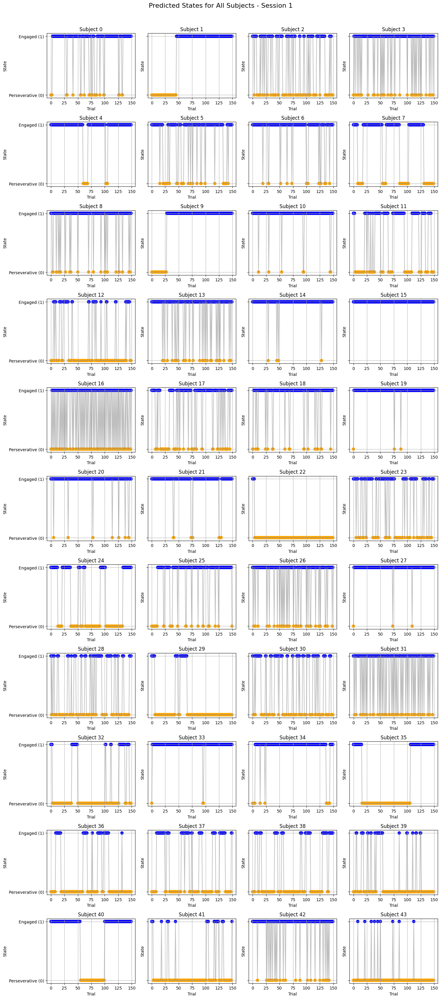

In [398]:
session1_data = predicted_states[predicted_states['session'] == 1]

# Get unique subjects
unique_subjects = session1_data['subject'].unique()

# Define the number of rows and columns for subplots
num_subjects = len(unique_subjects)
cols = 4  # Define number of columns
rows = -(-num_subjects // cols)  # Calculate rows needed (ceil division)

# Create a large figure with subplots
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3), sharey=True)
axes = axes.flatten()  # Flatten axes array for easy indexing

# Loop through each subject and plot in its subplot
for i, subject in enumerate(unique_subjects):
    # Filter data for the current subject
    subject_data = session1_data[session1_data['subject'] == subject].reset_index()
    
    # Map predicted states to colors
    colors = subject_data['predicted_states'].map({0: 'orange', 1: 'blue'})
    
    # Scatter plot with lines
    axes[i].scatter(subject_data.index, subject_data['predicted_states'], c=colors, s=50)
    axes[i].plot(subject_data.index, subject_data['predicted_states'], linestyle='-', color='gray', alpha=0.5)
    
    # Add titles and labels
    axes[i].set_title(f"Subject {subject}")
    axes[i].set_xlabel("Trial")
    axes[i].set_ylabel("State")
    axes[i].set_yticks([0, 1])
    axes[i].set_yticklabels(["Perseverative (0)", "Engaged (1)"])
    axes[i].grid(True)

# Turn off empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.suptitle("Predicted States for All Subjects - Session 1", y=1.02, fontsize=16)
plt.show()


In [36]:
new_revcor = pd.concat([new_revcor, final_summary_df[['stim_1','stim_2']]], axis=1)
new_revcor

,type,session,subject,responses,stim_diff,predicted_states,kernel_ci,kernel_glm,kernel_hmm,internal_noise_dp,...,internal_noise_old,kernel_ci_values,kernel_glm_values,kernel_hmm_values,trial_difficulty,trans2per,trans2eng,nbr_resp_iden,stim_1,stim_2
0,controls,1,0,1,[169.348324 -16.362536 62.457522 9.423951 ...,0,0.956869,0.964552,0.937447,1.0,...,0.85,"[0.02158835646258444, 0.17046864635815637, -0....","[-0.10775430745353104, 0.1913803120784971, -0....","[-0.30178998160193804, 0.09142075869123255, -0...",-86.680293,0,0,0,"[-84.088119, 11.67797, 70.948823, 101.030552, ...","[85.260205, -4.684566, 133.406345, 110.454503,..."
1,controls,1,0,1,[ -96.492526 -124.4527 -276.540197 -112.2773...,0,0.956869,0.964552,0.937447,1.0,...,0.85,"[0.02158835646258444, 0.17046864635815637, -0....","[-0.10775430745353104, 0.1913803120784971, -0....","[-0.30178998160193804, 0.09142075869123255, -0...",-153.942013,0,0,1,"[-36.418372, 84.104587, 132.070943, -36.088233...","[-132.910898, -40.348113, -144.469254, -148.36..."
2,controls,1,0,1,[ -53.626389 -34.446343 23.901545 14.8611...,0,0.956869,0.964552,0.937447,1.0,...,0.85,"[0.02158835646258444, 0.17046864635815637, -0....","[-0.10775430745353104, 0.1913803120784971, -0....","[-0.30178998160193804, 0.09142075869123255, -0...",-293.368846,0,0,2,"[27.345676, 118.378449, 35.467907, -5.979973, ...","[-26.280713, 83.932106, 59.369452, 8.881156, 3..."
3,controls,1,0,0,[-15.452448 -46.143456 40.069334 73.841401 2...,1,0.956869,0.964552,0.937447,1.0,...,0.85,"[0.02158835646258444, 0.17046864635815637, -0....","[-0.10775430745353104, 0.1913803120784971, -0....","[-0.30178998160193804, 0.09142075869123255, -0...",79.913104,0,1,0,"[-38.971396, 127.210639, -100.465383, -139.526...","[-54.423844, 81.067183, -60.396049, -65.685418..."
4,controls,1,0,1,[ 30.930532 -119.892847 -229.025108 -127.9158...,1,0.956869,0.964552,0.937447,1.0,...,0.85,"[0.02158835646258444, 0.17046864635815637, -0....","[-0.10775430745353104, 0.1913803120784971, -0....","[-0.30178998160193804, 0.09142075869123255, -0...",745.475245,0,0,0,"[92.610651, 40.250954, 99.988333, 115.543405, ...","[123.541183, -79.641893, -129.036775, -12.3724..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11695,patients,4,43,1,[ 56.62049 -6.550564 35.6587 54.662277 -...,0,0.494824,0.462278,0.515626,2.3,...,2.70,"[-0.2037882639124794, -0.22302537007254294, -0...","[0.439271864936895, -0.5868817727876948, -0.53...","[0.7747499376995093, -1.3870124269728143, -0.8...",-130.880712,0,0,42,"[-48.148294, 20.256697, 16.104065, -85.896309,...","[8.472196, 13.706133, 51.762765, -31.234032, 9..."
11696,patients,4,43,1,[-226.25371 -0.782702 136.846572 -29.4819...,0,0.494824,0.462278,0.515626,2.3,...,2.70,"[-0.2037882639124794, -0.22302537007254294, -0...","[0.439271864936895, -0.5868817727876948, -0.53...","[0.7747499376995093, -1.3870124269728143, -0.8...",-479.183018,0,0,43,"[120.707918, 8.970095, -87.383718, -110.362646...","[-105.545792, 8.187393, 49.462854, -139.844561..."
11697,patients,4,43,1,[-101.018981 -108.077897 -70.100066 52.0863...,0,0.494824,0.462278,0.515626,2.3,...,2.70,"[-0.2037882639124794, -0.22302537007254294, -0...","[0.439271864936895, -0.5868817727876948, -0.53...","[0.7747499376995093, -1.3870124269728143, -0.8...",134.940085,0,0,44,"[68.610613, 132.540723, -4.163706, -102.934298...","[-32.408368, 24.462826, -74.263772, -50.847983..."
11698,patients,4,43,0,[ 6.29866960e+01 1.43247580e+02 -1.68244675e+...,1,0.494824,0.462278,0.515626,2.3,...,2.70,"[-0.2037882639124794, -0.22302537007254294, -0...","[0.439271864936895, -0.5868817727876948, -0.53...","[0.7747499376995093, -1.3870124269728143, -0.8...",-301.528854,0,1,0,"[-66.891646, -173.886417, 148.110696, -91.3524...","[-3.90495, -30.638837, -20.133979, -91.423011,..."


In [50]:
columns_to_process = ['stim_1', 'stim_2', 'kernel_hmm_values']

for col in columns_to_process:
    new_revcor[col] = new_revcor[col].apply(lambda x: np.array(x, dtype=float))

In [52]:
def calculate_expected_response(row):
    activity_0 = abs(np.dot(row['kernel_hmm_values'], row['stim_1']))
    activity_1 = abs(np.dot(row['kernel_hmm_values'], row['stim_2']))
    return 1 if activity_1 > activity_0 else 0

new_revcor['expected_response'] = new_revcor.apply(calculate_expected_response, axis=1)
new_revcor

,type,session,subject,responses,stim_diff,predicted_states,kernel_ci,kernel_glm,kernel_hmm,internal_noise_dp,...,kernel_ci_values,kernel_glm_values,kernel_hmm_values,trial_difficulty,trans2per,trans2eng,nbr_resp_iden,stim_1,stim_2,expected_response
0,controls,1,0,1,[169.348324 -16.362536 62.457522 9.423951 ...,0,0.956869,0.964552,0.937447,1.0,...,"[0.02158835646258444, 0.17046864635815637, -0....","[-0.10775430745353104, 0.1913803120784971, -0....","[-0.30178998160193804, 0.09142075869123255, -0...",-86.680293,0,0,0,"[-84.088119, 11.67797, 70.948823, 101.030552, ...","[85.260205, -4.684566, 133.406345, 110.454503,...",0
1,controls,1,0,1,[ -96.492526 -124.4527 -276.540197 -112.2773...,0,0.956869,0.964552,0.937447,1.0,...,"[0.02158835646258444, 0.17046864635815637, -0....","[-0.10775430745353104, 0.1913803120784971, -0....","[-0.30178998160193804, 0.09142075869123255, -0...",-153.942013,0,0,1,"[-36.418372, 84.104587, 132.070943, -36.088233...","[-132.910898, -40.348113, -144.469254, -148.36...",0
2,controls,1,0,1,[ -53.626389 -34.446343 23.901545 14.8611...,0,0.956869,0.964552,0.937447,1.0,...,"[0.02158835646258444, 0.17046864635815637, -0....","[-0.10775430745353104, 0.1913803120784971, -0....","[-0.30178998160193804, 0.09142075869123255, -0...",-293.368846,0,0,2,"[27.345676, 118.378449, 35.467907, -5.979973, ...","[-26.280713, 83.932106, 59.369452, 8.881156, 3...",1
3,controls,1,0,0,[-15.452448 -46.143456 40.069334 73.841401 2...,1,0.956869,0.964552,0.937447,1.0,...,"[0.02158835646258444, 0.17046864635815637, -0....","[-0.10775430745353104, 0.1913803120784971, -0....","[-0.30178998160193804, 0.09142075869123255, -0...",79.913104,0,1,0,"[-38.971396, 127.210639, -100.465383, -139.526...","[-54.423844, 81.067183, -60.396049, -65.685418...",1
4,controls,1,0,1,[ 30.930532 -119.892847 -229.025108 -127.9158...,1,0.956869,0.964552,0.937447,1.0,...,"[0.02158835646258444, 0.17046864635815637, -0....","[-0.10775430745353104, 0.1913803120784971, -0....","[-0.30178998160193804, 0.09142075869123255, -0...",745.475245,0,0,0,"[92.610651, 40.250954, 99.988333, 115.543405, ...","[123.541183, -79.641893, -129.036775, -12.3724...",1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11695,patients,4,43,1,[ 56.62049 -6.550564 35.6587 54.662277 -...,0,0.494824,0.462278,0.515626,2.3,...,"[-0.2037882639124794, -0.22302537007254294, -0...","[0.439271864936895, -0.5868817727876948, -0.53...","[0.7747499376995093, -1.3870124269728143, -0.8...",-130.880712,0,0,42,"[-48.148294, 20.256697, 16.104065, -85.896309,...","[8.472196, 13.706133, 51.762765, -31.234032, 9...",0
11696,patients,4,43,1,[-226.25371 -0.782702 136.846572 -29.4819...,0,0.494824,0.462278,0.515626,2.3,...,"[-0.2037882639124794, -0.22302537007254294, -0...","[0.439271864936895, -0.5868817727876948, -0.53...","[0.7747499376995093, -1.3870124269728143, -0.8...",-479.183018,0,0,43,"[120.707918, 8.970095, -87.383718, -110.362646...","[-105.545792, 8.187393, 49.462854, -139.844561...",1
11697,patients,4,43,1,[-101.018981 -108.077897 -70.100066 52.0863...,0,0.494824,0.462278,0.515626,2.3,...,"[-0.2037882639124794, -0.22302537007254294, -0...","[0.439271864936895, -0.5868817727876948, -0.53...","[0.7747499376995093, -1.3870124269728143, -0.8...",134.940085,0,0,44,"[68.610613, 132.540723, -4.163706, -102.934298...","[-32.408368, 24.462826, -74.263772, -50.847983...",1
11698,patients,4,43,0,[ 6.29866960e+01 1.43247580e+02 -1.68244675e+...,1,0.494824,0.462278,0.515626,2.3,...,"[-0.2037882639124794, -0.22302537007254294, -0...","[0.439271864936895, -0.5868817727876948, -0.53...","[0.7747499376995093, -1.3870124269728143, -0.8...",-301.528854,0,1,0,"[-66.891646, -173.886417, 148.110696, -91.3524...","[-3.90495, -30.638837, -20.133979, -91.423011,...",1


In [80]:
# new_revcor['correct_prediction'] = new_revcor['expected_response'] == new_revcor['responses']
new_revcor

,type,session,subject,responses,stim_diff,predicted_states,kernel_ci,kernel_glm,kernel_hmm,internal_noise_dp,...,kernel_hmm_values,trial_difficulty,trans2per,trans2eng,nbr_resp_iden,stim_1,stim_2,expected_response,correct_prediction,nbr_resp_iden_expec
0,controls,1,0,1,[169.348324 -16.362536 62.457522 9.423951 ...,0,0.956869,0.964552,0.937447,1.0,...,"[-0.30178998160193804, 0.09142075869123255, -0...",-86.680293,0,0,0,"[-84.088119, 11.67797, 70.948823, 101.030552, ...","[85.260205, -4.684566, 133.406345, 110.454503,...",0,False,0
1,controls,1,0,1,[ -96.492526 -124.4527 -276.540197 -112.2773...,0,0.956869,0.964552,0.937447,1.0,...,"[-0.30178998160193804, 0.09142075869123255, -0...",-153.942013,0,0,1,"[-36.418372, 84.104587, 132.070943, -36.088233...","[-132.910898, -40.348113, -144.469254, -148.36...",0,False,1
2,controls,1,0,1,[ -53.626389 -34.446343 23.901545 14.8611...,0,0.956869,0.964552,0.937447,1.0,...,"[-0.30178998160193804, 0.09142075869123255, -0...",-293.368846,0,1,2,"[27.345676, 118.378449, 35.467907, -5.979973, ...","[-26.280713, 83.932106, 59.369452, 8.881156, 3...",1,True,0
3,controls,1,0,0,[-15.452448 -46.143456 40.069334 73.841401 2...,1,0.956869,0.964552,0.937447,1.0,...,"[-0.30178998160193804, 0.09142075869123255, -0...",79.913104,0,0,0,"[-38.971396, 127.210639, -100.465383, -139.526...","[-54.423844, 81.067183, -60.396049, -65.685418...",1,False,1
4,controls,1,0,1,[ 30.930532 -119.892847 -229.025108 -127.9158...,1,0.956869,0.964552,0.937447,1.0,...,"[-0.30178998160193804, 0.09142075869123255, -0...",745.475245,0,0,0,"[92.610651, 40.250954, 99.988333, 115.543405, ...","[123.541183, -79.641893, -129.036775, -12.3724...",1,True,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11695,patients,4,43,1,[ 56.62049 -6.550564 35.6587 54.662277 -...,0,0.494824,0.462278,0.515626,2.3,...,"[0.7747499376995093, -1.3870124269728143, -0.8...",-130.880712,0,0,42,"[-48.148294, 20.256697, 16.104065, -85.896309,...","[8.472196, 13.706133, 51.762765, -31.234032, 9...",0,False,3
11696,patients,4,43,1,[-226.25371 -0.782702 136.846572 -29.4819...,0,0.494824,0.462278,0.515626,2.3,...,"[0.7747499376995093, -1.3870124269728143, -0.8...",-479.183018,0,0,43,"[120.707918, 8.970095, -87.383718, -110.362646...","[-105.545792, 8.187393, 49.462854, -139.844561...",1,True,0
11697,patients,4,43,1,[-101.018981 -108.077897 -70.100066 52.0863...,0,0.494824,0.462278,0.515626,2.3,...,"[0.7747499376995093, -1.3870124269728143, -0.8...",134.940085,0,1,44,"[68.610613, 132.540723, -4.163706, -102.934298...","[-32.408368, 24.462826, -74.263772, -50.847983...",1,True,1
11698,patients,4,43,0,[ 6.29866960e+01 1.43247580e+02 -1.68244675e+...,1,0.494824,0.462278,0.515626,2.3,...,"[0.7747499376995093, -1.3870124269728143, -0.8...",-301.528854,0,0,0,"[-66.891646, -173.886417, 148.110696, -91.3524...","[-3.90495, -30.638837, -20.133979, -91.423011,...",1,False,2


In [200]:
new_revcor.groupby(['type','session'])['correct_prediction'].mean()
# print(new_revcor[(new_revcor.predicted_states==0)&(new_revcor.trans2eng==1)].groupby(['trans2eng','type'])['correct_prediction'].mean())

type      session
controls  1          0.504848
          2          0.520952
patients  1          0.487879
          2          0.492593
          3          0.479259
          4          0.477778
Name: correct_prediction, dtype: float64

In [75]:
accuracy_by_subject = new_revcor.groupby(['subject','session'])['correct_prediction'].mean()
accuracy_by_subject.head(60)

subject  session
0        1          0.526667
1        1          0.460000
2        1          0.466667
3        1          0.466667
4        1          0.566667
5        1          0.526667
6        1          0.486667
7        1          0.453333
8        1          0.460000
9        1          0.486667
10       1          0.520000
11       1          0.493333
12       1          0.566667
13       1          0.493333
14       1          0.526667
15       1          0.473333
         2          0.520000
16       1          0.566667
         2          0.520000
17       1          0.580000
         2          0.513333
18       1          0.460000
         2          0.493333
19       1          0.466667
         2          0.520000
20       1          0.526667
         2          0.586667
21       1          0.533333
         2          0.493333
22       1          0.500000
23       1          0.453333
24       1          0.573333
25       1          0.433333
26       1          0.4600

In [149]:
new_revcor_measures=new_revcor_measures.merge(kernels_unexploded[['subject', 'type','session','kernel_ci_values', 'kernel_glm_values','kernel_hmm_values']], on=['subject', 'type','session'], how='left')

In [ ]:
new_revcor=new_revcor_measures[['subject', 'session', 'type', 'kernel_ci', 'kernel_glm', 'kernel_hmm', 'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm', 'transition_per', 'transition_unper', 'internal_noise_old', 'kernel_ci_values', 'kernel_glm_values','kernel_hmm_values']]

In [ ]:
predicted_states_new=pd.concat([final_summary_df, predicted_states[['predicted_states']]], axis=1)
new_revcor=predicted_states_new.merge(new_revcor, on=['subject','session','type'], how='left')

In [286]:
new_revcor["trial_difficulty"] = new_revcor.apply(
    lambda row: abs(np.dot(row["stim_diff"], row["kernel_hmm_values"])),
    axis=1
)

In [19]:
new_revcor.columns

Index(['type', 'session', 'subject', 'responses', 'stim_diff',
       'predicted_states', 'kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm',
       'transition_per', 'transition_unper', 'internal_noise_old',
       'kernel_ci_values', 'kernel_glm_values', 'kernel_hmm_values',
       'trial_difficulty', 'trans2per', 'trans2eng', 'nbr_resp_iden',
       'criteria'],
      dtype='object')

In [63]:
new_revcor['trans2per'] = 0

for (subject, session), group in new_revcor.groupby(['subject', 'session']):
    for i in range(len(group) - 1):
        current_state = group.iloc[i]['predicted_states']
        next_state = group.iloc[i + 1]['predicted_states']
        if current_state == 1 and next_state == 0:
            new_revcor.loc[group.index[i], 'trans2per'] = 1

In [64]:
new_revcor['trans2eng'] = 0

for (subject, session), group in new_revcor.groupby(['subject', 'session']):
    for i in range(len(group) - 1):
        current_state = group.iloc[i]['predicted_states']
        next_state = group.iloc[i + 1]['predicted_states']
        if current_state == 0 and next_state == 1:
            new_revcor.loc[group.index[i], 'trans2eng'] = 1

In [78]:
def count_consecutive_identical_responses(response_series):
    count = 0
    counts_list = []
    prev_response = None
    for response in response_series:
        if response == prev_response:
            count += 1
        else:
            count = 0  
        counts_list.append(count)
        prev_response = response
    return counts_list

# new_revcor['nbr_resp_iden'] = new_revcor.groupby(['subject', 'session'])['responses'].transform(
#     count_consecutive_identical_responses
# )

In [79]:
new_revcor['nbr_resp_iden_expec'] = new_revcor.groupby(['subject', 'session'])['expected_response'].transform(
    count_consecutive_identical_responses
)

In [405]:
print(new_revcor[(new_revcor.subject == 2)&(new_revcor.session == 1)].predicted_states.values)
print(new_revcor[(new_revcor.subject == 2)&(new_revcor.session == 1)].trans2per.values)
print(new_revcor[(new_revcor.subject == 2)&(new_revcor.session == 1)].trans2eng.values)



[1 1 1 0 1 1 1 1 0 0 0 0 0 0 1 0 1 1 1 0 1 1 0 1 1 1 0 0 0 1 1 1 1 1 0 1 1
 1 0 0 0 0 0 0 1 1 1 0 0 1 1 1 1 1 1 1 0 0 0 0 0 0 0 1 1 1 0 1 1 0 0 0 1 1
 1 0 1 1 1 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 1 0 0 1 1 1
 1 1 0 0 0 0 0 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 1 0 1 1 0
 0 0]
[0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0
 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0
 0 0]
[0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0
 0 0]


In [249]:
print(new_revcor[(new_revcor.subject == 2)&(new_revcor.session == 1)].responses.values)
print(new_revcor[(new_revcor.subject == 2)&(new_revcor.session == 1)].nbr_resp_iden.values)


[0 0 1 1 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 1 1 1 1 1 0 0 0 0 0 0 0 1 1 0 1 0 1 1 1 1 1 1 1 1 0 0 0 0 0 1 1 1 0 0
 0 0 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 0 0 1 1 1 1 1 0 0 0 1 1 0 0 1
 0 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 1 1 1 1 1 1 1 1 1 0 1 0 0 0
 1 1]
[ 0  1  0  1  0  0  1  0  1  2  3  4  5  6  7  8  0  0  1  2  3  4  5  6
  7  8  9 10  0  0  1  2  3  4  5  6  7  8  9  0  1  2  3  4  0  1  2  3
  4  5  6  0  1  0  0  0  0  1  2  3  4  5  6  7  0  1  2  3  4  0  1  2
  0  1  2  3  4  0  0  0  1  2  3  4  5  6  7  0  0  1  2  3  4  5  6  0
  1  2  0  1  2  3  4  0  1  2  0  1  0  1  0  0  0  1  2  3  4  5  6  0
  1  2  3  4  5  6  7  0  0  0  1  0  1  2  0  1  2  3  4  5  6  7  8  0
  0  0  1  2  0  1]


KstestResult(statistic=0.03568743407053631, pvalue=0.7519488648955818)

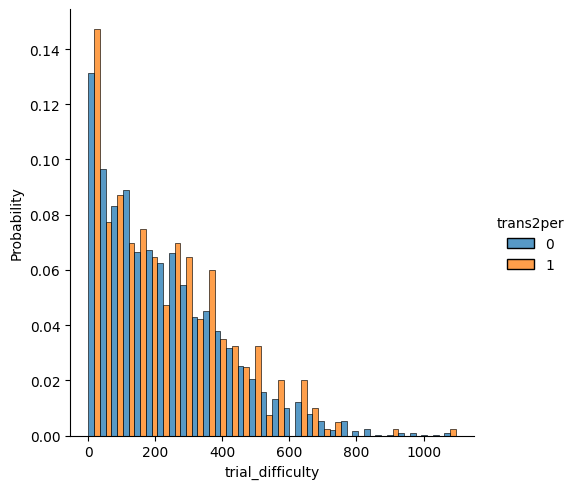

In [500]:
sns.displot(data=filtered_data_patients[(filtered_data_patients.predicted_states==1)], 
            x="trial_difficulty", kind="hist", fill=True, hue='trans2per', stat='probability', common_norm=False, multiple='dodge') 

from scipy import stats
stats.kstest(filtered_data_patients[(filtered_data_patients.predicted_states==1)&(filtered_data_patients.trans2per==1)].trial_difficulty,
             filtered_data_patients[(filtered_data_patients.predicted_states==1)&(filtered_data_patients.trans2per==0)].trial_difficulty)


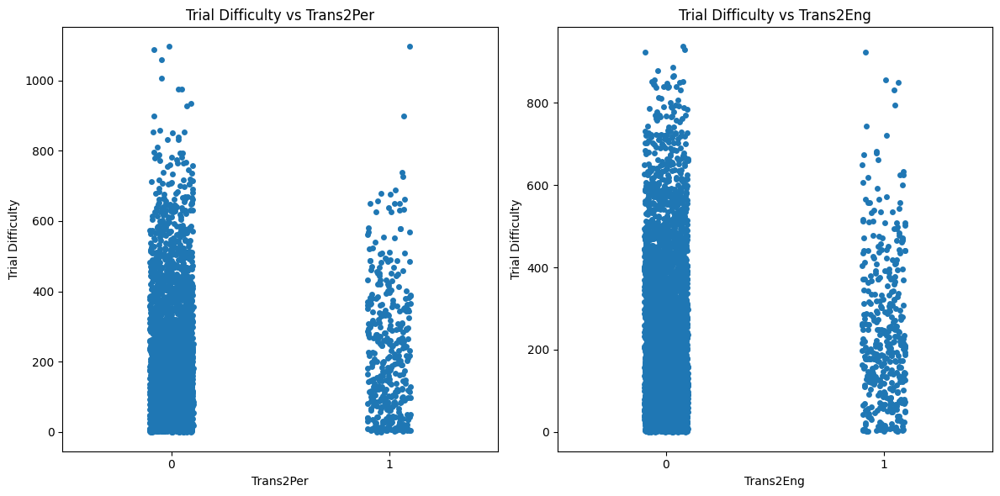

In [410]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))  

sns.stripplot(
    data=,filtered_data_patients[filtered_data_patients.predicted_states==1]
    x="trans2per", 
    y="trial_difficulty",
    ax=axes[0],dodge=True, jitter=True 
)
axes[0].set_title("Trial Difficulty vs Trans2Per")
axes[0].set_xlabel("Trans2Per")
axes[0].set_ylabel("Trial Difficulty")

sns.stripplot(
    data=filtered_data_patients[filtered_data_patients.predicted_states==0],
    x="trans2eng", 
    y="trial_difficulty",
    ax=axes[1],dodge=True, jitter=True   
)
axes[1].set_title("Trial Difficulty vs Trans2Eng")
axes[1].set_xlabel("Trans2Eng")
axes[1].set_ylabel("Trial Difficulty")

plt.tight_layout()
plt.show()

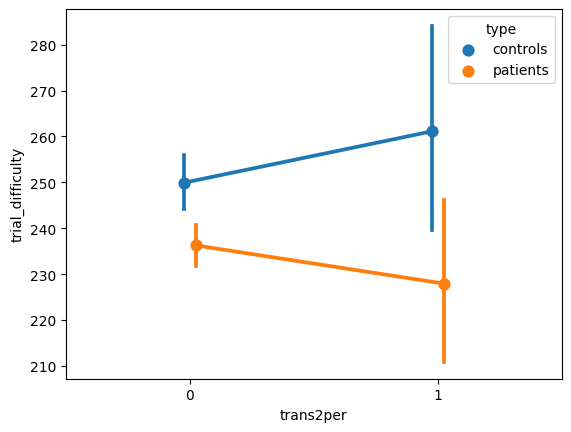

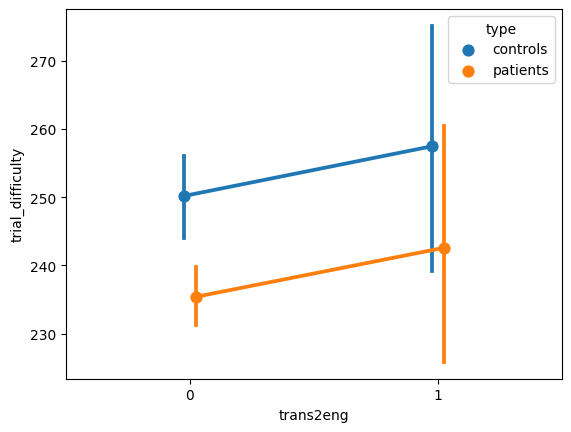

In [524]:
sns.pointplot(
    data=new_revcor,
    x="trans2per", 
    y="trial_difficulty",hue='type',
dodge=True, 
)
plt.show()

sns.pointplot(
    data=new_revcor,
    x="trans2eng", 
    y="trial_difficulty",hue='type',
dodge=True, 
)
plt.show()


<AxesSubplot: xlabel='predicted_states', ylabel='nbr_resp_iden'>

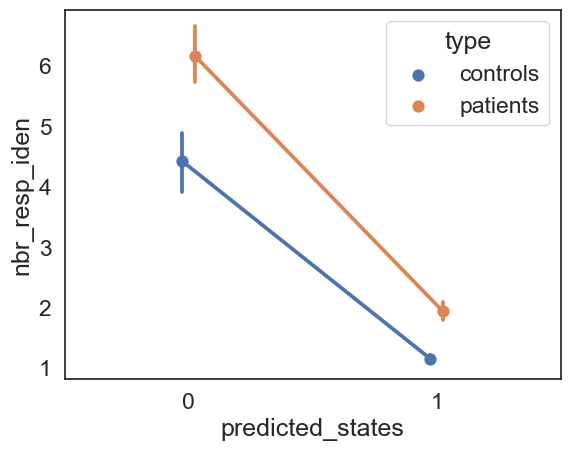

In [204]:
sns.pointplot(
    data=new_revcor,
    x="predicted_states", 
    y="nbr_resp_iden",hue='type',
dodge=True, 
)

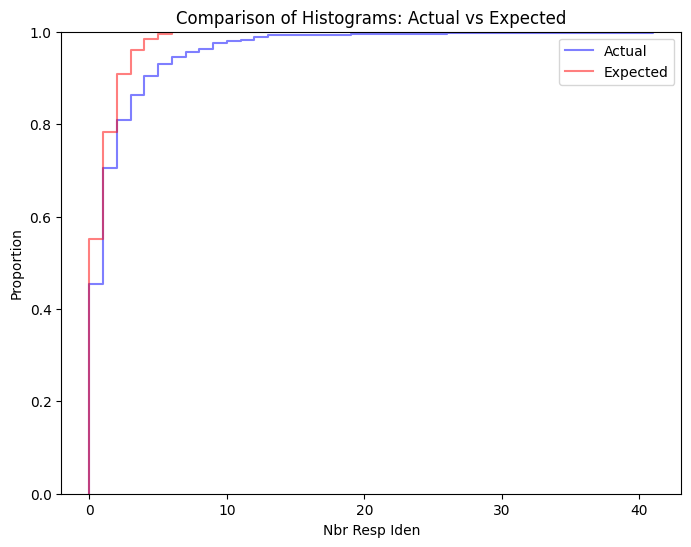

In [ ]:
plt.figure(figsize=(8, 6))
sns.ecdfplot(data=new_revcor[(new_revcor.predicted_states == 1) & (new_revcor.trans2per == 1) & (new_revcor.type == 'patients')],
    x="nbr_resp_iden", stat='proportion', color='blue', alpha=0.5,label="Actual")

sns.ecdfplot(data=new_revcor[(new_revcor.predicted_states == 1) & (new_revcor.trans2per == 1) & (new_revcor.type == 'patients')],
    x="nbr_resp_iden_expec", stat='proportion', color='red', alpha=0.5, label="Expected")
plt.title("Comparison of Histograms: Actual vs Expected")
plt.xlabel("Nbr Resp Iden")
plt.ylabel("Proportion")
plt.legend()
plt.show()

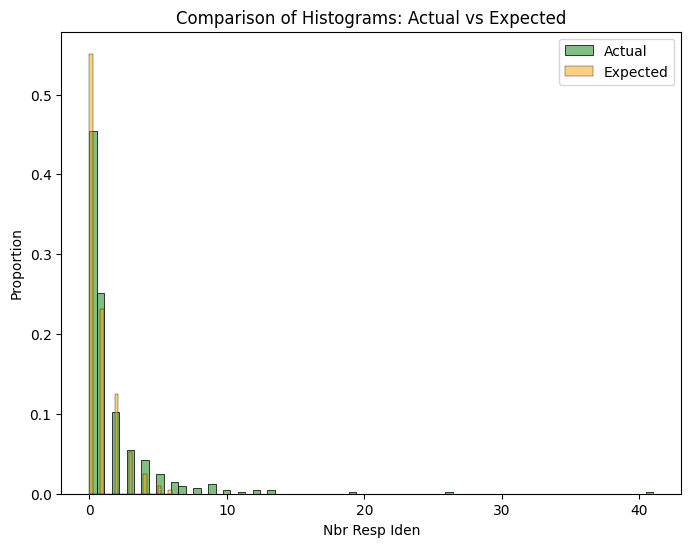

KS Statistic: 0.09975062344139651
P-Value: 0.036937383873266554


In [96]:
from scipy.stats import ks_2samp

plt.figure(figsize=(8, 6))
sns.histplot(data=new_revcor[(new_revcor.predicted_states == 1) & (new_revcor.trans2per == 1) & (new_revcor.type == 'patients')],
    x="nbr_resp_iden", stat='proportion', color='green', alpha=0.5,label="Actual")

sns.histplot(data=new_revcor[(new_revcor.predicted_states == 1) & (new_revcor.trans2per == 1) & (new_revcor.type == 'patients')],
    x="nbr_resp_iden_expec", stat='proportion', color='orange', alpha=0.5, label="Expected")
plt.title("Comparison of Histograms: Actual vs Expected")
plt.xlabel("Nbr Resp Iden")
plt.ylabel("Proportion")
plt.legend()
plt.show()

subset_data = new_revcor[(new_revcor.predicted_states == 1) & (new_revcor.trans2per == 1) & (new_revcor.type == 'patients')]

actual_responses = subset_data['nbr_resp_iden'].dropna()
expected_responses = subset_data['nbr_resp_iden_expec'].dropna()
ks_stat, p_value = ks_2samp(actual_responses, expected_responses)
print(f"KS Statistic: {ks_stat}")
print(f"P-Value: {p_value}")

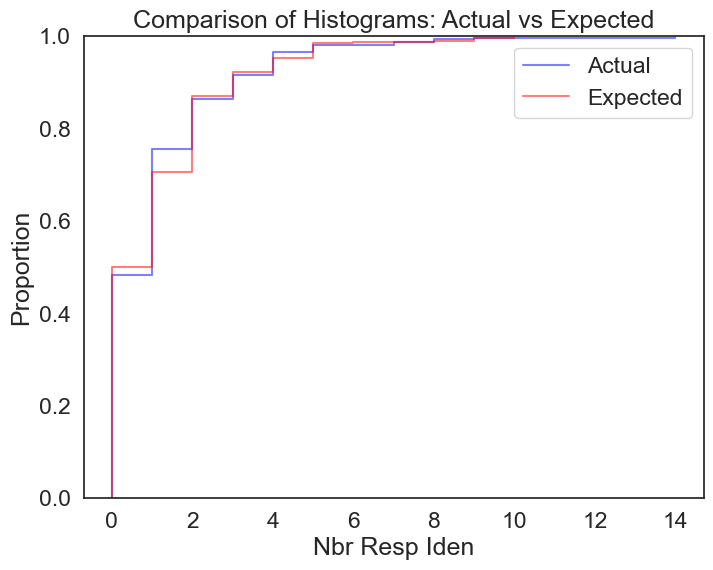

In [208]:
plt.figure(figsize=(8, 6))
sns.ecdfplot(data=new_revcor[(new_revcor.predicted_states == 1) & (new_revcor.trans2per == 1) & (new_revcor.type == 'controls')],
    x="nbr_resp_iden", stat='proportion', color='blue', alpha=0.5,label="Actual")

sns.ecdfplot(data=new_revcor[(new_revcor.predicted_states == 1) & (new_revcor.trans2per == 1) & (new_revcor.type == 'controls')],
    x="nbr_resp_iden_expec", stat='proportion', color='red', alpha=0.5, label="Expected")
plt.title("Comparison of Histograms: Actual vs Expected")
plt.xlabel("Nbr Resp Iden")
plt.ylabel("Proportion")
plt.legend()
plt.show()

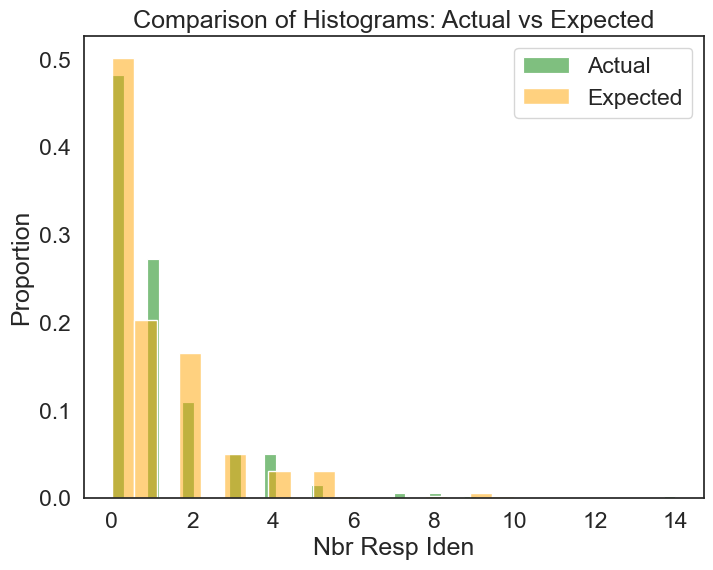

KS Statistic: 0.050156739811912224
P-Value: 0.817982786937858


In [209]:
from scipy.stats import ks_2samp

plt.figure(figsize=(8, 6))
sns.histplot(data=new_revcor[(new_revcor.predicted_states == 1) & (new_revcor.trans2per == 1) & (new_revcor.type == 'controls')],
    x="nbr_resp_iden", stat='proportion', color='green', alpha=0.5,label="Actual")

sns.histplot(data=new_revcor[(new_revcor.predicted_states == 1) & (new_revcor.trans2per == 1) & (new_revcor.type == 'controls')],
    x="nbr_resp_iden_expec", stat='proportion', color='orange', alpha=0.5, label="Expected")
plt.title("Comparison of Histograms: Actual vs Expected")
plt.xlabel("Nbr Resp Iden")
plt.ylabel("Proportion")
plt.legend()
plt.show()

subset_data = new_revcor[(new_revcor.predicted_states == 1) & (new_revcor.trans2per == 1) & (new_revcor.type == 'controls')]

actual_responses = subset_data['nbr_resp_iden'].dropna()
expected_responses = subset_data['nbr_resp_iden_expec'].dropna()
ks_stat, p_value = ks_2samp(actual_responses, expected_responses)
print(f"KS Statistic: {ks_stat}")
print(f"P-Value: {p_value}")

In [506]:
new_revcor[(new_revcor.type=='patients')&(new_revcor.predicted_states==1)&(new_revcor.trans2per==1)&(new_revcor.nbr_resp_iden>6)].groupby(['subject','session']).subject.count()

subject  session
23       1          2
24       1          2
31       1          4
34       1          1
35       1          1
38       1          1
         2          3
         4          1
41       1          1
42       1          2
43       3          2
         4          2
Name: subject, dtype: int64

KS Statistic: 0.4538653366583541, P-Value: 2.290540641468117e-15
The distributions are significantly different.
Anderson-Darling Statistic: 47.97544766867114, P-Value: 0.001


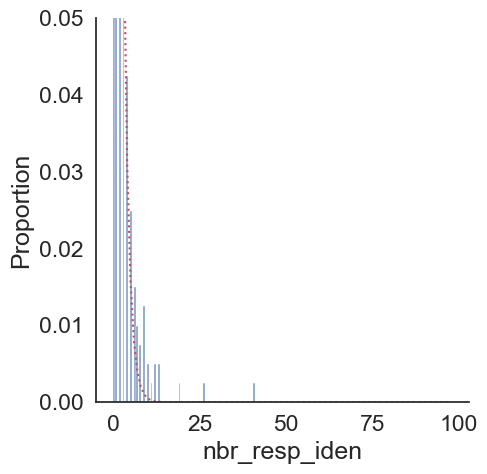

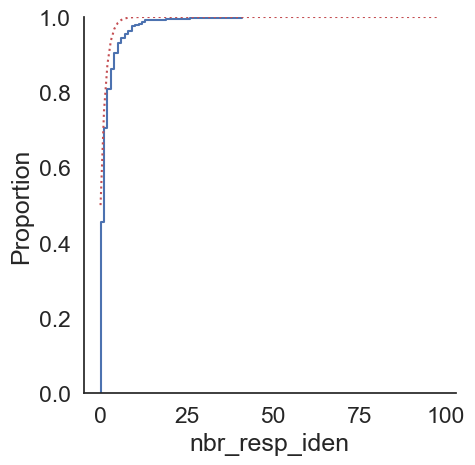

In [205]:
pdf_null = 0.5 ** np.arange(1,100)
cdf_null = pdf_null.cumsum()

sns.displot(data=new_revcor[(new_revcor.predicted_states==1)&(new_revcor.trans2per==1)&(new_revcor.type=='patients')], x="nbr_resp_iden", kind="hist", stat='proportion') 
plt.plot(pdf_null, 'r:')
plt.ylim([0,0.05])


sns.displot(data=new_revcor[(new_revcor.predicted_states==1)&(new_revcor.trans2per==1)&(new_revcor.type=='patients')], x="nbr_resp_iden", kind="ecdf", stat='proportion') 
plt.plot(cdf_null, 'r:')

from scipy import stats
stats.kstest(new_revcor[(new_revcor.predicted_states==1)&(new_revcor.trans2per==1)&(new_revcor.type=='patients')].nbr_resp_iden,
             cdf_null)

from scipy.stats import ks_2samp
from scipy.stats import anderson_ksamp


sample1 = new_revcor[
    (new_revcor.predicted_states == 1) & 
    (new_revcor.trans2per == 1)&(new_revcor.type=='patients')
]["nbr_resp_iden"]

# Perform KS test
ks_stat, p_value = ks_2samp(sample1, cdf_null)
print(f"KS Statistic: {ks_stat}, P-Value: {p_value}")
if p_value < 0.05:
    print("The distributions are significantly different.")
else:
    print("The distributions are not significantly different.")
result = anderson_ksamp([sample1, cdf_null])
print(f"Anderson-Darling Statistic: {result.statistic}, P-Value: {result.significance_level}")

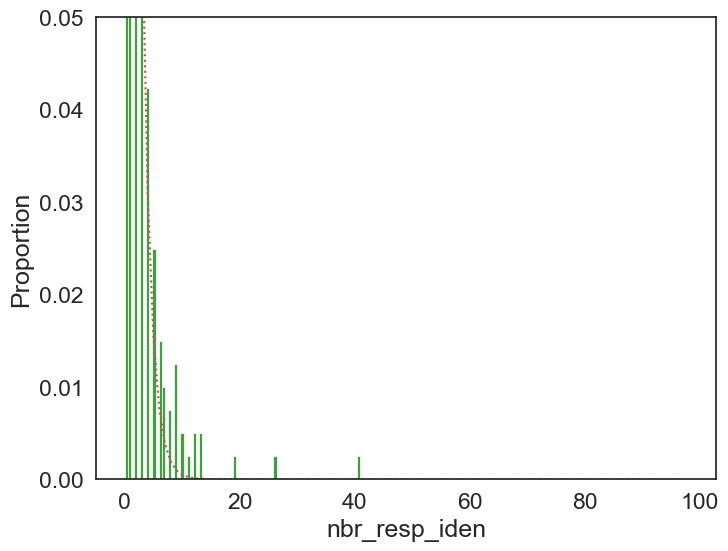

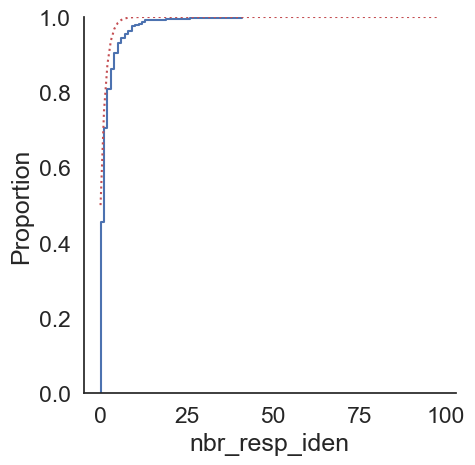

In [216]:
pdf_null = 0.5 ** np.arange(1,100)
cdf_null = pdf_null.cumsum()

plt.figure(figsize=(8, 6))
sns.histplot(data=new_revcor[(new_revcor.predicted_states==1)&(new_revcor.trans2per==1)&(new_revcor.type=='patients')], x="nbr_resp_iden", stat='proportion', color='green')
plt.plot(pdf_null, 'r:')
plt.ylim([0,0.05])
plt.show()



sns.displot(data=new_revcor[(new_revcor.predicted_states==1)&(new_revcor.trans2per==1)&(new_revcor.type=='patients')], x="nbr_resp_iden",kind="ecdf", stat='proportion') 
plt.plot(cdf_null, 'r:')
plt.show()



KS Statistic: 0.4827586206896552, P-Value: 1.4758471784322725e-16
The distributions are significantly different.
Anderson-Darling Statistic: 47.89785177378646, P-Value: 0.001


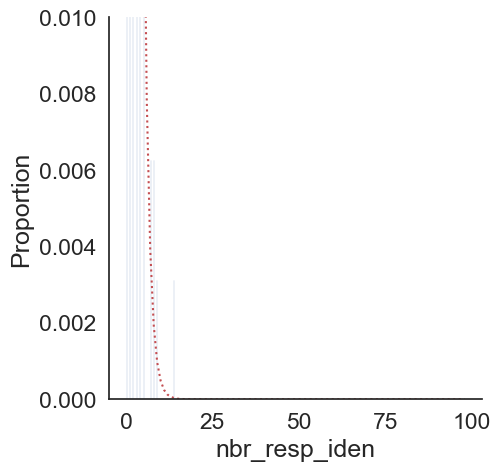

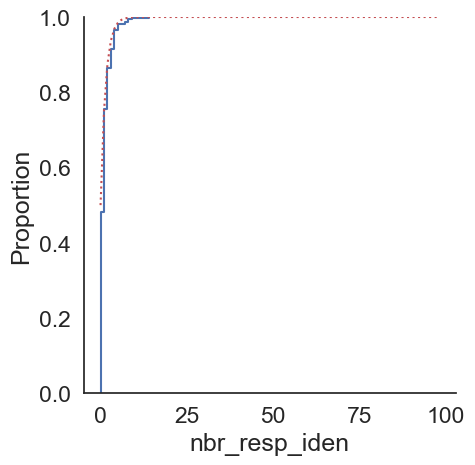

In [207]:
pdf_null = 0.5 ** np.arange(1,100)
cdf_null = pdf_null.cumsum()

sns.displot(data=new_revcor[(new_revcor.predicted_states==1)&(new_revcor.trans2per==1)&(new_revcor.type=='controls')], x="nbr_resp_iden", kind="hist", stat='proportion') 
plt.plot(pdf_null, 'r:')
plt.ylim([0,0.01])


sns.displot(data=new_revcor[(new_revcor.predicted_states==1)&(new_revcor.trans2per==1)&(new_revcor.type=='controls')], x="nbr_resp_iden", kind="ecdf", stat='proportion') 
plt.plot(cdf_null, 'r:')

from scipy import stats
stats.kstest(new_revcor[(new_revcor.predicted_states==1)&(new_revcor.trans2per==1)&(new_revcor.type=='controls')].nbr_resp_iden,
            cdf_null)



from scipy.stats import ks_2samp
from scipy.stats import anderson_ksamp


sample1 = new_revcor[
    (new_revcor.predicted_states == 1) & 
    (new_revcor.trans2per == 1)&(new_revcor.type=='controls')
]["nbr_resp_iden"]

# Perform KS test
ks_stat, p_value = ks_2samp(sample1, cdf_null)
print(f"KS Statistic: {ks_stat}, P-Value: {p_value}")
if p_value < 0.05:
    print("The distributions are significantly different.")
else:
    print("The distributions are not significantly different.")
result = anderson_ksamp([sample1, cdf_null])
print(f"Anderson-Darling Statistic: {result.statistic}, P-Value: {result.significance_level}")

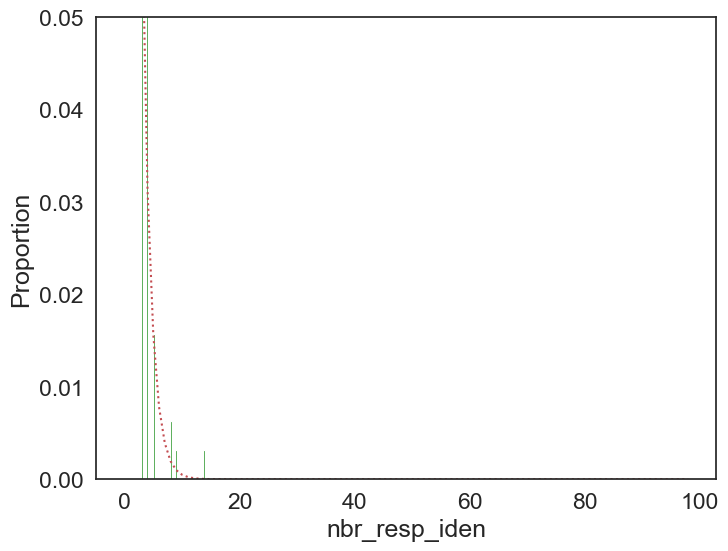

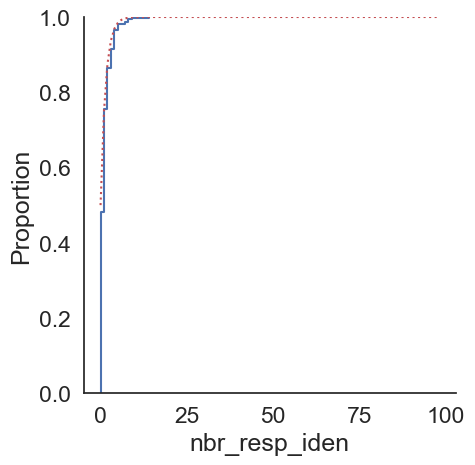

In [217]:
pdf_null = 0.5 ** np.arange(1,100)
cdf_null = pdf_null.cumsum()

plt.figure(figsize=(8, 6))
sns.histplot(data=new_revcor[(new_revcor.predicted_states==1)&(new_revcor.trans2per==1)&(new_revcor.type=='controls')], x="nbr_resp_iden", stat='proportion', color='green')
plt.plot(pdf_null, 'r:')
plt.ylim([0,0.05])
plt.show()



sns.displot(data=new_revcor[(new_revcor.predicted_states==1)&(new_revcor.trans2per==1)&(new_revcor.type=='controls')], x="nbr_resp_iden",kind="ecdf", stat='proportion') 
plt.plot(cdf_null, 'r:')
plt.show()


In [521]:
new_revcor[(new_revcor.type=='controls')&(new_revcor.predicted_states==1)&(new_revcor.trans2per==1)&(new_revcor.nbr_resp_iden>6)].groupby(['subject','session']).subject.count()

subject  session
2        1          3
3        1          1
6        1          1
20       1          1
Name: subject, dtype: int64

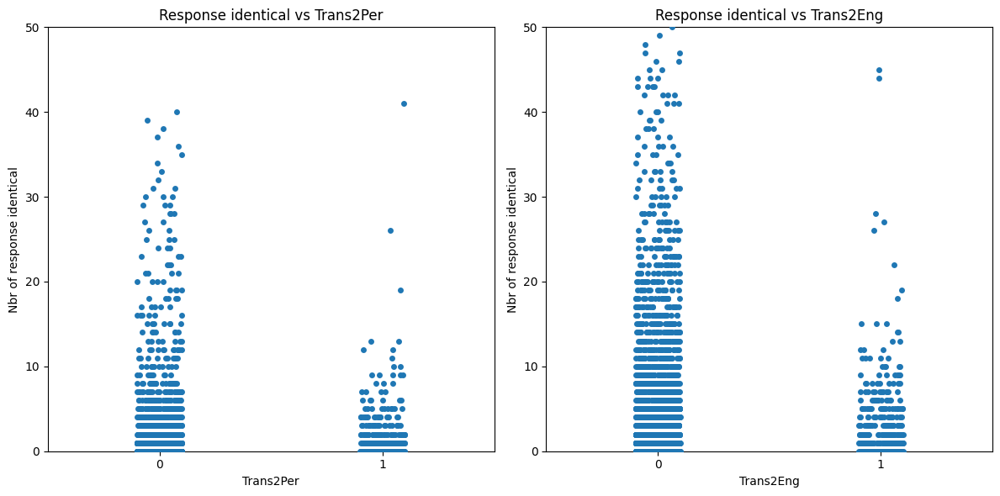

In [462]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))  

sns.stripplot(
    data=filtered_data_patients[filtered_data_patients.predicted_states==1],
    x="trans2per", 
    y="nbr_resp_iden",
    ax=axes[0],jitter=True 
)
axes[0].set_title("Response identical vs Trans2Per")
axes[0].set_xlabel("Trans2Per")
axes[0].set_ylabel("Nbr of response identical")
axes[0].set_ylim([0,50])

sns.stripplot(
    data=filtered_data_patients[filtered_data_patients.predicted_states==0],
    x="trans2eng", 
    y="nbr_resp_iden",
    ax=axes[1],jitter=True   
)
axes[1].set_title("Response identical vs Trans2Eng")
axes[1].set_xlabel("Trans2Eng")
axes[1].set_ylabel("Nbr of response identical")
axes[1].set_ylim([0,50])

plt.tight_layout()
plt.show()


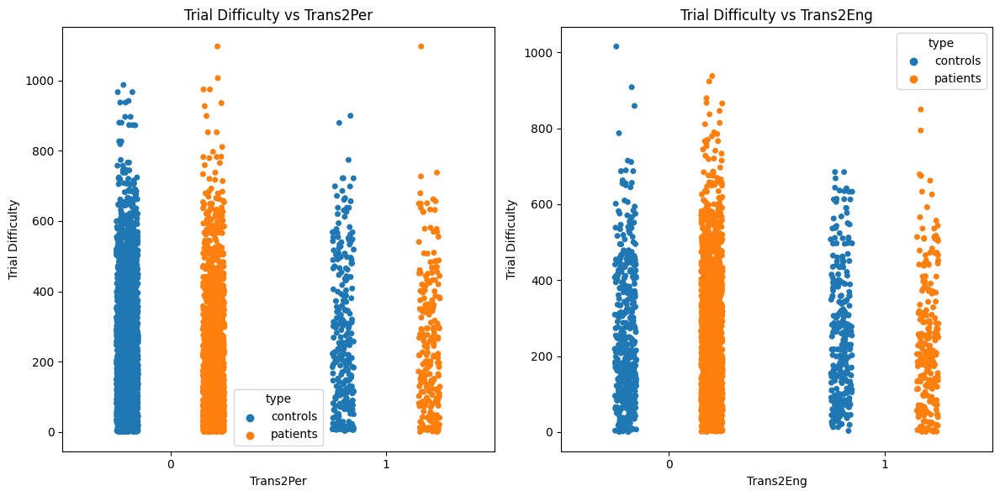

In [412]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))  

sns.stripplot(
    data=new_revcor[(new_revcor.session == 1)&(new_revcor.predicted_states==1)],
    x="trans2per", 
    y="trial_difficulty",
    hue='type',
    ax=axes[0],dodge=True, jitter=True 
)
axes[0].set_title("Trial Difficulty vs Trans2Per")
axes[0].set_xlabel("Trans2Per")
axes[0].set_ylabel("Trial Difficulty")

sns.stripplot(
    data=new_revcor[(new_revcor.session == 1)&(new_revcor.predicted_states==0)],
    x="trans2eng", 
    y="trial_difficulty",
    hue='type',
    ax=axes[1],dodge=True, jitter=True   
)
axes[1].set_title("Trial Difficulty vs Trans2Eng")
axes[1].set_xlabel("Trans2Eng")
axes[1].set_ylabel("Trial Difficulty")

plt.tight_layout()
plt.show()

In [443]:
print(new_revcor[(new_revcor.session==1)&(new_revcor.predicted_states==1)&(new_revcor.trans2per==1)].groupby('type')[['trans2per','nbr_resp_iden','trial_difficulty']].mean())
print(new_revcor[(new_revcor.session==1)&(new_revcor.predicted_states==0)&(new_revcor.trans2eng==1)].groupby('type')[['trans2eng','nbr_resp_iden','trial_difficulty']].mean())

          trans2per  nbr_resp_iden  trial_difficulty
type                                                
controls        1.0       1.112727        265.155848
patients        1.0       1.478261        242.868011
          trans2eng  nbr_resp_iden  trial_difficulty
type                                                
controls        1.0       2.218638        253.477354
patients        1.0       2.956710        231.081810


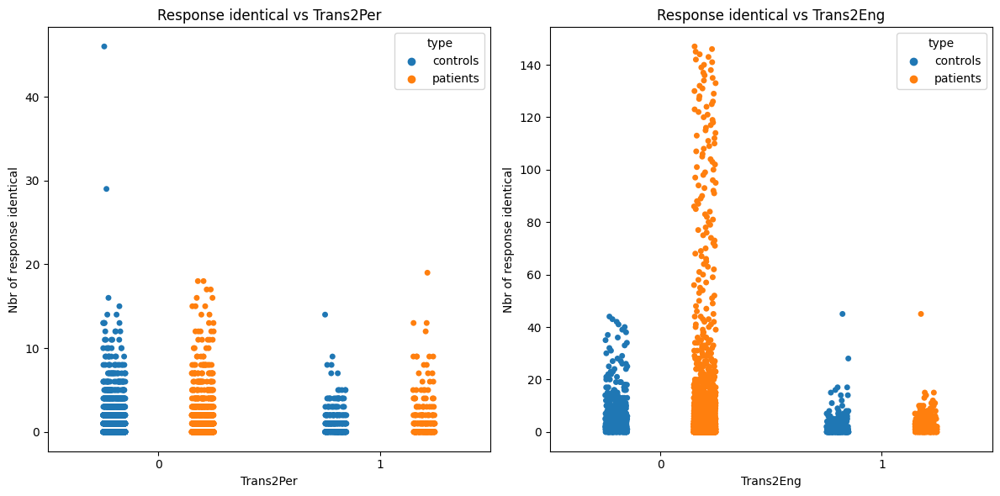

In [413]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))  

sns.stripplot(
    data=new_revcor[(new_revcor.session == 1)&(new_revcor.predicted_states==1)],
    x="trans2per", 
    y="nbr_resp_iden",hue='type',
    ax=axes[0],dodge=True, jitter=True 
)
axes[0].set_title("Response identical vs Trans2Per")
axes[0].set_xlabel("Trans2Per")
axes[0].set_ylabel("Nbr of response identical")

sns.stripplot(
    data=new_revcor[(new_revcor.session == 1)&(new_revcor.predicted_states==0)],
    x="trans2eng", 
    y="nbr_resp_iden",hue='type',
    ax=axes[1],dodge=True, jitter=True   
)
axes[1].set_title("Response identical vs Trans2Eng")
axes[1].set_xlabel("Trans2Eng")
axes[1].set_ylabel("Nbr of response identical")

plt.tight_layout()
plt.show()

In [352]:
import statsmodels.formula.api as smf
model = smf.ols('nbr_resp_iden ~ trans2per * type', data=new_revcor)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:          nbr_resp_iden   R-squared:                       0.018
Model:                            OLS   Adj. R-squared:                  0.017
Method:                 Least Squares   F-statistic:                     69.61
Date:                Wed, 18 Dec 2024   Prob (F-statistic):           1.30e-44
Time:                        14:45:40   Log-Likelihood:                -44042.
No. Observations:               11700   AIC:                         8.809e+04
Df Residuals:                   11696   BIC:                         8.812e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept           

In [427]:
display_group_comparisons_stat(data=filtered_data_patients[filtered_data_patients.predicted_states==1], 
                               group='trans2per', 
                               measures = [ 'trial_difficulty'])
display_group_comparisons_stat(data=filtered_data_patients[filtered_data_patients.predicted_states==0], 
                               group='trans2eng', 
                               measures = [ 'trial_difficulty'])
display_group_comparisons_stat(data=filtered_data_patients[filtered_data_patients.predicted_states==1], 
                               group='trans2per', 
                               measures = ['nbr_resp_iden'])
display_group_comparisons_stat(data=filtered_data_patients[filtered_data_patients.predicted_states==0], 
                               group='trans2eng', 
                               measures = ['nbr_resp_iden'])

------------------------------------
Mann-Whitney U Test for TRIAL_DIFFICULTY and TRANS2PER
Med = -13.34 [-38.26 - 17.14]
M = -2.18 [-21.60 - 16.11], U=519767.50, r=0.01, p (uncorrected)=0.761, p (Bonferroni corrected)=0.761
------------------------------------
Mann-Whitney U Test for TRIAL_DIFFICULTY and TRANS2ENG
Med = -2.21 [-22.49 - 18.19]
M = 0.00 [-18.22 - 18.03], U=782234.00, r=0.01, p (uncorrected)=0.804, p (Bonferroni corrected)=0.804
------------------------------------
Mann-Whitney U Test for NBR_RESP_IDEN and TRANS2PER
Med = 0.00 [0.00 - 1.00]
M = 0.32 [-0.08 - 0.67], U=521910.00, r=0.01, p (uncorrected)=0.855, p (Bonferroni corrected)=0.855
------------------------------------
Mann-Whitney U Test for NBR_RESP_IDEN and TRANS2ENG
Med = 0.00 [-1.00 - 1.00]
M = 3.48 [2.76 - 4.20], U=825878.00, r=-0.05, p (uncorrected)=0.104, p (Bonferroni corrected)=0.104


<Figure size 2000x500 with 0 Axes>

<Figure size 2000x500 with 0 Axes>

<Figure size 2000x500 with 0 Axes>

<Figure size 2000x500 with 0 Axes>

In [ ]:
metrics = ['trial_difficulty', 'nbr_resp_iden','trans2per','trans2eng']
groups = new_revcor['type'].unique()

results = []

# Loop through each metric and group combinations
for metric in metrics:
    for i in range(len(groups)):
        for j in range(i + 1, len(groups)):
            # Extract data for the two groups
            group1_data = new_revcor1[new_revcor1['type'] == groups[i]][metric].dropna().values
            group2_data = new_revcor1[new_revcor1['type'] == groups[j]][metric].dropna().values
            
            # Check if both groups have non-zero size
            if len(group1_data) == 0 or len(group2_data) == 0:
                continue  # Skip this pair if either group has no data
            
            # Perform Mann-Whitney U test
            stat, pvalue = mannwhitneyu(group1_data, group2_data)
            
            # Append results
            results.append({
                'Metric': metric,
                'Group1': groups[i],
                'Group2': groups[j],
                'U-statistic': stat,
                'P-value': pvalue
            })

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
results_df['Significant'] = results_df['P-value'].apply(lambda p: '*' if p < 0.05 else '')

# Display results
results_df

,Metric,Group1,Group2,U-statistic,P-value,Significant
0,trial_difficulty,controls,patients,5738507.0,1.493274e-04,*
1,nbr_resp_iden,controls,patients,4636676.5,1.931312e-27,*
2,trans2per,controls,patients,5519250.0,3.719580e-02,*
3,trans2eng,controls,patients,5524200.0,2.693194e-02,*


In [419]:
new_revcor1=new_revcor[(new_revcor.session==1)&(new_revcor.predicted_states==1)]
contingency_table_per = pd.crosstab(new_revcor1['type'], new_revcor1['trans2per'])
chi2, p, dof, expected = chi2_contingency(contingency_table_per)
print("Chi-Square Statistic:", chi2)
print("P-value:", p)
if p < 0.05:
    print("There is a significant association between the variables.")
else:
    print("No significant association between the variables.")

contingency_table_per

Chi-Square Statistic: 12.18750779212198
P-value: 0.0004811061664850487
There is a significant association between the variables.


trans2per,0,1
type,,
controls,2294,275
patients,1369,230


In [421]:
new_revcor1=new_revcor[(new_revcor.session==1)&(new_revcor.predicted_states==0)]

contingency_table_eng = pd.crosstab(new_revcor1['type'], new_revcor1['trans2eng'])
chi2, p, dof, expected = chi2_contingency(contingency_table_eng)
print("Chi-Square Statistic:", chi2)
print("P-value:", p)
if p < 0.05:
    print("There is a significant association between the variables.")
else:
    print("No significant association between the variables.")

contingency_table_eng

Chi-Square Statistic: 185.01145539250126
P-value: 3.902089095567153e-42
There is a significant association between the variables.


trans2eng,0,1
type,,
controls,452,279
patients,1470,231


In [565]:
new_revcor.stim_diff.values[0]*new_revcor.kernel_hmm_values.values[0]

array([-51.10762758,  -1.49587546, -32.24626522,  -3.61432235,
        -0.88116253,  15.08997561, -12.42501573])

In [555]:
new_revcor = new_revcor.merge(
    revcor_measures_old[['subject', 'session', 'criteria']], 
    on=['subject', 'session'], 
    how='left' 
)

In [553]:
revcor_measures_old

,experimentor,type,subject,session,kernel_distance,kernel_typicality,p_int1,pc_agree,criteria,internal_noise_old,accuracy
0,aynaz,controls,0,1,0.172140,0.964645,0.47,0.70,0.15,0.85,0.740000
1,aynaz,controls,1,1,0.225931,0.946988,0.55,0.78,0.20,0.55,0.693333
2,aynaz,controls,2,1,0.240553,0.942189,0.40,0.64,0.55,1.25,0.606667
3,aynaz,controls,3,1,0.710265,0.788015,0.53,0.58,0.20,1.75,0.613333
4,aynaz,controls,4,1,0.098997,0.988652,0.47,0.82,0.10,0.45,0.753333
...,...,...,...,...,...,...,...,...,...,...,...
73,jeulin,patients,42,4,2.215531,0.293938,0.40,0.44,1.15,4.65,0.473333
74,jeulin,patients,43,1,0.365122,0.901302,0.84,0.84,1.75,0.75,0.586667
75,jeulin,patients,43,2,1.848419,0.414436,0.40,0.52,1.80,4.85,0.480000
76,jeulin,patients,43,3,1.770126,0.440134,0.68,0.76,0.80,0.70,0.520000


In [561]:
new_revcor[(new_revcor.subject==2)&(new_revcor.predicted_states==1)&(new_revcor.trans2per==1)].groupby(['subject','session']).nbr_resp_iden.count()


subject  session
2        1          23
Name: nbr_resp_iden, dtype: int64

In [150]:
new_revcor_measures.to_csv("data/new_revcor_measures.csv", index=False)

In [263]:
new_revcor.to_csv("data/new_revcor.csv", index=False)

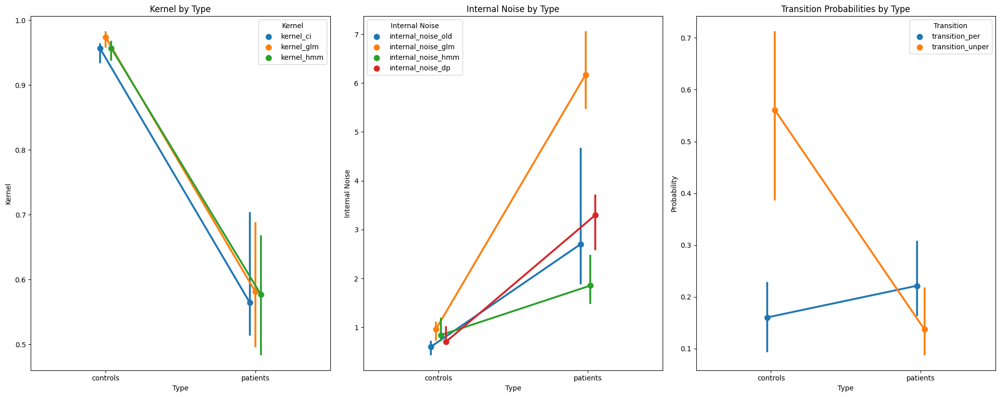

In [99]:
fig, axes = plt.subplots(1, 3, figsize=(20, 8), sharey=False)

kernel_data = new_revcor_measures.melt(id_vars='type', value_vars=['kernel_ci', 'kernel_glm', 'kernel_hmm'],
                                       var_name='Kernel', value_name='Value')
kernel_order = ['kernel_ci', 'kernel_glm', 'kernel_hmm']
sns.pointplot(ax=axes[0], data=kernel_data, x='type', y='Value', hue='Kernel',
              dodge=True, estimator=np.nanmedian, hue_order=kernel_order)
axes[0].set_title("Kernel by Type")
axes[0].set_xlabel("Type")
axes[0].set_ylabel("Kernel")

# Internal noise plot
noise_data = new_revcor_measures.melt(id_vars='type', value_vars=['internal_noise_old','internal_noise_dp',
                                                                  'internal_noise_glm', 'internal_noise_hmm'],
                                      var_name='Internal Noise', value_name='Value')
noise_order = ['internal_noise_old', 'internal_noise_glm', 'internal_noise_hmm','internal_noise_dp',]
sns.pointplot(ax=axes[1], data=noise_data, x='type', y='Value', hue='Internal Noise',
              dodge=True, estimator=np.nanmedian, hue_order=noise_order)
axes[1].set_title("Internal Noise by Type")
axes[1].set_xlabel("Type")
axes[1].set_ylabel("Internal Noise")

# Transition probabilities plot
transition_data = new_revcor_measures.melt(id_vars='type', value_vars=['transition_per', 'transition_unper'],
                                           var_name='Transition', value_name='Value')
sns.pointplot(ax=axes[2], data=transition_data, x='type', y='Value', hue='Transition',
              dodge=True, estimator=np.nanmedian)
axes[2].set_title("Transition Probabilities by Type")
axes[2].set_xlabel("Type")
axes[2].set_ylabel("Probability")

plt.tight_layout()
plt.show()

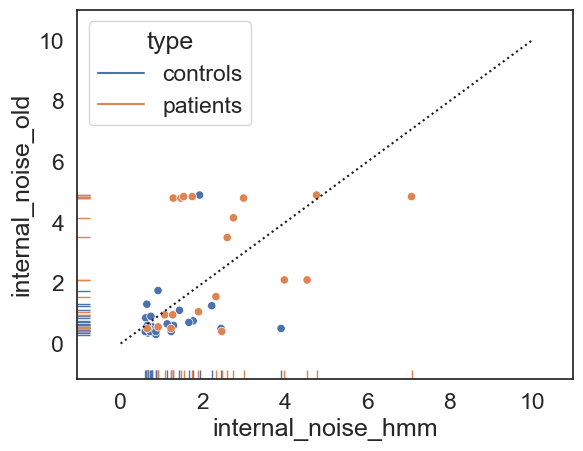

In [254]:
sns.scatterplot(data=revcor_measures[revcor_measures.session==1], x="internal_noise_hmm", y="internal_noise_old", hue='type')
sns.rugplot(data=revcor_measures[revcor_measures.session==1], x="internal_noise_hmm", y="internal_noise_old", hue='type')
plt.plot([0,10],[0,10],'k:')


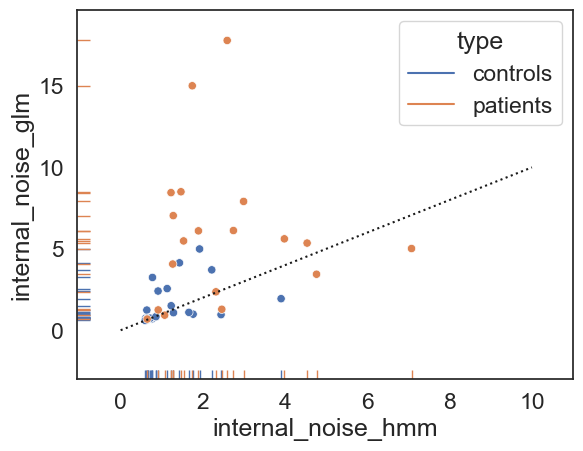

In [255]:
sns.scatterplot(data=revcor_measures[revcor_measures.session==1], x="internal_noise_hmm", y="internal_noise_glm", hue='type')
sns.rugplot(data=revcor_measures[revcor_measures.session==1], x="internal_noise_hmm", y="internal_noise_glm", hue='type')
plt.plot([0,10],[0,10],'k:')

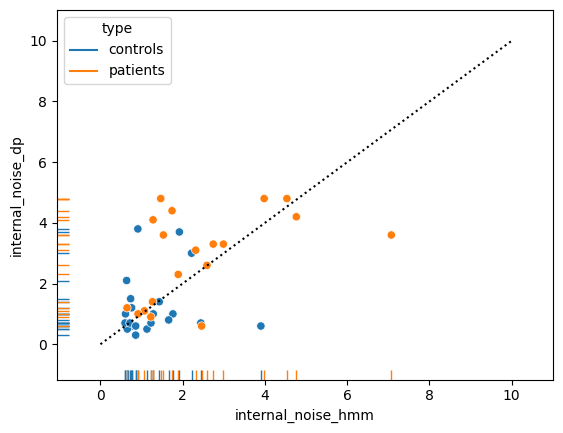

In [102]:
sns.scatterplot(data=new_revcor_measures[new_revcor_measures.session==1], x="internal_noise_hmm", y="internal_noise_dp", hue='type')
sns.rugplot(data=new_revcor_measures[new_revcor_measures.session==1], x="internal_noise_hmm", y="internal_noise_dp", hue='type')
plt.plot([0,10],[0,10],'k:')

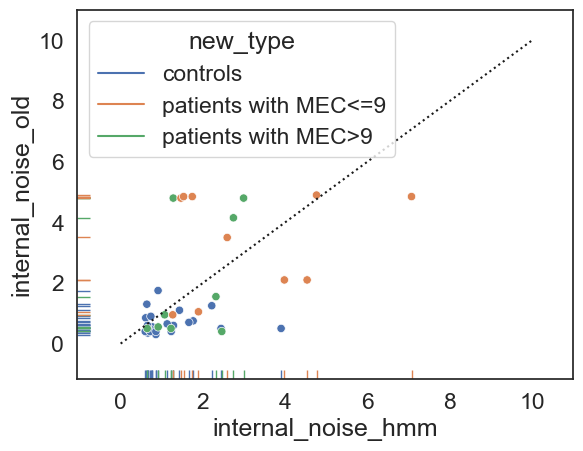

In [256]:
sns.scatterplot(data=revcor_measures[revcor_measures.session==1], x="internal_noise_hmm", y="internal_noise_old", hue='new_type')
sns.rugplot(data=revcor_measures[revcor_measures.session==1], x="internal_noise_hmm", y="internal_noise_old", hue='new_type')
plt.plot([0,10],[0,10],'k:')


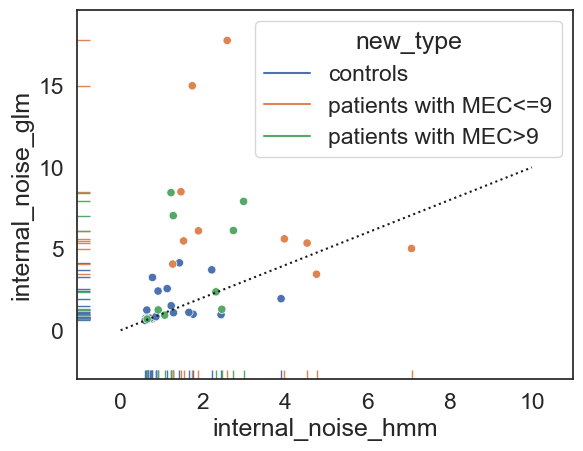

In [257]:
sns.scatterplot(data=revcor_measures[revcor_measures.session==1], x="internal_noise_hmm", y="internal_noise_glm", hue='new_type')
sns.rugplot(data=revcor_measures[revcor_measures.session==1], x="internal_noise_hmm", y="internal_noise_glm", hue='new_type')
plt.plot([0,10],[0,10],'k:')

In [103]:
import plotly.express as px

# Filter the data for session 1
filtered_data = new_revcor_measures[new_revcor_measures.session == 1]

# Create an interactive scatter plot with Plotly
fig = px.scatter(filtered_data, 
                 x="internal_noise_hmm", 
                 y="internal_noise_glm", 
                 color="type", 
                  hover_data=["subject"],
                 marginal_x="rug", 
                 marginal_y="rug", 
                 labels={"internal_noise_hmm": "Internal Noise HMM",
                         "internal_noise_glm": "Internal Noise GLM",
                         "type": "Type"},
                 title="Interactive Scatterplot of Internal Noise HMM vs GLM")

# Add a diagonal reference line
fig.add_shape(type="line",
              x0=0, y0=0, x1=10, y1=10,
              line=dict(color="Black", dash="dot"))

# Show the plot
fig.show()

g:\Utilisateurs\aynaz.adlzarrabi\AppData\Local\Programs\Python\Python38\lib\site-packages\plotly\express\imshow_utils.py:24: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  np.bool8: (False, True),
g:\Utilisateurs\aynaz.adlzarrabi\AppData\Local\Programs\Python\Python38\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

g:\Utilisateurs\aynaz.adlzarrabi\AppData\Local\Programs\Python\Python38\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



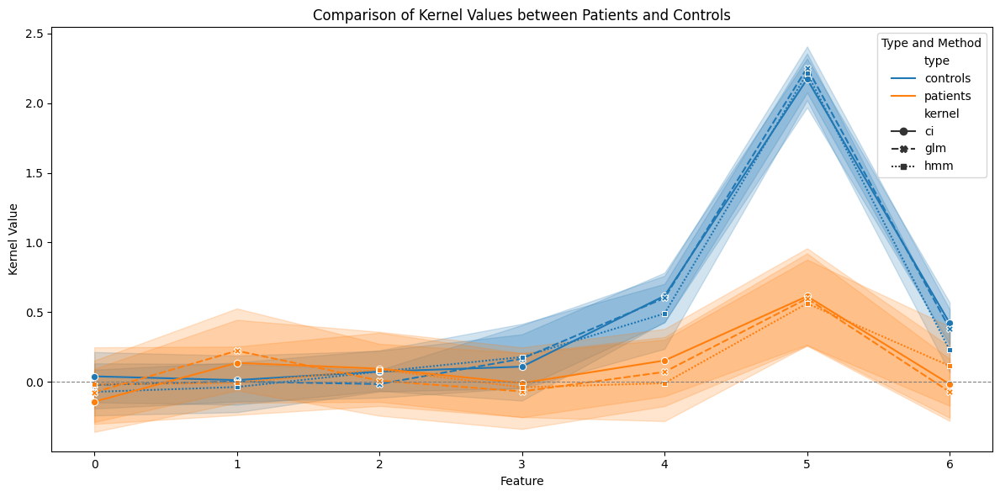

In [104]:
filtered_data = kernels[kernels['type'].isin(['patients', 'controls'])]

controls_means = (
    filtered_data[filtered_data['type'] == 'controls']
    .groupby(['feature', 'kernel'], as_index=False)['kernel_value']
    .mean()
    .rename(columns={'kernel_value': 'mean_control_value'})
)

merged_data = filtered_data.merge(controls_means, on=['feature', 'kernel'], how='left')

# Create the plot
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=merged_data,
    x='feature',
    y='kernel_value',
    hue='type',
    style='kernel', 
    markers=True
)
plt.axhline(0, color='gray', linestyle='--', linewidth=0.8)  # Reference line at 0
plt.title('Comparison of Kernel Values between Patients and Controls')
plt.ylabel('Kernel Value')
plt.xlabel('Feature')
plt.legend(title='Type and Method')
plt.tight_layout()
plt.show()

#### Controls consistency

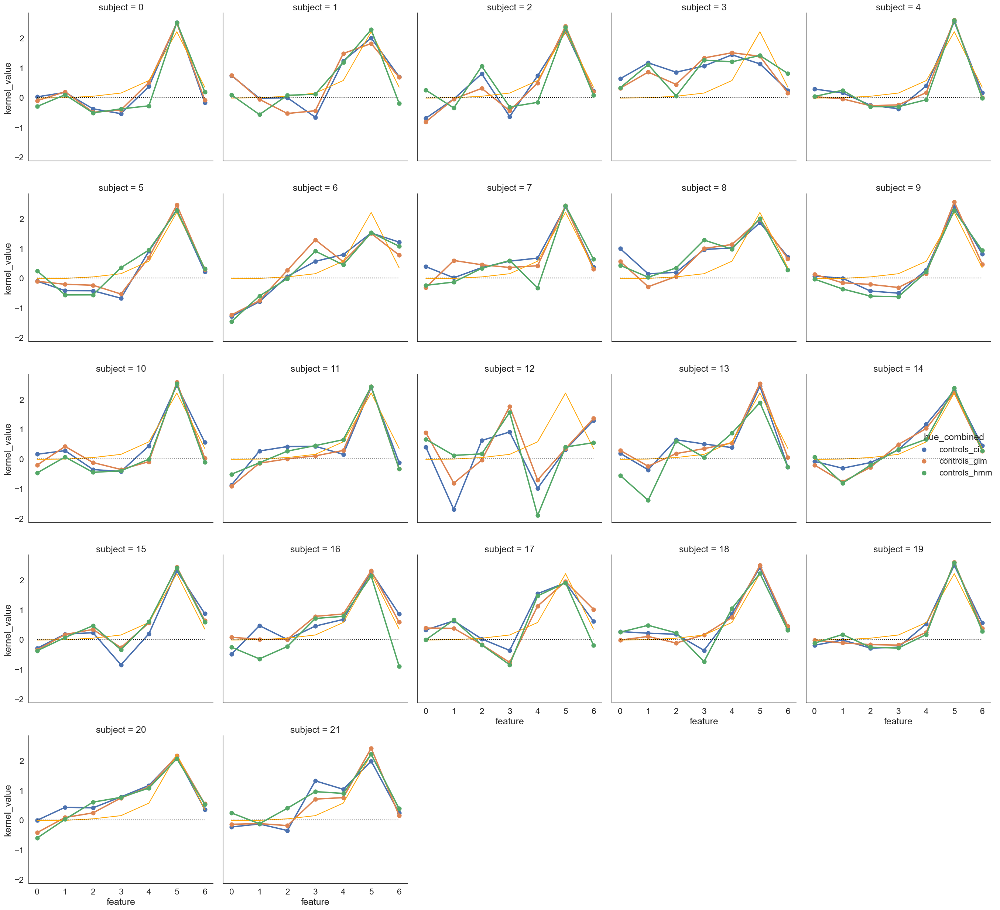

In [674]:
kernels['hue_combined'] = kernels['type'] + "_" + kernels['kernel']

# Plot with combined hue
g = sns.catplot(
    x="feature", 
    y="kernel_value",
    col="subject",
    hue="hue_combined",  # Combined hue
    col_wrap=5,
    data=kernels[(kernels.type != 'patients') & (kernels.session == 1)], 
    kind="point"
)

# Overlay control kernels
control_kernels = kernels[kernels.type == 'controls'].groupby('feature')['kernel_value'].mean().reset_index()
axes = g.axes.flatten()
for axis in axes:
    axis.plot(control_kernels['feature'], control_kernels['kernel_value'], color='orange', label='Control Kernel')
    axis.plot([0, 6], [0, 0], color='k', linestyle=':')

plt.tight_layout()
plt.show()


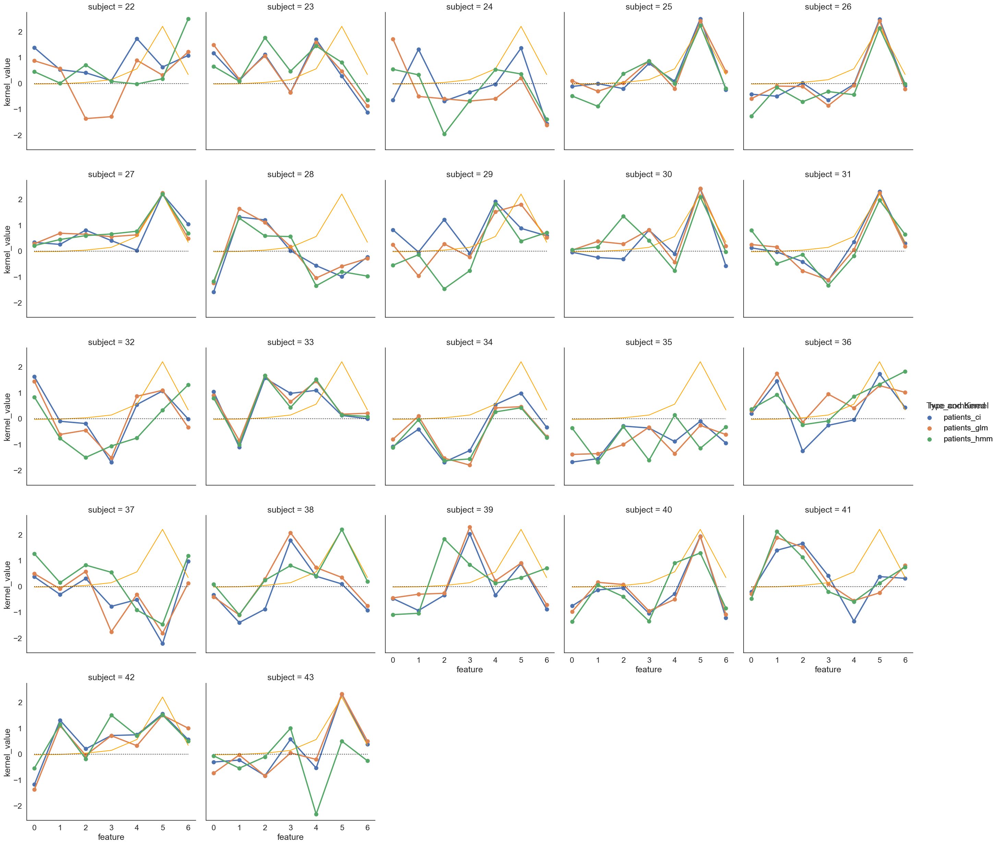

In [675]:
kernels['hue_combined'] = kernels['type'] + "_" + kernels['kernel']

# Plot with combined hue
g = sns.catplot(
    x="feature", 
    y="kernel_value",
    col="subject",
    hue="hue_combined",  # Combined hue
    col_wrap=5,
    data=kernels[(kernels.type != 'controls')&(kernels.session==1)], 
    kind="point"
)

# Overlay control kernels
control_kernels = kernels[kernels.type == 'controls'].groupby('feature')['kernel_value'].mean().reset_index()
axes = g.axes.flatten()
for axis in axes:
    axis.plot(control_kernels['feature'], control_kernels['kernel_value'], color='orange', label='Control Kernel')
    axis.plot([0, 6], [0, 0], color='k', linestyle=':')

# Optional: Adjust legend to better display multiple hues
g.add_legend(title="Type and Kernel")
plt.show()

In [128]:
filtered_rows = new_revcor_measures[( new_revcor_measures['type']=='patients' )& (new_revcor_measures['session']==1)&(new_revcor_measures['internal_noise_hmm'] > new_revcor_measures['internal_noise_glm'] )& (new_revcor_measures['internal_noise_hmm'] > new_revcor_measures['internal_noise_dp'])]
print(filtered_rows)

        type  subject  session  kernel_ci  kernel_glm  kernel_hmm  \
37  patients       30        1   0.918445    0.929050    0.838270   
40  patients       33        1   0.549985    0.581119    0.571937   
62  patients       40        1   0.771896    0.763751    0.697936   

    internal_noise_dp  internal_noise_glm  internal_noise_hmm  transition_per  \
37                0.6            1.287216            2.459296        0.427884   
40                4.2            3.438898            4.762763        0.191000   
62                3.6            5.016619            7.072585        0.022478   

    transition_unper  internal_noise_old  \
37          0.348074                0.40   
40          0.628571                4.90   
62          0.065784                4.85   

                                     predicted_states  engaged_trials  \
37  [1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...              63   
40  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...             147   
62

### Statistics utility functions

In [110]:
custom_palette = {"controls": sns.color_palette()[1], "patients": sns.color_palette()[0]}

def explore_distribution(data, group, measures):
    
    for measure in measures:
        plt.figure(figsize=(22,10))
        plt.suptitle(measure.capitalize(), fontsize=12, y=1.05)

        plt.subplot(1, 3, 1)
        sns.histplot(x=data[measure], kde=True, hue=data[group], multiple='stack', palette=custom_palette)
        plt.xlabel(measure.capitalize())

        plt.subplot(1, 3, 2)
        probplot(data[measure], plot=plt)

        plt.subplot(1, 3, 3)
        sns.boxplot(x=group, y=measure, data=data, palette=custom_palette)
        plt.xlabel(group.capitalize())
        plt.ylabel(measure.capitalize())
        plt.tight_layout()

        plt.show()

<b>Group comparisons</b>: because distributions of representation typicality and internal noise scores between patients and controls were non-normal, we compared population means using non-parametric (Mann-Whitney) independent sample t-tests.

In [109]:
def display_group_comparisons_stat(data, group, measures):
    
    fig = plt.figure(figsize=(20,5))
    num_plots = len(measures)
    
    for num_measure, measure in enumerate(measures):
        
        data = data.dropna(subset=[measure, group])
        
        group1 = data[data[group]==data[group].unique()[0]][measure]
        group2 = data[data[group]==data[group].unique()[1]][measure]
        U_stat, p_val = mannwhitneyu(group1, group2, alternative='two-sided')
        r = 1 - (2*U_stat)/(len(group1)*len(group2))
        mean1 = group1.mean()
        mean2 = group2.mean()

        median1 = group1.median()
        median2 = group2.median()

        # Bootstrapping for confidence interval of median difference
        n_bootstraps = 10000
        boot_median_differences = []
        boot_mean_differences = []
        
        for i in range(n_bootstraps):
            
            boot_group1 = group1.sample(len(group1), replace=True)
            boot_group2 = group2.sample(len(group2), replace=True)
            # bootstrap mean
            boot_mean_difference = boot_group1.mean() - boot_group2.mean()
            boot_mean_differences.append(boot_mean_difference)
            # bootstrap median
            boot_median_difference = boot_group1.median() - boot_group2.median()
            boot_median_differences.append(boot_median_difference)
        # CI on mean
        boot_mean_differences.sort()
        mean_CI_low = boot_mean_differences[int(n_bootstraps*0.025)]
        mean_CI_high = boot_mean_differences[int(n_bootstraps*0.975)]
        # CI on median
        boot_median_differences.sort()
        median_CI_low = boot_median_differences[int(n_bootstraps*0.025)]
        median_CI_high = boot_median_differences[int(n_bootstraps*0.975)]

        # report the result
        print('------------------------------------')
        print('Mann-Whitney U Test for', measure.upper(), 'and', group.upper())
        print(f"Med = {median1-median2:.2f} [{median_CI_low:.2f} - {median_CI_high:.2f}]")
        print(f"M = {mean1-mean2:.2f} [{mean_CI_low:.2f} - {mean_CI_high:.2f}], U={U_stat:.2f}, r={r:.2f}, p={p_val:.3f}")

In [107]:
from scipy.stats import mannwhitneyu
import numpy as np
import matplotlib.pyplot as plt

def display_group_comparisons_stat(data, group, measures):
    # Initialize a figure for plotting
    fig = plt.figure(figsize=(20, 5))
    num_plots = len(measures)
    # Bonferroni corrected alpha level
    alpha = 0.05 / num_plots
    
    for num_measure, measure in enumerate(measures):
        # Drop missing values for the current measure and group
        data_subset = data.dropna(subset=[measure, group])
        
        # Split data into two groups based on the unique values in the group column
        group1 = data_subset[data_subset[group] == data_subset[group].unique()[0]][measure]
        group2 = data_subset[data_subset[group] == data_subset[group].unique()[1]][measure]
        
        # Perform the Mann-Whitney U test
        U_stat, p_val_uncorrected = mannwhitneyu(group1, group2, alternative='two-sided')
        
        # Apply the Bonferroni correction
        p_val_corrected = p_val_uncorrected * num_plots
        # Ensure that the corrected p-value does not exceed 1
        p_val_corrected = min(p_val_corrected, 1)
        
        # Calculate effect size (r), mean, and median for the groups
        r = 1 - (2 * U_stat) / (len(group1) * len(group2))
        mean1 = group1.mean()
        mean2 = group2.mean()
        median1 = group1.median()
        median2 = group2.median()

        # Bootstrapping for confidence interval of median difference
        n_bootstraps = 10000
        boot_median_differences = []
        boot_mean_differences = []
        for i in range(n_bootstraps):
            boot_group1 = group1.sample(len(group1), replace=True)
            boot_group2 = group2.sample(len(group2), replace=True)
            # Bootstrap mean and median
            boot_mean_difference = boot_group1.mean() - boot_group2.mean()
            boot_mean_differences.append(boot_mean_difference)
            boot_median_difference = boot_group1.median() - boot_group2.median()
            boot_median_differences.append(boot_median_difference)
        
        # Confidence intervals on mean and median
        boot_mean_differences.sort()
        mean_CI_low = boot_mean_differences[int(n_bootstraps * 0.025)]
        mean_CI_high = boot_mean_differences[int(n_bootstraps * 0.975)]
        boot_median_differences.sort()
        median_CI_low = boot_median_differences[int(n_bootstraps * 0.025)]
        median_CI_high = boot_median_differences[int(n_bootstraps * 0.975)]

        # Report the results with corrected p-value
        print('------------------------------------')
        print('Mann-Whitney U Test for', measure.upper(), 'and', group.upper())
        print(f"Med = {median1 - median2:.2f} [{median_CI_low:.2f} - {median_CI_high:.2f}]")
        print(f"M = {mean1 - mean2:.2f} [{mean_CI_low:.2f} - {mean_CI_high:.2f}], U={U_stat:.2f}, r={r:.2f}, p (uncorrected)={p_val_uncorrected:.3f}, p (Bonferroni corrected)={p_val_corrected:.3f}")


<b> Correlation with clinical measures:</b> linear associations between representation typicality and internal noise, and clinical assessments (MEC, Prosody Comprehension, Prosody Repetition, Airtac2) met the homoskedasticity assumption and were therefore estimated using ordinary least-square regressions without robust (HC) norms, as these are considered to increase false positive rates when testing small samples (Nikitina, Paidi & Furuoka, 2019). In addition, because regression residuals were non-normal, we estimated statistical significance using bootstrapped confidence intervals.

<small> Nikitina L, Paidi R, Furuoka F. Using bootstrapped quantile regression analysis for small sample research in applied linguistics: Some methodological considerations. Baxter GJ, ed. PLOS ONE. 2019;14(1):e0210668. doi:10.1371/journal.pone.0210668


In [106]:
def display_regressions(data, predictor, outcomes, controls=[]): 
    
    fig = plt.figure(figsize=(20,5))
    num_plots = len(outcomes)
    
    for num_outcome, outcome in enumerate(outcomes):
        plt.subplot(1,num_plots,num_outcome+1)
        sns.regplot(y=outcome,
                    x=predictor,
                    data=data)
        plt.ylabel(outcome.capitalize())
        plt.xlabel(predictor.capitalize())
        plt.title(outcome.capitalize(), size=8)
        
        print('------------------------------------')
        formula = ' + '.join(['%s ~ %s'%(outcome, predictor)] + ['%s'%control for control in controls])
        #        formula='%s ~ %s '%(outcome, measure)
        #with capture_output() as c:
        stats = Lm(formula=formula,
                  data=data.dropna(subset=[predictor,outcome]+controls)).fit(verbose=False, 
                                                                             conf_int ='boot',
                                                                             summarize =True)
        print(formula.upper())
        print(stats)
        #print(model.fit())
    plt.tight_layout()
    

In [134]:
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import seaborn as sns

def display_regressions(data, predictor, outcomes, controls=[]): 
    fig = plt.figure(figsize=(20, 5))
    num_plots = len(outcomes)
    
    for num_outcome, outcome in enumerate(outcomes):
        plt.subplot(1, num_plots, num_outcome + 1)
        
        # Plot regression with seaborn
        sns.regplot(y=outcome, x=predictor, data=data, ci=95)
        plt.ylabel(outcome.capitalize())
        plt.xlabel(predictor.capitalize())
        plt.title(outcome.capitalize(), size=10)
        
        # Create regression formula
        formula = '%s ~ %s' % (outcome, predictor)
        if controls:
            control_vars = ' + '.join(controls)
            formula = f'{formula} + {control_vars}'
        
        # Fit regression model using statsmodels
        model = smf.ols(formula=formula, data=data.dropna(subset=[predictor, outcome] + controls)).fit()
        
        # Extract the p-value for the predictor
        p_value = model.pvalues[predictor]
        
        # Display p-value on the plot
        plt.text(0.05, 0.95, f'p = {p_value:.3e}', 
                 transform=plt.gca().transAxes,  # Use axes coordinates
                 fontsize=10, 
                 ha='left', 
                 va='top', 
                 bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))
        
        # Print regression stats
        print('------------------------------------')
        print(f"Formula: {formula}")
        print(model.summary())
    
    plt.tight_layout()
    plt.show()


In [104]:
import seaborn as sns
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt

def display_regressions(data, predictor, outcomes, controls=[]):
    fig = plt.figure(figsize=(20, 5))
    num_plots = len(outcomes)
    # Bonferroni corrected alpha level
    alpha = 0.05 / num_plots
    
    for num_outcome, outcome in enumerate(outcomes):
        plt.subplot(1, num_plots, num_outcome + 1)
        sns.regplot(y=outcome,
                    x=predictor,
                    data=data)
        plt.ylabel(outcome.capitalize())
        plt.xlabel(predictor.capitalize())
        plt.title(outcome.capitalize(), size=8)
        
        print('------------------------------------')
        formula = ' + '.join([f'{outcome} ~ {predictor}'] + [f'{control}' for control in controls])
        model = smf.ols(formula=formula, data=data.dropna(subset=[predictor, outcome] + controls)).fit()
        
        # Apply the Bonferroni correction
        p_vals_corrected = model.pvalues * num_plots
        # Ensure that the corrected p-values do not exceed 1
        p_vals_corrected = p_vals_corrected.apply(lambda x: min(x, 1))
        
        # Print the formula and results with corrected p-values
        print(formula.upper())
        print(model.summary())
        print("\nCorrected p-values for multiple testing:")
        print(p_vals_corrected)
    
    plt.tight_layout()

# Note: This code assumes you have a function or package `Lm` that behaves like `statsmodels.formula.api.ols`.
# If Lm is part of a custom package, you'll need to adjust the code to apply the p-value correction correctly.


In [230]:
import seaborn as sns
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt

def display_regressions(data, predictor, outcomes, controls=[]):
    fig = plt.figure(figsize=(20, 5))
    num_plots = len(outcomes)
    # Bonferroni corrected alpha level
    alpha = 0.05 / num_plots
    
    for num_outcome, outcome in enumerate(outcomes):
        plt.subplot(1, num_plots, num_outcome + 1)
        
        # Plot the regression
        sns.regplot(y=outcome, x=predictor, data=data)
        plt.ylabel(outcome.capitalize())
        plt.xlabel(predictor.capitalize())
        
        # Fit the regression model
        formula = ' + '.join([f'{outcome} ~ {predictor}'] + [f'{control}' for control in controls])
        model = smf.ols(formula=formula, data=data.dropna(subset=[predictor, outcome] + controls)).fit()
        
        # Compute raw and Bonferroni-corrected p-values
        raw_pval = model.pvalues[predictor]
        p_vals_corrected = model.pvalues * num_plots
        p_vals_corrected = p_vals_corrected.apply(lambda x: min(x, 1))  # Ensure corrected p-values don't exceed 1
        predictor_pval_corrected = p_vals_corrected[predictor]
        
        # Update the plot title to include p-values on separate rows
        plt.title(
            f"{outcome.capitalize()}\n"
            f"Raw p = {raw_pval:.3e}\n"
            f"Bonf p = {predictor_pval_corrected:.3e}",
            fontsize=10
        )
        
        # Print formula and summary for debugging
        print('------------------------------------')
        print(f"Formula: {formula.upper()}")
        print(model.summary())
        print("\nCorrected p-values for multiple testing:")
        print(p_vals_corrected)
    
    plt.tight_layout()
    plt.show()


In [12]:
import seaborn as sns
import statsmodels.formula.api as smf
from statsmodels.stats.multitest import multipletests
import matplotlib.pyplot as plt

def display_regressions(data, predictor, outcomes, controls=[], correction="bonferroni"):
    """
    Displays regression plots with raw and corrected p-values for multiple comparisons.

    Parameters:
    - data: DataFrame
    - predictor: str, the independent variable
    - outcomes: list of str, dependent variables
    - controls: list of str, covariates
    - correction: str, multiple comparison correction method ("bonferroni" or "fdr_bh")
    """
    fig = plt.figure(figsize=(20, 5))
    num_plots = len(outcomes)
    
    all_pvalues = []
    for outcome in outcomes:
        # Fit regression model
        formula = ' + '.join([f'{outcome} ~ {predictor}'] + [f'{control}' for control in controls])
        model = smf.ols(formula=formula, data=data.dropna(subset=[predictor, outcome] + controls)).fit()
        raw_pval = model.pvalues[predictor]
        all_pvalues.append(raw_pval)

    # Apply multiple comparison correction
    _, corrected_pvals, _, _ = multipletests(all_pvalues, method=correction)

    for num_outcome, outcome in enumerate(outcomes):
        plt.subplot(1, num_plots, num_outcome + 1)
        
        # Plot the regression
        sns.regplot(y=outcome, x=predictor, data=data)
        plt.ylabel(outcome.capitalize())
        plt.xlabel(predictor.capitalize())
        
        # Titles with raw and corrected p-values
        raw_pval = all_pvalues[num_outcome]
        corrected_pval = corrected_pvals[num_outcome]
        plt.title(
            f"{outcome.capitalize()}\n"
            f"Raw p = {raw_pval:.3e}\n"
            f"{correction.capitalize()} p = {corrected_pval:.3e}",
            fontsize=10
        )
        
        # Print formula and summary for debugging
        print('------------------------------------')
        print(f"Formula: {formula.upper()}")
        print(model.summary())
        print(f"Raw p-value: {raw_pval:.3e}, Corrected p-value: {corrected_pval:.3e}")
    
    plt.tight_layout()
    plt.show()


In [13]:
import seaborn as sns
import statsmodels.formula.api as smf
from statsmodels.stats.multitest import multipletests
import matplotlib.pyplot as plt

def display_regressions(data, predictors, outcomes, controls=[], correction="bonferroni"):
    """
    Displays regression plots with raw and corrected p-values for multiple predictors and multiple outcomes.

    Parameters:
    - data: DataFrame
    - predictors: list of str, independent variables
    - outcomes: list of str, dependent variables
    - controls: list of str, covariates
    - correction: str, multiple comparison correction method ("bonferroni" or "fdr_bh")
    """
    num_plots = len(predictors) * len(outcomes)
    fig = plt.figure(figsize=(20, 5 * len(outcomes)))  # Adjust figure size based on the number of outcomes
    
    all_pvalues = []
    formulas = []
    
    # Loop through all combinations of predictors and outcomes
    for outcome in outcomes:
        for predictor in predictors:
            # Fit regression model
            formula = ' + '.join([f'{outcome} ~ {predictor}'] + [f'{control}' for control in controls])
            model = smf.ols(formula=formula, data=data.dropna(subset=[predictor, outcome] + controls)).fit()
            raw_pval = model.pvalues[predictor]
            all_pvalues.append(raw_pval)
            formulas.append((outcome, predictor, formula))

    # Apply multiple comparison correction
    _, corrected_pvals, _, _ = multipletests(all_pvalues, method=correction)

    # Plot each combination
    plot_idx = 1
    for i, outcome in enumerate(outcomes):
        for j, predictor in enumerate(predictors):
            plt.subplot(len(outcomes), len(predictors), plot_idx)
            plot_idx += 1
            
            # Plot the regression
            sns.regplot(y=outcome, x=predictor, data=data)
            plt.ylabel(outcome.capitalize())
            plt.xlabel(predictor.capitalize())
            
            # Get p-values for this combination
            raw_pval = all_pvalues[(i * len(predictors)) + j]
            corrected_pval = corrected_pvals[(i * len(predictors)) + j]
            
            # Titles with raw and corrected p-values
            plt.title(
                f"{outcome.capitalize()} vs {predictor.capitalize()}\n"
                f"Raw p = {raw_pval:.3e}\n"
                f"{correction.capitalize()} p = {corrected_pval:.3e}",
                fontsize=10
            )
            
            # Print formula and summary for debugging
            print('------------------------------------')
            print(f"Formula: {formulas[(i * len(predictors)) + j][2].upper()}")
            print(model.summary())
            print(f"Raw p-value: {raw_pval:.3e}, Corrected p-value: {corrected_pval:.3e}")
    
    plt.tight_layout()
    plt.show()


In [105]:
def display_regressions_assumptions(data, predictor, outcomes, controls=[]):
    fig = plt.figure(figsize=(20, 5))
    num_plots = len(outcomes)

    for num_outcome, outcome in enumerate(outcomes):
        plt.subplot(1, num_plots, num_outcome + 1)
        sns.regplot(y=outcome, x=predictor, data=data)
        plt.ylabel(outcome.capitalize())
        plt.xlabel(predictor.capitalize())
        plt.title(outcome.capitalize(), size=8)

        #print('------------------------------------')
        formula = ' + '.join(['%s ~ %s' % (outcome, predictor)] + ['%s' % control for control in controls])
        with capture_output() as c:
            model = ols(formula, data=data.dropna(subset=[predictor, outcome] + controls)).fit()
        print(formula.upper())
        #print(model.summary())

        # Normality test of residuals
        print("\nNormality Test of Residuals for %s" % outcome)
        print("------------------------------------")
        stat, p_ks = kstest_fit(model.resid)
        stat, p_ad = normal_ad(model.resid)
        print(f"p-value for normality: AD {p_ad:.4f} KS {p_ks:.4f}")
        
        # Homoscedasticity test of residuals
        print("\nHomoscedasticity Test of Residuals for %s" % outcome)
        print("------------------------------------")
        stat, p, _, _ = het_breuschpagan(model.resid, model.model.exog)
        print(f"p-value for homoscedasticity: {p:.4f}")

    plt.tight_layout()
    plt.tight_layout()

In [124]:
#ages and sex normality assumption
controls_ages = clinical_data[clinical_data['type'] == 'controls']['age']
patients_ages = clinical_data[clinical_data['type'] == 'patients']['age']

print("Group 1 age normality:", shapiro(controls_ages))
print("Group 2 age normality:", shapiro(patients_ages))
mw_stat, mw_p_value = mannwhitneyu(controls_ages, patients_ages)
print("Mann-Whitney U test p-value:", mw_p_value)

contingency_table = pd.crosstab(clinical_data['type'], clinical_data['sex'])
contingency_table
chi2_stat, chi2_p_value, _, _ = chi2_contingency(contingency_table)
print("Chi-square test p-value:", chi2_p_value)

Group 1 age normality: ShapiroResult(statistic=0.9143752455711365, pvalue=0.06703412532806396)
Group 2 age normality: ShapiroResult(statistic=0.9193393588066101, pvalue=0.02267320081591606)
Mann-Whitney U test p-value: 0.9701493504330517
Chi-square test p-value: 0.36824879348693584


### Reverse correlation measures differentiate patients and controls 

While internal representations for both controls and kernels had a characteristic rising shape, patient representations significantly differed from controls ...

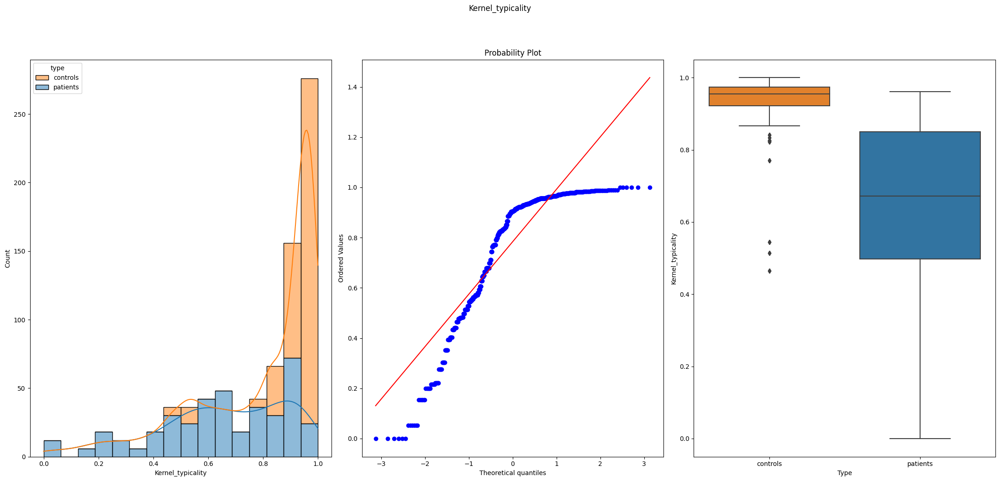

In [28]:
explore_distribution(data=revcor_measures[revcor_measures.session==1], group='type', measures = ['kernel_typicality'])

In [73]:
from scipy.stats import shapiro
df=new_revcor_measures[new_revcor_measures.session==1]
patients = df[df['type'] == 'patients']['kernel_ci']
controls = df[df['type'] == 'controls']['kernel_ci']

print("patients normality:", shapiro(patients))
print("controls normality:", shapiro(controls))

patients normality: ShapiroResult(statistic=0.9130750298500061, pvalue=0.05472060665488243)
controls normality: ShapiroResult(statistic=0.5880401134490967, pvalue=9.894297363644e-07)


In [125]:
display_group_comparisons_stat(data=new_revcor_measures[new_revcor_measures.session==1], 
                               group='type', 
                               measures = [ 'kernel_ci', 'kernel_glm', 'kernel_hmm'])

------------------------------------
Mann-Whitney U Test for KERNEL_CI and TYPE
Med = 0.27 [0.12 - 0.38]
M = 0.26 [0.15 - 0.37], U=432.00, r=-0.79, p (uncorrected)=0.000, p (Bonferroni corrected)=0.000
------------------------------------
Mann-Whitney U Test for KERNEL_GLM and TYPE
Med = 0.30 [0.11 - 0.40]
M = 0.28 [0.17 - 0.39], U=439.00, r=-0.81, p (uncorrected)=0.000, p (Bonferroni corrected)=0.000
------------------------------------
Mann-Whitney U Test for KERNEL_HMM and TYPE
Med = 0.27 [0.12 - 0.45]
M = 0.28 [0.17 - 0.39], U=435.00, r=-0.80, p (uncorrected)=0.000, p (Bonferroni corrected)=0.000


<Figure size 2000x500 with 0 Axes>

#### Comparison of internal noise

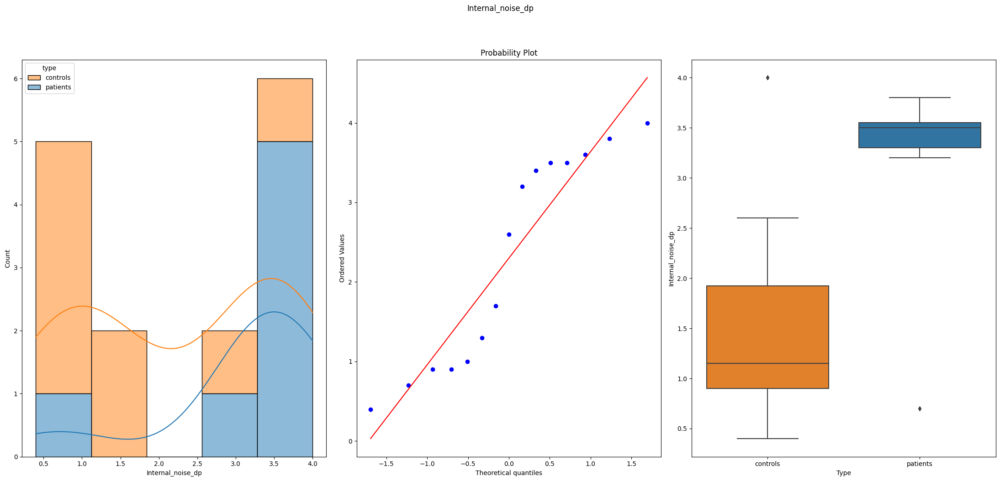

In [76]:
explore_distribution(data=new_revcor_measures[(new_revcor_measures.session==1)&(revcor_measures.method=='dp')], group='type', measures = ['internal_noise_dp'])

In [77]:
from scipy.stats import shapiro
df=new_revcor_measures[new_revcor_measures.session==1]
patients = df[df['type'] == 'patients']['internal_noise_dp']
controls = df[df['type'] == 'controls']['internal_noise_dp']

print("patients normality:", shapiro(patients))
print("controls normality:", shapiro(controls))

patients normality: ShapiroResult(statistic=0.9041699171066284, pvalue=0.036050908267498016)
controls normality: ShapiroResult(statistic=0.8579053282737732, pvalue=0.004699083045125008)


In [126]:
display_group_comparisons_stat(data=new_revcor_measures[new_revcor_measures.session==1], group='type', measures = ['internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm', 'internal_noise_old'])


------------------------------------
Mann-Whitney U Test for INTERNAL_NOISE_DP and TYPE
Med = -2.35 [-2.90 - -0.40]
M = -1.45 [-2.20 - -0.68], U=105.50, r=0.56, p (uncorrected)=0.001, p (Bonferroni corrected)=0.006
------------------------------------
Mann-Whitney U Test for INTERNAL_NOISE_GLM and TYPE
Med = -4.81 [-5.93 - -3.14]
M = -4.53 [-6.45 - -2.80], U=60.00, r=0.75, p (uncorrected)=0.000, p (Bonferroni corrected)=0.000
------------------------------------
Mann-Whitney U Test for INTERNAL_NOISE_HMM and TYPE
Med = -1.01 [-1.86 - -0.18]
M = -1.19 [-2.03 - -0.44], U=91.00, r=0.56, p (uncorrected)=0.002, p (Bonferroni corrected)=0.009
------------------------------------
Mann-Whitney U Test for INTERNAL_NOISE_OLD and TYPE
Med = -1.50 [-3.95 - -0.27]
M = -1.65 [-2.52 - -0.78], U=116.50, r=0.52, p (uncorrected)=0.003, p (Bonferroni corrected)=0.013


<Figure size 2000x500 with 0 Axes>

In [128]:
display_group_comparisons_stat(data=revcor_measures[revcor_measures.session==1], group='type', measures = ['transition_per', 'transition_unper'])


------------------------------------
Mann-Whitney U Test for TRANSITION_PER and TYPE
Med = -0.07 [-0.31 - 0.06]
M = -0.09 [-0.20 - 0.02], U=169.00, r=0.30, p=0.089
------------------------------------
Mann-Whitney U Test for TRANSITION_UNPER and TYPE
Med = 0.18 [0.06 - 0.48]
M = 0.22 [0.09 - 0.35], U=376.00, r=-0.55, p=0.002


<Figure size 2000x500 with 0 Axes>

In [130]:
display_group_comparisons_stat(data=revcor_measures[revcor_measures.session==1], group='type', measures = ['kernel_ci', 'kernel_glm', 'kernel_hmm'])


------------------------------------
Mann-Whitney U Test for KERNEL_CI and TYPE
Med = 0.27 [0.13 - 0.38]
M = 0.26 [0.15 - 0.37], U=432.00, r=-0.79, p=0.000
------------------------------------
Mann-Whitney U Test for KERNEL_GLM and TYPE
Med = 0.30 [0.11 - 0.41]
M = 0.28 [0.17 - 0.39], U=439.00, r=-0.81, p=0.000
------------------------------------
Mann-Whitney U Test for KERNEL_HMM and TYPE
Med = 0.27 [0.12 - 0.44]
M = 0.28 [0.17 - 0.39], U=435.00, r=-0.80, p=0.000


<Figure size 2000x500 with 0 Axes>

------------------------------------
Formula: INTERNAL_NOISE_OLD ~ TRANSITION_PER
                            OLS Regression Results                            
Dep. Variable:     internal_noise_old   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.013
Method:                 Least Squares   F-statistic:                  0.008065
Date:                Fri, 20 Dec 2024   Prob (F-statistic):              0.929
Time:                        18:44:36   Log-Likelihood:                -156.04
No. Observations:                  78   AIC:                             316.1
Df Residuals:                      76   BIC:                             320.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------

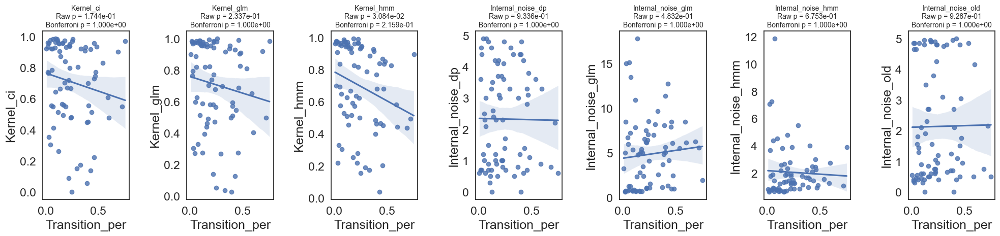

In [253]:
display_regressions(revcor_measures, predictor='transition_per', outcomes = ['kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm','internal_noise_old'])

------------------------------------
Formula: KERNEL_CI ~ TRANSITION_UNPER
                            OLS Regression Results                            
Dep. Variable:              kernel_ci   R-squared:                       0.236
Model:                            OLS   Adj. R-squared:                  0.226
Method:                 Least Squares   F-statistic:                     23.52
Date:                Fri, 20 Dec 2024   Prob (F-statistic):           6.41e-06
Time:                        18:15:20   Log-Likelihood:                 2.1560
No. Observations:                  78   AIC:                           -0.3120
Df Residuals:                      76   BIC:                             4.401
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------

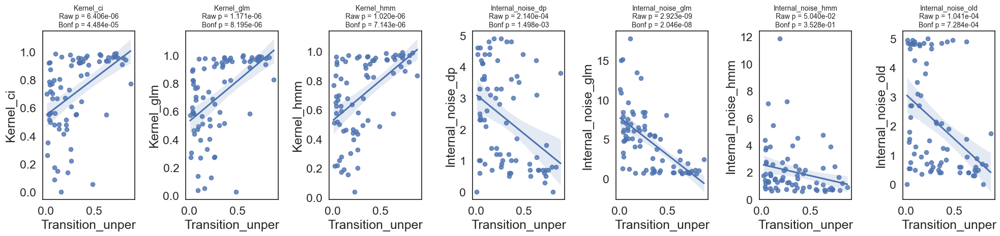

In [232]:
display_regressions(revcor_measures, predictor='transition_unper', outcomes = ['kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm','internal_noise_old'])

### Reverse correlation measures are correlated to deficits of prosodic perception as measured by MEC

We correlate revcor measures obtained within the patient group with the three MEC measures.


In [22]:
data = revcor_measures[revcor_measures.type=='patients'].merge(clinical_data[['type','subject','session',
                                                                               'prosodie_C', 'prosodie_R', 'mec']], 
                                                               how='left',
                                                                on = ['type','subject','session'])

<mark> Question whether data should be restricted to session = 1 (i.e. if different observations for the same patient should be counted as independent points) 

In [139]:
data =  data[data.session == 1]

##### MEC_total

------------------------------------
Formula: MEC ~ KERNEL_CI
                            OLS Regression Results                            
Dep. Variable:                    mec   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                 -0.047
Method:                 Least Squares   F-statistic:                   0.05259
Date:                Sat, 21 Dec 2024   Prob (F-statistic):              0.821
Time:                        01:03:55   Log-Likelihood:                -60.442
No. Observations:                  22   AIC:                             124.9
Df Residuals:                      20   BIC:                             127.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

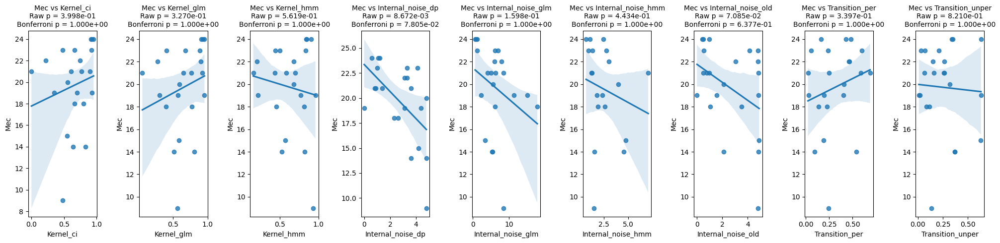

In [27]:
display_regressions(data[data.session==1], predictors=['kernel_ci', 'kernel_glm', 'kernel_hmm', 'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm', 'internal_noise_old','transition_per','transition_unper'], outcomes=['mec'])

KERNEL_CI ~ MEC

Normality Test of Residuals for kernel_ci
------------------------------------
p-value for normality: AD 0.0270 KS 0.1920

Homoscedasticity Test of Residuals for kernel_ci
------------------------------------
p-value for homoscedasticity: 0.3725
KERNEL_GLM ~ MEC

Normality Test of Residuals for kernel_glm
------------------------------------
p-value for normality: AD 0.0547 KS 0.1538

Homoscedasticity Test of Residuals for kernel_glm
------------------------------------
p-value for homoscedasticity: 0.3421
KERNEL_HMM ~ MEC

Normality Test of Residuals for kernel_hmm
------------------------------------
p-value for normality: AD 0.3571 KS 0.8307

Homoscedasticity Test of Residuals for kernel_hmm
------------------------------------
p-value for homoscedasticity: 0.3869
INTERNAL_NOISE_DP ~ MEC

Normality Test of Residuals for internal_noise_dp
------------------------------------
p-value for normality: AD 0.4553 KS 0.3283

Homoscedasticity Test of Residuals for internal_n

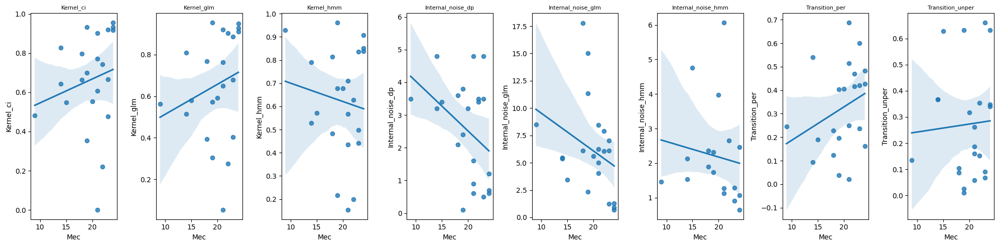

In [41]:
display_regressions_assumptions(data, predictor='mec', outcomes = [ 'kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm',
       'transition_per', 'transition_unper'])

------------------------------------
Formula: KERNEL_CI ~ MEC
                            OLS Regression Results                            
Dep. Variable:              kernel_ci   R-squared:                       0.036
Model:                            OLS   Adj. R-squared:                 -0.013
Method:                 Least Squares   F-statistic:                    0.7402
Date:                Fri, 20 Dec 2024   Prob (F-statistic):              0.400
Time:                        18:16:37   Log-Likelihood:                0.20144
No. Observations:                  22   AIC:                             3.597
Df Residuals:                      20   BIC:                             5.779
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------

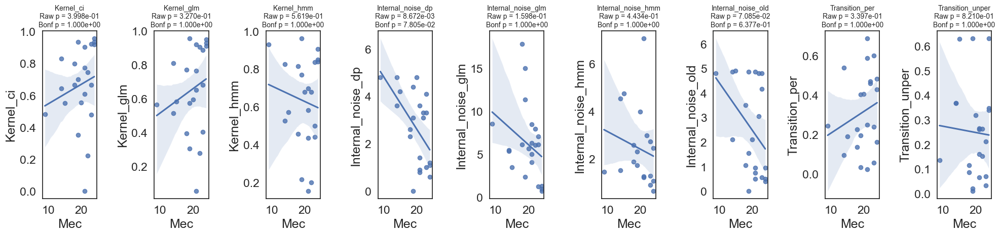

In [235]:
display_regressions(data[data.session==1], predictor='mec', outcomes = [ 'kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm','internal_noise_old',
       'transition_per', 'transition_unper'])

##### MEC Comprehension

------------------------------------
Formula: PROSODIE_C ~ KERNEL_CI
                            OLS Regression Results                            
Dep. Variable:             prosodie_C   R-squared:                       0.051
Model:                            OLS   Adj. R-squared:                  0.019
Method:                 Least Squares   F-statistic:                     1.571
Date:                Sat, 21 Dec 2024   Prob (F-statistic):              0.220
Time:                        01:05:56   Log-Likelihood:                -71.926
No. Observations:                  31   AIC:                             147.9
Df Residuals:                      29   BIC:                             150.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

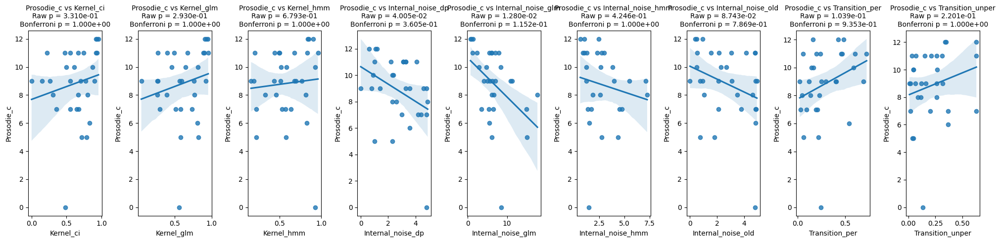

In [30]:
display_regressions(data, predictors=['kernel_ci', 'kernel_glm', 'kernel_hmm', 'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm', 'internal_noise_old','transition_per','transition_unper'], outcomes=['prosodie_C'])

KERNEL_CI ~ PROSODIE_C

Normality Test of Residuals for kernel_ci
------------------------------------
p-value for normality: AD 0.0174 KS 0.1575

Homoscedasticity Test of Residuals for kernel_ci
------------------------------------
p-value for homoscedasticity: 0.4039
KERNEL_GLM ~ PROSODIE_C

Normality Test of Residuals for kernel_glm
------------------------------------
p-value for normality: AD 0.0304 KS 0.1247

Homoscedasticity Test of Residuals for kernel_glm
------------------------------------
p-value for homoscedasticity: 0.3623
KERNEL_HMM ~ PROSODIE_C

Normality Test of Residuals for kernel_hmm
------------------------------------
p-value for normality: AD 0.4613 KS 0.3744

Homoscedasticity Test of Residuals for kernel_hmm
------------------------------------
p-value for homoscedasticity: 0.3490
INTERNAL_NOISE_DP ~ PROSODIE_C

Normality Test of Residuals for internal_noise_dp
------------------------------------
p-value for normality: AD 0.5268 KS 0.4013

Homoscedasticity Test

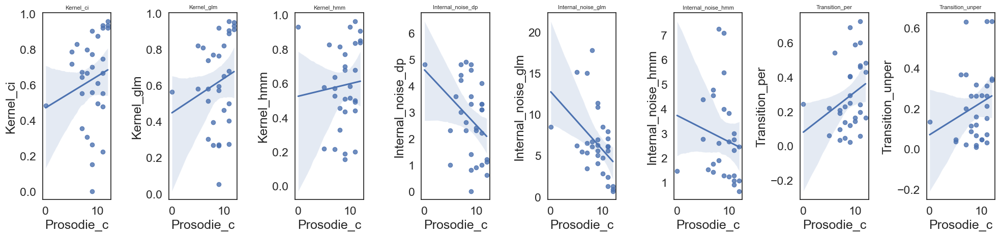

In [236]:
display_regressions_assumptions(data, predictor='prosodie_C', outcomes = [ 'kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm',
       'transition_per', 'transition_unper'])

------------------------------------
Formula: KERNEL_CI ~ PROSODIE_C
                            OLS Regression Results                            
Dep. Variable:              kernel_ci   R-squared:                       0.033
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.9775
Date:                Fri, 20 Dec 2024   Prob (F-statistic):              0.331
Time:                        18:17:14   Log-Likelihood:               -0.40696
No. Observations:                  31   AIC:                             4.814
Df Residuals:                      29   BIC:                             7.682
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

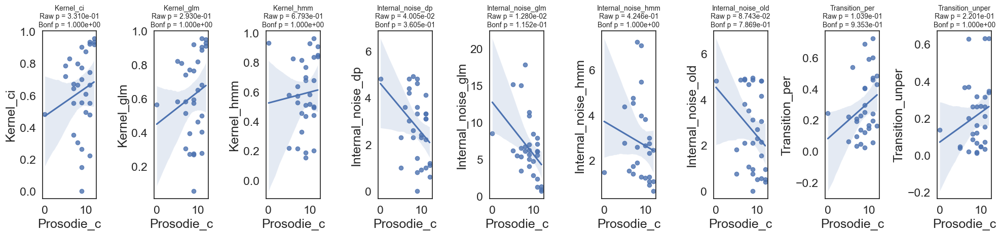

In [238]:
display_regressions(data, predictor='prosodie_C', outcomes = [ 'kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm','internal_noise_old',
       'transition_per', 'transition_unper'])

##### MEC repetition

------------------------------------
Formula: PROSODIE_R ~ KERNEL_CI
                            OLS Regression Results                            
Dep. Variable:             prosodie_R   R-squared:                       0.162
Model:                            OLS   Adj. R-squared:                  0.120
Method:                 Least Squares   F-statistic:                     3.872
Date:                Sat, 21 Dec 2024   Prob (F-statistic):             0.0631
Time:                        01:07:48   Log-Likelihood:                -39.759
No. Observations:                  22   AIC:                             83.52
Df Residuals:                      20   BIC:                             85.70
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

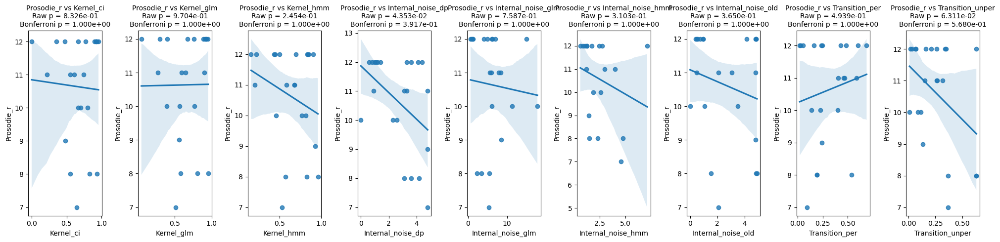

In [32]:
display_regressions(data[data.session==1], predictors=['kernel_ci', 'kernel_glm', 'kernel_hmm', 'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm', 'internal_noise_old','transition_per','transition_unper'], outcomes=['prosodie_R'])

------------------------------------
Formula: KERNEL_CI ~ PROSODIE_R
                            OLS Regression Results                            
Dep. Variable:              kernel_ci   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                 -0.017
Method:                 Least Squares   F-statistic:                    0.4998
Date:                Fri, 20 Dec 2024   Prob (F-statistic):              0.485
Time:                        18:17:59   Log-Likelihood:               -0.65590
No. Observations:                  31   AIC:                             5.312
Df Residuals:                      29   BIC:                             8.180
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

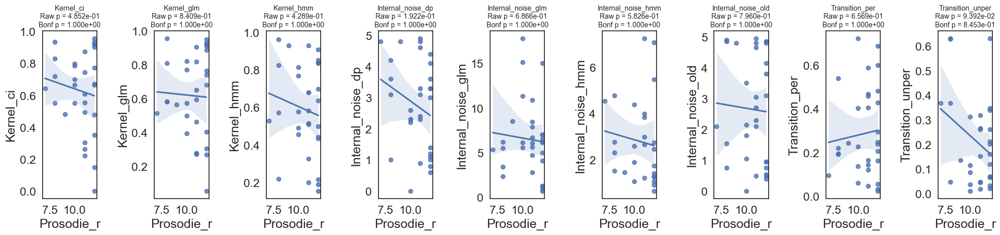

In [240]:
display_regressions(data, predictor='prosodie_R', outcomes = [ 'kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm','internal_noise_old',
       'transition_per', 'transition_unper'])

KERNEL_CI ~ PROSODIE_R

Normality Test of Residuals for kernel_ci
------------------------------------
p-value for normality: AD 0.4712 KS 0.8013

Homoscedasticity Test of Residuals for kernel_ci
------------------------------------
p-value for homoscedasticity: 0.0221
KERNEL_GLM ~ PROSODIE_R

Normality Test of Residuals for kernel_glm
------------------------------------
p-value for normality: AD 0.1425 KS 0.3336

Homoscedasticity Test of Residuals for kernel_glm
------------------------------------
p-value for homoscedasticity: 0.0280
KERNEL_HMM ~ PROSODIE_R

Normality Test of Residuals for kernel_hmm
------------------------------------
p-value for normality: AD 0.3565 KS 0.4757

Homoscedasticity Test of Residuals for kernel_hmm
------------------------------------
p-value for homoscedasticity: 0.1343
INTERNAL_NOISE_DP ~ PROSODIE_R

Normality Test of Residuals for internal_noise_dp
------------------------------------
p-value for normality: AD 0.6079 KS 0.7894

Homoscedasticity Test

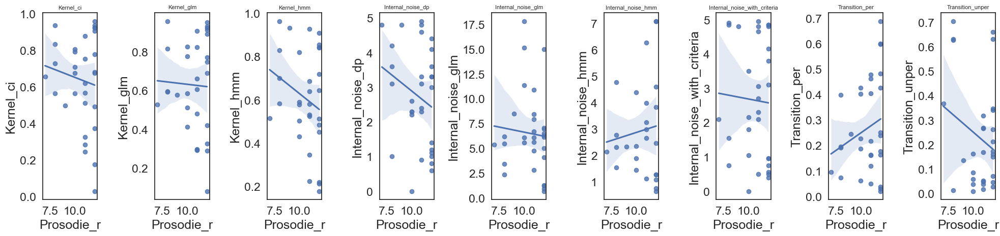

In [693]:
display_regressions_assumptions(data, predictor='prosodie_R', outcomes = [ 'kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm','internal_noise_with_criteria',
       'transition_per', 'transition_unper'])

Note MEC comprehension and repetition are correlated

In [100]:
correlation = data['prosodie_C'].corr(data['prosodie_R'])
print(correlation)

0.5378348853755178


### Reverse correlation measures discriminate patients that are negative at MEC from controls

We compare here controls with patients that are negative at MEC. The cutoff criteria for MEC is scores <= 9. Some patients are negative on comprehension, others on repetition. 


#### Patients negative on comprehension

In [161]:
# list of high-functioning patients
neg_patients = clinical_data[(clinical_data.prosodie_C>9)].subject.unique()

In [162]:
data = revcor_measures[(revcor_measures.type=='controls') | (revcor_measures.subject.isin(neg_patients))]

In [163]:
data = data[data.session==1]
data.type.value_counts()

controls    22
patients    12
Name: type, dtype: int64

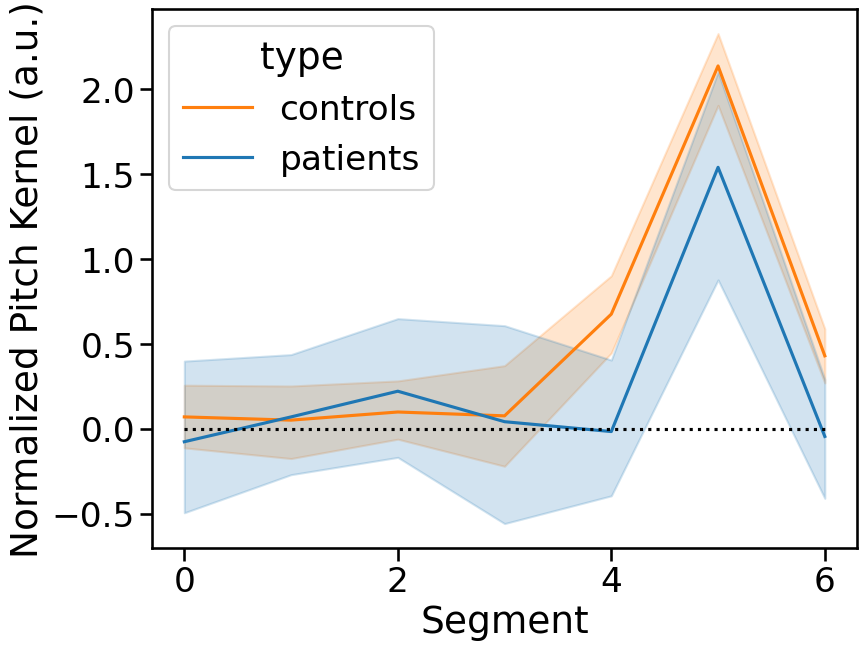

In [104]:
custom_palette = {"controls": sns.color_palette()[1], "patients": sns.color_palette()[0]}
fig = plt.figure(figsize=(20,7))
plt.subplot(1,2,1)
sns.lineplot(x="segment", 
                  y="kernel_value",
                  hue ='type',
                  data=kernels[(kernels.session==1) & 
                               ((kernels.type=='controls') | (kernels.subject.isin(neg_patients)))],
             palette=custom_palette,
                  ci=95)
plt.xlabel("Segment")
plt.ylabel("Normalized Pitch Kernel (a.u.)")
plt.plot([0,6],[0,0],color='k',linestyle = ':')

In [164]:
display_group_comparisons_stat(data=data, group='type', measures = [ 'kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm','internal_noise_old',
       'transition_per', 'transition_unper'])

------------------------------------
Mann-Whitney U Test for KERNEL_CI and TYPE
Med = 0.12 [0.01 - 0.32]
M = 0.17 [0.05 - 0.31], U=221.00, r=-0.67, p=0.001
------------------------------------
Mann-Whitney U Test for KERNEL_GLM and TYPE
Med = 0.07 [0.03 - 0.30]
M = 0.16 [0.04 - 0.30], U=225.00, r=-0.70, p=0.001
------------------------------------
Mann-Whitney U Test for KERNEL_HMM and TYPE
Med = 0.26 [0.09 - 0.48]
M = 0.25 [0.12 - 0.39], U=230.00, r=-0.74, p=0.000
------------------------------------
Mann-Whitney U Test for INTERNAL_NOISE_DP and TYPE
Med = -1.40 [-2.60 - 0.00]
M = -0.94 [-1.77 - -0.10], U=70.00, r=0.47, p=0.026
------------------------------------
Mann-Whitney U Test for INTERNAL_NOISE_GLM and TYPE
Med = -4.51 [-5.68 - -0.16]
M = -2.79 [-4.43 - -1.12], U=55.00, r=0.58, p=0.006
------------------------------------
Mann-Whitney U Test for INTERNAL_NOISE_HMM and TYPE
Med = -0.91 [-1.89 - 0.11]
M = -1.01 [-2.32 - -0.02], U=61.00, r=0.45, p=0.049
--------------------------

<Figure size 2000x500 with 0 Axes>

#### Patients negative on repetition

In [156]:
neg_patients = clinical_data[(clinical_data.prosodie_R>9)].subject.unique()

In [157]:
data = revcor_measures[(revcor_measures.type=='controls') | (revcor_measures.subject.isin(neg_patients))]

In [158]:
data = data[data.session==1]

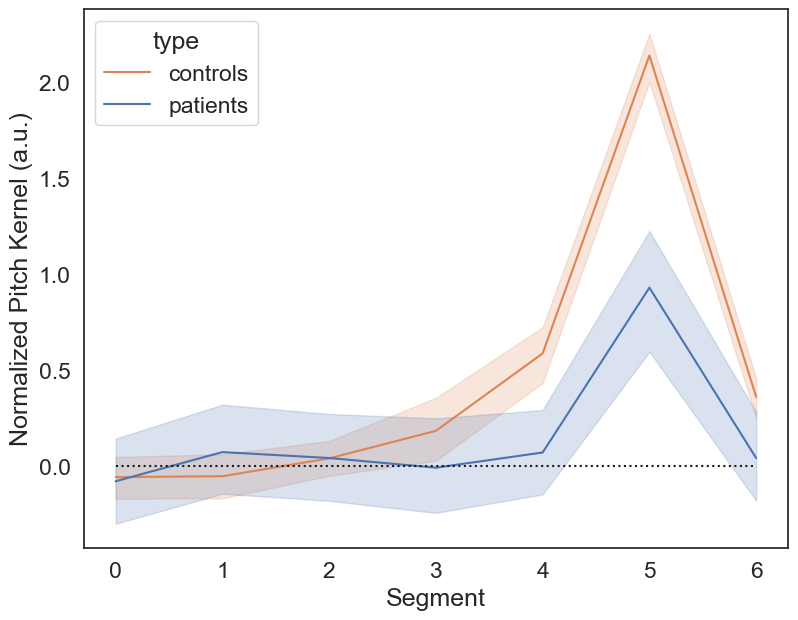

In [705]:
custom_palette = {"controls": sns.color_palette()[1], "patients": sns.color_palette()[0]}
fig = plt.figure(figsize=(20,7))
plt.subplot(1,2,1)

sns.lineplot(x="feature", 
                  y="kernel_value",
                  hue ='type',
                  data=kernels[(kernels.session==1) & 
                               ((kernels.type=='controls') | (kernels.subject.isin(neg_patients)))],
             palette=custom_palette, 
                  ci=95)

plt.xlabel("Segment")
plt.ylabel("Normalized Pitch Kernel (a.u.)")

plt.plot([0,6],[0,0],color='k',linestyle = ':')

In [160]:
display_group_comparisons_stat(data=data, group='type', measures = ['kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm','internal_noise_old',
       'transition_per', 'transition_unper'])

------------------------------------
Mann-Whitney U Test for KERNEL_CI and TYPE
Med = 0.25 [0.12 - 0.40]
M = 0.26 [0.15 - 0.39], U=376.00, r=-0.80, p=0.000
------------------------------------
Mann-Whitney U Test for KERNEL_GLM and TYPE
Med = 0.29 [0.07 - 0.41]
M = 0.28 [0.16 - 0.41], U=382.00, r=-0.83, p=0.000
------------------------------------
Mann-Whitney U Test for KERNEL_HMM and TYPE
Med = 0.27 [0.12 - 0.49]
M = 0.29 [0.18 - 0.41], U=386.00, r=-0.85, p=0.000
------------------------------------
Mann-Whitney U Test for INTERNAL_NOISE_DP and TYPE
Med = -1.85 [-2.85 - -0.20]
M = -1.24 [-2.01 - -0.43], U=103.50, r=0.50, p=0.006
------------------------------------
Mann-Whitney U Test for INTERNAL_NOISE_GLM and TYPE
Med = -5.07 [-6.94 - -3.70]
M = -4.92 [-7.08 - -2.95], U=51.00, r=0.76, p=0.000
------------------------------------
Mann-Whitney U Test for INTERNAL_NOISE_HMM and TYPE
Med = -0.75 [-1.71 - -0.06]
M = -0.92 [-1.80 - -0.16], U=89.00, r=0.49, p=0.011
-----------------------

<Figure size 2000x500 with 0 Axes>

#### Patients negative both on repetition and comprehension

In [165]:
neg_patients = clinical_data[(clinical_data.prosodie_R>9)&(clinical_data.prosodie_C>9)].subject.unique()

In [166]:
data = revcor_measures[(revcor_measures.type=='controls') | (revcor_measures.subject.isin(neg_patients))]

In [167]:
data = data[data.session==1]

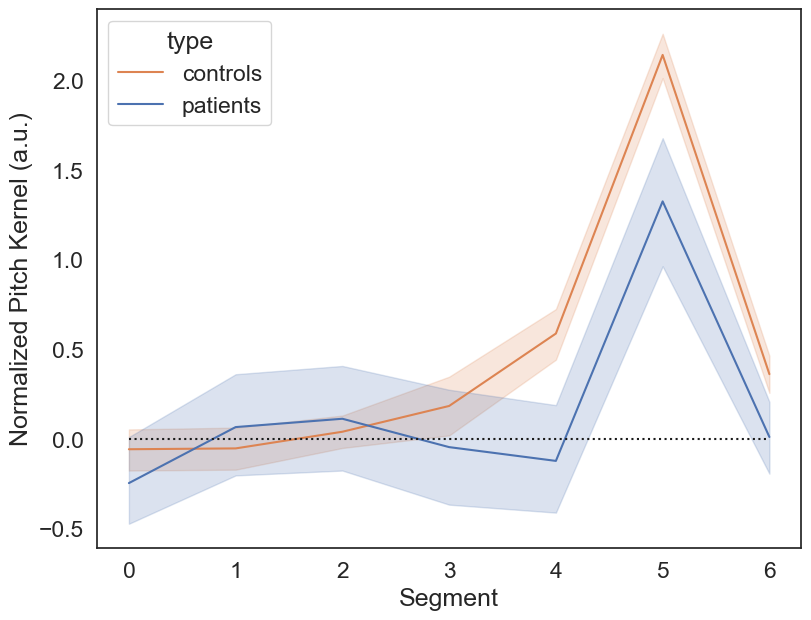

In [710]:
custom_palette = {"controls": sns.color_palette()[1], "patients": sns.color_palette()[0]}
fig = plt.figure(figsize=(20,7))
plt.subplot(1,2,1)
sns.lineplot(x="feature", 
                  y="kernel_value",
                  hue ='type',
                  data=kernels[(kernels.session==1) & 
                               ((kernels.type=='controls') | (kernels.subject.isin(neg_patients)))],
             palette=custom_palette, 
                  ci=95)
plt.xlabel("Segment")
plt.ylabel("Normalized Pitch Kernel (a.u.)")
plt.plot([0,6],[0,0],color='k',linestyle = ':')

In [168]:
display_group_comparisons_stat(data=data, 
                               group='type', 
                               measures = ['kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm','internal_noise_old',
       'transition_per', 'transition_unper'])

------------------------------------
Mann-Whitney U Test for KERNEL_CI and TYPE
Med = 0.18 [0.02 - 0.35]
M = 0.18 [0.05 - 0.33], U=207.00, r=-0.71, p=0.001
------------------------------------
Mann-Whitney U Test for KERNEL_GLM and TYPE
Med = 0.08 [0.04 - 0.32]
M = 0.18 [0.05 - 0.32], U=211.00, r=-0.74, p=0.001
------------------------------------
Mann-Whitney U Test for KERNEL_HMM and TYPE
Med = 0.27 [0.10 - 0.50]
M = 0.28 [0.15 - 0.41], U=223.00, r=-0.84, p=0.000
------------------------------------
Mann-Whitney U Test for INTERNAL_NOISE_DP and TYPE
Med = -0.45 [-2.60 - 0.10]
M = -0.86 [-1.71 - 0.00], U=68.00, r=0.44, p=0.044
------------------------------------
Mann-Whitney U Test for INTERNAL_NOISE_GLM and TYPE
Med = -5.03 [-6.05 - 0.01]
M = -2.98 [-4.71 - -1.19], U=49.00, r=0.60, p=0.006
------------------------------------
Mann-Whitney U Test for INTERNAL_NOISE_HMM and TYPE
Med = -0.40 [-2.00 - 0.21]
M = -1.01 [-2.45 - 0.08], U=59.00, r=0.40, p=0.086
-----------------------------

<Figure size 2000x500 with 0 Axes>

### Reverse correlation measures are sensitive to capacities indirectly related to the understanding of prosody

In [33]:
data = revcor_measures[revcor_measures.type=='patients'].merge(clinical_data[['type','subject','session']+
                                                                             ['mec','prosodie_C','prosodie_R','airtac','airtac_int_discr','airtac_dur_discr',
                                                                              'lama_time','lama_prec','mbea_scale','mbea_total','mbea_diff_cont',
                                                                              'mbea_equ_cont']], 
                                                               how='left',
                                                               on = ['type','subject','session'])
# data =  data[data.session == 1]

#### AIRTAC

------------------------------------
PROSODIE_R ~ AIRTAC
                            OLS Regression Results                            
Dep. Variable:             prosodie_R   R-squared:                       0.103
Model:                            OLS   Adj. R-squared:                  0.021
Method:                 Least Squares   F-statistic:                     1.263
Date:                Fri, 29 Mar 2024   Prob (F-statistic):              0.285
Time:                        12:20:25   Log-Likelihood:                -24.579
No. Observations:                  13   AIC:                             53.16
Df Residuals:                      11   BIC:                             54.29
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------

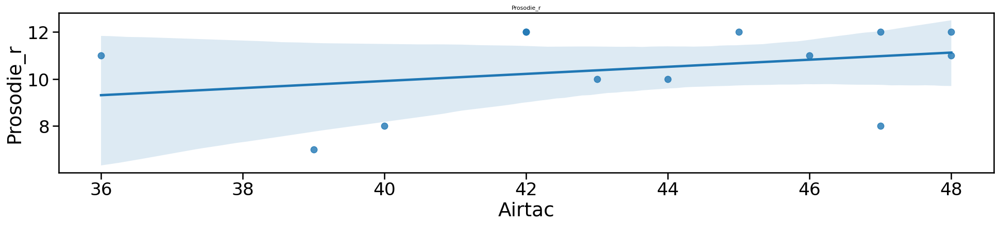

In [117]:
display_regressions(data, predictor='airtac', outcomes = ['prosodie_R'])

------------------------------------
Formula: AIRTAC ~ KERNEL_CI
                            OLS Regression Results                            
Dep. Variable:                 airtac   R-squared:                       0.044
Model:                            OLS   Adj. R-squared:                 -0.043
Method:                 Least Squares   F-statistic:                    0.5058
Date:                Sat, 21 Dec 2024   Prob (F-statistic):              0.492
Time:                        01:08:48   Log-Likelihood:                -34.752
No. Observations:                  13   AIC:                             73.50
Df Residuals:                      11   BIC:                             74.63
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------

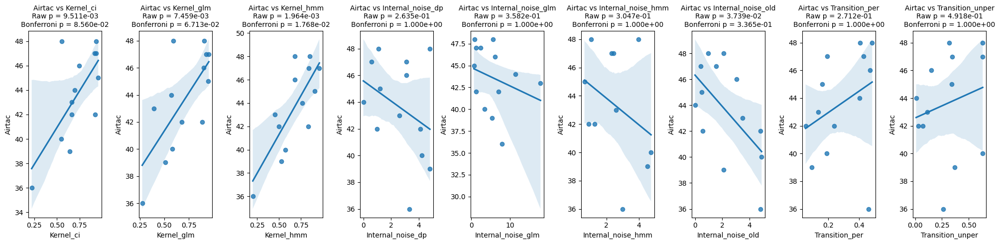

In [34]:
display_regressions(data[data.session==1], predictors=['kernel_ci', 'kernel_glm', 'kernel_hmm', 'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm', 'internal_noise_old','transition_per','transition_unper'], outcomes=['airtac'])

------------------------------------
Formula: KERNEL_CI ~ AIRTAC
                            OLS Regression Results                            
Dep. Variable:              kernel_ci   R-squared:                       0.472
Model:                            OLS   Adj. R-squared:                  0.424
Method:                 Least Squares   F-statistic:                     9.821
Date:                Fri, 20 Dec 2024   Prob (F-statistic):            0.00951
Time:                        18:18:37   Log-Likelihood:                 6.3476
No. Observations:                  13   AIC:                            -8.695
Df Residuals:                      11   BIC:                            -7.565
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------

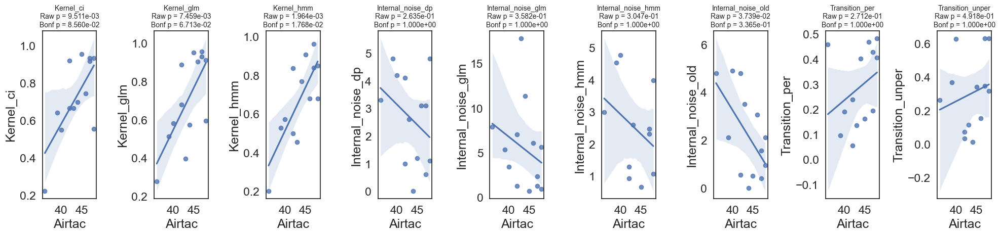

In [242]:
display_regressions(data, predictor='airtac',outcomes = ['kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm','internal_noise_old',
       'transition_per', 'transition_unper'])

KERNEL_TYPICALITY ~ AIRTAC

Normality Test of Residuals for kernel_typicality
------------------------------------
p-value for normality: AD 0.3663 KS 0.1650

Homoscedasticity Test of Residuals for kernel_typicality
------------------------------------
p-value for homoscedasticity: 0.8456
INTERNAL_NOISE_WITH_CRITERIA ~ AIRTAC

Normality Test of Residuals for internal_noise_with_criteria
------------------------------------
p-value for normality: AD 0.4352 KS 0.5326

Homoscedasticity Test of Residuals for internal_noise_with_criteria
------------------------------------
p-value for homoscedasticity: 0.3774
ACCURACY ~ AIRTAC

Normality Test of Residuals for accuracy
------------------------------------
p-value for normality: AD 0.0653 KS 0.4486

Homoscedasticity Test of Residuals for accuracy
------------------------------------
p-value for homoscedasticity: 0.8420


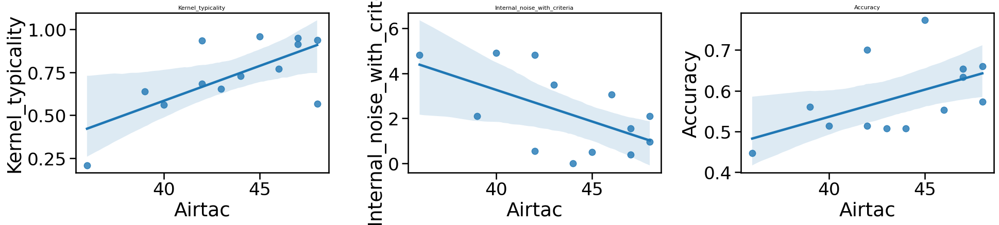

In [119]:
display_regressions_assumptions(data, predictor='airtac',outcomes = ['kernel_typicality',
                                                                           'internal_noise_with_criteria',
                                                                           'accuracy'])

------------------------------------
Formula: AIRTAC_INT_DISCR ~ KERNEL_CI
                            OLS Regression Results                            
Dep. Variable:       airtac_int_discr   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                 -0.086
Method:                 Least Squares   F-statistic:                   0.04761
Date:                Sat, 21 Dec 2024   Prob (F-statistic):              0.831
Time:                        01:09:56   Log-Likelihood:                -28.104
No. Observations:                  13   AIC:                             60.21
Df Residuals:                      11   BIC:                             61.34
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------

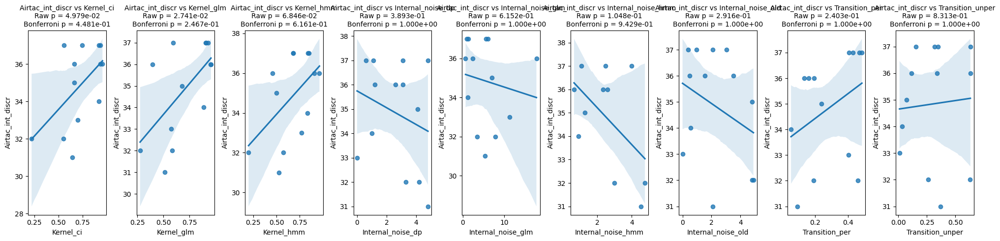

In [35]:
display_regressions(data[data.session==1], predictors=['kernel_ci', 'kernel_glm', 'kernel_hmm', 'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm', 'internal_noise_old','transition_per','transition_unper'], outcomes=['airtac_int_discr'])

------------------------------------
Formula: KERNEL_CI ~ AIRTAC_INT_DISCR
                            OLS Regression Results                            
Dep. Variable:              kernel_ci   R-squared:                       0.306
Model:                            OLS   Adj. R-squared:                  0.243
Method:                 Least Squares   F-statistic:                     4.855
Date:                Fri, 20 Dec 2024   Prob (F-statistic):             0.0498
Time:                        18:19:18   Log-Likelihood:                 4.5764
No. Observations:                  13   AIC:                            -5.153
Df Residuals:                      11   BIC:                            -4.023
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------

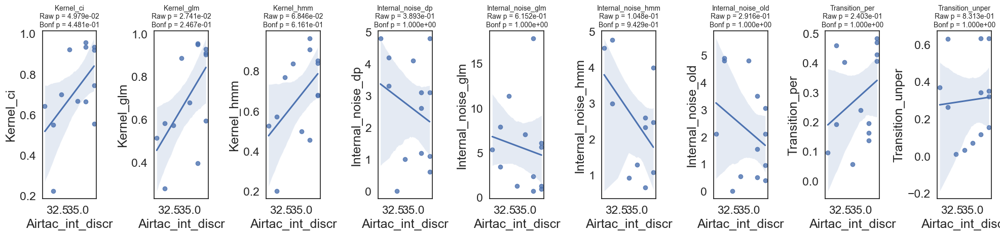

In [243]:
display_regressions(data, predictor='airtac_int_discr', outcomes = ['kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm','internal_noise_old',
       'transition_per', 'transition_unper'])

#### LAMA

------------------------------------
Formula: LAMA_PREC ~ KERNEL_CI
                            OLS Regression Results                            
Dep. Variable:              lama_prec   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                 -0.093
Method:                 Least Squares   F-statistic:                   0.06610
Date:                Sat, 21 Dec 2024   Prob (F-statistic):              0.802
Time:                        01:10:36   Log-Likelihood:                -6.9439
No. Observations:                  12   AIC:                             17.89
Df Residuals:                      10   BIC:                             18.86
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------

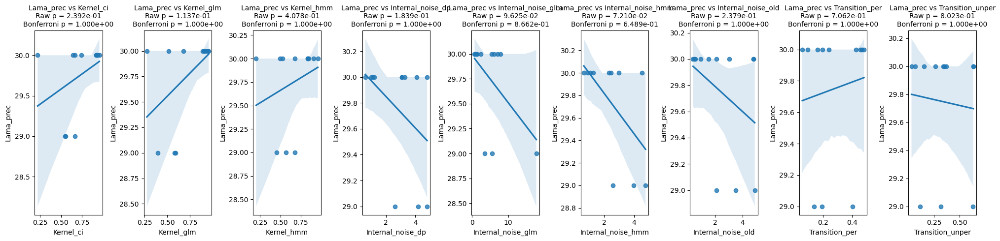

In [36]:
display_regressions(data[data.session==1], predictors=['kernel_ci', 'kernel_glm', 'kernel_hmm', 'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm', 'internal_noise_old','transition_per','transition_unper'], outcomes=['lama_prec'])

------------------------------------
Formula: KERNEL_CI ~ LAMA_PREC
                            OLS Regression Results                            
Dep. Variable:              kernel_ci   R-squared:                       0.135
Model:                            OLS   Adj. R-squared:                  0.049
Method:                 Least Squares   F-statistic:                     1.566
Date:                Fri, 20 Dec 2024   Prob (F-statistic):              0.239
Time:                        18:19:49   Log-Likelihood:                 2.4306
No. Observations:                  12   AIC:                           -0.8612
Df Residuals:                      10   BIC:                            0.1086
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

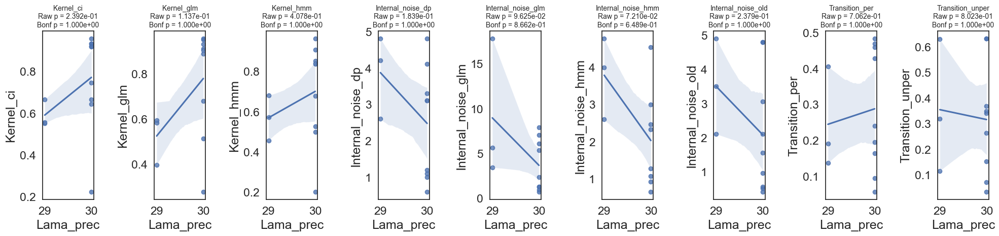

In [244]:
display_regressions(data, predictor='lama_prec', outcomes = ['kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm','internal_noise_old',
       'transition_per', 'transition_unper'])

KERNEL_TYPICALITY ~ LAMA_PREC

Normality Test of Residuals for kernel_typicality
------------------------------------
p-value for normality: AD 0.0197 KS 0.2301

Homoscedasticity Test of Residuals for kernel_typicality
------------------------------------
p-value for homoscedasticity: 0.3649
INTERNAL_NOISE_WITH_CRITERIA ~ LAMA_PREC

Normality Test of Residuals for internal_noise_with_criteria
------------------------------------
p-value for normality: AD 0.1238 KS 0.4115

Homoscedasticity Test of Residuals for internal_noise_with_criteria
------------------------------------
p-value for homoscedasticity: 0.3632
ACCURACY ~ LAMA_PREC

Normality Test of Residuals for accuracy
------------------------------------
p-value for normality: AD 0.9185 KS 0.9117

Homoscedasticity Test of Residuals for accuracy
------------------------------------
p-value for homoscedasticity: 0.1843


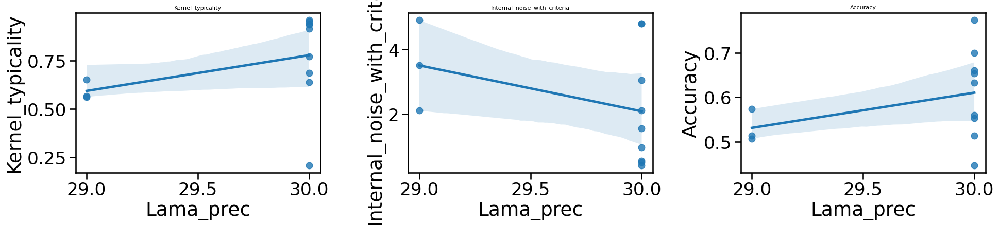

In [122]:
display_regressions_assumptions(data, predictor='lama_prec',outcomes = ['kernel_typicality',
                                                                           'internal_noise_with_criteria',
                                                                           'accuracy'])

#### MBEA

------------------------------------
Formula: MBEA_TOTAL ~ KERNEL_CI
                            OLS Regression Results                            
Dep. Variable:             mbea_total   R-squared:                       0.165
Model:                            OLS   Adj. R-squared:                  0.089
Method:                 Least Squares   F-statistic:                     2.175
Date:                Sat, 21 Dec 2024   Prob (F-statistic):              0.168
Time:                        01:11:34   Log-Likelihood:                -49.000
No. Observations:                  13   AIC:                             102.0
Df Residuals:                      11   BIC:                             103.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

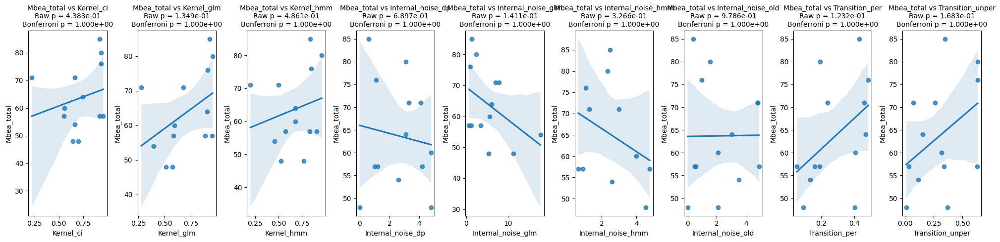

In [37]:
display_regressions(data[data.session==1], predictors=['kernel_ci', 'kernel_glm', 'kernel_hmm', 'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm', 'internal_noise_old','transition_per','transition_unper'], outcomes=['mbea_total'])

------------------------------------
Formula: KERNEL_CI ~ MBEA_TOTAL
                            OLS Regression Results                            
Dep. Variable:              kernel_ci   R-squared:                       0.056
Model:                            OLS   Adj. R-squared:                 -0.030
Method:                 Least Squares   F-statistic:                    0.6468
Date:                Fri, 20 Dec 2024   Prob (F-statistic):              0.438
Time:                        18:24:58   Log-Likelihood:                 2.5715
No. Observations:                  13   AIC:                            -1.143
Df Residuals:                      11   BIC:                          -0.01300
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

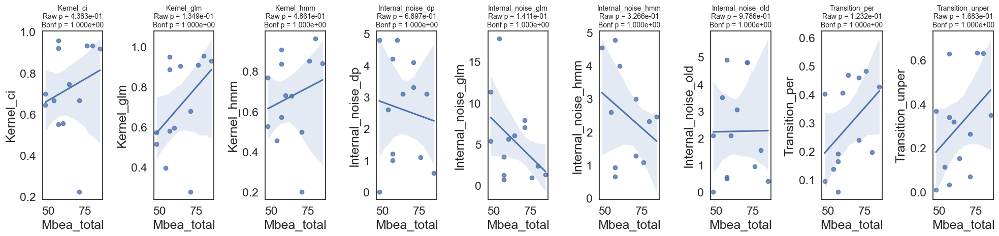

In [245]:
display_regressions(data, predictor='mbea_total', outcomes = ['kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm','internal_noise_old',
       'transition_per', 'transition_unper'])

KERNEL_TYPICALITY ~ MBEA_TOTAL

Normality Test of Residuals for kernel_typicality
------------------------------------
p-value for normality: AD 0.2092 KS 0.4492

Homoscedasticity Test of Residuals for kernel_typicality
------------------------------------
p-value for homoscedasticity: 0.5280
INTERNAL_NOISE_WITH_CRITERIA ~ MBEA_TOTAL

Normality Test of Residuals for internal_noise_with_criteria
------------------------------------
p-value for normality: AD 0.1633 KS 0.5571

Homoscedasticity Test of Residuals for internal_noise_with_criteria
------------------------------------
p-value for homoscedasticity: 0.8533
ACCURACY ~ MBEA_TOTAL

Normality Test of Residuals for accuracy
------------------------------------
p-value for normality: AD 0.5702 KS 0.8633

Homoscedasticity Test of Residuals for accuracy
------------------------------------
p-value for homoscedasticity: 0.6810


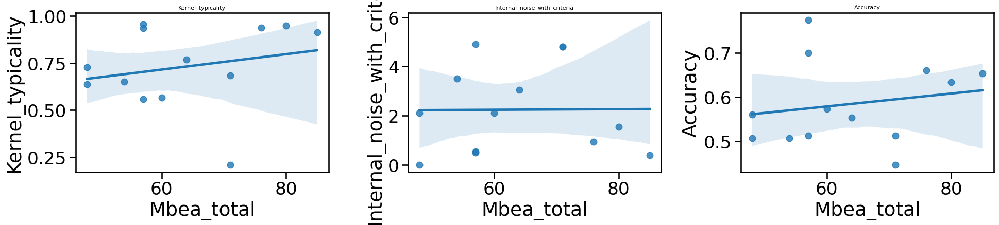

In [124]:
display_regressions_assumptions(data, predictor='mbea_total',outcomes = ['kernel_typicality',
                                                                           'internal_noise_with_criteria',
                                                                           'accuracy'])

### Are reverse correlation measures sensitive to clinical measures irrelevant to prosody?

In [122]:
clinical_data.columns

Index(['sex', 'age', 'old_subject', 'experimentor', 'type', 'session',
       'birth_date', 'study_level', 'month_avc',
       'Epreuve d'exécution\r\nd'ordres de la BDAE\r\n(score < 10/15 : exclusion)',
       'vocal_audiogram', 'hads_a', 'hads_d', 'hads', 'prosodie_C',
       'prosodie_R', 'mec', 'mbea_scale', 'mbea_diff_cont', 'mbea_equ_cont',
       'mbea_total', 'airtac_int_discr', 'airtac_dur_discr', 'airtac',
       'lama_prec', 'lama_time', 'nsc', 'type_avc', 'date_avc', 'native_fr',
       'session_date', 'designation', 'body_part', 'execution', 'prosodie_Q',
       'acte_langage', 'revcor / ordre', '125D', '250D', '500D', '750D',
       '1000D', '2000D', '3000D', '4000D', '6000D', '125G', '250G', '500G',
       '750G', '1000G', '2000G', '3000G', '4000G', '6000G', 'nihss',
       'subject'],
      dtype='object')

In [21]:
revcor_measures = revcor_measures.merge(
    revcor_measures_old[['subject', 'session', 'type']],  
    on=['subject', 'session'],  
    how='left' 
)

In [39]:
data = revcor_measures[revcor_measures.type=='patients'].merge(clinical_data[['type','subject','session']+
                                                                             ['mec','execution','hads', 'hads_a', 'hads_d', 'nihss','prosodie_C','prosodie_R','airtac','airtac_int_discr','mbea_total','lama_prec']], 
                                                               how='left',
                                                               on = ['type','subject','session'])
# data =  data[data.session == 1]

------------------------------------
Formula: KERNEL_CI ~ TRANSITION_UNPER
                            OLS Regression Results                            
Dep. Variable:              kernel_ci   R-squared:                       0.029
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     1.388
Date:                Fri, 20 Dec 2024   Prob (F-statistic):              0.245
Time:                        18:25:56   Log-Likelihood:                -1.8151
No. Observations:                  49   AIC:                             7.630
Df Residuals:                      47   BIC:                             11.41
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------

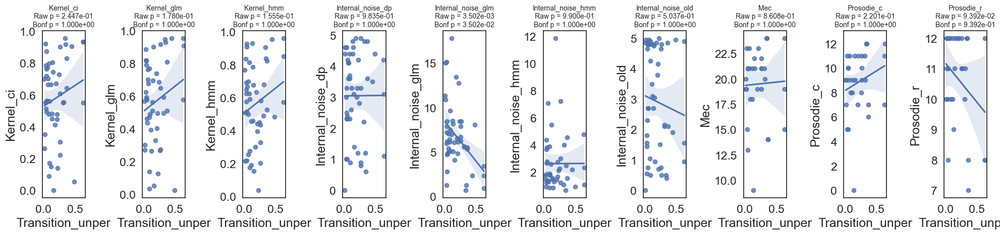

In [247]:
display_regressions(data, predictor='transition_unper', outcomes = ['kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm','internal_noise_old',
       'mec','prosodie_C','prosodie_R'])

------------------------------------
Formula: KERNEL_CI ~ TRANSITION_PER
                            OLS Regression Results                            
Dep. Variable:              kernel_ci   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.021
Method:                 Least Squares   F-statistic:                   0.01273
Date:                Fri, 20 Dec 2024   Prob (F-statistic):              0.911
Time:                        18:26:27   Log-Likelihood:                -2.5214
No. Observations:                  49   AIC:                             9.043
Df Residuals:                      47   BIC:                             12.83
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------

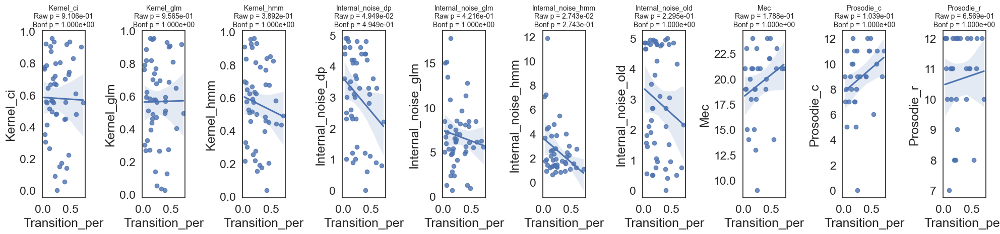

In [248]:
display_regressions(data, predictor='transition_per', outcomes = ['kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm','internal_noise_old',
       'mec','prosodie_C','prosodie_R'])

#### HADS

------------------------------------
Formula: HADS ~ KERNEL_CI
                            OLS Regression Results                            
Dep. Variable:                   hads   R-squared:                       0.033
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.9824
Date:                Sat, 21 Dec 2024   Prob (F-statistic):              0.330
Time:                        01:12:48   Log-Likelihood:                -110.62
No. Observations:                  31   AIC:                             225.2
Df Residuals:                      29   BIC:                             228.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

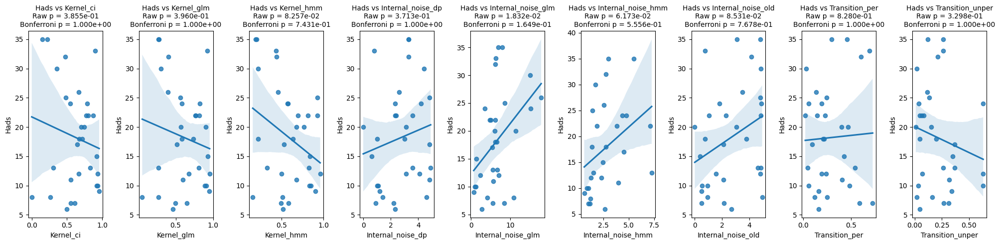

In [40]:
display_regressions(data, predictors=['kernel_ci', 'kernel_glm', 'kernel_hmm', 'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm', 'internal_noise_old','transition_per','transition_unper'], outcomes=['hads'])

------------------------------------
Formula: KERNEL_CI ~ HADS
                            OLS Regression Results                            
Dep. Variable:              kernel_ci   R-squared:                       0.026
Model:                            OLS   Adj. R-squared:                 -0.008
Method:                 Least Squares   F-statistic:                    0.7762
Date:                Fri, 20 Dec 2024   Prob (F-statistic):              0.386
Time:                        18:27:55   Log-Likelihood:               -0.51136
No. Observations:                  31   AIC:                             5.023
Df Residuals:                      29   BIC:                             7.891
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------

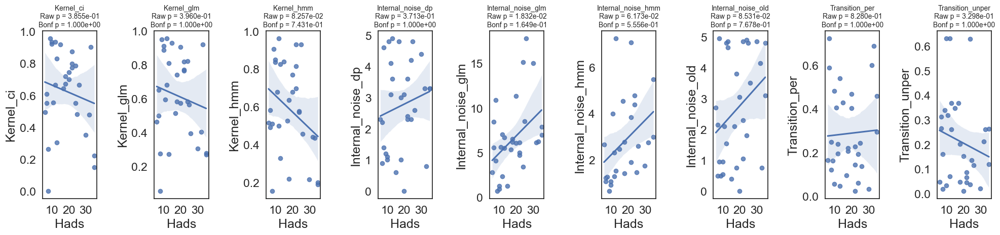

In [249]:
display_regressions(data, predictor='hads', outcomes = ['kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm','internal_noise_old',
       'transition_per', 'transition_unper'])

## Figures

### Participant's table

In [127]:
from tableone import TableOne

In [128]:
clinical_data['audiogram_G'] = clinical_data[['1000G']].mean(axis=1)
clinical_data['audiogram_D']=clinical_data[['1000D']].mean(axis=1)
clinical_data['audiogram']=clinical_data[['audiogram_D','audiogram_G']].mean(axis=1)

In [129]:
clinical_data[['lama_prec','lama_time','airtac_int_discr','airtac_dur_discr','airtac','hads_a', 'hads_d', 'hads', 'mbea_scale', 'mbea_diff_cont',
       'mbea_equ_cont', 'mbea_total']].quantile([0.25, 0.5, 0.75]).T

,0.25,0.50,0.75
lama_prec,29.75,30.0,30.0
lama_time,85.75,92.5,137.0
airtac_int_discr,33.00,36.0,37.0
airtac_dur_discr,8.00,9.0,11.0
airtac,42.00,44.0,47.0
hads_a,7.00,8.0,14.0
hads_d,4.00,6.0,8.0
hads,10.50,18.0,24.0
mbea_scale,18.00,21.0,25.0
mbea_diff_cont,20.00,22.0,25.0


In [131]:
#table=clinical_data1.groupby([[clinical_data.session==1]'type','subject','experimentor','age','sex','session'],dropna=False)['block','trial'].nunique().reset_index()
#table
columns=['sex','age','month_avc','type_avc','nihss','prosodie_C','prosodie_R','execution', 'type','audiogram_G','audiogram_D','vocal_audiogram','hads_a', 'hads_d', 'hads', 
 'mbea_scale','mec', 'mbea_diff_cont', 'mbea_equ_cont','mbea_total', 'airtac_int_discr', 'airtac_dur_discr', 'airtac', 'lama_prec', 'lama_time']
categorical = ['sex','type_avc']
groupby = ['type']
nonnormal = ['age','audiogram_G','audiogram_D','vocal_audiogram','nihss','prosodie_C','prosodie_R','month_avc','execution','hads_a', 'hads_d', 'hads','mec' 
 'mbea_scale', 'mbea_diff_cont', 'mbea_equ_cont','mbea_total', 'airtac_int_discr', 'airtac_dur_discr', 'airtac', 'lama_prec', 'lama_time']
mytable = TableOne(clinical_data[clinical_data.session==1], columns=columns, nonnormal=nonnormal,categorical=categorical, groupby=groupby, pval=False)
mytable

Grouped by type                                                        
                                              Missing            Overall          controls           patients
n                                                                     43                21                 22
sex, n (%)                       f                  0          13 (30.2)          8 (38.1)           5 (22.7)
                                 m                             30 (69.8)         13 (61.9)          17 (77.3)
age, median [Q1,Q3]                                 0   59.0 [52.0,63.5]  58.0 [52.0,64.0]   60.5 [52.2,63.0]
month_avc, median [Q1,Q3]                          21      4.0 [1.0,5.0]     nan [nan,nan]      4.0 [1.0,5.0]
type_avc, n (%)                  HEM               34           3 (33.3)                             3 (33.3)
                                 ISCH                           6 (66.7)                             6 (66.7)
nihss, median [Q1,Q3]                              32    10.0 [5.5,16.0]     nan [nan,nan]    10.0 [5.5,16.0]
prosodie_C, median [Q1,Q3]                         21     9.0 [8.0,11.0]     nan [nan,nan]     9.0 [8.0,11.0]
prosodie_R, median [Q1,Q3]                         21   11.0 [10.0,12.0]     nan [nan,nan]   11.0 [10.0,12.0]
execution, median [Q1,Q3]                          34   15.0 [14.0,15.0]     nan [nan,nan]   15.0 [14.0,15.0]
audiogram_G, median [Q1,Q3]                        31    15.0 [7.5,27.5]    0.0 [0.0,15.0]   20.0 [15.0,30.0]
audiogram_D, median [Q1,Q3]                        31    12.5 [5.0,31.2]    5.0 [0.0,20.0]    15.0 [7.5,37.5]
vocal_audiogram, median [Q1,Q3]                    30  99.0 [94.0,100.0]     nan [nan,nan]  99.0 [94.0,100.0]
hads_a, median [Q1,Q3]                             30     8.0 [7.0,14.0]     nan [nan,nan]     8.0 [7.0,14.0]
hads_d, median [Q1,Q3]                             30      6.0 [4.0,8.0]     nan [nan,nan]      6.0 [4.0,8.0]
hads, median [Q1,Q3]                               21   18.5 [11.2,24.8]     nan [nan,nan]   18.5 [11.2,24.8]
mbea_scale, mean (SD)                              30         21.2 (5.1)         nan (nan)         21.2 (5.1)
mec, mean (SD)                                     21         19.7 (3.9)         nan (nan)         19.7 (3.9)
mbea_diff_cont, median [Q1,Q3]                     30   22.0 [20.0,25.0]     nan [nan,nan]   22.0 [20.0,25.0]
mbea_equ_cont, median [Q1,Q3]                      30   18.0 [17.0,22.0]     nan [nan,nan]   18.0 [17.0,22.0]
mbea_total, median [Q1,Q3]                         30   60.0 [57.0,71.0]     nan [nan,nan]   60.0 [57.0,71.0]
airtac_int_discr, median [Q1,Q3]                   30   36.0 [33.0,37.0]     nan [nan,nan]   36.0 [33.0,37.0]
airtac_dur_discr, median [Q1,Q3]                   30     9.0 [8.0,11.0]     nan [nan,nan]     9.0 [8.0,11.0]
airtac, median [Q1,Q3]                             30   44.0 [42.0,47.0]     nan [nan,nan]   44.0 [42.0,47.0]
lama_prec, median [Q1,Q3]                          31   30.0 [29.8,30.0]     nan [nan,nan]   30.0 [29.8,30.0]
lama_time, median [Q1,Q3]                          31  92.5 [85.8,137.0]     nan [nan,nan]  92.5 [85.8,137.0]

In [112]:
import openpyxl
mytable.to_excel('pics/mytable.xlsx')

### Figure 2

In [187]:
revcor_measures.columns

Index(['subject', 'session', 'kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm',
       'transition_per', 'transition_unper', 'internal_noise_old',
       'predicted_states', 'engaged_trials', 'pitch', 'trial', 'response',
       'stim_order', 'kernel_ci_values', 'kernel_glm_values',
       'kernel_hmm_values', 'type'],
      dtype='object')

In [186]:
conditions = [
    (clinical_data['type'] == 'patients') & ((clinical_data['prosodie_C'] > 9) ),
    (clinical_data['type'] == 'patients') & ((clinical_data['prosodie_C'] <= 9)),
    (clinical_data['type'] == 'controls')
    ]
values = ['patients with MEC>9', 'patients with MEC<=9', 'controls']
clinical_data['new_type'] = np.select(conditions, values)


In [188]:
kernels=pd.merge(kernels, clinical_data[['subject', 'new_type','session']],
                     on=['subject','session'], 
                     how='left')

revcor_measures=pd.merge(revcor_measures, clinical_data[['subject', 'new_type','session']],
                     on=['subject','session'], 
                     how='left')

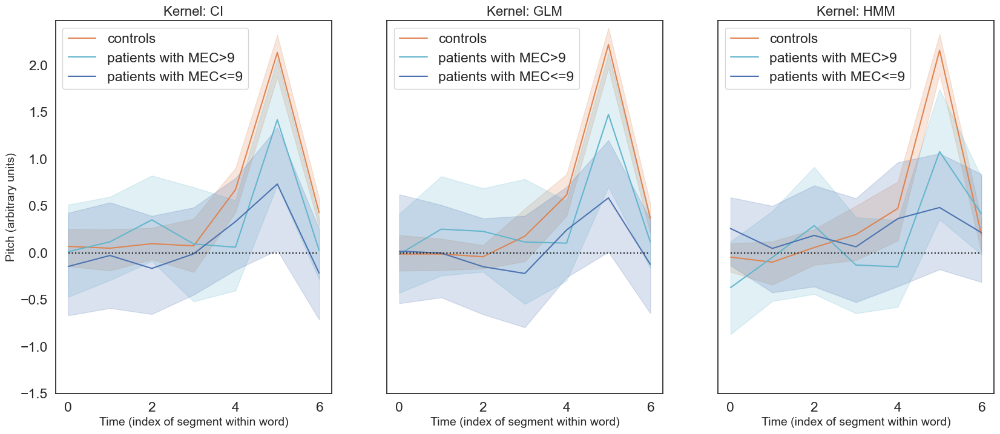

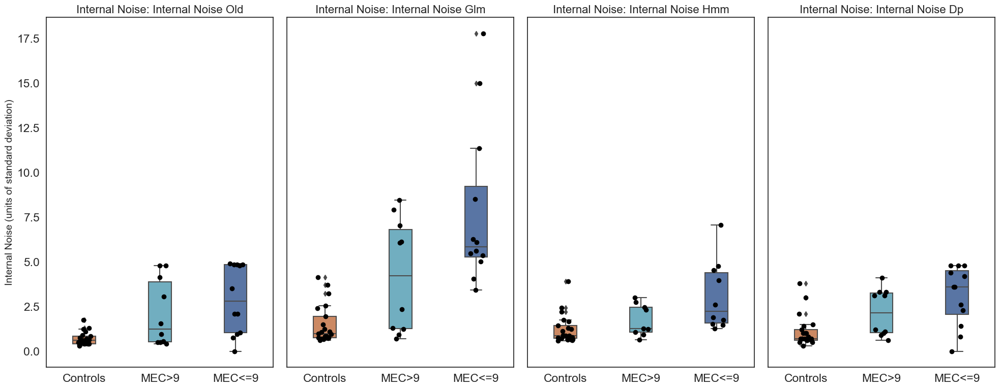

In [193]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set font scale and style
sns.set(font_scale=1.5)
my_palette = {
    "controls": sns.color_palette()[1],
    "patients with MEC>9": sns.color_palette()[9],
    "patients with MEC<=9": sns.color_palette()[0],
}
sns.set_style("white")

# Define order for the plots
orders = ["controls", "patients with MEC>9", "patients with MEC<=9"]
custom_labels = ["Controls", "MEC>9", "MEC<=9"]

# Create figure for kernels
fig, axes = plt.subplots(1, 3, figsize=(20, 8), sharey=True)
kernel_methods = ['ci', 'glm', 'hmm']

for i, kernel_method in enumerate(kernel_methods):
    sns.lineplot(
        x="feature",
        y="kernel_value",
        hue="new_type",
        data=kernels[(kernels.session == 1) & (kernels.kernel == kernel_method)],
        ci=95,
        hue_order=orders,
        ax=axes[i],
        palette=my_palette
    )
    axes[i].set_title(f"Kernel: {kernel_method.upper()}", fontsize=16)
    axes[i].set_xlabel("Time (index of segment within word)", fontsize=14)
    axes[i].plot([0, 6], [0, 0], color="k", linestyle=":")
    axes[i].set_ylim(-1.5, None)
    if i == 0:
        axes[i].set_ylabel("Pitch (arbitrary units)", fontsize=14)
    else:
        axes[i].set_ylabel(None)
    axes[i].legend(title=None)

# Create figure for internal noise
fig, axes = plt.subplots(1, 4, figsize=(20, 8), sharey=True)
internal_noise_metrics = ['internal_noise_old', 'internal_noise_glm', 'internal_noise_hmm', 'internal_noise_dp']

for i, noise_metric in enumerate(internal_noise_metrics):
    sns.boxplot(
        data=revcor_measures[(revcor_measures.session == 1)].dropna(subset=["new_type"]),
        x="new_type",
        y=noise_metric,
        ax=axes[i],
        palette=my_palette,
        order=orders,
        width=0.3,
        whis=1,
    )
    sns.stripplot(
        data=revcor_measures[(revcor_measures.session == 1)].dropna(subset=["new_type"]),
        x="new_type",
        y=noise_metric,
        dodge=True,
        alpha=1,
        zorder=20,
        size=7,
        jitter=True,
        color="black",
        ax=axes[i],
        order=orders,
    )
    axes[i].set_title(f"Internal Noise: {noise_metric.replace('_', ' ').title()}", fontsize=16)
    axes[i].set_xlabel(None)
    axes[i].set_xticklabels(custom_labels)  # Update x-axis labels

    if i == 0:
        axes[i].set_ylabel("Internal Noise (units of standard deviation)", fontsize=14)
    else:
        axes[i].set_ylabel(None)
    #axes[i].set_ylim(-0.5, 5.5)
    axes[i].invert_yaxis()

fig.tight_layout()
plt.show()


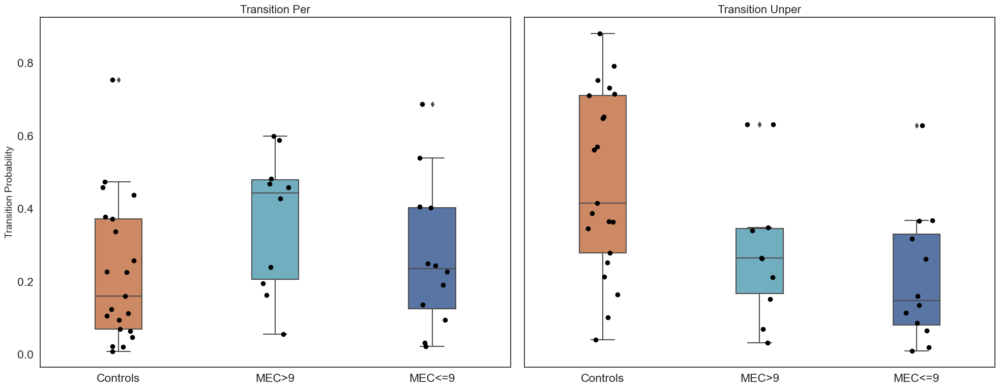

In [197]:
# Create figure for internal noise
fig, axes = plt.subplots(1, 2, figsize=(20, 8), sharey=True)
internal_noise_metrics = ['transition_per', 'transition_unper']

for i, noise_metric in enumerate(internal_noise_metrics):
    sns.boxplot(
        data=revcor_measures[(revcor_measures.session == 1)].dropna(subset=["new_type"]),
        x="new_type",
        y=noise_metric,
        ax=axes[i],
        palette=my_palette,
        order=orders,
        width=0.3,
        whis=1,
    )
    sns.stripplot(
        data=revcor_measures[(revcor_measures.session == 1)].dropna(subset=["new_type"]),
        x="new_type",
        y=noise_metric,
        dodge=True,
        alpha=1,
        zorder=20,
        size=7,
        jitter=True,
        color="black",
        ax=axes[i],
        order=orders,
    )
    axes[i].set_title(f"{noise_metric.replace('_', ' ').title()}", fontsize=16)
    axes[i].set_xlabel(None)
    axes[i].set_xticklabels(custom_labels)  # Update x-axis labels

    if i == 0:
        axes[i].set_ylabel("Transition Probability", fontsize=14)
    else:
        axes[i].set_ylabel(None)
    #axes[i].set_ylim(-0.5, 5.5)
    axes[i].invert_yaxis()

fig.tight_layout()
plt.show()


In [140]:
from scipy.stats import shapiro
df=revcor_measures[revcor_measures.session==1]
neg_patients = df[df['new_type'] == 'patients with MEC>9']['kernel_typicality']
pos_patients = df[df['new_type'] == 'patients with MEC<=9']['kernel_typicality']
controls = df[df['new_type'] == 'controls']['kernel_typicality']

print("patients with MEC>9 normality:", shapiro(neg_patients))
print("patients with MEC<=9 normality:", shapiro(pos_patients))
print("controls normality:", shapiro(controls))

patients with MEC>9 normality: ShapiroResult(statistic=0.8407812714576721, pvalue=0.04508548602461815)
patients with MEC<=9 normality: ShapiroResult(statistic=0.9041004180908203, pvalue=0.17916058003902435)
controls normality: ShapiroResult(statistic=0.5322815179824829, pvalue=4.0942381929198746e-07)


In [ ]:
from scipy.stats import kruskal, mannwhitneyu
import statsmodels.stats.multicomp as mc
df=revcor_measures[revcor_measures.session==1]
# Perform the Kruskal-Wallis H-test
kw_result = kruskal(*[experimentor['kernel_typicality'].values for name, experimentor in df.groupby('new_type')])

print(f"Kruskal-Wallis H-test result: H = {kw_result.statistic}, p-value = {kw_result.pvalue}")

if kw_result.pvalue < 0.05:
    print("Significant Kruskal-Wallis result. Proceeding with pairwise comparisons.")

    pairwise_comparison = mc.pairwise_tukeyhsd

Kruskal-Wallis H-test result: H = 22.586152219873128, p-value = 1.2458890295387143e-05
Significant Kruskal-Wallis result. Proceeding with pairwise comparisons.


In [727]:
df = new_revcor_measures

# Define the metrics
metrics = ['kernel_ci', 'kernel_glm', 'kernel_hmm', 'internal_noise_with_criteria',
           'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm', 
           'transition_per', 'transition_unper']

# Calculate both mean and median for each metric grouped by 'new_type'
summary_df = df.groupby('type')[metrics].agg(['median']).reset_index()

# Flatten multi-level columns for better readability
summary_df.columns = ['_'.join(col).strip('_') if isinstance(col, tuple) else col for col in summary_df.columns]
print(summary_df)

       type  kernel_ci_median  kernel_glm_median  kernel_hmm_median  \
0  controls          0.957373           0.974215           0.950331   
1  patients          0.576903           0.594145           0.588995   

   internal_noise_with_criteria_median  internal_noise_dp_median  \
0                                  0.6                       0.7   
1                                  2.7                       3.3   

   internal_noise_glm_median  internal_noise_hmm_median  \
0                   0.956784                   0.840778   
1                   6.168926                   1.872851   

   transition_per_median  transition_unper_median  
0               0.160836                 0.561002  
1               0.195790                 0.137285  


In [731]:
df = new_revcor_measures[new_revcor_measures.session == 1]

# Define the metrics
metrics = ['kernel_ci', 'kernel_glm', 'kernel_hmm', 
           'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm', 'internal_noise_with_criteria',
           'transition_per', 'transition_unper']

# Calculate both mean and median for each metric grouped by 'new_type'
summary_df = df.groupby('new_type')[metrics].agg(['median']).reset_index()

# Flatten multi-level columns for better readability
summary_df.columns = ['_'.join(col).strip('_') if isinstance(col, tuple) else col for col in summary_df.columns]
print(summary_df)

               new_type  kernel_ci_median  kernel_glm_median  \
0              controls          0.955416           0.966484   
1  patients with MEC<=9          0.664436           0.589137   
2   patients with MEC>9          0.836022           0.898519   

   kernel_hmm_median  internal_noise_dp_median  internal_noise_glm_median  \
0           0.945700                      0.75                   1.031365   
1           0.581215                      3.60                   5.857660   
2           0.739568                      2.15                   4.210011   

   internal_noise_hmm_median  internal_noise_with_criteria_median  \
0                   0.880683                                 0.60   
1                   2.345473                                 2.80   
2                   1.199401                                 1.25   

   transition_per_median  transition_unper_median  
0               0.173522                 0.424294  
1               0.235347                 0.147980  
2

In [194]:
from scipy.stats import kruskal, mannwhitneyu
import statsmodels.stats.multicomp as mc

metrics = ['kernel_ci', 'kernel_glm', 'kernel_hmm','internal_noise_old', 
           'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm', 
           'transition_per', 'transition_unper']
df=revcor_measures[revcor_measures.session==1]
groups = df['new_type'].unique()

results = []

# Loop through each metric and group combinations
for metric in metrics:
    for i in range(len(groups)):
        for j in range(i + 1, len(groups)):
            # Extract data for the two groups
            group1_data = df[df['new_type'] == groups[i]][metric].dropna().values
            group2_data = df[df['new_type'] == groups[j]][metric].dropna().values
            
            # Check if both groups have non-zero size
            if len(group1_data) == 0 or len(group2_data) == 0:
                continue  # Skip this pair if either group has no data
            
            # Perform Mann-Whitney U test
            stat, pvalue = mannwhitneyu(group1_data, group2_data)
            
            # Append results
            results.append({
                'Metric': metric,
                'Group1': groups[i],
                'Group2': groups[j],
                'U-statistic': stat,
                'P-value': pvalue
            })

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
results_df['Significant'] = results_df['P-value'].apply(lambda p: '*' if p < 0.05 else '')

# Display results
results_df

# # Check for any significant results
# if not results_df.empty and results_df['P-value'].min() < 0.05:
#     print("Found significant differences between some pairs. Consider post-hoc analysis.")
# else:
#     print("No significant differences found between any pairs.")

,Metric,Group1,Group2,U-statistic,P-value,Significant
0,kernel_ci,controls,patients with MEC<=9,239.0,0.000026,*
1,kernel_ci,controls,patients with MEC>9,177.0,0.002516,*
2,kernel_ci,patients with MEC<=9,patients with MEC>9,37.0,0.137913,
3,kernel_glm,controls,patients with MEC<=9,241.0,0.000018,*
4,kernel_glm,controls,patients with MEC>9,183.0,0.001057,*
5,kernel_glm,patients with MEC<=9,patients with MEC>9,31.0,0.060213,
6,kernel_hmm,controls,patients with MEC<=9,238.0,0.000030,*
7,kernel_hmm,controls,patients with MEC>9,182.0,0.001226,*
8,kernel_hmm,patients with MEC<=9,patients with MEC>9,44.0,0.306762,
9,internal_noise_old,controls,patients with MEC<=9,35.5,0.000743,*


In [143]:
from scipy.stats import shapiro
df=revcor_measures[revcor_measures.session==1]
neg_patients = df[df['new_type'] == 'patients with MEC>9']['internal_noise_with_criteria']
pos_patients = df[df['new_type'] == 'patients with MEC<=9']['internal_noise_with_criteria']
controls = df[df['new_type'] == 'controls']['internal_noise_with_criteria']

print("patients with MEC>9 normality:", shapiro(neg_patients))
print("patients with MEC<=9 normality:", shapiro(pos_patients))
print("controls normality:", shapiro(controls))

patients with MEC>9 normality: ShapiroResult(statistic=0.8048219680786133, pvalue=0.0165919940918684)
patients with MEC<=9 normality: ShapiroResult(statistic=0.8382763862609863, pvalue=0.026384809985756874)
controls normality: ShapiroResult(statistic=0.853102445602417, pvalue=0.00480622798204422)


In [144]:
from scipy.stats import kruskal, mannwhitneyu
import statsmodels.stats.multicomp as mc
df=revcor_measures[revcor_measures.session==1]
# Perform the Kruskal-Wallis H-test
kw_result = kruskal(*[experimentor['internal_noise_with_criteria'].values for name, experimentor in df.groupby('new_type')])

print(f"Kruskal-Wallis H-test result: H = {kw_result.statistic}, p-value = {kw_result.pvalue}")

if kw_result.pvalue < 0.05:
    print("Significant Kruskal-Wallis result. Proceeding with pairwise comparisons.")

    pairwise_comparison = mc.pairwise_tukeyhsd

Kruskal-Wallis H-test result: H = 12.622558897053231, p-value = 0.0018157086466763842
Significant Kruskal-Wallis result. Proceeding with pairwise comparisons.


In [145]:
from scipy.stats import kruskal, mannwhitneyu
import statsmodels.stats.multicomp as mc
df=revcor_measures[revcor_measures.session==1]
groups = df['new_type'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['new_type'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['new_type'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs. Consider post-hoc analysis.")
else:
    print("No significant differences found between any pairs.")

                 Group1                Group2  U-statistic   P-value
0              controls  patients with MEC<=9         35.5  0.000743
1              controls   patients with MEC>9         59.5  0.056397
2  patients with MEC<=9   patients with MEC>9         81.5  0.164827
Found significant differences between some pairs. Consider post-hoc analysis.


### Figure 3

<Figure size 4000x1000 with 0 Axes>

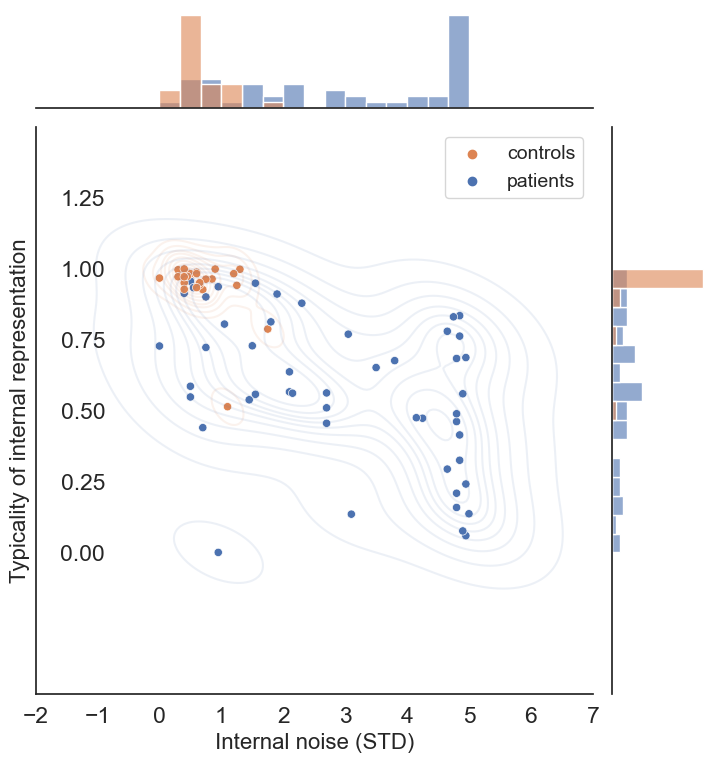

In [146]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_clusters_kde_x(data, x, y, hue, x_range, color='blue', linewidth=2, save_path=None):
    sns.set_style("white")
    filtered_data = data[(data[x] >= x_range[0]) & (data[x] <= x_range[1])]
    custom_palette = {"controls": sns.color_palette()[1],  "patients": sns.color_palette()[0]}
    g = sns.JointGrid(data=filtered_data, x=x, y=y, hue=hue, palette=custom_palette, height=8)
    
    # Customize the KDE plot color and linewidth within the sns.kdeplot function
    g.plot_joint(sns.kdeplot, fill=False, common_norm=False, bw_adjust=0.85, alpha=0.1, color=color, linewidth=linewidth)
    
    # Create histogram marginals
    g.plot_marginals(sns.histplot, color="#03051A", alpha=0.6, bins=15)
    
    g.set_axis_labels(xlabel='Internal noise (STD)', ylabel='Typicality of internal representation', fontsize=16)
    g.ax_joint.set_facecolor('white')
    g.ax_joint.set_ylim([-0.5, 1.5])
    g.ax_joint.set_yticks([ 0,0.25,0.50,0.75,1.00,1.25])
    
    g.ax_joint.tick_params(axis='y', direction='in', length=0)
    g.ax_joint.yaxis.set_tick_params(pad=-50)
    g.ax_joint.set_xlim([x_range[0], x_range[1]])  # Separate x-axis limits
    g.ax_joint.set_xticks([x_range[0]-2,x_range[0]-1,x_range[0],x_range[0]+1,x_range[0]+2,x_range[0]+3,x_range[0]+4,x_range[1]-1,x_range[1] ,x_range[1]+1])  # Adjust the x-axis ticks as needed

    sns.scatterplot(data=filtered_data, x=x, y=y, hue=hue,palette=custom_palette ,ax=g.ax_joint)
    g.ax_joint.legend(title=None, fontsize=14)
    
    # Save the plot as an image if save_path is provided
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.show()  # Show the plot

# Create the first plot
plt.figure(figsize=(40, 10))  # Create a new figure
plot_clusters_kde_x(data=new_revcor, x="internal_noise_with_criteria", y="kernel_typicality", hue='type', x_range=(0, 6), color='blue', linewidth=2, save_path='kde_org.png')

# Create the second plot
#plt.figure(figsize=(15, 10))  # Create a new figure
#plot_clusters_kde_x(data=revcor_measures, x="internal_noise_with_criteria", y="kernel_typicality", hue='type', x_range=(4, 5), color='gray', linewidth=2, save_path='kde_plot4.png')


<Figure size 4000x1000 with 0 Axes>

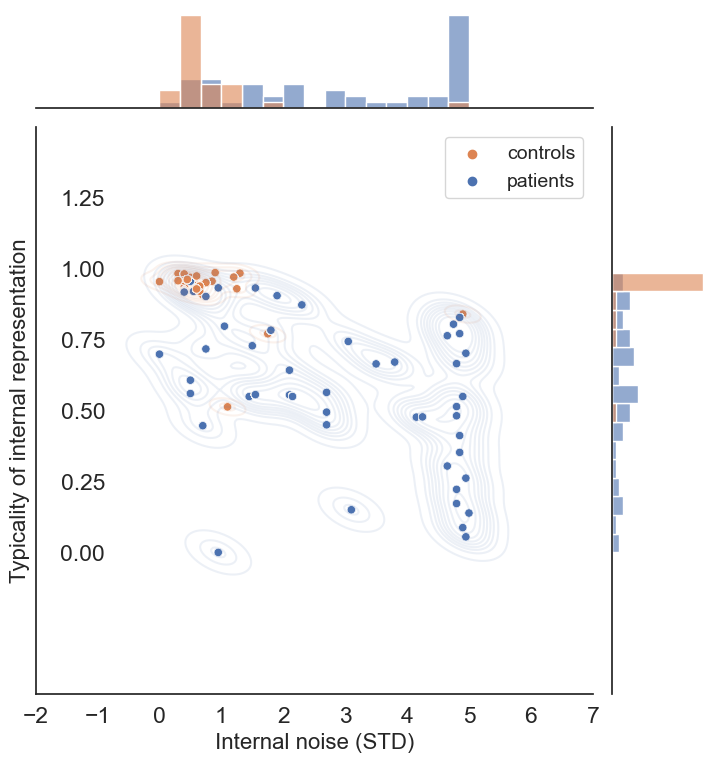

In [258]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_clusters_kde_x(data, x, y, hue, x_range, color='blue', linewidth=2, save_path=None):
    sns.set_style("white")
    filtered_data = data[(data[x] >= x_range[0]) & (data[x] <= x_range[1])]
    custom_palette = {"controls": sns.color_palette()[1],  "patients": sns.color_palette()[0]}
    g = sns.JointGrid(data=filtered_data, x=x, y=y, hue=hue, palette=custom_palette, height=8)
    
    # Customize the KDE plot color and linewidth within the sns.kdeplot function
    g.plot_joint(sns.kdeplot, fill=False, common_norm=False, bw_adjust=0.85, alpha=0.1, color=color, linewidth=linewidth)
    
    # Create histogram marginals
    g.plot_marginals(sns.histplot, color="#03051A", alpha=0.6, bins=15)
    
    g.set_axis_labels(xlabel='Internal noise (STD)', ylabel='Typicality of internal representation', fontsize=16)
    g.ax_joint.set_facecolor('white')
    g.ax_joint.set_ylim([-0.5, 1.5])
    g.ax_joint.set_yticks([ 0,0.25,0.50,0.75,1.00,1.25])
    
    g.ax_joint.tick_params(axis='y', direction='in', length=0)
    g.ax_joint.yaxis.set_tick_params(pad=-50)
    g.ax_joint.set_xlim([x_range[0], x_range[1]])  # Separate x-axis limits
    g.ax_joint.set_xticks([x_range[0]-2,x_range[0]-1,x_range[0],x_range[0]+1,x_range[0]+2,x_range[0]+3,x_range[0]+4,x_range[1]-1,x_range[1] ,x_range[1]+1])  # Adjust the x-axis ticks as needed

    sns.scatterplot(data=filtered_data, x=x, y=y, hue=hue,palette=custom_palette ,ax=g.ax_joint)
    g.ax_joint.legend(title=None, fontsize=14)
    
    # Save the plot as an image if save_path is provided
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.show()  # Show the plot

# Create the first plot
plt.figure(figsize=(40, 10))  # Create a new figure
plot_clusters_kde_x(data=new_revcor, x="internal_noise_old", y="kernel_ci", hue='type', x_range=(0, 6), color='blue', linewidth=2, save_path='kde_org.png')

# Create the second plot
#plt.figure(figsize=(15, 10))  # Create a new figure
#plot_clusters_kde_x(data=revcor_measures, x="internal_noise_with_criteria", y="kernel_typicality", hue='type', x_range=(4, 5), color='gray', linewidth=2, save_path='kde_plot4.png')


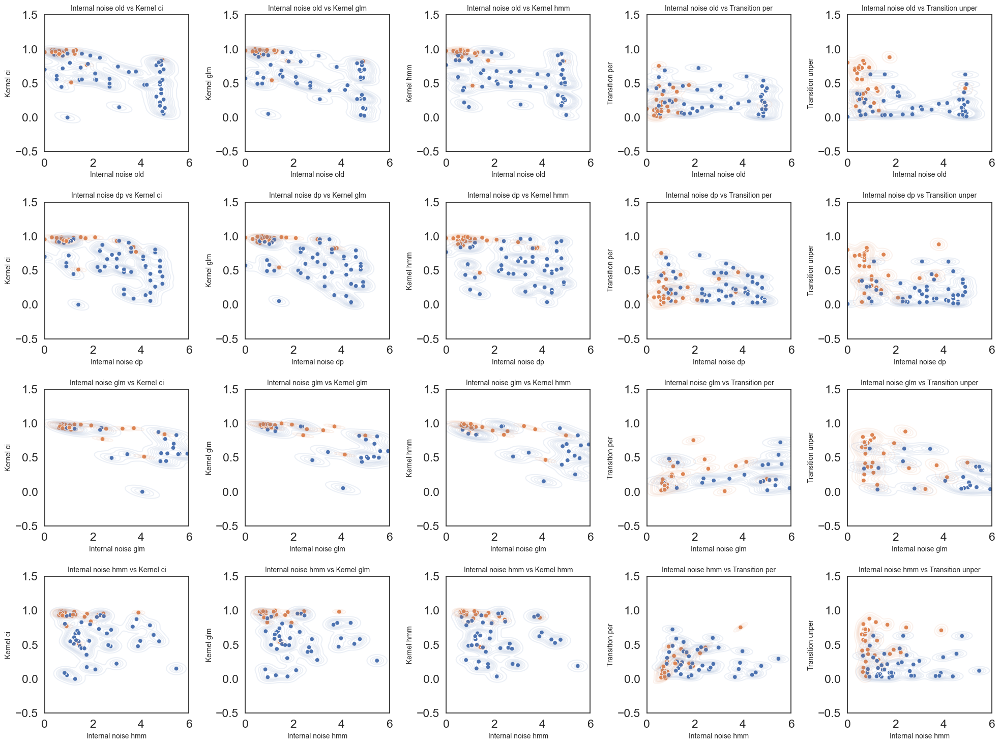

In [262]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_clusters_kde_subplot(ax, data, x, y, hue, x_range, color='blue', linewidth=2):
    """
    Generate a KDE + scatter plot for a given combination of x and y on a specific subplot (ax).
    """
    sns.set_style("white")
    filtered_data = data[(data[x] >= x_range[0]) & (data[x] <= x_range[1])]
    custom_palette = {"controls": sns.color_palette()[1], "patients": sns.color_palette()[0]}
    
    # Plot KDE
    sns.kdeplot(
        data=filtered_data, x=x, y=y, hue=hue,
        palette=custom_palette, ax=ax, fill=False,
        common_norm=False, bw_adjust=0.85, alpha=0.1, color=color, linewidth=linewidth,
        legend=False  # Disable legend in KDE plot
    )
    
    # Plot scatter
    sns.scatterplot(
        data=filtered_data, x=x, y=y, hue=hue, 
        palette=custom_palette, ax=ax, legend=False  # Disable legend in scatter plot
    )
    
    ax.set_xlabel(x.replace("_", " ").capitalize(), fontsize=10)
    ax.set_ylabel(y.replace("_", " ").capitalize(), fontsize=10)
    ax.set_xlim(x_range)
    ax.set_ylim(-0.5, 1.5)
    ax.set_facecolor('white')
    ax.grid(False)  # Disable grid lines

# List of metrics
metrics_x = ['internal_noise_old', 'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm']
metrics_y = ['kernel_ci', 'kernel_glm', 'kernel_hmm', 'transition_per', 'transition_unper']

# Determine the grid size
n_rows = len(metrics_x)
n_cols = len(metrics_y)

# Create a single figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15), sharex=False, sharey=False)

x_range_dict = {
    "internal_noise_old": (0, 6),
    "internal_noise_dp": (0, 6),
    "internal_noise_glm": (0, 6),
    "internal_noise_hmm": (0, 6),
}  # Add custom ranges for each metric_x if needed

# Loop through combinations of metrics
for i, x in enumerate(metrics_x):
    for j, y in enumerate(metrics_y):
        ax = axes[i, j]
        x_range = x_range_dict.get(x, (0, 6))  # Get custom x-range or default
        plot_clusters_kde_subplot(
            ax=ax,
            data=new_revcor,
            x=x,
            y=y,
            hue='type',
            x_range=x_range,
            color='blue',
            linewidth=2
        )
        ax.set_title(f"{x.replace('_', ' ').capitalize()} vs {y.replace('_', ' ').capitalize()}", fontsize=10)

# Adjust layout and show the combined plot
plt.tight_layout()
plt.show()


<Figure size 2500x1200 with 0 Axes>

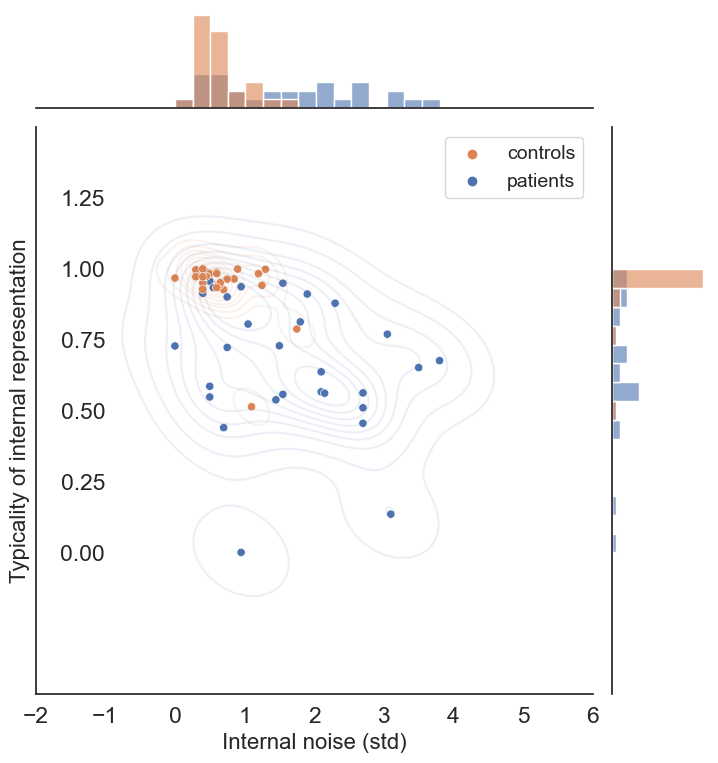

<Figure size 2500x1200 with 0 Axes>

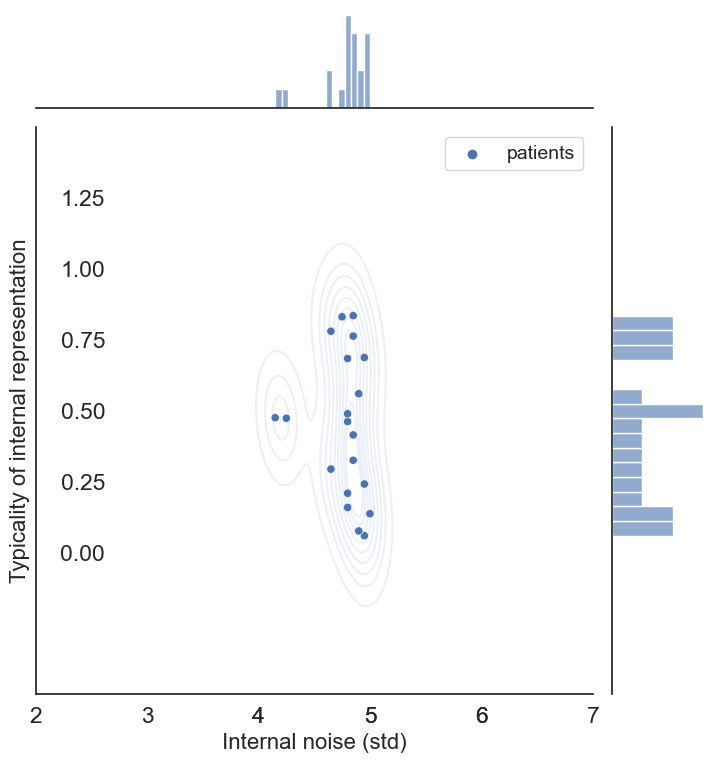

In [147]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_clusters_kde_x(data, x, y, hue, x_range, subject_6_id, color='blue', linewidth=2, save_path=None):
    sns.set_style("white")
    filtered_data = data[(data[x] >= x_range[0]) & (data[x] <= x_range[1])]
    custom_palette = {"controls": sns.color_palette()[1], "patients": sns.color_palette()[0]}

    g = sns.JointGrid(data=filtered_data, x=x, y=y, hue=hue, palette=custom_palette, height=8)
    
    # Customize the KDE plot color and linewidth within the sns.kdeplot function
    g.plot_joint(sns.kdeplot, fill=False, common_norm=False, bw_adjust=0.85, alpha=0.1, color=color, linewidth=linewidth)
    
    # Create histogram marginals
    g.plot_marginals(sns.histplot, color="#03051A", alpha=0.6, bins=15)
    
    g.set_axis_labels(xlabel='Internal noise (std)', ylabel='Typicality of internal representation', fontsize=16)
    g.ax_joint.set_facecolor('white')
    g.ax_joint.set_ylim([-0.5, 1.5])
    g.ax_joint.set_yticks([0, 0.25, 0.50, 0.75, 1.00, 1.25])
    
    g.ax_joint.tick_params(axis='y', direction='in', length=0)
    g.ax_joint.yaxis.set_tick_params(pad=-50)
    g.ax_joint.set_xlim([x_range[0], x_range[1]])  # Separate x-axis limits
    g.ax_joint.set_xticks([x_range[0]-2, x_range[0]-1, x_range[0], x_range[0]+1, x_range[0]+2, x_range[1]-1, x_range[1], x_range[1]+1, x_range[1]+2])  # Adjust the x-axis ticks as needed

    sns.scatterplot(data=filtered_data, x=x, y=y, hue=hue, palette=custom_palette, ax=g.ax_joint)
    g.ax_joint.legend(title=None, fontsize=14)

    # Plot a red circle on subject 6's data point
    subject_6_data = data[(data.type == 'controls') & (data.session == 1) & (data.subject == 6)]
    if not subject_6_data.empty:
        x_position = subject_6_data[x].values[0]  # Assuming there is only one data point per subject
        y_position = subject_6_data[y].values[0]
        g.ax_joint.plot(x_position, y_position, 'o', ms=6, mfc='none', mec='red', mew=2, zorder=3)
    
    # Save the plot as an image if save_path is provided
    if save_path:
        plt.savefig(save_path, dpi=500, bbox_inches='tight')
    
    plt.show()  # Show the plot

# Create the first plot
plt.figure(figsize=(25, 12))  # Create a new figure
plot_clusters_kde_x(data=revcor_measures, x="internal_noise_with_criteria", y="kernel_typicality", hue='type', x_range=(0, 4), subject_6_id=6, color='blue', linewidth=2, save_path='kde_plot1.png')

# Create the second plot
plt.figure(figsize=(25, 12))  # Create a new figure
plot_clusters_kde_x(data=revcor_measures, x="internal_noise_with_criteria", y="kernel_typicality", hue='type', x_range=(4, 5), subject_6_id=6, color='gray', linewidth=2, save_path='kde_plot2.png')


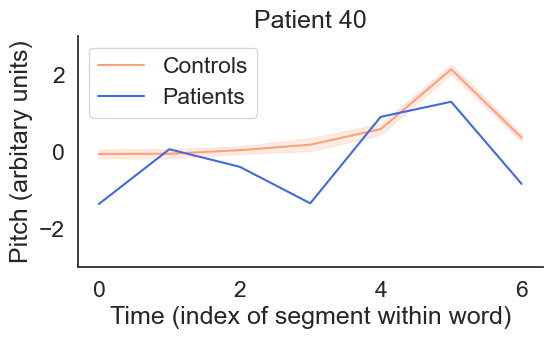

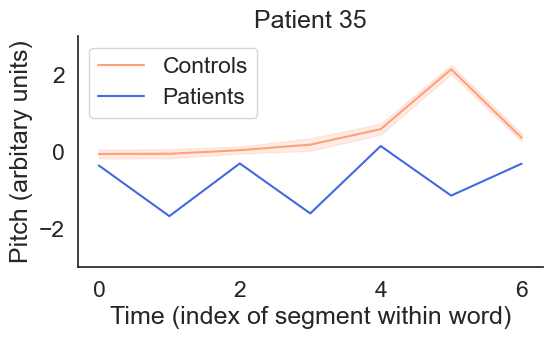

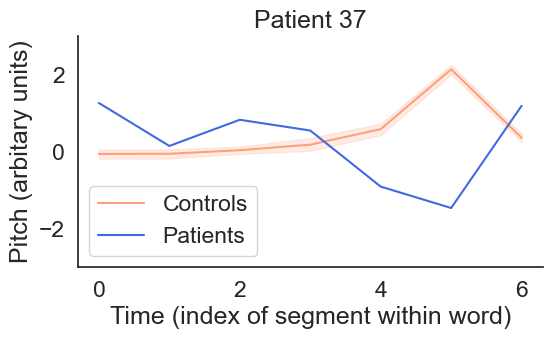

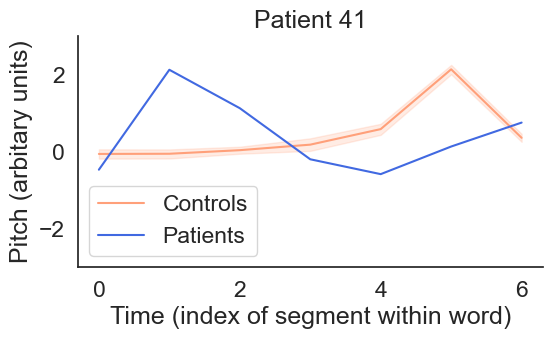

In [747]:
patients = [40,35, 37, 41]
colors = {"controls": "#FFA07A", "patients": "#4169E1"}

for patient in patients:
    fig, ax = plt.subplots(figsize=(6,3))
    #ax.set_ylim(-2, 2)
    plt.xlabel("Time (index of segment within word)")
    plt.ylabel("Pitch (arbitary units)")

    sp_controls = kernels[
        (kernels.session == 1) & (kernels.type == "controls")
    ]
    sns.lineplot(
        x="feature",
        y="kernel_value",
        color=colors["controls"],
        ci=95,
        label="Controls",
        data=sp_controls,
        ax=ax,
    )

    sp_patient = kernels[
        (kernels.session == 1)
        & (kernels.type == "patients")
        & (kernels.subject == patient)& (kernels.kernel == 'hmm')
    ]
    sns.lineplot(
        x="feature",
        y="kernel_value",
        color=colors["patients"],
        ci=None,
        label="Patients",
        data=sp_patient,
        ax=ax,
    )
    sns.despine()
    ax.set_facecolor('white')
    ax.grid(False)
    ax.set_ylim(-3 ,3)
    ax.set_yticks([-2, 0, 2])

    plt.title(f"Patient {patient}")
    plt.legend()
    plt.show()
    


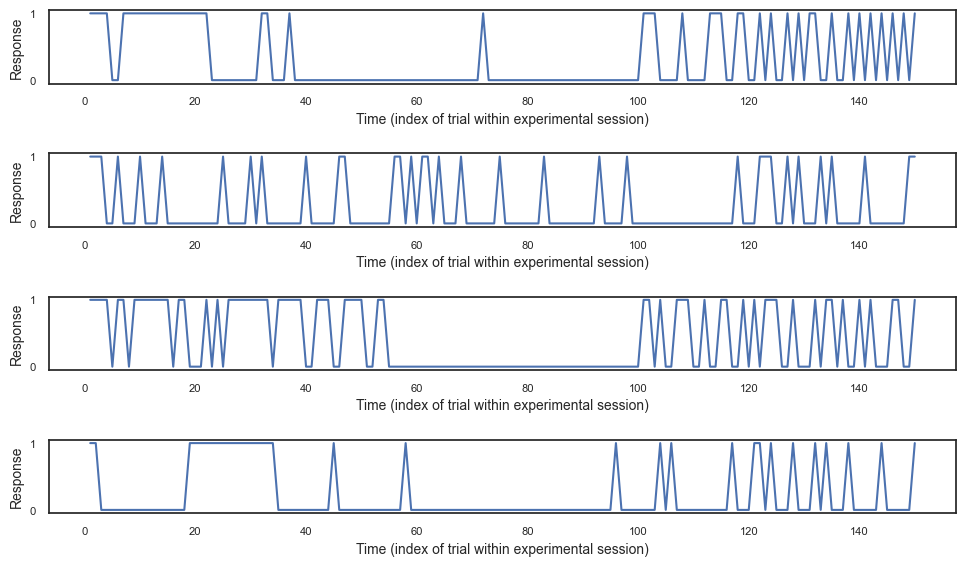

In [749]:
import matplotlib.pyplot as plt
import seaborn as sns

patients = [40,35, 37, 41]
patient_sessions = revcor_data[(revcor_data.type == "patients")& (revcor_data.subject.isin(patients))& (revcor_data.session == 1)].groupby(["subject", "session"], as_index=False).trial.count()

num_rows = len(patient_sessions)
fig, axs = plt.subplots(num_rows, 1, figsize=(10, 6))

for i, patient_session in enumerate(zip(patient_sessions.subject, patient_sessions.session)):
    patient = patient_session[0]
    session = patient_session[1]
    
    patient_responses = revcor_data[(revcor_data.subject==patient) & 
                                    (revcor_data.session==session) & 
                                    (revcor_data.stim_order==0)].groupby('trial')['response'].first()
    
    axs[i].plot(patient_responses)
    axs[i].set_yticks([0, 1])
    axs[i].set_ylabel('Response', fontsize=10)
    axs[i].set_xlabel('Time (index of trial within experimental session)', fontsize=10)
    axs[i].grid(False)
    axs[i].set_facecolor('white')
    axs[i].tick_params(axis='both', labelsize=8)

plt.tight_layout()
plt.show()



verify no difference between internal noise per experimentor based on different double-pass block

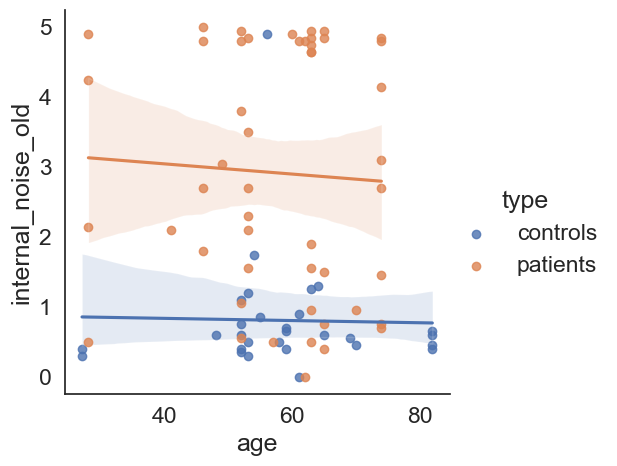

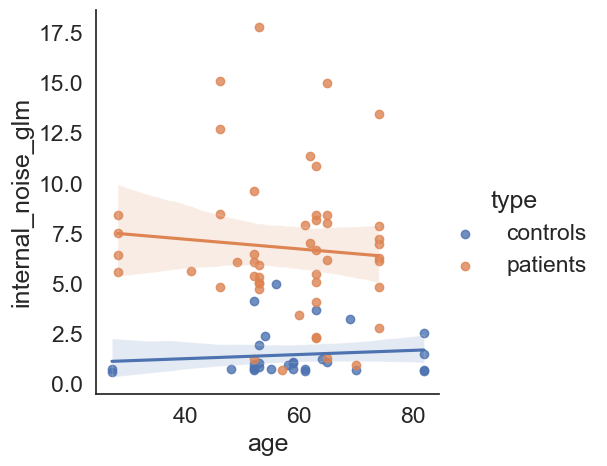

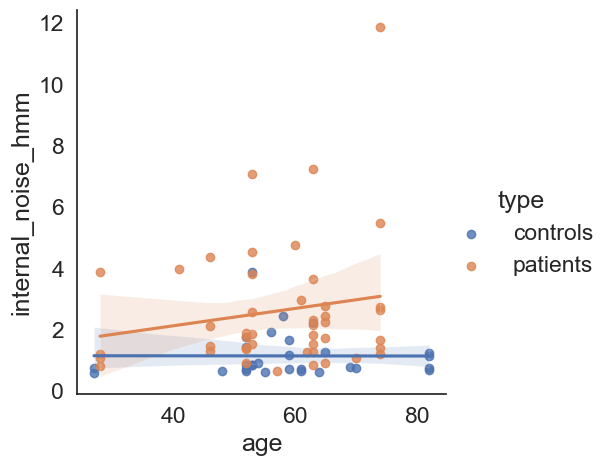

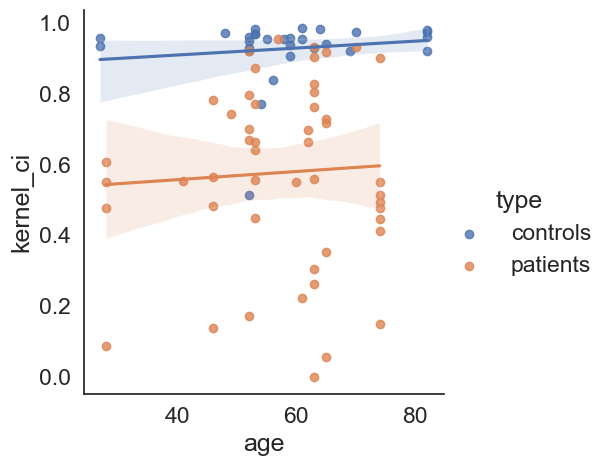

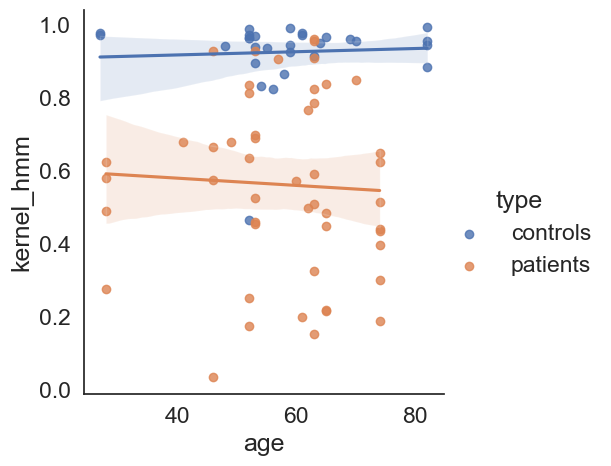

In [198]:
sns.lmplot(x='age',y='internal_noise_old',hue='type',
           data=revcor_measures.merge(revcor_data.groupby(['subject'], as_index=False).age.mean(), on='subject'))
sns.lmplot(x='age',y='internal_noise_glm',hue='type',
           data=revcor_measures.merge(revcor_data.groupby(['subject'], as_index=False).age.mean(), on='subject'))
sns.lmplot(x='age',y='internal_noise_hmm',hue='type',
           data=revcor_measures.merge(revcor_data.groupby(['subject'], as_index=False).age.mean(), on='subject'))
sns.lmplot(x='age',y='kernel_ci',hue='type',
           data=revcor_measures.merge(revcor_data.groupby(['subject'], as_index=False).age.mean(), on='subject'))
sns.lmplot(x='age',y='kernel_hmm',hue='type',
           data=revcor_measures.merge(revcor_data.groupby(['subject'], as_index=False).age.mean(), on='subject'))

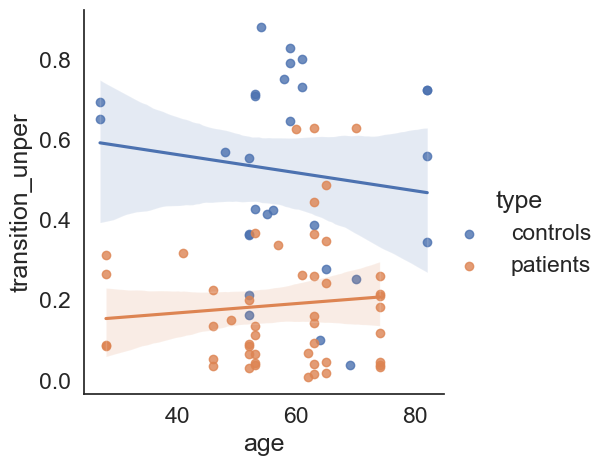

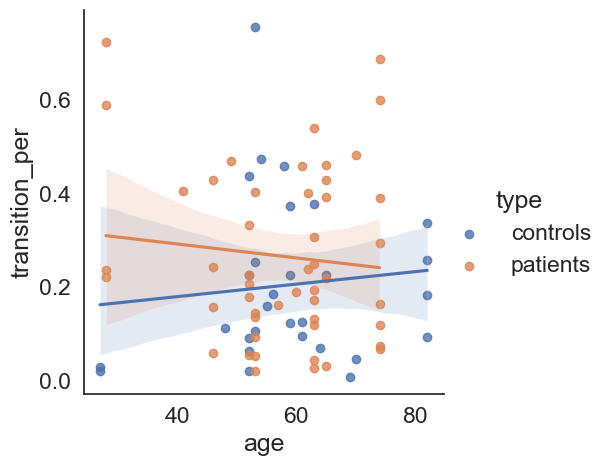

In [199]:
sns.lmplot(x='age',y='transition_unper',hue='type',
           data=revcor_measures.merge(revcor_data.groupby(['subject'], as_index=False).age.mean(), on='subject'))
sns.lmplot(x='age',y='transition_per',hue='type',
           data=revcor_measures.merge(revcor_data.groupby(['subject'], as_index=False).age.mean(), on='subject'))

In [149]:
df=revcor_measures[revcor_measures.session==1]
# Perform the Kruskal-Wallis H-test
kw_result = kruskal(*[experimentor['internal_noise_with_criteria'].values for name, experimentor in df.groupby('type')])

print(f"Kruskal-Wallis H-test result: H = {kw_result.statistic}, p-value = {kw_result.pvalue}")

if kw_result.pvalue < 0.05:
    print("Significant Kruskal-Wallis result. Proceeding with pairwise comparisons.")

    pairwise_comparison = mc.pairwise_tukeyhsd

Kruskal-Wallis H-test result: H = 10.954101273319505, p-value = 0.0009339666101128224
Significant Kruskal-Wallis result. Proceeding with pairwise comparisons.


In [150]:
df=revcor_measures[revcor_measures.session==1]
# Perform the Kruskal-Wallis H-test
kw_result = kruskal(*[experimentor['kernel_typicality'].values for name, experimentor in df.groupby('type')])

print(f"Kruskal-Wallis H-test result: H = {kw_result.statistic}, p-value = {kw_result.pvalue}")

if kw_result.pvalue < 0.05:
    print("Significant Kruskal-Wallis result. Proceeding with pairwise comparisons.")

    pairwise_comparison = mc.pairwise_tukeyhsd

Kruskal-Wallis H-test result: H = 21.086776859504113, p-value = 4.3894669586951725e-06
Significant Kruskal-Wallis result. Proceeding with pairwise comparisons.


,count,mean,std,min,25%,50%,75%,max
exp_group,,,,,,,,
Bardet-Commere,27.0,1.490741,1.460574,0.0,0.525,0.85,1.925,4.9
Jeulin,50.0,2.426000,1.868652,0.0,0.650,1.85,4.725,5.0


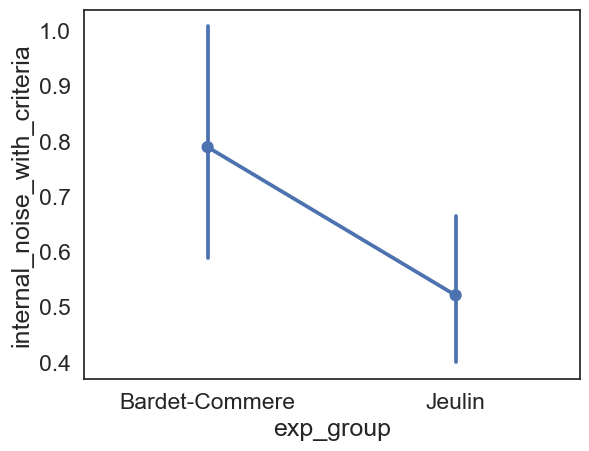

In [151]:
#revcor_measures = pd.read_csv("data/revcor_measures.csv", index_col=0)
a = revcor_measures.copy()
a['exp_group'] = 'Bardet-Commere'
a.loc[a.experimentor=='jeulin','exp_group'] = 'Jeulin' 

sns.pointplot(data=a[(a.type=='controls')&(a.session==1)], x='exp_group',y='internal_noise_with_criteria')

#pg.ttest(x=a[a.exp_group=='Bardet-Commere'].internal_noise_with_criteria,
#        y=a[a.exp_group=='Jeulin'].internal_noise_with_criteria)

a.groupby('exp_group').internal_noise_with_criteria.describe()

In [152]:
revcor_measures[(revcor_measures.type=='controls')].groupby('experimentor').internal_noise_with_criteria.describe()

,count,mean,std,min,25%,50%,75%,max
experimentor,,,,,,,,
aynaz,14.0,0.789286,0.417492,0.3,0.5125,0.650,1.0375,1.75
jeulin,14.0,0.532143,0.281894,0.0,0.4000,0.475,0.6375,1.20


In [153]:
from scipy.stats import kruskal, mannwhitneyu
import statsmodels.stats.multicomp as mc
df=revcor_measures[(revcor_measures.type=='patients')&(revcor_measures.session==1)]
groups = df['experimentor'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['experimentor'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['experimentor'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs. Consider post-hoc analysis.")
else:
    print("No significant differences found between any pairs.")

    Group1   Group2  U-statistic   P-value
0   bardet  commere         11.5  0.240271
1   bardet   jeulin         11.0  0.139828
2  commere   jeulin         33.0  0.808973
No significant differences found between any pairs.


In [154]:
from scipy.stats import kruskal, mannwhitneyu
import statsmodels.stats.multicomp as mc
df1=revcor_measures[(revcor_measures.type=='controls')&(revcor_measures.session==1)]
groups = df1['experimentor'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df1[df1['experimentor'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df1[df1['experimentor'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs. Consider post-hoc analysis.")
else:
    print("No significant differences found between any pairs.")

  Group1  Group2  U-statistic   P-value
0  aynaz  jeulin         69.5  0.134148
No significant differences found between any pairs.


## Results Glioma

In [751]:
revcor_glioma=pd.read_csv('data/revcor_data_glioma.csv', index_col=0)
revcor_glioma

,index,subject,session,trial,block,sex,age,date,stim,stim_order,...,localization,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain,ProEmo,ProEmo2,ProLing,ProLing2,Pseudo
0,0,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,...,Fronto-pariétal,2.0,28.0,12,0,11,1,12,0,16
1,1,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,...,Fronto-pariétal,2.0,28.0,12,0,11,1,12,0,16
2,2,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,...,Fronto-pariétal,2.0,28.0,12,0,11,1,12,0,16
3,3,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,...,Fronto-pariétal,2.0,28.0,12,0,11,1,12,0,16
4,4,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,...,Fronto-pariétal,2.0,28.0,12,0,11,1,12,0,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79753,79753,9.0,1.0,153.0,3.0,m,58.0,2023-11-30 12:01:36.760272,male_vraiment_flat_108.wav,1.0,...,Frontal,Glioblastome,NaN,12,0,12,0,12,0,19
79754,79754,9.0,1.0,153.0,3.0,m,58.0,2023-11-30 12:01:36.760272,male_vraiment_flat_108.wav,1.0,...,Frontal,Glioblastome,NaN,12,0,12,0,12,0,19
79755,79755,9.0,1.0,153.0,3.0,m,58.0,2023-11-30 12:01:36.760272,male_vraiment_flat_108.wav,1.0,...,Frontal,Glioblastome,NaN,12,0,12,0,12,0,19
79756,79756,9.0,1.0,153.0,3.0,m,58.0,2023-11-30 12:01:36.760272,male_vraiment_flat_108.wav,1.0,...,Frontal,Glioblastome,NaN,12,0,12,0,12,0,19


In [752]:
revcor_glioma_old=pd.read_csv('data/revcor_measures_glioma.csv', index_col=0)
revcor_glioma_old

,index,experimentor,type,subject,session,kernel_distance,kernel_typicality,p_int1,pc_agree,criteria,...,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain,ProEmo,ProEmo2,ProLing,ProLing2,Pseudo,accuracy
0,0,aynaz,controls,0.0,1.0,0.177134,0.939521,0.470000,0.700000,0.15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.746667
1,1,aynaz,controls,1.0,1.0,0.202590,0.928859,0.550000,0.780000,0.20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.693333
2,2,aynaz,controls,2.0,1.0,0.235171,0.915212,0.400000,0.640000,0.55,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.613333
3,3,aynaz,controls,3.0,1.0,0.675032,0.730970,0.530000,0.580000,0.20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.606667
4,4,aynaz,controls,4.0,1.0,0.102179,0.970918,0.470000,0.820000,0.10,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.760000
5,5,aynaz,controls,5.0,1.0,0.173691,0.940963,0.500000,0.720000,0.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.760000
6,6,aynaz,controls,7.0,1.0,0.070427,0.984217,0.210000,0.740000,1.80,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.646667
7,7,aynaz,controls,8.0,1.0,0.276282,0.897992,0.610000,0.740000,0.45,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.726667
8,8,aynaz,controls,9.0,1.0,0.142973,0.953830,0.410000,0.860000,0.35,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.820000
9,9,aynaz,controls,10.0,1.0,0.100795,0.971497,0.480000,0.760000,0.10,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.740000


In [753]:
revcor_glioma.groupby('type').subject.nunique()

type
post    16
pre     21
Name: subject, dtype: int64

<AxesSubplot: xlabel='feature', ylabel='kernel_value'>

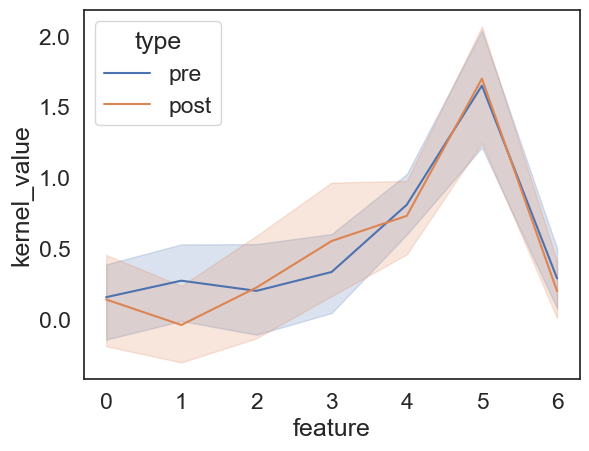

In [754]:
ci_kernels_gli=ClassificationImage.extract_kernels(revcor_glioma, group_ids=['subject','session','type'],
                                    trial_id='trial', stim_id='stim_order', response_id='response',feature_id='segment', value_id='pitch')
sns.lineplot(data=ci_kernels_gli, x="feature", y='kernel_value', hue='type')

#### Double pass noise

<AxesSubplot: xlabel='type', ylabel='internal_noise'>

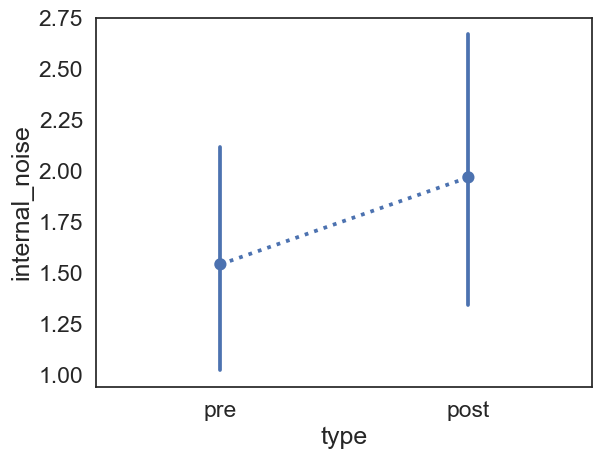

In [755]:
dp_noise_gli = DoublePass.extract_internal_noise(revcor_glioma, group_ids=['subject','session','type'], 
                                    trial_id='trial', stim_id="stim_order", feature_id='segment', value_id='pitch',response_id='response', 
                                    agreement_model_file='agreement_model_large.csv',
                                    glm_model_file='glm_model.pkl',
                                    kernel_extractor=ClassificationImage)
sns.pointplot(data=dp_noise_gli, x='type',y='internal_noise', linestyles=':')


### GLM measures differentiate patients and controls 

#### GLM kernels

<AxesSubplot: xlabel='feature', ylabel='kernel_value'>

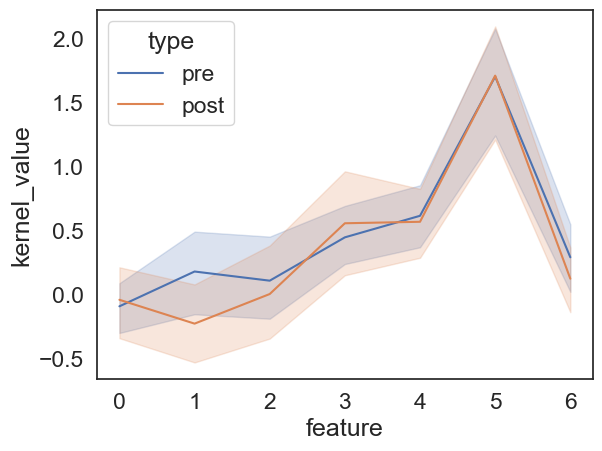

In [756]:
glm_kernels_gli=GLMKernel.extract_kernels(revcor_glioma, group_ids=['subject','session','type'],
                                    trial_id='trial', stim_id='stim_order', response_id='response',feature_id='segment', value_id='pitch')
sns.lineplot(data=glm_kernels_gli, x="feature", y='kernel_value', hue='type')

In [ ]:
# GLMMethod.build_model(glm_model_file='glm_model.pkl')
# model_df = AgreementMethod.build_model(agreement_model_file = 'agreement_model_large.csv', 
#                                        internal_noise_range=np.arange(0,5,.1),
#                                         criteria_range=np.arange(-5,5,1), 
#                             # n_repeated_trials=10000, n_runs=5)
#                             n_repeated_trials=100, n_runs=1)

100%|██████████| 4590/4590 [00:25<00:00, 179.56it/s]


Building double-pass model


100%|██████████| 500/500 [00:11<00:00, 44.46it/s]


#### GLM noise

<AxesSubplot: xlabel='type', ylabel='internal_noise'>

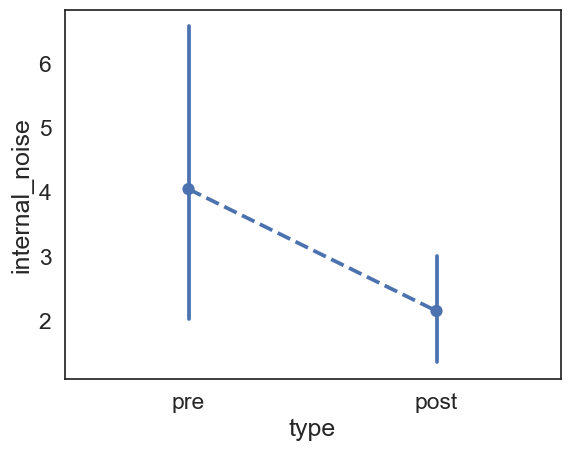

In [757]:
glm_noise_gli = GLMMethod.extract_internal_noise(revcor_glioma, group_ids=['subject','session','type'], 
                                    trial_id='trial', stim_id="stim_order", response_id='response',feature_id='segment', value_id='pitch', 
                                    #agreement_model_file='agreement_model_large.csv'
                                    glm_model_file='glm_model.pkl'
                                    #, kernel_extractor=GLMKernel
)           
sns.pointplot(data=glm_noise_gli, x='type',y='internal_noise', linestyles='--')

### HMM measures differentiate patients and controls 

In [758]:
best_priors = {
    'mean_value_1': 0.91,
    'mean_value_2': 2.43,
    'sigma_value_1': 3.79,
    'sigma_value_2': 2.43,
    'alpha_value': 1.82
}
# kernel, posterior_probs, predicted_states,recovered_trans_mat= GLMHMMKernel.extract_single_kernel(responses_df, best_priors=best_priors)
# print("Extracted Kernel:", kernel)
# print("posterior_probs:", posterior_probs)
# print("predicted_states:", predicted_states)
# print("recovered_trans_mat:", recovered_trans_mat)

#### GLMHMM Kernels

In [759]:
hmm_kernels_gli=GLMHMMKernel.extract_kernels(revcor_glioma, group_ids=['subject','session','type'],
                                    trial_id='trial', stim_id='stim_order', response_id='response',feature_id='segment', value_id='pitch',
                                    best_priors=best_priors)


  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

<AxesSubplot: xlabel='feature', ylabel='kernel_value'>

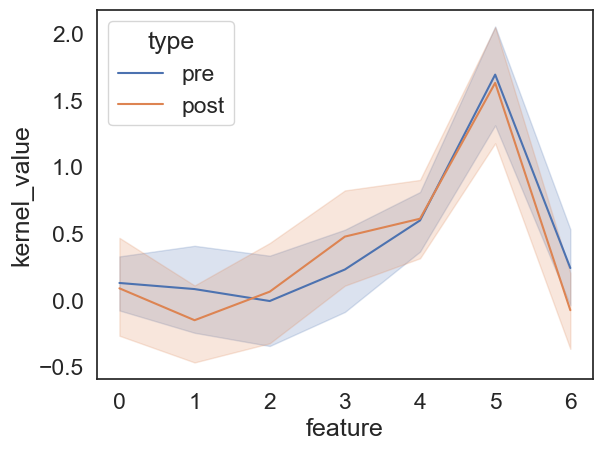

In [760]:
sns.lineplot(data=hmm_kernels_gli, x="feature", y='kernel_value', hue='type')

#### GLMHMM noise

In [761]:
hmm_noise_gli = GLMHMMMethod.extract_internal_noise(revcor_glioma, group_ids=['subject','session','type'], 
                                    trial_id='trial', stim_id='stim_order', response_id='response',feature_id='segment', value_id='pitch',
                                    internal_noise_extractor=GLMMethod, glm_model_file='glm_model.pkl', best_priors=best_priors)

  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 101
1.1774923214773494


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 149
0.6848356620246921


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 26
Error fitting GLM: Perfect separation detected, results not available
    trial  diff_pitch0  diff_pitch1  diff_pitch2  diff_pitch3  diff_pitch4  \
0     0.0    97.423155   126.413937   -93.590149   -57.549008  -162.230868   
1     1.0    36.176754    17.596294  -127.467302  -151.539459  -123.746609   
2     2.0  -129.925298   191.616816    76.278293   -59.541088  -104.981265   
3     3.0    97.423155   126.413937   -93.590149   -57.549008  -162.230868   
4     4.0   -43.552580    19.235599    21.411856  -203.861380   -56.167793   
5     5.0   -63.930571    46.938877   -63.014280    -5.173491   -55.991568   
6     6.0    76.188929    49.729917     9.480307   211.648813    -3.544836   
7     7.0    46.864883    -7.623197   -70.051359   -23.482538    94.964941   
8     8.0    22.343417    52.316460   -31.046448   -25.580134  -120.490795   
9    53.0   117.086634    44.108079   -34.550034   112.607754   -48.125203   
10   54.0  -129.140021    60.500785    74.058141   -7

  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 50
1.5098044748712403


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 140
1.4115863997430587


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 144
1.3002575418268953


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 141
0.9350223569718086


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 115
1.2700093969738693


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 137
0.7169506183616985


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 152
0.5839225375595276


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 144
0.7379825115436428


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 112
0.6429535353232748


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 99
1.8138067965107079


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 147
1.4862583518479446


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 88
2.3729132482823485


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 141
0.583480407683117


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 144
0.5829329543111645


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 150
0.5951701424448904


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 144
0.8108005909961888


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 154
0.7216302080126703


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 18
Error fitting GLM: Perfect separation detected, results not available
    trial  diff_pitch0  diff_pitch1  diff_pitch2  diff_pitch3  diff_pitch4  \
0    29.0   138.204201   155.169603    22.264125   -69.543678  -223.886509   
1    30.0    25.320060  -172.822418   209.394842  -163.248328  -119.997717   
2    31.0  -129.093454  -108.960070   -63.350107  -109.109845  -190.286742   
3    32.0   -31.420440  -132.684030    75.589124   148.216082   -27.397294   
4    33.0    72.944048   -11.635835   -26.536022    41.952164    26.475414   
5    34.0    -7.024092    -8.941019   -29.903602  -221.445924     0.777128   
6    35.0    73.899601    74.161292   143.568992    83.383810  -135.277603   
7    36.0    -0.538002    87.748242   -20.067385   -85.126339   115.907074   
8    37.0  -256.177511  -210.644347   -10.203934    50.158715   -91.375830   
9    38.0    23.010056  -110.926192   121.648489   120.643652  -104.141809   
10   39.0   -81.175948   151.909536   -41.163385  -14

  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 152
1.0886211763244917


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 154
0.5641888226907311


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 120
0.8673442308080496


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 150
0.789880569747723


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 136
0.6764638808834654


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 76
1.142217068617305


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 140
0.7121389709638944


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 127
1.2206320746409303


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 107
1.3993880003086945


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 115
1.4620049577174261


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 141
0.7752540229417259


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 47
1.7144777737833055


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 108
0.9841918225628106


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 112
1.2209997173272475


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 75
0.8836546434325693


  0%|          | 0/300 [00:00<?, ?it/s]

engaged trials: 44
1.4072870839411789


<AxesSubplot: xlabel='type', ylabel='internal_noise'>

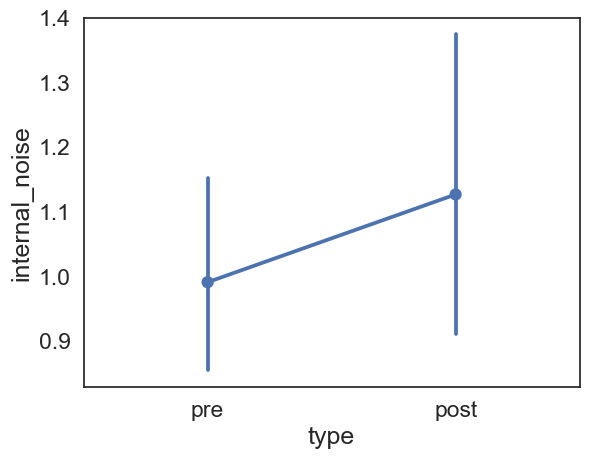

In [762]:
sns.pointplot(data=hmm_noise_gli, x='type',y='internal_noise')

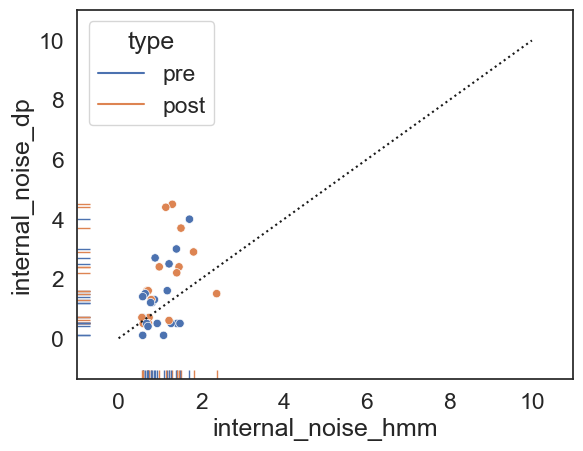

In [763]:
data_gli=hmm_noise_gli.merge(dp_noise_gli, on=['subject','session','type'], suffixes=('_hmm','_dp')).reset_index()
sns.scatterplot(data=data_gli, x="internal_noise_hmm", y="internal_noise_dp", hue='type')
sns.rugplot(data=data_gli, x="internal_noise_hmm", y="internal_noise_dp", hue='type')
plt.plot([0,10],[0,10],'k:')

<AxesSubplot: xlabel='type', ylabel='internal_noise'>

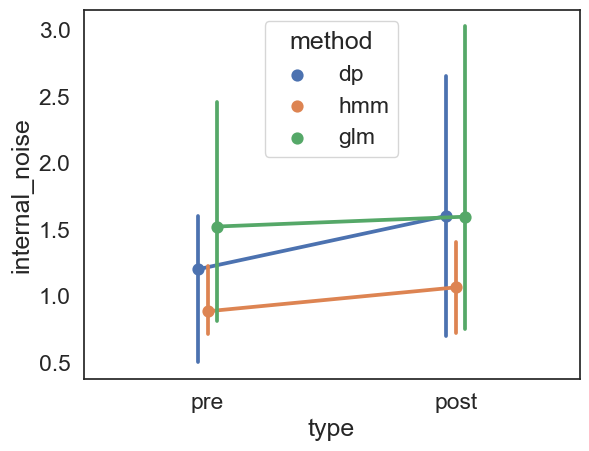

In [764]:
dp_noise_gli['method']='dp'
hmm_noise_gli['method']='hmm'
glm_noise_gli['method']='glm'

noises_gli  = pd.concat([dp_noise_gli, hmm_noise_gli, glm_noise_gli])
sns.pointplot(data=noises_gli, x='type', y='internal_noise', hue='method', dodge=True, estimator=np.nanmedian)

#### Transition matrix

In [765]:
transition_matrices_gli = GLMHMMKernel.extract_transition_matrices(revcor_glioma,group_ids=['subject', 'session','type'],
                                    trial_id='trial',stim_id='stim_order', response_id='response',feature_id='segment', value_id='pitch',
                                    best_priors=best_priors)

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

<AxesSubplot: xlabel='type', ylabel='per'>

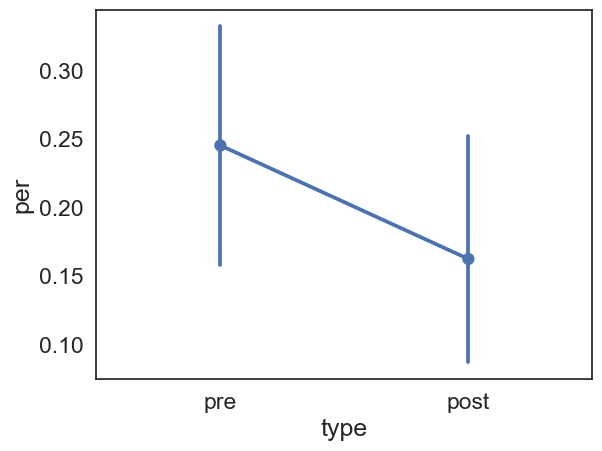

In [766]:
sns.pointplot(data=transition_matrices_gli, x='type', y='per')

<AxesSubplot: xlabel='type', ylabel='Probability'>

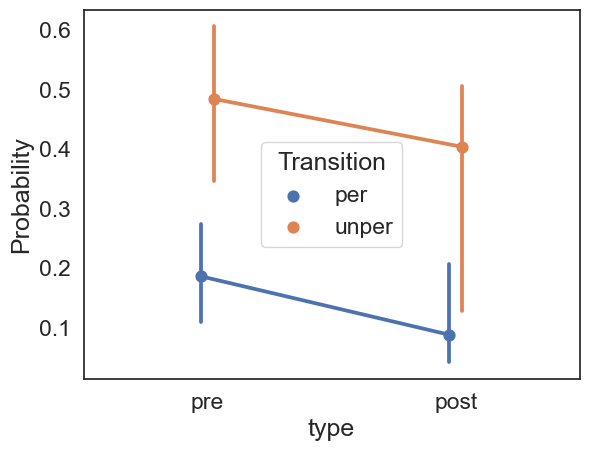

In [767]:
trans_mat_gli = transition_matrices_gli.melt(id_vars=['subject','session','type'], value_vars=['per', 'unper'], 
                    var_name='Transition', value_name='Probability')

sns.pointplot(data=trans_mat_gli, x='type', y='Probability', hue='Transition', 
              dodge=True ,estimator=np.nanmedian)

In [768]:
ci_kernels_gli['kernel'] = 'ci'
glm_kernels_gli['kernel'] = 'glm'
hmm_kernels_gli['kernel'] = 'hmm'
kernels_gli = pd.concat([ci_kernels_gli, glm_kernels_gli, hmm_kernels_gli], ignore_index=True)
kernels_gli

,subject,session,type,feature,kernel_value,kernel
0,1.0,1.0,pre,0.0,-0.707372,ci
1,1.0,1.0,pre,1.0,0.451344,ci
2,1.0,1.0,pre,2.0,-0.265949,ci
3,1.0,1.0,pre,3.0,-0.609332,ci
4,1.0,1.0,pre,4.0,0.387947,ci
...,...,...,...,...,...,...
772,21.0,2.0,post,2.0,-1.323256,hmm
773,21.0,2.0,post,3.0,0.367071,hmm
774,21.0,2.0,post,4.0,1.408211,hmm
775,21.0,2.0,post,5.0,-0.138702,hmm


In [769]:
kernels_controls=kernels[kernels.type=='controls'][['subject','session','type','feature','kernel_value','kernel']].reset_index(drop=True) 
kernels_controls

,subject,session,type,feature,kernel_value,kernel
0,0,1,controls,0,0.021588,ci
1,0,1,controls,1,0.170469,ci
2,0,1,controls,2,-0.381605,ci
3,0,1,controls,3,-0.543959,ci
4,0,1,controls,4,0.367073,ci
...,...,...,...,...,...,...
604,21,2,controls,2,-0.101224,hmm
605,21,2,controls,3,0.511856,hmm
606,21,2,controls,4,0.805064,hmm
607,21,2,controls,5,2.462228,hmm


In [770]:
# kernels_gli=pd.merge(kernels_gli, kernels_controls, how='left')
kernels_gli=pd.concat([kernels_gli, kernels_controls], ignore_index=True)
kernels_gli

,subject,session,type,feature,kernel_value,kernel
0,1.0,1.0,pre,0.0,-0.707372,ci
1,1.0,1.0,pre,1.0,0.451344,ci
2,1.0,1.0,pre,2.0,-0.265949,ci
3,1.0,1.0,pre,3.0,-0.609332,ci
4,1.0,1.0,pre,4.0,0.387947,ci
...,...,...,...,...,...,...
1381,21.0,2.0,controls,2.0,-0.101224,hmm
1382,21.0,2.0,controls,3.0,0.511856,hmm
1383,21.0,2.0,controls,4.0,0.805064,hmm
1384,21.0,2.0,controls,5.0,2.462228,hmm


In [265]:
kernels_gli.type.nunique()

3

In [771]:
control_kernels_gli = kernels_gli[kernels_gli['type']=='controls'].groupby('feature')['kernel_value'].mean().reset_index()
# match each patient kernel, at each segment, with the corresponding gain in the control kernel 
distances_gli = pd.merge(kernels_gli,control_kernels_gli, on=["feature"])
#compute squared difference between patient and control kernel gains at each segment
distances_gli["kernel_distance"] = (distances_gli["kernel_value_x"] - distances_gli["kernel_value_y"])**2
# and average over segments, for each patient
distances_gli = distances_gli.groupby(['type','subject','session','kernel'])['kernel_distance'].mean().reset_index()
# and rescale as a similarity value
distances_gli['kernel_typicality'] = ( distances_gli.kernel_distance - distances_gli.kernel_distance.max() ) / ( distances_gli.kernel_distance.min() - distances_gli.kernel_distance.max())
distances_gli  

,type,subject,session,kernel,kernel_distance,kernel_typicality
0,controls,0.0,1.0,ci,0.158067,0.945383
1,controls,0.0,1.0,glm,0.133713,0.955176
2,controls,0.0,1.0,hmm,0.218983,0.920887
3,controls,1.0,1.0,ci,0.263911,0.902820
4,controls,1.0,1.0,glm,0.340211,0.872137
...,...,...,...,...,...,...
193,pre,20.0,1.0,glm,1.271348,0.497701
194,pre,20.0,1.0,hmm,1.599911,0.365577
195,pre,21.0,1.0,ci,0.651614,0.746914
196,pre,21.0,1.0,glm,0.701230,0.726962


In [772]:
revcor_measures_controls=revcor_measures[revcor_measures.type=='controls']
revcor_measures_controls

,type,subject,session,kernel,kernel_distance,kernel_typicality,internal_noise,method,Transition,Probability
0,controls,0,1,ci,0.158067,0.958196,1.000000,dp,per,0.160836
1,controls,0,1,ci,0.158067,0.958196,1.000000,dp,unper,0.416026
2,controls,0,1,ci,0.158067,0.958196,0.608937,hmm,per,0.160836
3,controls,0,1,ci,0.158067,0.958196,0.608937,hmm,unper,0.416026
4,controls,0,1,ci,0.158067,0.958196,0.736079,glm,per,0.160836
...,...,...,...,...,...,...,...,...,...,...
517,controls,21,2,hmm,0.061997,0.987765,0.900000,dp,unper,0.556535
518,controls,21,2,hmm,0.061997,0.987765,0.735439,hmm,per,0.091910
519,controls,21,2,hmm,0.061997,0.987765,0.735439,hmm,unper,0.556535
520,controls,21,2,hmm,0.061997,0.987765,0.742850,glm,per,0.091910


In [268]:
trial_ids=['type','subject','session']

In [773]:
revcor_measures_gli = distances_gli[distances_gli.type.isin(['pre','post'])].merge(noises_gli, how='left',on= trial_ids).merge(trans_mat_gli, how='left', on=trial_ids)
revcor_measures_gli=pd.concat([revcor_measures_gli, revcor_measures_controls], ignore_index=True)
revcor_measures_gli

,type,subject,session,kernel,kernel_distance,kernel_typicality,internal_noise,method,Transition,Probability
0,post,1.0,2.0,ci,0.238772,0.912929,1.600000,dp,per,0.018766
1,post,1.0,2.0,ci,0.238772,0.912929,1.600000,dp,unper,0.309234
2,post,1.0,2.0,ci,0.238772,0.912929,0.684836,hmm,per,0.018766
3,post,1.0,2.0,ci,0.238772,0.912929,0.684836,hmm,unper,0.309234
4,post,1.0,2.0,ci,0.238772,0.912929,0.786091,glm,per,0.018766
...,...,...,...,...,...,...,...,...,...,...
1183,controls,21.0,2.0,hmm,0.061997,0.987765,0.900000,dp,unper,0.556535
1184,controls,21.0,2.0,hmm,0.061997,0.987765,0.735439,hmm,per,0.091910
1185,controls,21.0,2.0,hmm,0.061997,0.987765,0.735439,hmm,unper,0.556535
1186,controls,21.0,2.0,hmm,0.061997,0.987765,0.742850,glm,per,0.091910


In [774]:
kernel_pivot_gli = revcor_measures_gli.pivot_table(
    index=['type', 'subject', 'session'],
    columns='kernel',
    values='kernel_typicality'
).rename(columns={
    'ci': 'kernel_ci',
    'hmm': 'kernel_hmm',
    'glm': 'kernel_glm'
})
internal_noise_pivot_gli = revcor_measures_gli.pivot_table(
    index=['type', 'subject', 'session'],
    columns='method',
    values='internal_noise'
).rename(columns={
    'dp': 'internal_noise_dp',
    'glm': 'internal_noise_glm',
    'hmm': 'internal_noise_hmm'
})
transition_pivot_gli = revcor_measures_gli.pivot_table(
    index=['type', 'subject', 'session'],
    columns='Transition',
    values='Probability'  
).rename(columns={
    'per': 'transition_per',
    'unper': 'transition_unper'
})

In [775]:
new_revcor_measures_gli = kernel_pivot_gli.join(internal_noise_pivot_gli).join(transition_pivot_gli).reset_index()
new_revcor_measures_gli=new_revcor_measures_gli.merge(revcor_glioma_old[['type', 'subject', 'session','internal_noise_with_criteria']], on=['type', 'subject', 'session'], how='left')
new_revcor_measures_gli

,type,subject,session,kernel_ci,kernel_glm,kernel_hmm,internal_noise_dp,internal_noise_glm,internal_noise_hmm,transition_per,transition_unper,internal_noise_with_criteria
0,controls,0.0,1.0,0.958196,0.965692,0.939447,1.0,0.736079,0.608937,0.160836,0.416026,0.85
1,controls,1.0,1.0,0.925618,0.902134,0.962370,0.6,3.241213,0.773682,0.009120,0.039850,0.55
2,controls,2.0,1.0,0.932333,0.957161,0.916233,3.0,3.707792,2.215195,0.378785,0.387854,1.25
3,controls,3.0,1.0,0.777449,0.830996,0.838373,3.8,2.406972,0.909850,0.474386,0.881248,1.75
4,controls,4.0,1.0,0.977377,0.975612,0.958178,1.2,0.694366,0.758844,0.045797,0.249119,0.45
...,...,...,...,...,...,...,...,...,...,...,...,...
61,pre,17.0,1.0,0.702913,0.579780,0.506083,3.0,10.977980,1.399388,0.623383,0.425955,3.00
62,pre,18.0,1.0,0.976907,0.974165,0.944308,1.2,0.533689,0.775254,0.233452,0.902302,0.55
63,pre,19.0,1.0,0.755163,0.853017,0.429757,4.0,11.881278,1.714478,0.157108,0.073541,3.15
64,pre,20.0,1.0,0.567079,0.497701,0.365577,2.5,2.926102,1.221000,0.395991,0.426026,1.30


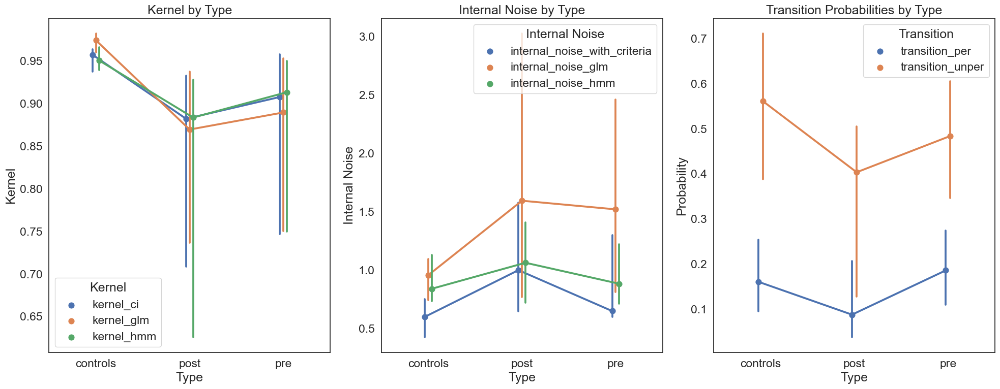

In [776]:
fig, axes = plt.subplots(1, 3, figsize=(20, 8), sharey=False)

kernel_data_gli = new_revcor_measures_gli.melt(id_vars='type', value_vars=['kernel_ci', 'kernel_glm', 'kernel_hmm'],
                                       var_name='Kernel', value_name='Value')
kernel_order = ['kernel_ci', 'kernel_glm', 'kernel_hmm']
sns.pointplot(ax=axes[0], data=kernel_data_gli, x='type', y='Value', hue='Kernel',
              dodge=True, estimator=np.nanmedian, hue_order=kernel_order)
axes[0].set_title("Kernel by Type")
axes[0].set_xlabel("Type")
axes[0].set_ylabel("Kernel")

# Internal noise plot
noise_data_gli = new_revcor_measures_gli.melt(id_vars='type', value_vars=['internal_noise_with_criteria',
                                                                  'internal_noise_glm', 'internal_noise_hmm'],
                                      var_name='Internal Noise', value_name='Value')
noise_order = ['internal_noise_with_criteria', 'internal_noise_glm', 'internal_noise_hmm']
sns.pointplot(ax=axes[1], data=noise_data_gli, x='type', y='Value', hue='Internal Noise',
              dodge=True, estimator=np.nanmedian, hue_order=noise_order)
axes[1].set_title("Internal Noise by Type")
axes[1].set_xlabel("Type")
axes[1].set_ylabel("Internal Noise")

# Transition probabilities plot
transition_data_gli = new_revcor_measures_gli.melt(id_vars='type', value_vars=['transition_per', 'transition_unper'],
                                           var_name='Transition', value_name='Value')
sns.pointplot(ax=axes[2], data=transition_data_gli, x='type', y='Value', hue='Transition',
              dodge=True, estimator=np.nanmedian)
axes[2].set_title("Transition Probabilities by Type")
axes[2].set_xlabel("Type")
axes[2].set_ylabel("Probability")

plt.tight_layout()
plt.show()

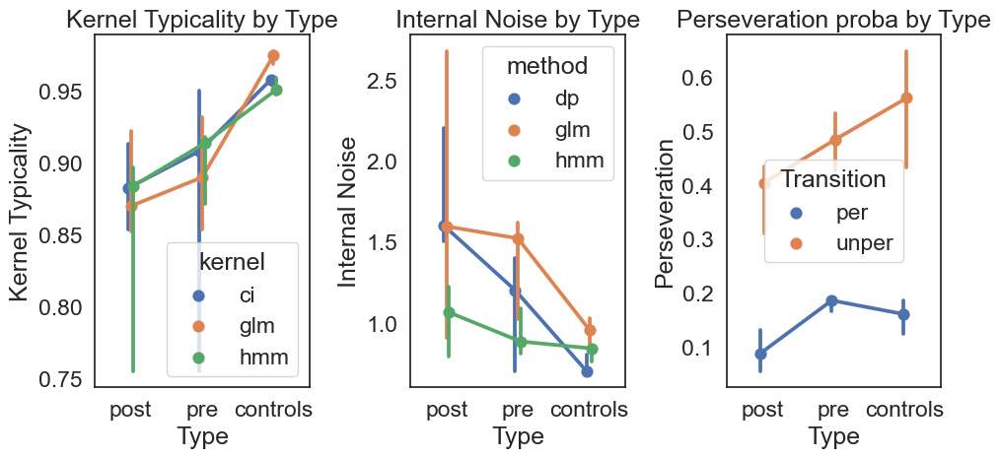

In [777]:
fig, axes = plt.subplots(1, 3, figsize=(10, 5), sharey=False)
internal_noise_order = ['dp', 'glm', 'hmm']
kernel_order = ['ci', 'glm', 'hmm']
sns.pointplot(ax=axes[0], data=revcor_measures_gli, x='type', y='kernel_typicality', hue='kernel',
              dodge=True, estimator=np.nanmedian, hue_order=kernel_order)
axes[0].set_title("Kernel Typicality by Type")
axes[0].set_xlabel("Type")
axes[0].set_ylabel("Kernel Typicality")

sns.pointplot(ax=axes[1], data=revcor_measures_gli, x='type', y='internal_noise', hue='method',
              dodge=True, estimator=np.nanmedian, hue_order=internal_noise_order)
axes[1].set_title("Internal Noise by Type")
axes[1].set_xlabel("Type")
axes[1].set_ylabel("Internal Noise")

sns.pointplot(ax=axes[2], data=revcor_measures_gli, x='type', y='Probability', hue='Transition',
              dodge=True, estimator=np.nanmedian)
axes[2].set_title("Perseveration proba by Type")
axes[2].set_xlabel("Type")
axes[2].set_ylabel("Perseveration")

plt.tight_layout()

# Show the plots
plt.show()

In [278]:
new_revcor_measures_gli.to_csv("data/new_revcor_measures_gli.csv", index=False)

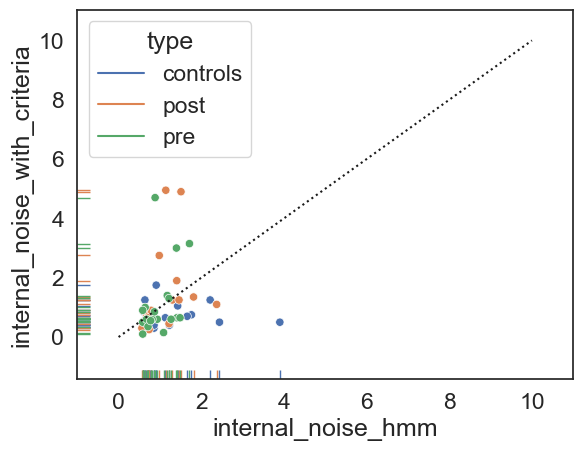

In [778]:
sns.scatterplot(data=new_revcor_measures_gli, x="internal_noise_hmm", y="internal_noise_with_criteria", hue='type')
sns.rugplot(data=new_revcor_measures_gli, x="internal_noise_hmm", y="internal_noise_with_criteria", hue='type')
plt.plot([0,10],[0,10],'k:')


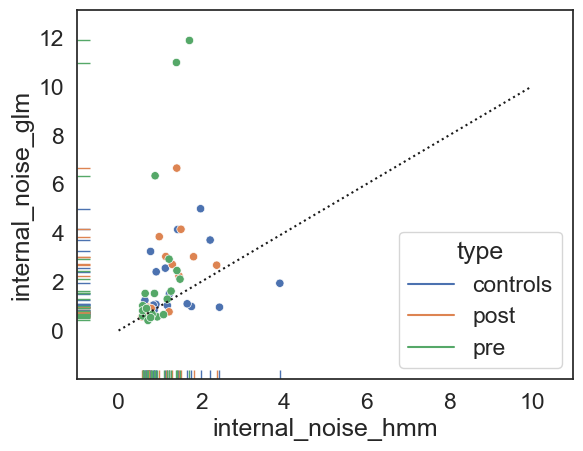

In [779]:
sns.scatterplot(data=new_revcor_measures_gli, x="internal_noise_hmm", y="internal_noise_glm", hue='type')
sns.rugplot(data=new_revcor_measures_gli, x="internal_noise_hmm", y="internal_noise_glm", hue='type')
plt.plot([0,10],[0,10],'k:')

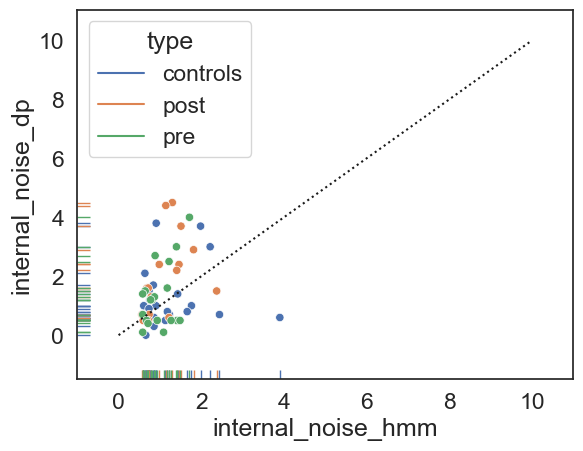

In [780]:
sns.scatterplot(data=new_revcor_measures_gli, x="internal_noise_hmm", y="internal_noise_dp", hue='type')
sns.rugplot(data=new_revcor_measures_gli, x="internal_noise_hmm", y="internal_noise_dp", hue='type')
plt.plot([0,10],[0,10],'k:')

In [282]:
import plotly.express as px

fig = px.scatter(new_revcor_measures_gli, 
                 x="internal_noise_hmm", 
                 y="internal_noise_glm", 
                 color="type", 
                  hover_data=["subject"],
                 marginal_x="rug", 
                 marginal_y="rug", 
                 labels={"internal_noise_hmm": "Internal Noise HMM",
                         "internal_noise_glm": "Internal Noise GLM",
                         "type": "Type"},
                 title="Interactive Scatterplot of Internal Noise HMM vs GLM")

fig.add_shape(type="line",
              x0=0, y0=0, x1=10, y1=10,
              line=dict(color="Black", dash="dot"))

fig.show()

g:\Utilisateurs\aynaz.adlzarrabi\AppData\Local\Programs\Python\Python38\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

g:\Utilisateurs\aynaz.adlzarrabi\AppData\Local\Programs\Python\Python38\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [283]:
clinical_glioma=revcor_glioma[['type', 'subject', 'session', 'hemisphere', 'localization', 'Grade',
       'Délai-postop', 'Résultats-bruts-i-MEL ', 'Patho-sain', 'ProEmo',
       'ProEmo2', 'ProLing', 'ProLing2', 'Pseudo']].drop_duplicates(subset='subject').reset_index(drop=True)
clinical_glioma

,type,subject,session,hemisphere,localization,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain,ProEmo,ProEmo2,ProLing,ProLing2,Pseudo
0,pre,10.0,1.0,D,Fronto-pariétal,2.0,28.0,12,0,11,1,12,0,16
1,pre,11.0,1.0,G,Pariétal,2.0,43.0,12,0,12,0,12,0,18
2,pre,12.0,1.0,G,Frontal,NaN,NaN,10,1,12,0,10,1,19
3,pre,13.0,1.0,G,Frontal,3.0,5.0,12,0,12,0,12,0,16
4,pre,14.0,1.0,D,Frontal,2.0,33.0,11,1,12,0,11,1,16
5,pre,15.0,1.0,D,Temporo-insulaire,2.0,29.0,11,1,12,0,11,1,15
6,pre,16.0,1.0,G,Frontal,3.0,19.0,11,1,12,0,11,1,11
7,pre,17.0,1.0,G,Temporo-insulaire,3.0,32.0,12,0,12,0,12,0,15
8,pre,18.0,1.0,G,Fronto-calleux,2.0,NaN,12,0,12,0,12,0,16
9,pre,19.0,1.0,G,Temporal,3,47.0,9,1,12,0,9,1,13


In [284]:
revcor_clinical_gli=new_revcor_measures_gli.merge(clinical_glioma, on=['type', 'subject', 'session'], how='left')
revcor_clinical_gli

,type,subject,session,kernel_ci,kernel_glm,kernel_hmm,internal_noise_dp,internal_noise_glm,internal_noise_hmm,transition_per,...,localization,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain,ProEmo,ProEmo2,ProLing,ProLing2,Pseudo
0,controls,0.0,1.0,0.954856,0.963095,0.952268,1.0,0.736079,0.670589,0.180938,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,controls,1.0,1.0,0.923006,0.898811,0.903877,0.6,3.241213,1.224530,0.234245,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,controls,2.0,1.0,0.929407,0.955148,0.940498,3.0,3.707792,0.908048,0.464074,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,controls,3.0,1.0,0.771559,0.826267,0.828246,3.8,2.406972,1.133683,0.419527,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,controls,4.0,1.0,0.975488,0.972993,0.963030,1.2,0.694366,0.748448,0.073520,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,pre,17.0,1.0,0.707767,0.586958,0.700619,3.0,10.977980,1.417315,0.625885,...,Temporo-insulaire,3.0,32.0,12.0,0.0,12.0,0.0,12.0,0.0,15.0
62,pre,18.0,1.0,0.976219,0.973209,0.966675,1.2,0.533689,0.576015,0.130836,...,Fronto-calleux,2.0,NaN,12.0,0.0,12.0,0.0,12.0,0.0,16.0
63,pre,19.0,1.0,0.755915,0.856111,0.730920,4.0,11.881278,1.568816,0.267809,...,Temporal,3,47.0,9.0,1.0,12.0,0.0,9.0,1.0,13.0
64,pre,20.0,1.0,0.572965,0.505808,0.382433,2.5,2.926102,1.333441,0.380230,...,Frontal,2,NaN,11.0,1.0,12.0,0.0,9.0,1.0,12.0


In [286]:

filtered_rows_gli = revcor_clinical_gli[( revcor_clinical_gli.type.isin(['pre','post']))&(revcor_clinical_gli['internal_noise_hmm'] > revcor_clinical_gli['internal_noise_glm'] )& (revcor_clinical_gli['internal_noise_hmm'] > revcor_clinical_gli['internal_noise_dp'])]
print(filtered_rows_gli)

    type  subject  session  kernel_ci  kernel_glm  kernel_hmm  \
33  post      6.0      2.0   0.937753    0.919816    0.895763   
36  post     10.0      2.0   0.960791    0.924676    0.930779   
37  post     11.0      2.0   0.959442    0.935114    0.932461   
38  post     13.0      2.0   0.992113    0.986067    0.974456   
41  post     16.0      2.0   0.918086    0.978244    0.960356   
47   pre      3.0      1.0   0.750363    0.812034    0.815150   
48   pre      4.0      1.0   0.994877    0.990380    0.965375   
57   pre     13.0      1.0   0.986692    0.988555    0.983760   
59   pre     15.0      1.0   0.947827    0.917400    0.959598   
60   pre     16.0      1.0   0.971426    0.961949    0.954235   

    internal_noise_dp  internal_noise_glm  internal_noise_hmm  transition_per  \
33                0.7            0.606884            1.471710        0.145846   
36                0.5            0.682165            1.524742        0.219477   
37                0.5            0.721630

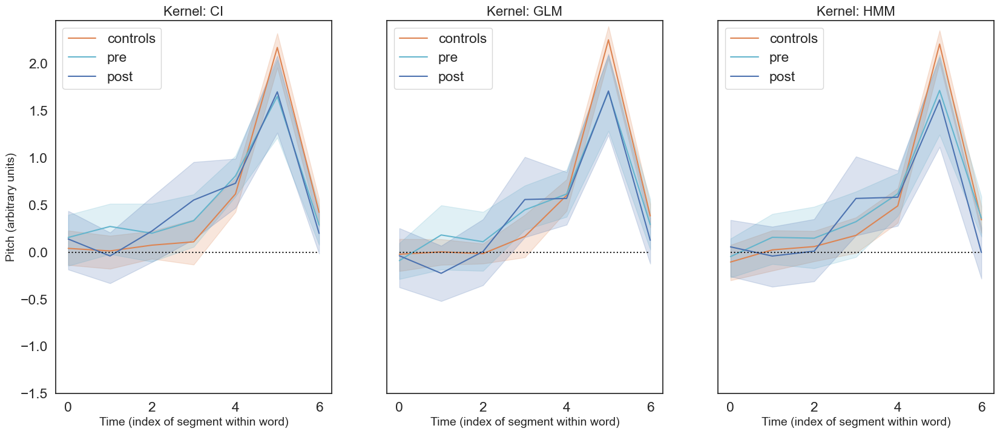

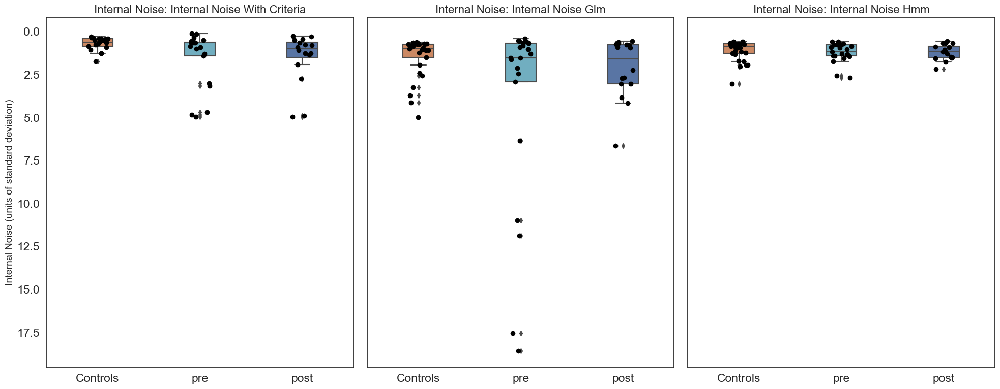

In [287]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set font scale and style
sns.set(font_scale=1.5)
my_palette = {
    "controls": sns.color_palette()[1],
    "pre": sns.color_palette()[9],
    "post": sns.color_palette()[0],
}
sns.set_style("white")

# Define order for the plots
orders = ["controls", "pre", "post"]
custom_labels = ["Controls", "pre", "post"]

# Create figure for kernels
fig, axes = plt.subplots(1, 3, figsize=(20, 8), sharey=True)
kernel_methods = ['ci', 'glm', 'hmm']

for i, kernel_method in enumerate(kernel_methods):
    sns.lineplot(
        x="feature",
        y="kernel_value",
        hue="type",
        data=kernels_gli[kernels_gli.kernel == kernel_method],
        ci=95,
        hue_order=orders,
        ax=axes[i],
        palette=my_palette
    )
    axes[i].set_title(f"Kernel: {kernel_method.upper()}", fontsize=16)
    axes[i].set_xlabel("Time (index of segment within word)", fontsize=14)
    axes[i].plot([0, 6], [0, 0], color="k", linestyle=":")
    axes[i].set_ylim(-1.5, None)
    if i == 0:
        axes[i].set_ylabel("Pitch (arbitrary units)", fontsize=14)
    else:
        axes[i].set_ylabel(None)
    axes[i].legend(title=None)

# Create figure for internal noise
fig, axes = plt.subplots(1, 3, figsize=(20, 8), sharey=True)
internal_noise_metrics = ['internal_noise_with_criteria', 'internal_noise_glm', 'internal_noise_hmm']

for i, noise_metric in enumerate(internal_noise_metrics):
    sns.boxplot(
        data=new_revcor_measures_gli.dropna(subset=["type"]),
        x="type",
        y=noise_metric,
        ax=axes[i],
        palette=my_palette,
        order=orders,
        width=0.3,
        whis=1,
    )
    sns.stripplot(
        data=new_revcor_measures_gli.dropna(subset=["type"]),
        x="type",
        y=noise_metric,
        dodge=True,
        alpha=1,
        zorder=20,
        size=7,
        jitter=True,
        color="black",
        ax=axes[i],
        order=orders,
    )
    axes[i].set_title(f"Internal Noise: {noise_metric.replace('_', ' ').title()}", fontsize=16)
    axes[i].set_xlabel(None)
    axes[i].set_xticklabels(custom_labels)  # Update x-axis labels

    if i == 0:
        axes[i].set_ylabel("Internal Noise (units of standard deviation)", fontsize=14)
    else:
        axes[i].set_ylabel(None)
    #axes[i].set_ylim(-0.5, 5.5)
    axes[i].invert_yaxis()

fig.tight_layout()
plt.show()


In [288]:
df = new_revcor_measures_gli

# Define the metrics
metrics = ['kernel_ci', 'kernel_glm', 'kernel_hmm', 'internal_noise_with_criteria',
           'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm', 
           'transition_per', 'transition_unper']

# Calculate both mean and median for each metric grouped by 'new_type'
summary_df = df.groupby('type')[metrics].agg(['median']).reset_index()

# Flatten multi-level columns for better readability
summary_df.columns = ['_'.join(col).strip('_') if isinstance(col, tuple) else col for col in summary_df.columns]
print(summary_df)

       type  kernel_ci_median  kernel_glm_median  kernel_hmm_median  \
0  controls          0.952876           0.972993           0.961201   
1      post          0.882705           0.868090           0.875873   
2       pre          0.907002           0.888578           0.905191   

   internal_noise_with_criteria_median  internal_noise_dp_median  \
0                                 0.60                       0.7   
1                                 1.00                       1.6   
2                                 0.65                       1.2   

   internal_noise_glm_median  internal_noise_hmm_median  \
0                   0.956784                   0.845566   
1                   1.594322                   1.156480   
2                   1.520361                   1.173808   

   transition_per_median  transition_unper_median  
0               0.168260                 0.597664  
1               0.211665                 0.439283  
2               0.182836                 0.530562

In [787]:
def classify_localization(localization):
    if pd.isna(localization):
        return 'controls'
    elif isinstance(localization, str):
        if localization.startswith('Front'):
            return 'Frontal'
        elif localization.startswith('Tempo'):
            return 'Temporal'
    return localization

revcor_clinical_gli['lateralization'] = revcor_clinical_gli['localization'].apply(classify_localization)
revcor_clinical_gli

,type,subject,session,kernel_ci,kernel_glm,kernel_hmm,internal_noise_dp,internal_noise_glm,internal_noise_hmm,transition_per,...,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain,ProEmo,ProEmo2,ProLing,ProLing2,Pseudo,lateralization
0,controls,0.0,1.0,0.954856,0.963095,0.952268,1.0,0.736079,0.670589,0.180938,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,controls
1,controls,1.0,1.0,0.923006,0.898811,0.903877,0.6,3.241213,1.224530,0.234245,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,controls
2,controls,2.0,1.0,0.929407,0.955148,0.940498,3.0,3.707792,0.908048,0.464074,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,controls
3,controls,3.0,1.0,0.771559,0.826267,0.828246,3.8,2.406972,1.133683,0.419527,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,controls
4,controls,4.0,1.0,0.975488,0.972993,0.963030,1.2,0.694366,0.748448,0.073520,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,controls
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,pre,17.0,1.0,0.707767,0.586958,0.700619,3.0,10.977980,1.417315,0.625885,...,3.0,32.0,12.0,0.0,12.0,0.0,12.0,0.0,15.0,Temporal
62,pre,18.0,1.0,0.976219,0.973209,0.966675,1.2,0.533689,0.576015,0.130836,...,2.0,NaN,12.0,0.0,12.0,0.0,12.0,0.0,16.0,Frontal
63,pre,19.0,1.0,0.755915,0.856111,0.730920,4.0,11.881278,1.568816,0.267809,...,3,47.0,9.0,1.0,12.0,0.0,9.0,1.0,13.0,Temporal
64,pre,20.0,1.0,0.572965,0.505808,0.382433,2.5,2.926102,1.333441,0.380230,...,2,NaN,11.0,1.0,12.0,0.0,9.0,1.0,12.0,Frontal


In [182]:
print(revcor_clinical_gli.columns)


Index(['type', 'subject', 'session', 'kernel_ci', 'kernel_glm', 'kernel_hmm',
       'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm',
       'transition_per', 'transition_unper', 'internal_noise_with_criteria',
       'hemisphere', 'localization', 'Grade', 'Délai-postop',
       'Résultats-bruts-i-MEL ', 'Patho-sain', 'ProEmo', 'ProEmo2', 'ProLing',
       'ProLing2', 'Pseudo', 'lateralization'],
      dtype='object')


In [290]:
from scipy.stats import kruskal, mannwhitneyu
import statsmodels.stats.multicomp as mc

metrics = ['kernel_ci', 'kernel_glm', 'kernel_hmm','internal_noise_with_criteria', 
           'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm', 
           'transition_per', 'transition_unper']
groups = revcor_clinical_gli['type'].unique()

results = []

# Loop through each metric and group combinations
for metric in metrics:
    for i in range(len(groups)):
        for j in range(i + 1, len(groups)):
            # Extract data for the two groups
            group1_data = df[df['type'] == groups[i]][metric].dropna().values
            group2_data = df[df['type'] == groups[j]][metric].dropna().values
            
            # Check if both groups have non-zero size
            if len(group1_data) == 0 or len(group2_data) == 0:
                continue  # Skip this pair if either group has no data
            
            # Perform Mann-Whitney U test
            stat, pvalue = mannwhitneyu(group1_data, group2_data)
            
            # Append results
            results.append({
                'Metric': metric,
                'Group1': groups[i],
                'Group2': groups[j],
                'U-statistic': stat,
                'P-value': pvalue
            })

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
results_df['Significant'] = results_df['P-value'].apply(lambda p: '*' if p < 0.05 else '')

# Display results
results_df

# # Check for any significant results
# if not results_df.empty and results_df['P-value'].min() < 0.05:
#     print("Found significant differences between some pairs. Consider post-hoc analysis.")
# else:
#     print("No significant differences found between any pairs.")

,Metric,Group1,Group2,U-statistic,P-value,Significant
0,kernel_ci,controls,post,356.0,0.003408,*
1,kernel_ci,controls,pre,409.0,0.040931,*
2,kernel_ci,post,pre,150.0,0.591615,
3,kernel_glm,controls,post,376.0,0.000668,*
4,kernel_glm,controls,pre,461.0,0.002167,*
5,kernel_glm,post,pre,154.0,0.678970,
6,kernel_hmm,controls,post,377.0,0.000612,*
7,kernel_hmm,controls,pre,440.0,0.007965,*
8,kernel_hmm,post,pre,145.0,0.490331,
9,internal_noise_with_criteria,controls,post,102.5,0.045971,*


In [150]:
kernels_gli['hue_combined'].unique()

array(['pre_ci', 'post_ci', 'pre_glm', 'post_glm', 'pre_hmm', 'post_hmm',
       'controls_ci', 'controls_glm', 'controls_hmm'], dtype=object)

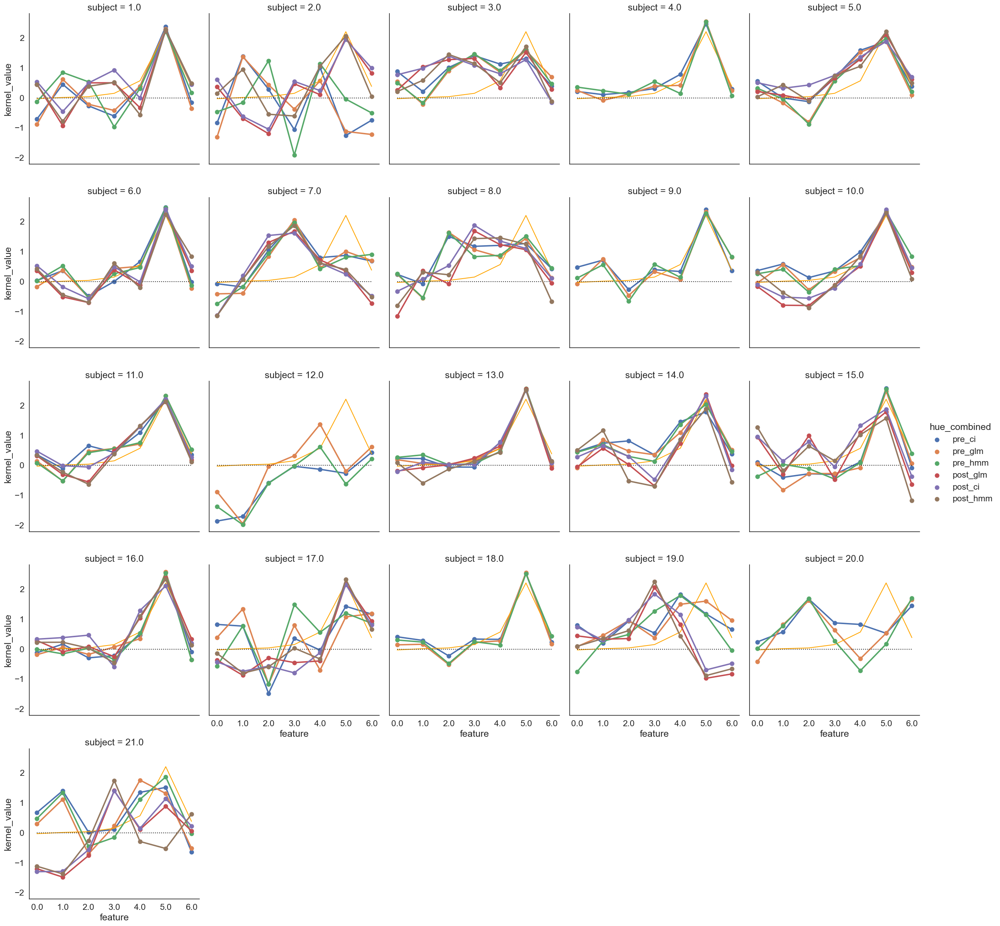

In [291]:
kernels_gli['hue_combined'] = kernels_gli['type'] + "_" + kernels_gli['kernel']
hue_order = [
    'pre_ci', 'pre_glm', 'pre_hmm',
    'post_glm', 'post_ci', 'post_hmm'
]
g = sns.catplot(x="feature", 
                y="kernel_value",
                col = "subject",
                hue='hue_combined',
                hue_order=hue_order,
                col_wrap=5,
                data=kernels_gli[(kernels_gli.type!='controls')], 
                kind='point')

control_kernels_gli = kernels_gli[kernels_gli.type=='controls'].groupby('feature')['kernel_value'].mean().reset_index()
axes =  g.axes.flatten()
for axis in axes:
    axis.plot(control_kernels_gli['feature'], control_kernels_gli['kernel_value'], color='orange')
    axis.plot([0,6],[0,0],color='k',linestyle = ':')

In [173]:
columns_to_copy = [
    'hemisphere', 'localization', 'Grade', 'Délai-postop',
    'Résultats-bruts-i-MEL ', 'Patho-sain', 'ProEmo', 'ProEmo2', 'ProLing',
    'ProLing2', 'Pseudo'
]

for subject in revcor_clinical_gli['subject'].unique():
    pre_row = revcor_clinical_gli[(revcor_clinical_gli['type'] == 'pre') & (revcor_clinical_gli['subject'] == subject)]
    post_row = revcor_clinical_gli[(revcor_clinical_gli['type'] == 'post') & (revcor_clinical_gli['subject'] == subject)]
    if not pre_row.empty and not post_row.empty:
        revcor_clinical_gli.loc[
            (revcor_clinical_gli['type'] == 'post') & (revcor_clinical_gli['subject'] == subject),
            columns_to_copy
        ] = pre_row[columns_to_copy].values

revcor_clinical_gli

,type,subject,session,kernel_ci,kernel_glm,kernel_hmm,internal_noise_dp,internal_noise_glm,internal_noise_hmm,transition_per,transition_unper,internal_noise_with_criteria,hemisphere,localization,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain,ProEmo,ProEmo2,ProLing,ProLing2,Pseudo
0,controls,0.0,1.0,0.956888,0.964619,0.937594,1.3,0.736079,0.608937,0.160738,0.415711,0.85,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,controls,1.0,1.0,0.923320,0.899116,0.961186,1.0,3.241213,0.773682,0.009120,0.039851,0.55,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,controls,2.0,1.0,0.930222,0.955823,0.913819,2.5,3.707792,2.215195,0.378445,0.387757,1.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,controls,3.0,1.0,0.770570,0.825773,0.833391,2.9,2.406972,0.909850,0.473527,0.881194,1.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,controls,4.0,1.0,0.976669,0.974847,0.956883,0.6,0.694366,0.750562,0.048021,0.262702,0.45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,controls,5.0,1.0,0.952011,0.976573,0.964843,1.0,0.985447,1.762618,0.226864,0.364730,0.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,controls,6.0,1.0,0.841130,0.822503,0.824954,4.0,4.990350,1.890030,0.187622,0.438839,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,controls,7.0,1.0,0.984738,0.973413,0.949921,1.7,1.237289,0.637058,0.068766,0.102251,1.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,controls,8.0,1.0,0.907843,0.934509,0.926058,1.4,1.096867,1.659717,0.372556,0.792438,0.70,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,controls,9.0,1.0,0.961681,0.978271,0.933776,0.7,0.671348,0.661433,0.013465,0.083449,0.35,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [788]:
results_hemisphere=revcor_clinical_gli.groupby(['lateralization','type']).agg({'kernel_ci':['median'],'kernel_glm':['median'],'kernel_hmm':['median'],
'internal_noise_dp':['median'],'internal_noise_glm':['median'],'internal_noise_hmm':['median'], 'internal_noise_with_criteria':['median']})
results_hemisphere

kernel_ci kernel_glm kernel_hmm internal_noise_dp  \
                           median     median     median            median   
lateralization type                                                         
Frontal        pre       0.907002   0.935032   0.927575              0.70   
Insulaire      pre       0.911761   0.888578   0.875023              1.60   
Pariétal       pre       0.975740   0.978436   0.967450              0.85   
Temporal       pre       0.707767   0.655556   0.700619              3.00   
controls       controls  0.952876   0.972993   0.961201              0.70   
               post      0.882705   0.868090   0.875873              1.60   

                        internal_noise_glm internal_noise_hmm  \
                                    median             median   
lateralization type                                             
Frontal        pre                1.521025           0.941389   
Insulaire      pre                1.288201           1.030868   
Pariétal       pre                0.616079           0.763155   
Temporal       pre               10.977980           1.417315   
controls       controls           0.956784           0.845566   
               post               1.594322           1.156480   

                        internal_noise_with_criteria  
                                              median  
lateralization type                                   
Frontal        pre                              0.65  
Insulaire      pre                              1.40  
Pariétal       pre                              0.60  
Temporal       pre                              3.00  
controls       controls                         0.60  
               post                             1.00

In [789]:
metrics = ['kernel_ci', 'kernel_glm', 'kernel_hmm','internal_noise_with_criteria', 
           'internal_noise_dp', 'internal_noise_glm', 'internal_noise_hmm', 
           'transition_per', 'transition_unper']
groups = revcor_clinical_gli['lateralization'].unique()

results = []

# Loop through each metric and group combinations
for metric in metrics:
    for i in range(len(groups)):
        for j in range(i + 1, len(groups)):
            # Extract data for the two groups
            group1_data = df[df['lateralization'] == groups[i]][metric].dropna().values
            group2_data = df[df['lateralization'] == groups[j]][metric].dropna().values
            
            # Check if both groups have non-zero size
            if len(group1_data) == 0 or len(group2_data) == 0:
                continue  # Skip this pair if either group has no data
            
            # Perform Mann-Whitney U test
            stat, pvalue = mannwhitneyu(group1_data, group2_data)
            
            # Append results
            results.append({
                'Metric': metric,
                'Group1': groups[i],
                'Group2': groups[j],
                'U-statistic': stat,
                'P-value': pvalue
            })

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
results_df['Significant'] = results_df['P-value'].apply(lambda p: '*' if p < 0.05 else '')

# Display results
results_df

KeyError: 'lateralization'

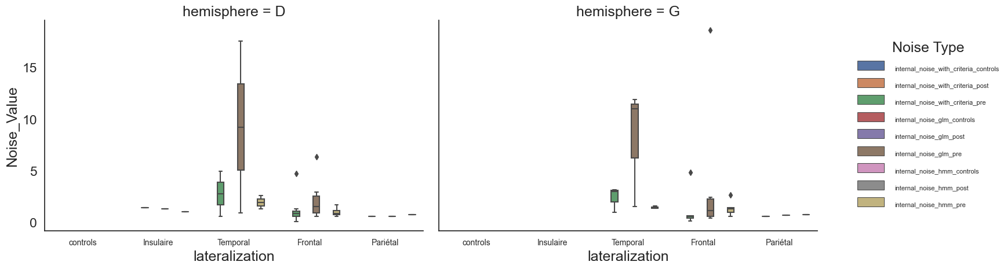

In [784]:
long_format_data = revcor_clinical_gli.melt(
    id_vars=['type','lateralization', 'hemisphere'], 
    value_vars=['internal_noise_with_criteria', 'internal_noise_glm', 'internal_noise_hmm'],
    var_name='Noise_Type', 
    value_name='Noise_Value'
)
long_format_data['Combined_Hue'] = long_format_data['Noise_Type'] + "_" + long_format_data['type']


# Create a box plot
g = sns.catplot(
    data=long_format_data, 
    x='lateralization', 
    y='Noise_Value',
    hue='Combined_Hue',
    col='hemisphere', 
    kind='box', 
    col_wrap=2
)

# Adjust legend size and position
g._legend.set_title("Noise Type")  # Set a title for the legend
for text in g._legend.get_texts():
    text.set_fontsize(8)  # Adjust legend font size
g._legend.set_bbox_to_anchor((1.2, 0.5))  # Move legend to the right of the plots
g._legend.set_frame_on(False)  # Optionally, remove legend border

# Adjust xtick labels for better visibility
g.set_xticklabels(fontsize=10)

# Ensure a tight layout to avoid overlaps
g.fig.tight_layout()

# Show the plot
plt.show()